# **GDSCA-2022** GD Survey Data Notebook

## Imports

In [1]:
import os
import sys
import math

import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plot_likert
import seaborn as sns
import PIL
from IPython.display import display, Markdown

%matplotlib inline

## Configuration

In [2]:
single_region = 'Global'  # name of a single region to run (e.g. 'Oceania'), or False to run all regions

my_dpi = 192
show_plots = True  #show plots inline in notebook, or just save them to disk
output_pngs = True
output_pdfs = True
output_svgs = True
separate_legends = False
matplotlib.rcParams['figure.dpi'] = my_dpi

all_region_list = [
    'Africa',
    'Asia',
    'Europe',
    'Oceania',
    'Americas',
    'Global',
    'Economies',
    'SIDS',
]

region_list = all_region_list
if single_region:
    region_list = [single_region]

constructed_regions = ['Americas', 'Global', 'Economies', 'SIDS']

orderR = {
    'Africa' : [
        'Northern Africa',
        'Western Africa',
        'Middle Africa',
        'Eastern Africa',
        'Southern Africa'
    ],
    'Asia' : [
        'Western Asia',
        'Southern Asia',
        'Eastern Asia',
        'Southeastern Asia'
    ],
    'Europe' : [
        'Northern Europe',
        'Western Europe',
        'Eastern Europe',
        'Southern Europe'
    ],
    'Oceania' : [
        'Micronesia',
        'Melanesia',
        'Polynesia',
        'Australia and New Zealand'
    ],
    'Americas' : [
        'Northern America',
        'Central America',
        'Caribbean',
        'South America'
    ],
    'Global' : [
        'Europe',
        'Asia',
        'Northern America',
        'Africa',
        'Oceania',
        'Latin America and the Caribbean'
    ],
    'Economies': [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified'
    ],
    'SIDS': [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified'
    ],
}

ignoreR = {
    'Asia' : ['Central Asia']
}

label_adjustments = {  # note: can use /n as a line break if using double quotes
    'Latin America and the Caribbean': 'L Amer & Carib',
    'Northern America': 'N America',
    'Australia and New Zealand': 'Aus & NZ',
    'Upper middle income': 'Upper middle',
    'Lower middle income': 'Lower middle',
}

# override some things if we are being run by the render_figures_and_notebooks.sh script
if 'GDSCA_SINGLE_REGION' in os.environ:
    single_region = os.getenv('GDSCA_SINGLE_REGION') or False
    if single_region:
        region_list = [single_region]
    else:
        region_list = all_region_list

    show_plots = True
    output_pngs = True
    output_pdfs = True
    output_svgs = True
    separate_legends = True

    if 'GDSCA_OUTPUT_IMAGES' in os.environ:
        if os.getenv('GDSCA_OUTPUT_IMAGES'):
            output_pngs = True
            output_pdfs = True
            output_svgs = True
        else:
            output_pngs = False
            output_pdfs = False
            output_svgs = True

    if 'GDSCA_SEPARATE_LEGENDS' in os.environ:
        if os.getenv('GDSCA_SEPARATE_LEGENDS'):
            separate_legends = True
        else:
            separate_legends = False

## Define color palettes

In [3]:
likert = ['white', '#368D95', '#95BABF', '#D4D4D4', '#B6C8AA', '#7EA56B']
cat_02 = ['#194958', '#C6744C', '#D4D4D4']
cat_03 = ['#194958', '#C6744C', '#DBC064', '#D4D4D4']
cat_04 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#D4D4D4']
cat_05 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78', '#D4D4D4']
cat_06 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#D4D4D4']
cat_07 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#D4D4D4']
cat_08 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#8A2630', '#D4D4D4']
cat_10 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#8A2630', '#0963A2', '#E09AA7', '#D4D4D4']
val_04 = ['#000D22', '#1F5664', '#3D9FA5', '#CAF1EE']
val_04_rev = ['#CAF1EE', '#3D9FA5', '#1F5664', '#000D22']

val_05 = ['#000d22', '#194958', '#368d95', '#71bdc0', '#caf1ee', '#a2a6a9']
val_05_rev = ['#caf1ee', '#71bdc0', '#368d95', '#194958', '#000d22', '#a2a6a9']
val_06 = ['#000d22', '#143d4d', '#1f5664', '#368d95', '#57afb3', '#caf1ee', '#a2a6a9']
val_06_rev = ['#caf1ee', '#57afb3', '#368d95', '#1f5664', '#143d4d', '#000d22', '#a2a6a9']

sub_americas = ['#08517A', '#759A64', '#08453D', '#2A7976']
sub_europe = ['#4C3375', '#948ED8', '#494C8F', '#302A5A']
sub_africa = ['#FBC762', '#BC8C28', '#FCE393', '#C3A93A', '#927227']
sub_oceania = ['#EC6665', '#B5002B', '#FA9E8E', '#6D0110']
sub_asia = ['#FEB267', '#B05633', '#E68F48', '#873D20']  #, '#FCB8EF'] <- central asia
global_regions = ['#3B3C78', '#C6744C', '#0963A2', '#DBC064', '#8A2630', '#194958']
global_econ_wb = ['#000D22', '#194958', '#368D95', '#8CCDCE', '#A2A6A9']

cat_d23e123_by_region = {
    'Africa': sub_africa,
    'Asia': sub_asia,
    'Europe': sub_europe,
    'Oceania': sub_oceania,
    'Americas': sub_americas,
    'Global': global_regions,
    'Economies': global_econ_wb,
    'SIDS': global_econ_wb
}

## Load data tables

In [4]:
# survey data
data = pd.read_csv('gdsca-2022-data/survey_data.csv', keep_default_na=False)
display(Markdown('**Survey Data**'))
display(data.head())
print(data.shape)

# question table
questions = pd.read_csv('gdsca-2022-data/question_table.csv')
display(Markdown('**Questions**'))
display(questions.head())
print(questions.shape)

# research data
research = pd.read_csv('gdsca-2022-data/research_data.csv')
display(Markdown('**Research Data**'))
display(research.head())
print(research.shape)

# country table
country_table = pd.read_csv('gdsca-2022-data/country_table.csv')
display(Markdown('**Country Data**'))
display(country_table.head())
print(country_table.shape)

**Survey Data**

,language,respondent_id,col_name,selection,selection_survey_clean,question,question_type,selection_other,age,country,...,degree,degree_other,sector,sector_other,region,subregion,geoarea,sids,economy_sids,income_group_wb
0,EN,12906633394,Q1,Albania,,Q1,choose-1,Albania,,Albania,...,,,,,Europe,Southern Europe,Albania,,Developed,Upper middle income
1,FR,12850123626,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
2,FR,13204231228,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
3,FR,13204803692,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
4,FR,13212618824,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income


(64080, 24)


**Questions**

,col_name,question,question_type,text
0,Q1,Q1,choose-1,Which country would you like to represent for ...
1,Q1_other,Q1,choose-1,Which country would you like to represent for ...
2,Q2,Q2,choose-1,The country/nation identified in the previous ...
3,Q2_other,Q2,choose-1,The country/nation identified in the previous ...
4,Q3_basic_science,Q3,choose-3,What are the 3 most important deep sea issues ...


(178, 4)


**Research Data**

,geoarea,researcher,col_name,question,selection,region,subregion,sids,economy_sids,income_group_wb,...,[FR],[AR],[SP],[PT],[BD],research_tech,research_tech_clean,research_CID,research_org,research_org_clean
0,Albania,Baldwin,notes,notes,Plan to boost blue ecoNomy 2018 https://www.a...,Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
1,Albania,Baldwin,Q10_comments,Q10,10b Albania have joined the moratorium on deep...,Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
2,Albania,Baldwin,Q10_mining,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
3,Albania,Baldwin,Q10_renewable_energy,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
4,Albania,Baldwin,Q10_research,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN


(10415, 33)


**Country Data**

,geoarea,status,region,subregion,geoarea_esri,iso-alpha3,economy,sids,economy_sids,un_region_code,...,dsc-ai-vessel,dsc-ai-dsv,dsc-ai-sensor,dsc-ai-data,dsc-si-all,dsc-si-vessel,dsc-si-dsv,dsc-si-sensor,dsc-si-data,dsc-index-group
0,Bassas da India,Territory,Africa,Eastern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Crozet,Territory,Africa,Southern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Europa Island,Territory,Africa,Eastern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Glorieuse Islands,Territory,Africa,Eastern Africa,Glorioso Islands,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Juan de Nova Island,Territory,Africa,Eastern Africa,Juan De Nova Island,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(259, 83)


## Subset data into regions

In [5]:
# read R as "by region"
dataR           = {}
researchR       = {}
country_tableR  = {}

for region in all_region_list:
    if region in constructed_regions:
        continue  # these are specially constructed below
    dataR[region]          = data[data['region'] == region].copy()
    researchR[region]      = research[research['region'] == region].copy()
    country_tableR[region] = country_table[country_table['region'] == region].copy()
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']

if 'Americas' in all_region_list:
    region = 'Americas'
    dataR[region]          = data[data['subregion'].isin(orderR[region])]
    researchR[region]      = research[research['subregion'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['subregion'].isin(orderR[region])].copy()
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']

if 'Global' in all_region_list:
    region = 'Global'
    dataR[region]          = data[data['region'].isin(orderR[region])]
    researchR[region]      = research[research['region'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['region'].isin(orderR[region])]
    dataR[region]['subregion']          = dataR[region]['region']
    researchR[region]['subregion']      = researchR[region]['region']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']
    country_tableR[region]['subregion'] = country_tableR[region]['region']

if 'Economies' in all_region_list:
    region = 'Economies'
    dataR[region]          = data[data['income_group_wb'].isin(orderR[region])]
    researchR[region]      = research[research['income_group_wb'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['income_group_wb'].isin(orderR[region])]
    dataR[region]['subregion']          = dataR[region]['income_group_wb']
    researchR[region]['subregion']      = researchR[region]['income_group_wb']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']
    country_tableR[region]['subregion'] = country_tableR[region]['income_group_wb']

if 'SIDS' in all_region_list:
    region = 'SIDS'
    dataR[region]          = data[data['income_group_wb'].isin(orderR[region])].copy()
    dataR[region]          = dataR[region][dataR[region]['economy_sids'] == 'SIDS']
    researchR[region]      = research[research['income_group_wb'].isin(orderR[region]) & (research['economy_sids'] == 'SIDS')].copy()
    country_tableR[region] = country_table[country_table['income_group_wb'].isin(orderR[region]) & (country_table['economy_sids'] == 'SIDS')].copy()
    dataR[region]['subregion']          = dataR[region]['income_group_wb']
    researchR[region]['subregion']      = researchR[region]['income_group_wb']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion'].copy()
    country_tableR[region]['subregion'] = country_tableR[region]['income_group_wb']

# some required country cleanup
for region in all_region_list:
    ## change np.nan in economy column to 'NA'
    country_tableR[region].loc[country_tableR[region]['subregion'].isna() == True, 'subregion'] = 'NA'

    ## create ocean column
    country_tableR[region]['ocean'] = 'No Ocean'
    country_tableR[region].loc[(country_tableR[region]['total_eez_area'].isna() == False) &
                     (country_tableR[region]['total_eez_area'] > 0), 'ocean'] = 'EEZ with no Deep Ocean'
    country_tableR[region].loc[(country_tableR[region]['eez_deeper_than_200'].isna() == False) &
                     (country_tableR[region]['eez_deeper_than_200'] > 0), 'ocean'] = 'EEZ with Deep Ocean'

## Helper functions

In [6]:
def prep_fig_data_for_plotting(fig_data, region, axis='index', barh=False, order=False):
    if not order:
        order = orderR[region]
    if barh:
        order = list(reversed(order))

    if axis in [0, 'index']:
        fig_data = reorder_rows_and_rename(fig_data, order, createmissingrows=True)
    elif axis in [1, 'columns']:
        fig_data = reorder_columns(fig_data, order, createmissingcolumns=True)
    else:
        raise ValueError('unknown axis argument:', axis)
    fig_data = adjust_labels_to_fit(fig_data, axis=axis)
        
    return fig_data

def adjust_labels_to_fit(fig_data, axis='index'):
    fig_data.rename(label_adjustments, axis=axis, inplace=True)
    return fig_data

def undo_label_adjustment(label):
    if label in label_adjustments.values():
        reverse_label_adjustments = dict(zip(label_adjustments.values(), label_adjustments.keys()))
        orig_label = reverse_label_adjustments[label]
    else:
        orig_label = label
    return orig_label

def reorder_rows_and_rename(df, order_and_names, warnonly=False, createmissingrows=False, ignorerows=None):
    newdf = df.copy()
    order = []

    for index in df.index:
        found = False
        for name in order_and_names:
            if not isinstance(name, list):
                name = [name]
            if index == name[0]:
                found = True
                break
        if not found:
            if ignorerows and name not in ignorerows:
                errmsg = 'row found with index "'+index+'" that is not in order list'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)

    for name in order_and_names:
        if not isinstance(name, list):
            name = [name]
        if (not name[0] in newdf.index):
            if createmissingrows:
                print('Adding missing row '+name[0])
                newvalues = pd.Series([]*(newdf.shape[1]-1), name=name[0], dtype='float64')
                newrow = pd.DataFrame([newvalues], columns=df.columns)
                newdf = pd.concat([newdf, newrow])
            else:
                errmsg = 'row index name "' + name[0] +'" not found'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)
        if len(name) == 2:
            newdf.rename(index={name[0]: name[1]}, inplace=True)
            order.append(name[1])
        else:
            order.append(name[0])
    return newdf.reindex(order)

def reorder_columns(df, columnorder, createmissingcolumns=False, warnonly=False):
    newdf = df.copy()
    for column in newdf.columns:
        if column not in columnorder:
            errmsg = 'found column with name "'+column+'" that is not in order list'
            if not warnonly:
                raise ValueError(errmsg)
            else:
                print('warning: '+errmsg, file=sys.stderr)
            
    for column in columnorder:
        if not column in newdf.columns:
            if createmissingcolumns:
                print('Adding missing column '+column)
                newdf[column] = np.nan
            else:
                errmsg = 'column "'+column+'" not found'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)
    newdf = newdf[columnorder]
    return newdf        

def barh_pixel_fix(ax):
    # bump all the bars in a barh graph over one pixel to the left
    # to close a slight gap between the base of the bar and the
    # y-axis that appears when you use edgecolor='white'
    for container in ax.containers:
        for rectangle in container:
            rectangle.set_x(rectangle.get_x()-0.05)

def loc_tweaker(region, loc_tweaks, letter=False):
    for key in loc_tweaks.keys():
        if not key in all_region_list:
            raise ValueError('unknown region '+key)
    loc = 'best'
    if 'default' in loc_tweaks:
        loc = loc_tweaks['default']
    if region in loc_tweaks:
        loc = loc_tweaks[region]
    return loc

def notTotalRow(df):
    not_total = []
    for rowname in df.index.values.tolist():
        not_total.append(rowname != 'Total')
    return not_total

def compute_totals_table(fig_data):
    totals_table = fig_data.copy()
    totals_table.loc['Total'] = totals_table.sum()
    total = totals_table.loc['Total'].sum()
    totals_table['Total'] = totals_table.loc[:,:].sum(axis=1)
    totals_table = totals_table.fillna(0)
    return totals_table, total

def compute_percents_table(fig_data, total):
    copy_data = fig_data.copy()
    copy_data['Total'] = copy_data.loc[:, :].sum(axis=1)
    percents_table = pd.concat([round((copy_data/copy_data.sum())*100, 1)])
    new_column_names = []
    for column in percents_table.columns:
        new_column_names.append('% '+column)
    percents_table.columns = new_column_names
    
    percents_table['% Total'] = round((copy_data['Total']/total)*100, 1)
    percents_table.loc['% Total'] = percents_table.sum().round()

    percents_table = percents_table.fillna(0)
    return percents_table

def show_totals(fig_data, total=None):
    totals_table, tt_total = compute_totals_table(fig_data)
    display(totals_table)

def my_plot_likert(fig_data, my_scale, figsize):
    # do some crude auto scaling of the xticks
    xtick_interval=1
    ax = plot_likert.plot_likert(fig_data, 
                                 my_scale,
                                 figsize=figsize,
                                 colors=likert,
                                 xtick_interval=xtick_interval)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count > 10:
        xtick_interval = 2
    if xtick_count > 20:
        xtick_interval = 5
    if xtick_count > 40:
        xtick_interval = 10
    if xtick_count > 100:
        xtick_interval = 20
    if xtick_count > 200:
        xtick_interval = 40
    if xtick_count > 500:
        xtick_interval = 50
    plt.close()
    
    # start again with new interval
    ax = plot_likert.plot_likert(fig_data, 
                                 my_scale,
                                 figsize=figsize,
                                 colors=likert,
                                 xtick_interval=xtick_interval)
    return ax    

def assemble_filename_and_mkdir(region, format, letter, modifier=False, cropped=False):
    save_path = os.path.join('figures', region, format)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    filename = os.path.join(save_path, region+'_'+letter)
    if modifier:
        filename += modifier
    if cropped:
        filename += '_cropped'
    filename += '.'+format
    return filename

def savefigs(plt, region, letter, modifier=False, alsocropped=False):
    if not output_pngs and not output_pdfs and not output_svgs:
        return
    if output_pngs:
        filename = assemble_filename_and_mkdir(region, 'png', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')

        if alsocropped:
            image = PIL.Image.open(filename)
            imageBox = image.getbbox()
            cropped = image.crop(imageBox)
            filename = assemble_filename_and_mkdir(region, 'png', letter, modifier, cropped=True)
            cropped.save(filename)

    if output_pdfs:
        filename = assemble_filename_and_mkdir(region, 'pdf', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')
    
    if output_svgs:
        filename = assemble_filename_and_mkdir(region, 'svg', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')

def outputfigs(plt, fig, ax, region, section, letter):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if not fig:
        ax.spines['left'].set_visible(False)
        ax.tick_params(axis="y", left=False)
    for child in ax.get_children():
        if isinstance(child, matplotlib.legend.Legend):
            child.get_frame().set_linewidth(0.0)
            #child.get_frame().set_edgecolor('white')

    savefigs(plt, region, letter)
    
    if separate_legends:
        for child in ax.get_children():
            if not child.get_visible:
                print('warning: figure had non-visible artists and will probably not render correctly in the notebook', file=sys.stderr)
            if isinstance(child, matplotlib.legend.Legend):
                child.set_visible(False)

        savefigs(plt, region, letter, '_plain')

        for child in ax.get_children():
            if isinstance(child, matplotlib.legend.Legend):
                child.set_visible(True)
            else:
                child.set_visible(False)

        savefigs(plt, region, letter, '_legend', alsocropped=True)
        
        for child in ax.get_children():
            child.set_visible(True)
        # it seems we need to do this again here??
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        if not fig:
            ax.spines['left'].set_visible(False)
            ax.tick_params(axis="y", left=False)

    if show_plots: plt.show()
    #if show_plots: display(fig)
    plt.close()

---
# **Section 1** Country Ref

## **Fig B1** Country Ref: status

In [7]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'status']].groupby(['subregion', 'status'])
                                                  .count()
                                                  .rename(columns={'geoarea': 'count'})
                                                  .reset_index()
                                                  .pivot(columns='status',
                                                         index='subregion',
                                                         values='count'))


    fig_data[region].rename({
        'Sovereign': 'Sovereign Country',
        'Territory': 'Dependent Territory'},
        axis=1,
        inplace=True)
    columnorder = [
        'Sovereign Country',
        'Dependent Territory'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)

    # Add total
    fig_debug = fig_data[region].copy()
    fig_debug.loc['Total'] = fig_debug.sum()

    display(fig_debug)

status,Sovereign Country,Dependent Territory
subregion,,
L Amer & Carib,33.0,23.0
Oceania,16.0,17.0
Africa,54.0,14.0
N America,3.0,2.0
Asia,48.0,NaN
Europe,43.0,6.0
Total,197.0,62.0


In [8]:
## Print additional statistics

for region in region_list:
    print()
    display(Markdown('**'+region+'**'))
    print('Number of subregions: {}'.format(country_tableR[region]['subregion'].nunique()))
    print('Number of GeoAreas: {}'.format(country_tableR[region].shape[0]))
    print('Number of countries in region: {}'.format(fig_data[region].loc[:,
                                                          'Sovereign Country'].sum()))
    print('Number of territories in region: {}'.format(fig_data[region].loc[:,
                                                            'Dependent Territory'].sum()))
    print('GeoAreas that are countries: {:.1%}'.format(
        round((fig_data[region].loc[:,
                    'Sovereign Country'].sum()/country_tableR[region].shape[0]), 2)))
    print('GeoAreas that are territories: {:.1%}'.format(
        round((fig_data[region].loc[:,
                    'Dependent Territory'].sum()/country_tableR[region].shape[0]), 2)))

**Global**

Number of subregions: 6
Number of GeoAreas: 259
Number of countries in region: 197.0
Number of territories in region: 62.0
GeoAreas that are countries: 76.0%
GeoAreas that are territories: 24.0%


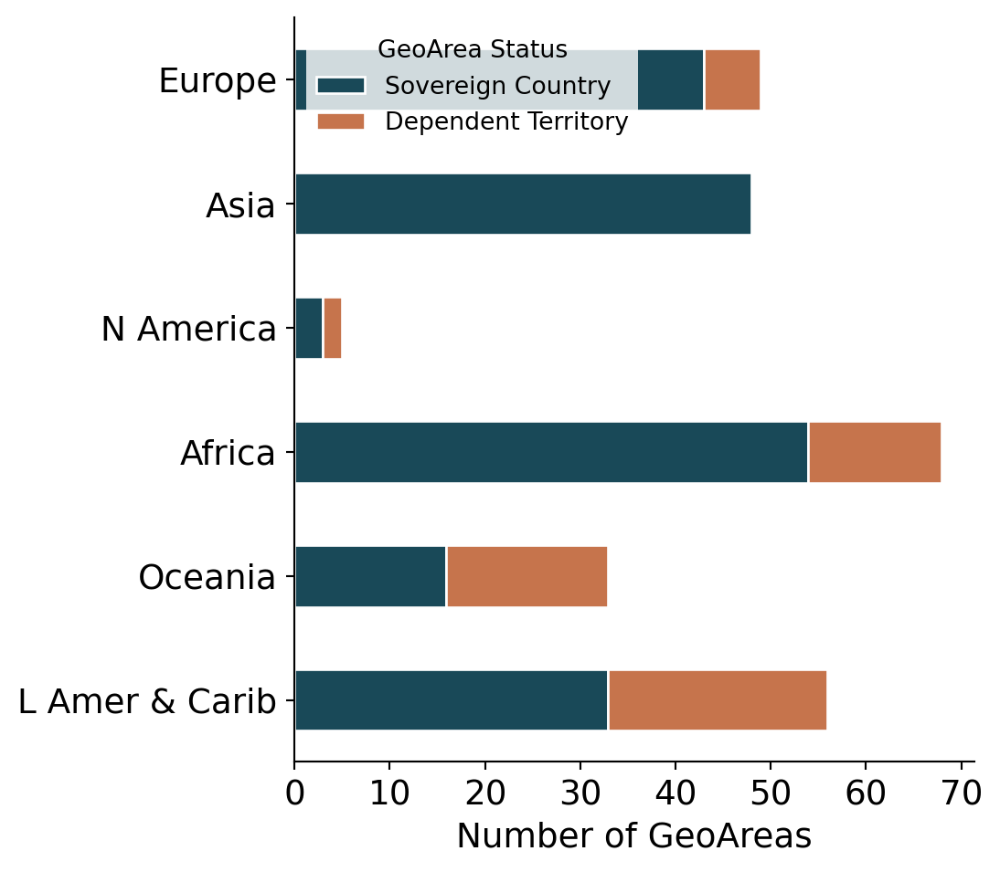

In [9]:
## Create horizontal bar plot

w = 960
h = 1080

figs = []
outs = []
for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='GeoArea Status',
              fontsize=10,
              title_fontsize=10)
    
    outputfigs(plt, fig, ax, region, section='1', letter='B1')

## **Fig B3** Country Ref: economies

In [10]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'income_group_wb']].groupby(['subregion', 'income_group_wb'])
                                                                   .count()
                                                                   .rename(columns={'geoarea': 'count'})
                                                                   .reset_index()
                                                                   .pivot(columns='income_group_wb',
                                                                          index='subregion',
                                                                          values='count'))

    column_order = [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified',
    ]
    fig_data[region] = reorder_columns(fig_data[region], column_order, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)

    show_totals(fig_data[region])

income_group_wb,High income,Upper middle income,Lower middle income,Low income,Not classified,Total
subregion,,,,,,
L Amer & Carib,16.0,19.0,6.0,0.0,15.0,56.0
Oceania,8.0,5.0,6.0,0.0,14.0,33.0
Africa,1.0,7.0,23.0,23.0,14.0,68.0
N America,4.0,0.0,0.0,0.0,1.0,5.0
Asia,12.0,13.0,18.0,4.0,1.0,48.0
Europe,36.0,10.0,1.0,0.0,2.0,49.0
Total,77.0,54.0,54.0,27.0,47.0,259.0


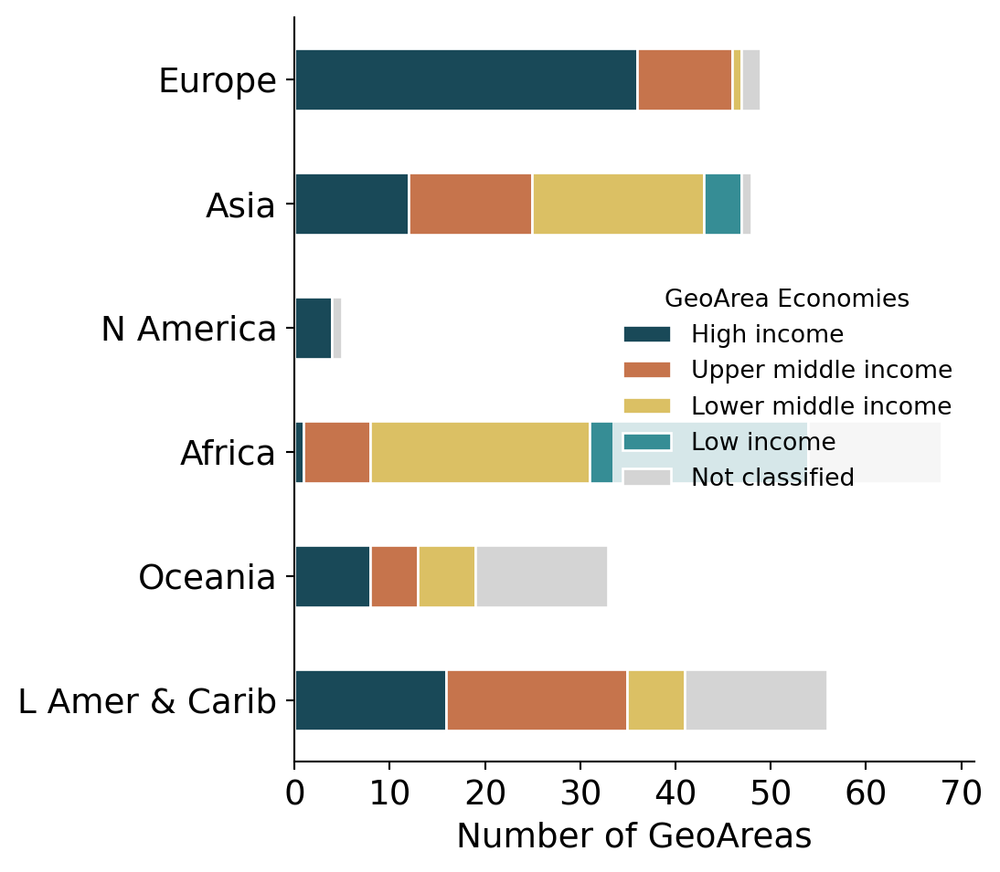

In [11]:
## Create horizontal bar plot 

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_04,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks), 
          title='GeoArea Economies', 
          fontsize=10, 
          title_fontsize=10)
    
    outputfigs(plt, fig, ax, region, section='1', letter='B2')

In [12]:
## Calculate fig data

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region]
                .groupby('subregion')[['survey_research','survey_alone','research_alone','no_data']]
                .sum()
                .reset_index())

    # Change subregion to index
    fig_data[region].set_index('subregion', inplace=True)

    fig_data[region].rename(
        {'survey_research': 'Survey & Research',
         'survey_alone':    'Survey Only',
         'research_alone':  'Research Only',
         'no_data':         'No Data'
        },
        axis=1,
        inplace=True
    )
    columnorder = [
        'Survey & Research',
        'Survey Only',
        'Research Only',
        'No Data'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    show_totals(fig_data[region])

,Survey & Research,Survey Only,Research Only,No Data,Total
subregion,,,,,
Europe,15,3,8,23,49
Asia,24,3,6,15,48
N America,3,0,2,0,5
Africa,33,0,11,24,68
Oceania,10,0,18,5,33
L Amer & Carib,33,0,17,6,56
Total,118,6,62,73,259


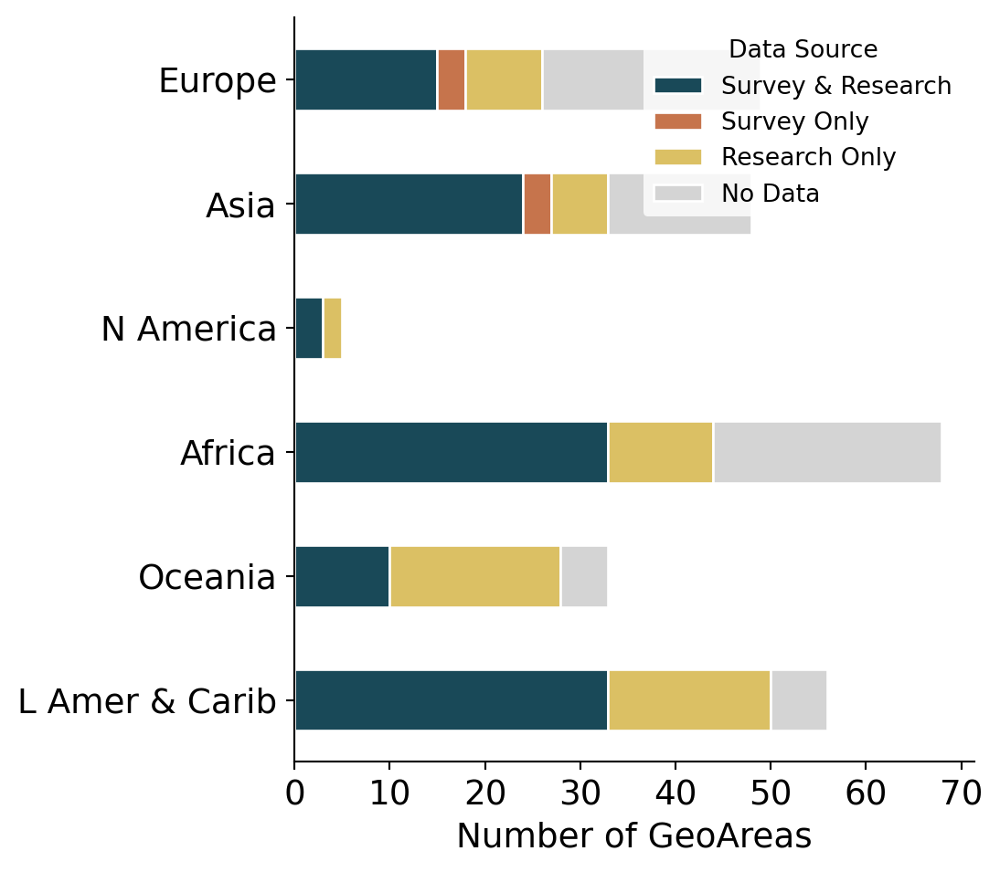

In [13]:
## Plot figure

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].loc[notTotalRow(fig_data[region]), :].iloc[::-1].plot(kind='barh', 
              stacked=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)

    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          title='Data Source', 
          fontsize=10, 
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='B3')

## **Fig C1** Q1 & Research: Country representation

In [14]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'ocean']].groupby(['subregion', 'ocean'])
                                                            .count()
                                                            .rename(columns={'geoarea': 'count'})
                                                            .reset_index()
                                                            .pivot(columns='ocean',
                                                                   index='subregion',
                                                                   values='count'))

    fig_data[region].rename({
        'EEZ with Deep Ocean': 'EEZ with >1% deep ocean',
        'EEZ with no Deep Ocean': 'EEZ with <1% deep ocean',
        'No Ocean': 'No marine EEZ'},
        axis=1,
        inplace=True)
    columnorder = [
        'EEZ with >1% deep ocean',
        'EEZ with <1% deep ocean',
        'No marine EEZ'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    display(fig_data[region])
    show_totals(fig_data[region])

ocean,EEZ with >1% deep ocean,EEZ with <1% deep ocean,No marine EEZ
subregion,,,
Europe,27.0,9.0,13.0
Asia,33.0,6.0,9.0
N America,5.0,NaN,NaN
Africa,52.0,NaN,16.0
Oceania,33.0,NaN,NaN
L Amer & Carib,53.0,NaN,3.0


ocean,EEZ with >1% deep ocean,EEZ with <1% deep ocean,No marine EEZ,Total
subregion,,,,
Europe,27.0,9.0,13.0,49.0
Asia,33.0,6.0,9.0,48.0
N America,5.0,0.0,0.0,5.0
Africa,52.0,0.0,16.0,68.0
Oceania,33.0,0.0,0.0,33.0
L Amer & Carib,53.0,0.0,3.0,56.0
Total,203.0,15.0,41.0,259.0


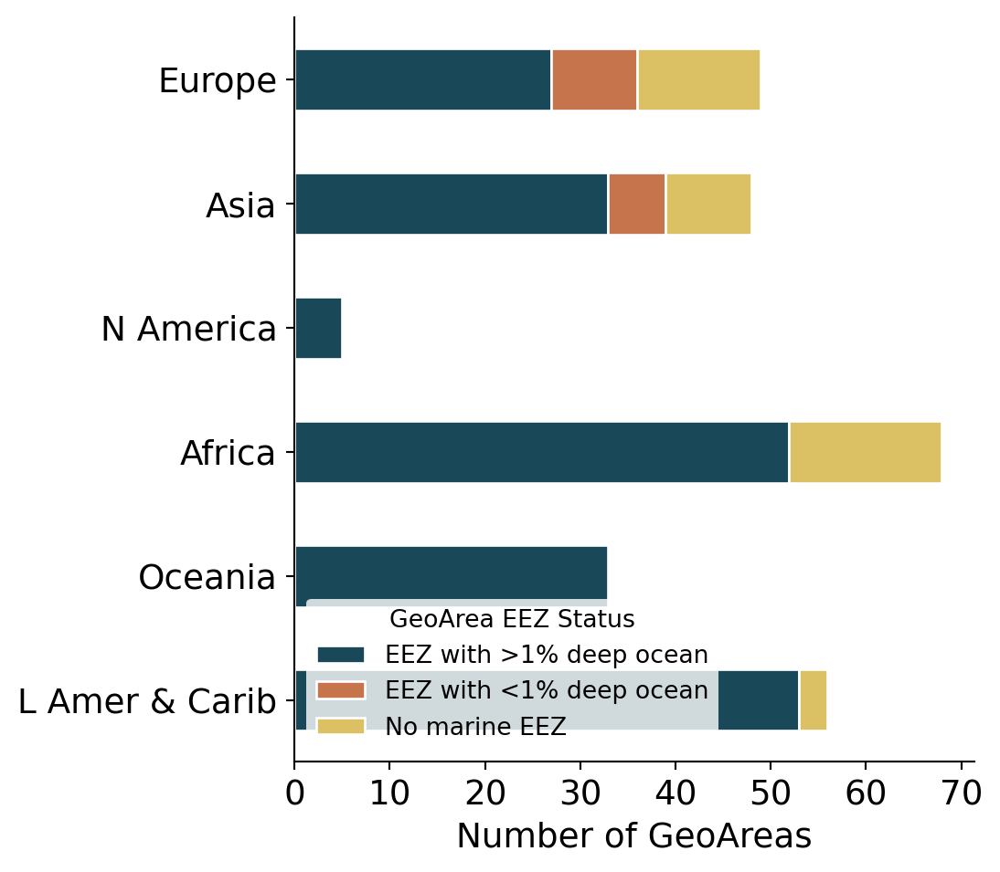

In [15]:
## Create horizontal bar plot 

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)

    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks), 
              title='GeoArea EEZ Status', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='C1')

## **Fig C2** Country Ref: EEZ depth zones

In [16]:
## Calculate values for plot

cols = ['geoarea', 
        'subregion', 
        'eez_area_0_to_200m', 
        'eez_area_200_to_1000m', 
        'eez_area_1000_to_2000m',
        'eez_area_2000_to_4000m', 
        'eez_area_4000_to_6000m', 
        'eez_area_deeper_than_6000m']

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][cols].groupby(['subregion'])
                                  .sum())

    # Rename columns
    fig_data[region].columns = ['200 m', '1000 m', '2000 m', '4000 m', '6000 m', '6000+ m']

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    # Sort depths as Katy specified
    sorted_cols = ['6000+ m', '6000 m', '4000 m', '2000 m', '1000 m', '200 m']
    fig_data[region] = fig_data[region][sorted_cols]

    # Add 200+
    fig_data[region]['200 m +'] = fig_data[region].loc[:, '6000+ m':'1000 m'].sum(axis=1)

    # Add total
    fig_data[region]['Total'] = (country_tableR[region][['geoarea', 'subregion', 'total_eez_area']]
                         .groupby('subregion')['total_eez_area']
                         .sum())
    fig_data[region].loc['Total'] = fig_data[region].sum()

    display(fig_data[region])

,6000+ m,6000 m,4000 m,2000 m,1000 m,200 m,200 m +,Total
subregion,,,,,,,,
Europe,1.079713e+05,1.505824e+06,3.876837e+06,1.825045e+06,2.938558e+06,6.503686e+06,1.025424e+07,1.675792e+07
Asia,4.268936e+05,5.021567e+06,6.146504e+06,2.611509e+06,2.064637e+06,6.082263e+06,1.627111e+07,2.235337e+07
N America,9.576399e+04,3.939601e+06,3.900350e+06,1.133467e+06,2.844179e+06,5.027187e+06,1.191336e+07,NaN
Africa,5.085556e+01,5.438632e+06,8.023754e+06,1.502709e+06,1.123899e+06,1.417822e+06,1.608904e+07,1.750687e+07
Oceania,5.113894e+05,2.122233e+07,1.271177e+07,3.744922e+06,1.939610e+06,2.730082e+06,4.013002e+07,4.286010e+07
L Amer & Carib,2.036537e+05,5.366606e+06,9.935305e+06,1.858684e+06,1.244148e+06,3.254615e+06,1.860840e+07,NaN
Total,1.345723e+06,4.249456e+07,4.459452e+07,1.267634e+07,1.215503e+07,2.501566e+07,1.132662e+08,9.947827e+07


In [17]:
## Calculate additional statistics

for region in region_list:
    print('')
    display(Markdown(region))
    print('Total area of EEZs in region (sq km): {}'.format(country_tableR[region]['total_eez_area'].sum().astype('int64')))
    print("Total Area of deep ocean within region's EEZs (sq km): {}".format(
        country_tableR[region]['eez_deeper_than_200'].sum().astype('int64')))
    print('Percent of deep ocean vs total EEZ area within region: {:2.2%}'.format(
        ((country_tableR[region]['eez_deeper_than_200'].sum()/country_tableR[region]['total_eez_area'].sum()))))

    names = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 0]
             .to_list())
    print('Names of GeoAreas with 5 biggest **deep** EEZs in region: ' + ', '.join(names))

    areas = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 1]
             .to_list())
    print('Area of each of 5 biggest **deep** EEZs in region (sq km): ' + ', '.join(list(map(lambda n: '{:.1f}'.format(n), areas))))

Global

Total area of EEZs in region (sq km): 138281827
Total Area of deep ocean within region's EEZs (sq km): 113266171
Percent of deep ocean vs total EEZ area within region: 81.91%
Names of GeoAreas with 5 biggest **deep** EEZs in region: United States of America, Australia, French Polynesia, Indonesia, New Zealand
Area of each of 5 biggest **deep** EEZs in region (sq km): 6441221.7, 5219223.6, 4746873.8, 4113002.6, 3829570.2


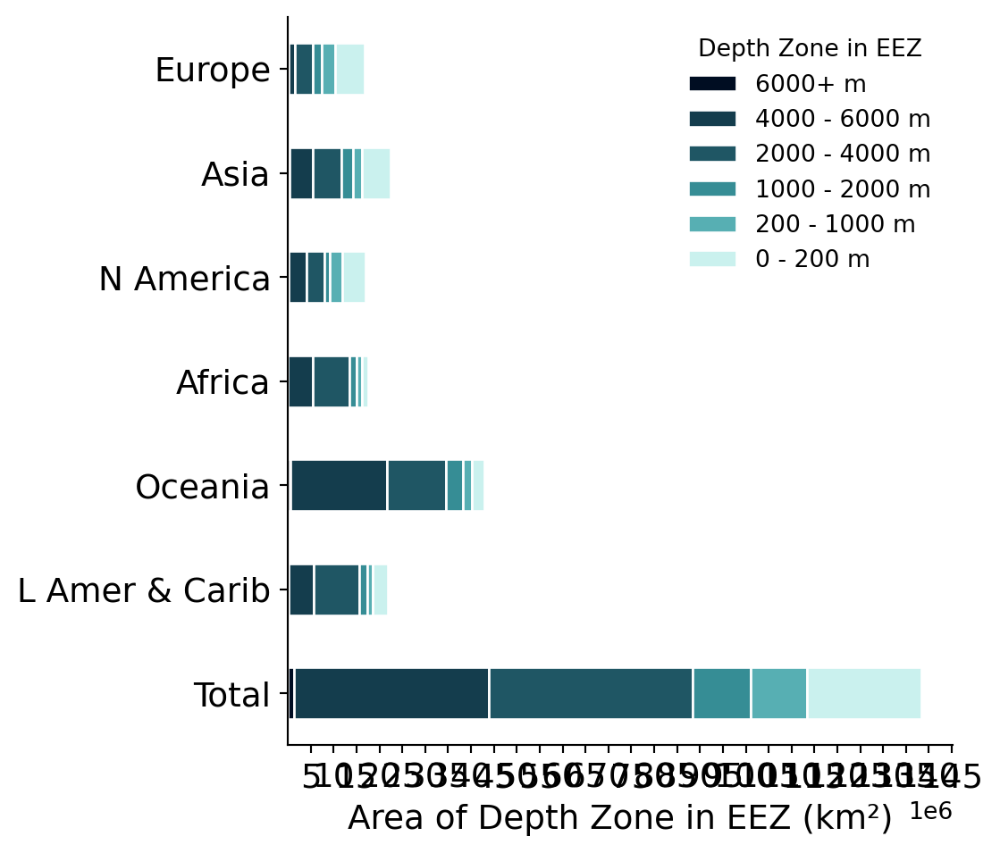

In [18]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].loc[:, '6000+ m':'200 m'].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=val_06,
              edgecolor='white',
              ax=ax)
    barh_pixel_fix(ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('')

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          labels=['6000+ m',
                  '4000 - 6000 m',
                  '2000 - 4000 m',
                  '1000 - 2000 m',
                  '200 - 1000 m',
                  '0 - 200 m'], 
          title='Depth Zone in EEZ', 
          fontsize=10, 
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='C2')

## **Fig C3**

In [19]:
## Calculate values for plot

renames = {
    'eez_area_0_to_200m':         '0 - 200', 
    'eez_area_200_to_1000m':      '200 - 1000', 
    'eez_area_1000_to_2000m':     '1000 - 2000',
    'eez_area_2000_to_4000m':     '2000 - 4000', 
    'eez_area_4000_to_6000m':     '4000 - 6000', 
    'eez_area_deeper_than_6000m': '6000+'
}
cols = list(renames.keys())

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][cols]
                                  .sum())
    # Rename columns
    fig_data[region] = fig_data[region].rename(index=renames)

    display(fig_data[region])

0 - 200        2.501566e+07
200 - 1000     1.215503e+07
1000 - 2000    1.267634e+07
2000 - 4000    4.459452e+07
4000 - 6000    4.249456e+07
6000+          1.345723e+06
dtype: float64

In [20]:
## Calculate additional statistics

for region in region_list:
    print('')
    display(Markdown(region))
    print('Total area of EEZs in region (sq km): {}'.format(country_tableR[region]['total_eez_area'].sum().astype('int64')))
    print("Total Area of deep ocean within region's EEZs (sq km): {}".format(
        country_tableR[region]['eez_deeper_than_200'].sum().astype('int64')))
    print('Percent of deep ocean vs total EEZ area within region: {:2.2%}'.format(
        ((country_tableR[region]['eez_deeper_than_200'].sum()/country_tableR[region]['total_eez_area'].sum()))))

    names = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 0]
             .to_list())
    print('Names of GeoAreas with 5 biggest **deep** EEZs in region: ' + ', '.join(names))

    areas = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 1]
             .to_list())
    print('Area of each of 5 biggest **deep** EEZs in region (sq km): ' + ', '.join(list(map(lambda n: '{:.1f}'.format(n), areas))))

Global

Total area of EEZs in region (sq km): 138281827
Total Area of deep ocean within region's EEZs (sq km): 113266171
Percent of deep ocean vs total EEZ area within region: 81.91%
Names of GeoAreas with 5 biggest **deep** EEZs in region: United States of America, Australia, French Polynesia, Indonesia, New Zealand
Area of each of 5 biggest **deep** EEZs in region (sq km): 6441221.7, 5219223.6, 4746873.8, 4113002.6, 3829570.2


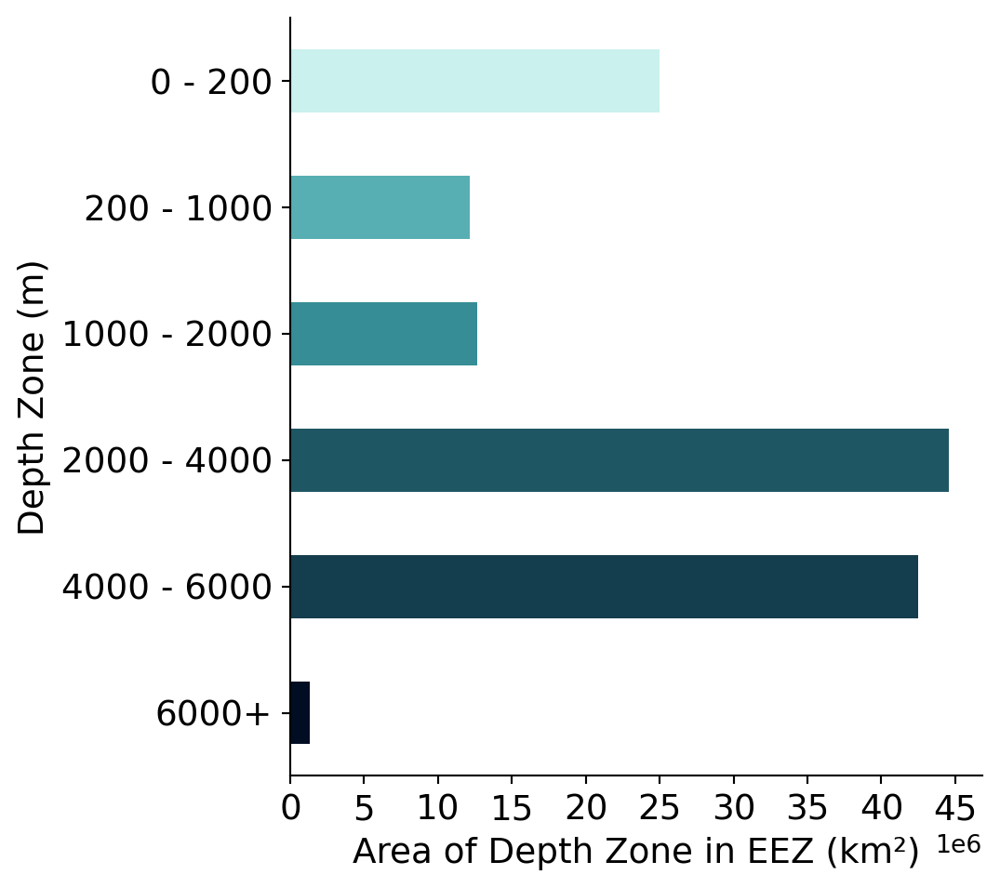

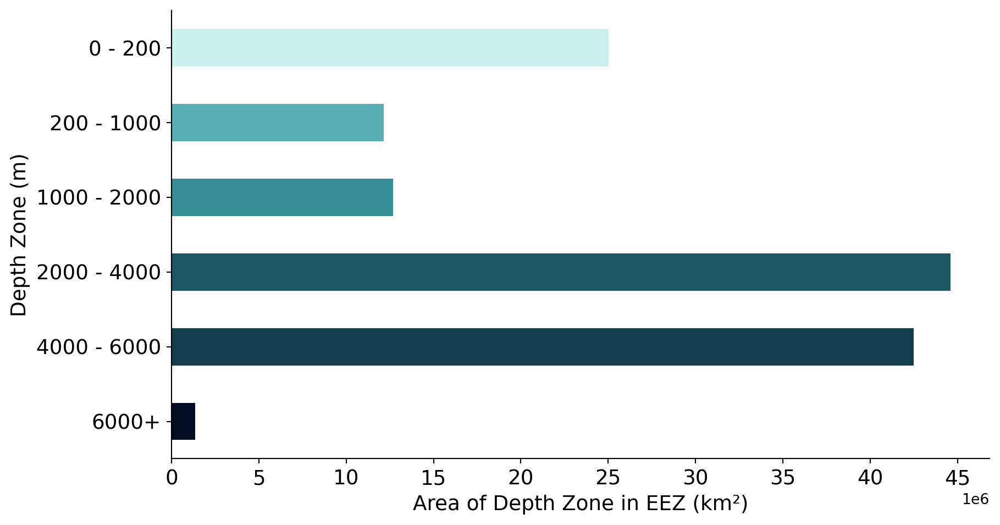

In [21]:
## Create plots

for region in region_list:
    w = 960
    h = 1080
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              fontsize=14,
              color=val_06,
              ax=ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('Depth Zone (m)', fontsize=14)

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    outputfigs(plt, fig, ax, region, section='1', letter='C3')


    ### C4 - same graph in a wider size

    w = 1920
    h = 1080
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              fontsize=14,
              color=val_06,
              ax=ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('Depth Zone (m)', fontsize=14)

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    outputfigs(plt, fig, ax, region, section='1', letter='C4')

---
# **Section 2 - Demographics**

## Q1 & Q40: Country representation

In [22]:
## Calculate statistics

region_data = {}
for region in region_list:
    region_data[region] = dataR[region][(dataR[region]['question'] == 'Q1') &
                 ~(dataR[region]['col_name'].str.endswith('other'))]

    display(Markdown('**'+region+'**'))
    print('Number of complete responses from region: {}'.format(region_data[region].shape[0]))
    print('Number of complete responses from each subregion:')
    #Because 'subregion' is wrong in the data spreadsheet. the true subregions are in the 'subregion' column, for some reason. ??
    display(region_data[region].groupby('subregion')['respondent_id'].count())

    print('Number of GeoAreas that submitted responses for region: {}'.format(region_data[region]['selection'].nunique()))

    print('Number of GeoAreas that submitted responses for each subregion:')
    display(region_data[region][['subregion', 'selection']].drop_duplicates().groupby('subregion')['selection'].nunique())

**Global**

Number of complete responses from region: 360
Number of complete responses from each subregion:


subregion
Africa                             101
Asia                                75
Europe                              33
Latin America and the Caribbean     90
Northern America                    38
Oceania                             23
Name: respondent_id, dtype: int64

Number of GeoAreas that submitted responses for region: 124
Number of GeoAreas that submitted responses for each subregion:


subregion
Africa                             33
Asia                               27
Europe                             18
Latin America and the Caribbean    33
Northern America                    3
Oceania                            10
Name: selection, dtype: int64

In [23]:
for region in region_list:
    print('Number of GeoAreas that submitted responses for region {}: {}'.format(region, region_data[region]['selection'].nunique()))

Number of GeoAreas that submitted responses for region Global: 124


In [24]:
for region in region_list:
    print()
    print('Number of GeoAreas that submitted responses for each subregion in {}:'.format(region))
    display(region_data[region][['subregion', 'selection']].drop_duplicates().groupby('subregion')['selection'].nunique())


Number of GeoAreas that submitted responses for each subregion in Global:


subregion
Africa                             33
Asia                               27
Europe                             18
Latin America and the Caribbean    33
Northern America                    3
Oceania                            10
Name: selection, dtype: int64

In [25]:
for region in region_list:
    display(Markdown('**'+region+'**'))
    mode = region_data[region].groupby('geoarea')['respondent_id'].count().value_counts()
    if (mode.size):
        print('{mode} response was most common, and there were {num} GeoAreas that submitted {mode} each.'.format(
            mode=mode.index[0], num=mode.iloc[0]))
    else:
        print('no responses for region', region)
    print('3 GeoAreas that submitted the most, and how many:')
    top3 = region_data[region].groupby('geoarea')['respondent_id'].count().sort_values(ascending=False).iloc[0:3]
    display(top3)

**Global**

1 response was most common, and there were 50 GeoAreas that submitted 1 each.
3 GeoAreas that submitted the most, and how many:


geoarea
United States of America    34
Republic of Korea           11
Venezuela                   11
Name: respondent_id, dtype: int64

In [26]:
for region in region_list:
    print()
    display(Markdown('**'+region+'**'))
    q1_q40_comparison = dataR[region].loc[(dataR[region]['question'] == 'Q40') &
                            ~(dataR[region]['col_name'].str.endswith('other')), ['respondent_id',
                                                                         'subregion',
                                                                         'selection_other', 
                                                                         'geoarea']]
    exceptions = q1_q40_comparison[q1_q40_comparison['selection_other'] != q1_q40_comparison['geoarea']]

    if region_data[region].shape[0] > 0:
        print('Responses from people living in-country: {:.0%}'.format(
            round(((region_data[region].shape[0] - exceptions.shape[0])/region_data[region].shape[0]), 2)))
    else:
        print('zero responses for region', region)
        continue

    for subregion in orderR[region]:
        rd = region_data[region]
        count_all = rd[rd['subregion'] == subregion].shape[0]
        count_exceptions = exceptions[exceptions['subregion'] == subregion].shape[0]
        if (count_all > 0):
            responses = ((count_all - count_exceptions) / count_all)
            print('Responses for '+subregion+': {:.0%}'.format(round(responses, 2)))
        else:
            print('zero responses for subregion '+subregion)

**Global**

Responses from people living in-country: 90%
Responses for Europe: 94%
Responses for Asia: 95%
Responses for Northern America: 89%
Responses for Africa: 88%
Responses for Oceania: 83%
Responses for Latin America and the Caribbean: 89%


## Fig D - Q41: Gender

In [27]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    gender = dataR[region].loc[dataR[region]['col_name'] == 'Q41', ['respondent_id', 'subregion', 'selection']]


    fig_data[region] = (gender.groupby(['subregion', 'selection'])
                  .count()
                  .rename(columns={'respondent_id': 'count'})
                  .reset_index()
                  .pivot(columns='subregion',
                         index='selection',
                         values='count'))

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['Male',                 'Male'],
            ['Female',               'Female'],
            ['Gender fluid',         'Fluid'],
            ['Agender',              'Agender'],
            ['Prefer not to answer', 'NR']
        ],
        createmissingrows=True
    )

    num_respondents = gender.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Male
Adding missing row Female
Adding missing row Gender fluid
Adding missing row Agender
Adding missing row Prefer not to answer


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib,Total
Male,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Female,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Fluid,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Agender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
NR,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0


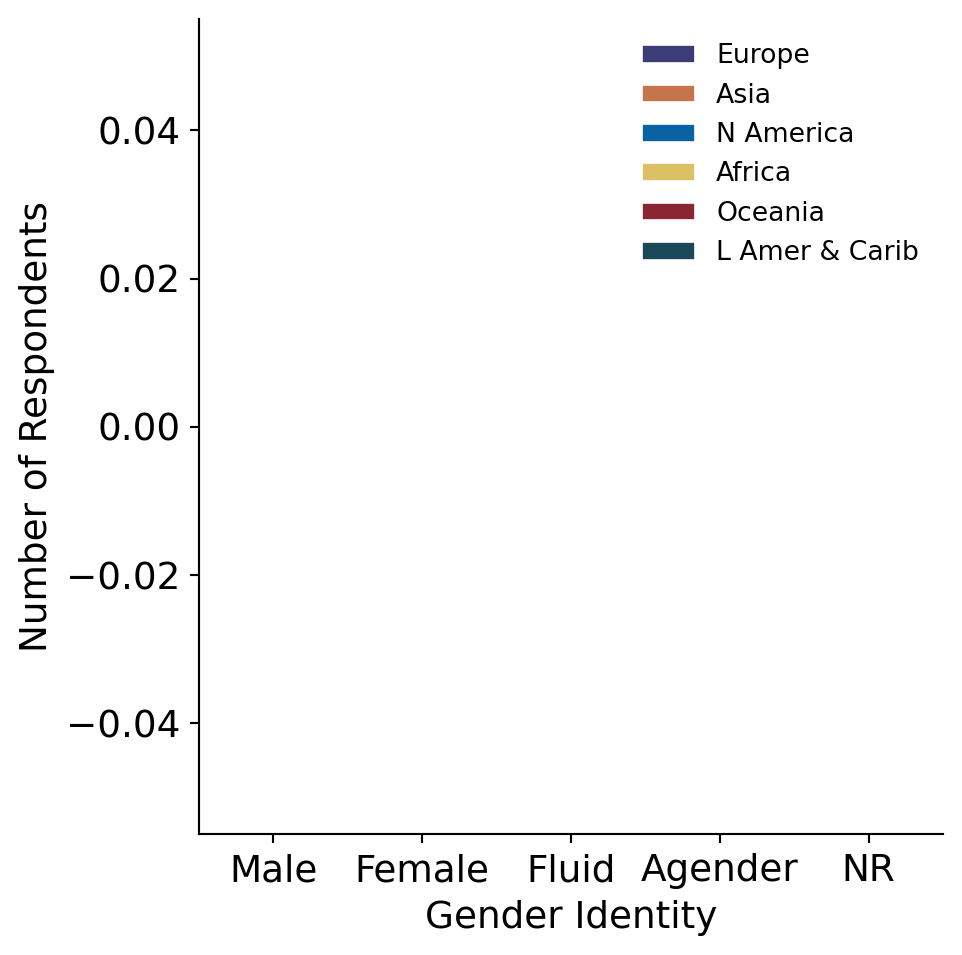

In [28]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
              stacked=True,
              legend=True,
              fontsize=14,
              rot=0,
              color=cat_d23e123_by_region[region],
              edgecolor='white',
              ax=ax)

    ax.set_xlabel('Gender Identity', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='D2')

### Q39: Age

In [29]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    age = dataR[region].loc[dataR[region]['col_name'] == 'Q39', ['respondent_id', 'subregion', 'selection']]

    fig_data[region] = (age.groupby(['subregion', 'selection'])
               .count()
               .rename(columns={'respondent_id': 'count'})
               .reset_index()
               .pivot(columns='subregion',
                      index='selection',
                      values='count'))

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    num_respondents = age.shape[0]
    show_totals(fig_data[region], num_respondents)

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib,Total
selection,,,,,,,
,33,75,38,101,23,90,360
Total,33,75,38,101,23,90,360


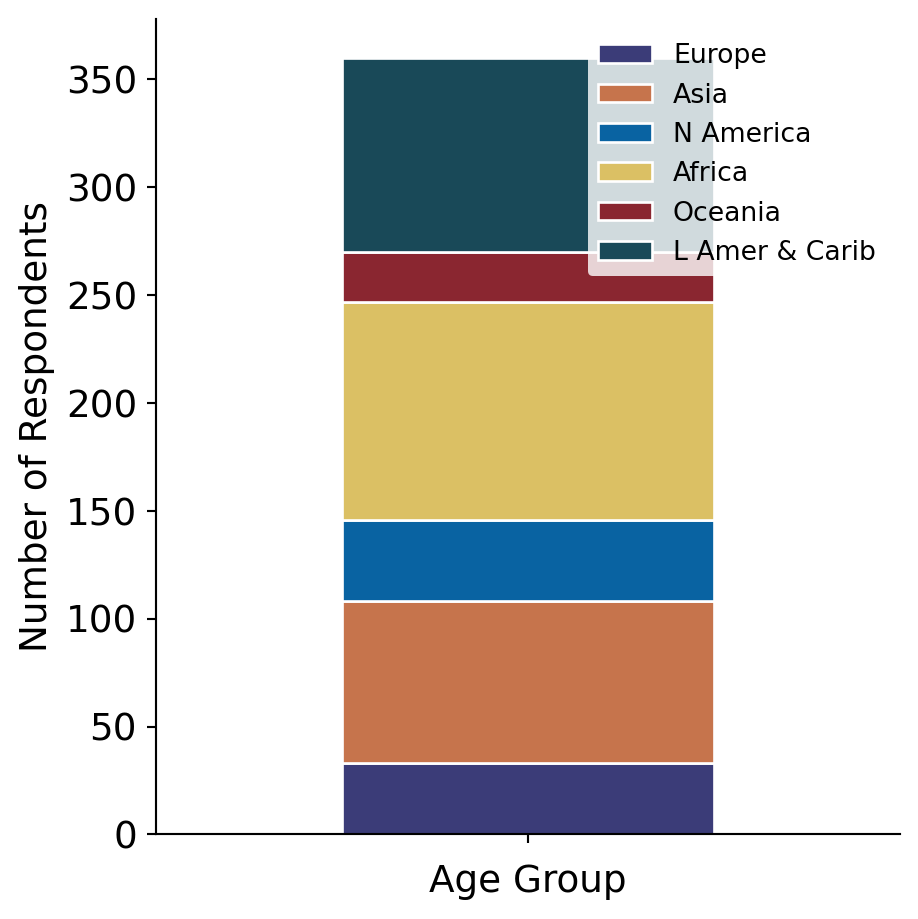

In [30]:
# Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Age Group', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='D3')

## Fig E - Q42: Education

In [31]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    education = dataR[region].loc[dataR[region]['col_name'] == 'Q42', ['respondent_id', 'subregion', 'selection_survey_clean']]
    education['education'] = education['selection_survey_clean'].copy()

    fig_data[region] = (education.groupby(['subregion', 'education'])
                         .count()
                         .rename(columns={'respondent_id': 'count'})
                         .reset_index()
                         .pivot(columns='subregion',
                                index='education',
                                values='count'))

    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['Doctoral Degree',    'PhD'],
            ['Master\'s Degree',   'MS'],
            ['Bachelor\'s Degree', 'BS'],
            ['Other',              'Other']
        ],
        createmissingrows=True,
        warnonly=True,
        ignorerows=ignoreR.get(region)
    )
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    display(fig_data[region])
    num_respondents = education.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Doctoral Degree
Adding missing row Master's Degree
Adding missing row Bachelor's Degree
Adding missing row Other


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
PhD,NaN,NaN,NaN,NaN,NaN,NaN
MS,NaN,NaN,NaN,NaN,NaN,NaN
BS,NaN,NaN,NaN,NaN,NaN,NaN
Other,NaN,NaN,NaN,NaN,NaN,NaN


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib,Total
PhD,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MS,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BS,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Other,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0


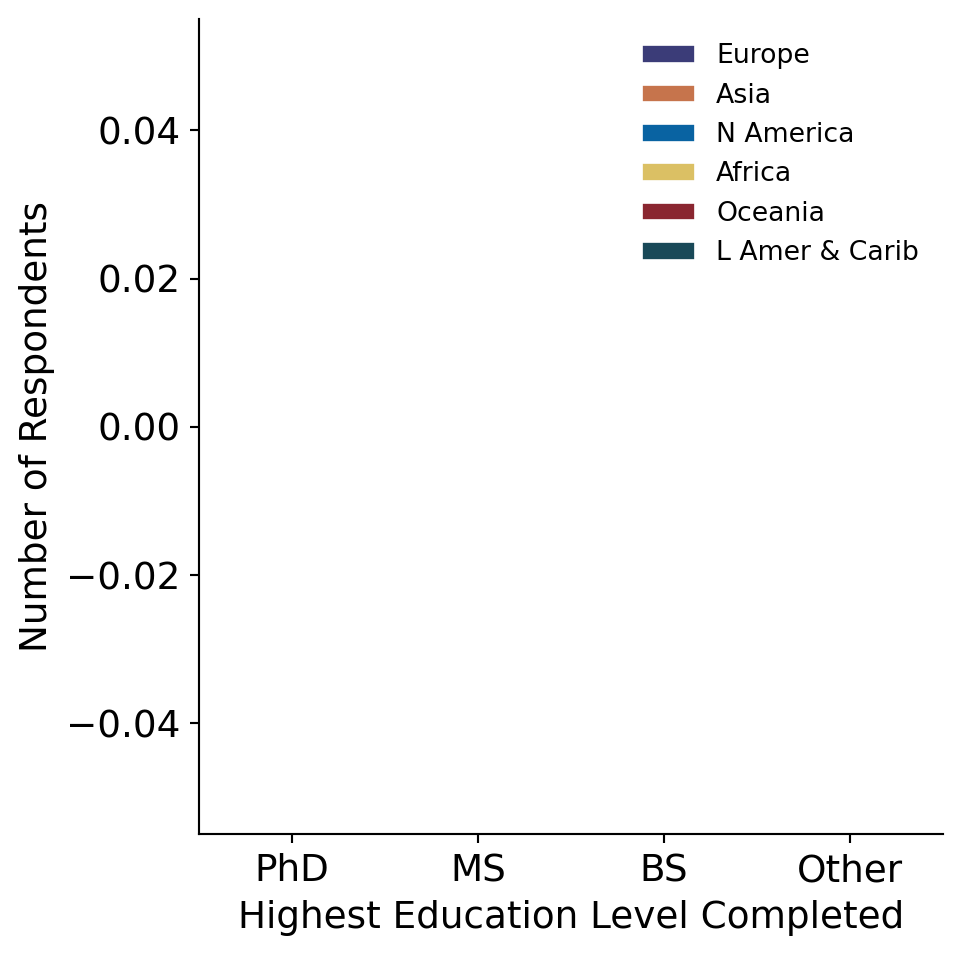

In [32]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Highest Education Level Completed', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E1')

### Q43: Sector

In [33]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    # Select relevant survey data
    sector = dataR[region].loc[dataR[region]['col_name'] == 'Q43', ['respondent_id', 'subregion', 'selection_survey_clean']]
    sector['sector'] = sector['selection_survey_clean'].copy()

    fig_data[region] = (sector.groupby(['subregion', 'sector'])
                      .count()
                      .rename(columns={'respondent_id': 'count'})
                      .reset_index()
                      .pivot(columns='subregion',
                             index='sector',
                             values='count'))

    fig_data[region] = reorder_rows_and_rename(
        fig_data[region], [
            ['Academia',   'Acad'],
            ['Government', 'Gov'],
            ['Non-profit', 'NFP'],
            ['NGO',        'NGO'],
            ['Other',      'Other']
        ],
        createmissingrows=True
    )

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    display(fig_data[region])
    num_respondents = sector.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Academia
Adding missing row Government
Adding missing row Non-profit
Adding missing row NGO
Adding missing row Other


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
Acad,NaN,NaN,NaN,NaN,NaN,NaN
Gov,NaN,NaN,NaN,NaN,NaN,NaN
NFP,NaN,NaN,NaN,NaN,NaN,NaN
NGO,NaN,NaN,NaN,NaN,NaN,NaN
Other,NaN,NaN,NaN,NaN,NaN,NaN


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib,Total
Acad,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gov,0.0,0.0,0.0,0.0,0.0,0.0,0.0
NFP,0.0,0.0,0.0,0.0,0.0,0.0,0.0
NGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Other,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0


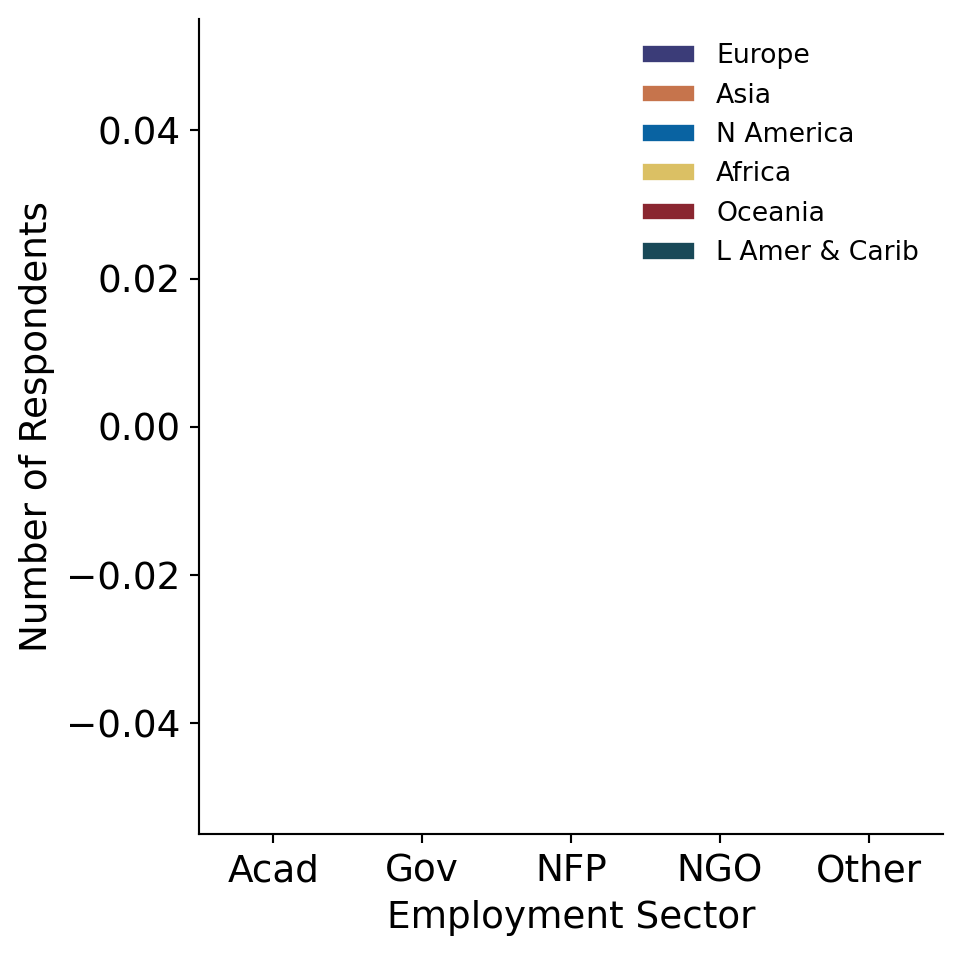

In [34]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar',
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Employment Sector', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E2')

### Q5: Roles

In [35]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    roles = dataR[region].loc[(dataR[region]['question'] == 'Q5') &
                 (dataR[region]['selection_survey_clean'] != ''), ['respondent_id', 'subregion', 'col_name', 'selection_survey_clean']]
    roles['roles'] = roles['selection_survey_clean'].copy()

    fig_data[region] = (roles.groupby(['subregion', 'roles'])
                     .count()
                     .rename(columns={'respondent_id': 'count'})
                     .reset_index()
                     .pivot(columns='subregion',
                            index='roles',
                            values='count'))

    order = [
        ['Scientist/Researcher',        'Sci'],
        ['Education/Outreach',          'Edu'],
        ['Conservation/Advocacy',       'Cons'],
        ['Policy/Law/Management',       'Mgt'],
        ['Student/Early Career',        'ECR'],
        ['Engineering/Technology',      'Eng'],
        ['Developing Nation/Community', 'Dev'],
        ['Aquatics/Recreation',         'Aqua'],
        ['Traditional Knowledge',       'TEK'],
        ['Government',                  'Gov'],
        ['Other',                       'Other']
    ]
    fig_data[region] = reorder_rows_and_rename(fig_data[region], order, createmissingrows=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    display(fig_data[region])
    num_respondents = roles.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Scientist/Researcher
Adding missing row Education/Outreach
Adding missing row Conservation/Advocacy
Adding missing row Policy/Law/Management
Adding missing row Student/Early Career
Adding missing row Engineering/Technology
Adding missing row Developing Nation/Community
Adding missing row Aquatics/Recreation
Adding missing row Traditional Knowledge
Adding missing row Government
Adding missing row Other
Adding missing column Europe
Adding missing column Asia
Adding missing column Northern America
Adding missing column Africa
Adding missing column Oceania
Adding missing column Latin America and the Caribbean


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
Sci,NaN,NaN,NaN,NaN,NaN,NaN
Edu,NaN,NaN,NaN,NaN,NaN,NaN
Cons,NaN,NaN,NaN,NaN,NaN,NaN
Mgt,NaN,NaN,NaN,NaN,NaN,NaN
ECR,NaN,NaN,NaN,NaN,NaN,NaN
Eng,NaN,NaN,NaN,NaN,NaN,NaN
Dev,NaN,NaN,NaN,NaN,NaN,NaN
Aqua,NaN,NaN,NaN,NaN,NaN,NaN
TEK,NaN,NaN,NaN,NaN,NaN,NaN
Gov,NaN,NaN,NaN,NaN,NaN,NaN


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib,Total
Sci,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Edu,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Cons,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Mgt,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ECR,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eng,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Dev,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Aqua,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TEK,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gov,0.0,0.0,0.0,0.0,0.0,0.0,0.0


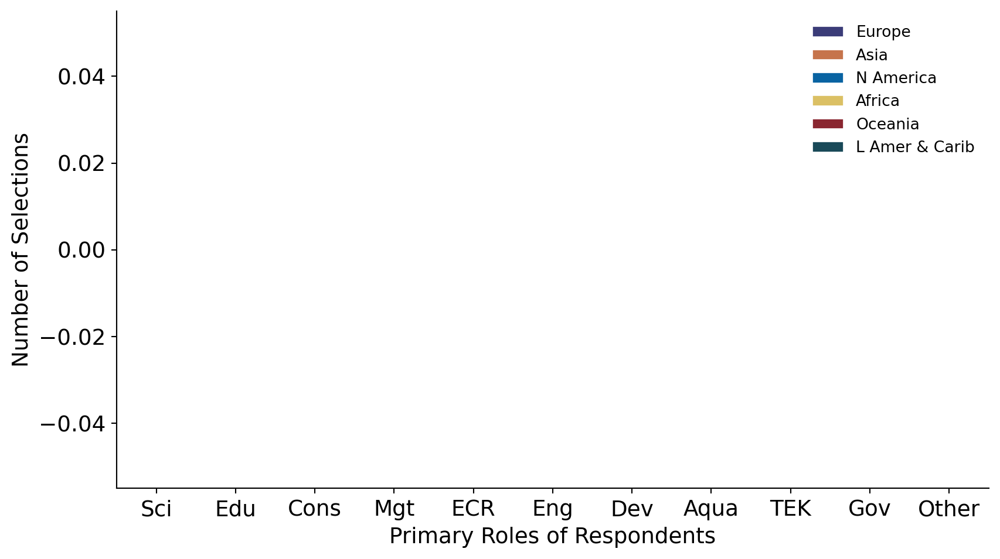

In [36]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Primary Roles of Respondents', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E3')

## Fig F - Q6: Field Work Environment

In [37]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    field_work = dataR[region].loc[dataR[region]['question'] == 'Q6', 
                      ['respondent_id', 'subregion', 'selection_survey_clean']]
    field_work = field_work[field_work['selection_survey_clean'] != '']
    
    covariate = 'subregion'

    selection_list = field_work['selection_survey_clean'].unique().tolist()
    selection_list.sort()

    fig_data[region] = (field_work.groupby([covariate, 'selection_survey_clean'])['respondent_id']
                      .count()
                      .rename('count')
                      .reset_index())
    
    renames = {
        'Inshore':                                 'Inshore',
        'Nearshore (within 3 miles of the coast)': 'Nearshore',
        'On the continental shelf (~<200 m)':      'Continental Shelf',
        'Deep water (>200 m)':                     'Deepwater',
        'Other':                                   'Other',
        'None of the above':                       'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

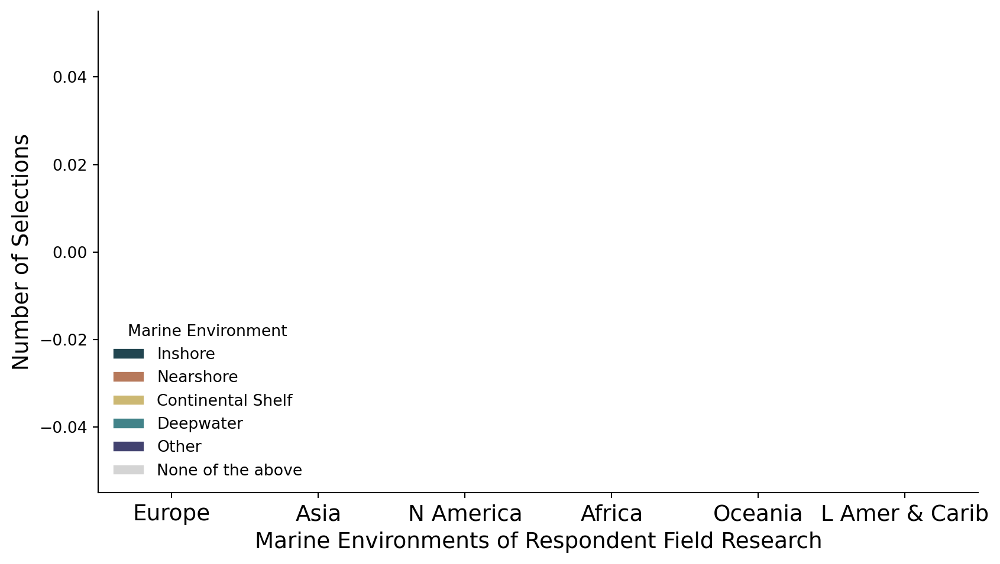

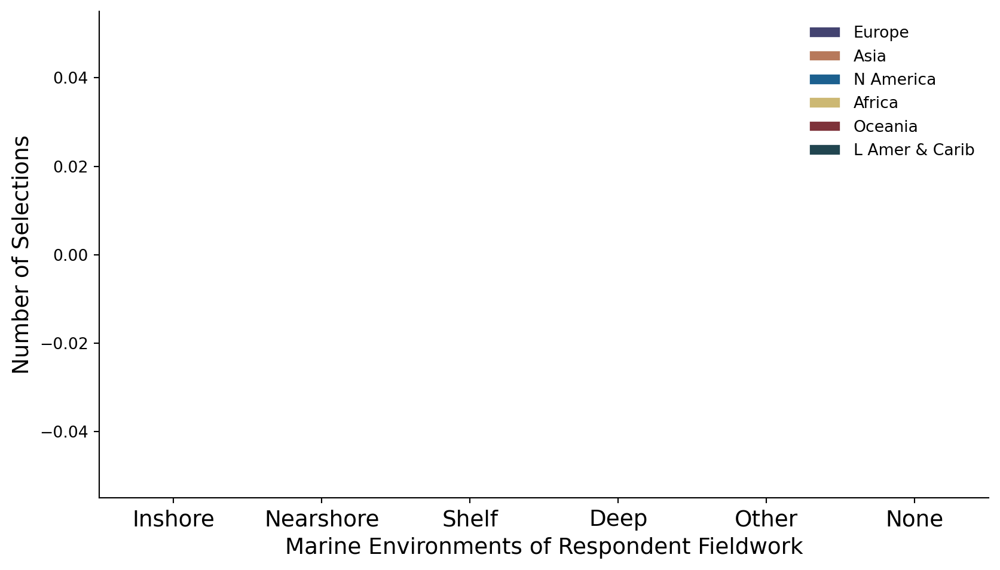

In [38]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='count',
                     order=label_order[region],
                     hue='selection_survey_clean',
                     hue_order=hue_order,
                     palette=cat_05,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set_xlabel('Marine Environments of Respondent Field Research', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    plt.locator_params(axis='y', integer=True)
    loc_tweaks = {'Africa': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Marine Environment',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='F1')
    
    ## F2
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='count',
                     order=hue_order,
                     hue='subregion',
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['Inshore', 'Nearshore', 'Shelf', 'Deep', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_xlabel('Marine Environments of Respondent Fieldwork', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    plt.locator_params(axis='y', integer=True)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='F2')

---
# **Section 3**

## Fig G - Q4a: Importance

In [39]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

importance = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    importance[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_importance', 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region].head())

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
respondent_id,,,,,,
12393972654,NaN,NaN,I don't agree or disagree,NaN,NaN,NaN
12410372842,NaN,NaN,NaN,Agree,NaN,NaN
12413837013,Disagree,NaN,NaN,NaN,NaN,NaN
12413981730,NaN,NaN,NaN,NaN,NaN,Disagree
12535759742,NaN,NaN,Agree,NaN,NaN,NaN


In [40]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                     Africa  Asia Europe   
selection                                           
1 - Strongly disagree           10.0   8.0    3.0   
2 - Disagree                    19.0  16.0    6.0   
3 - I don't agree or disagree   11.0   3.0    7.0   
4 - Agree                       32.0  23.0   13.0   
5 - Strongly agree              29.0  25.0    4.0   
Total                          101.0  75.0   33.0   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                    20.0   
2 - Disagree                                             31.0   
3 - I don't agree or disagree                            11.0   
4 - Agree                                                22.0   
5 - Strongly agree                                        6.0   
Total                                                    90.0   

                                                       percent                 \
subregion                     Northern America Oceania  Africa    Asia Europe   
selection                                                                       
1 - Strongly disagree                      1.0     1.0    9.90   10.67   9.09   
2 - Disagree                               9.0     5.0   18.81   21.33  18.18   
3 - I don't agree or disagree             10.0     2.0   10.89    4.00  21.21   
4 - Agree                                 18.0    10.0   31.68   30.67  39.39   
5 - Strongly agree                         NaN     5.0   28.71   33.33  12.12   
Total                                     38.0    23.0   99.99  100.00  99.99   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                   22.22   
2 - Disagree                                            34.44   
3 - I don't agree or disagree                           12.22   
4 - Agree                                               24.44   
5 - Strongly agree                                       6.67   
Total                                                   99.99   

                                                        count percent  
subregion                     Northern America Oceania  Total   Total  
selection                                                              
1 - Strongly disagree                     2.63    4.35   43.0   11.94  
2 - Disagree                             23.68   21.74   86.0   23.89  
3 - I don't agree or disagree            26.32    8.70   44.0   12.22  
4 - Agree                                47.37   43.48  118.0   32.78  
5 - Strongly agree                         NaN   21.74   69.0   19.17  
Total                                   100.00  100.01  360.0  100.00

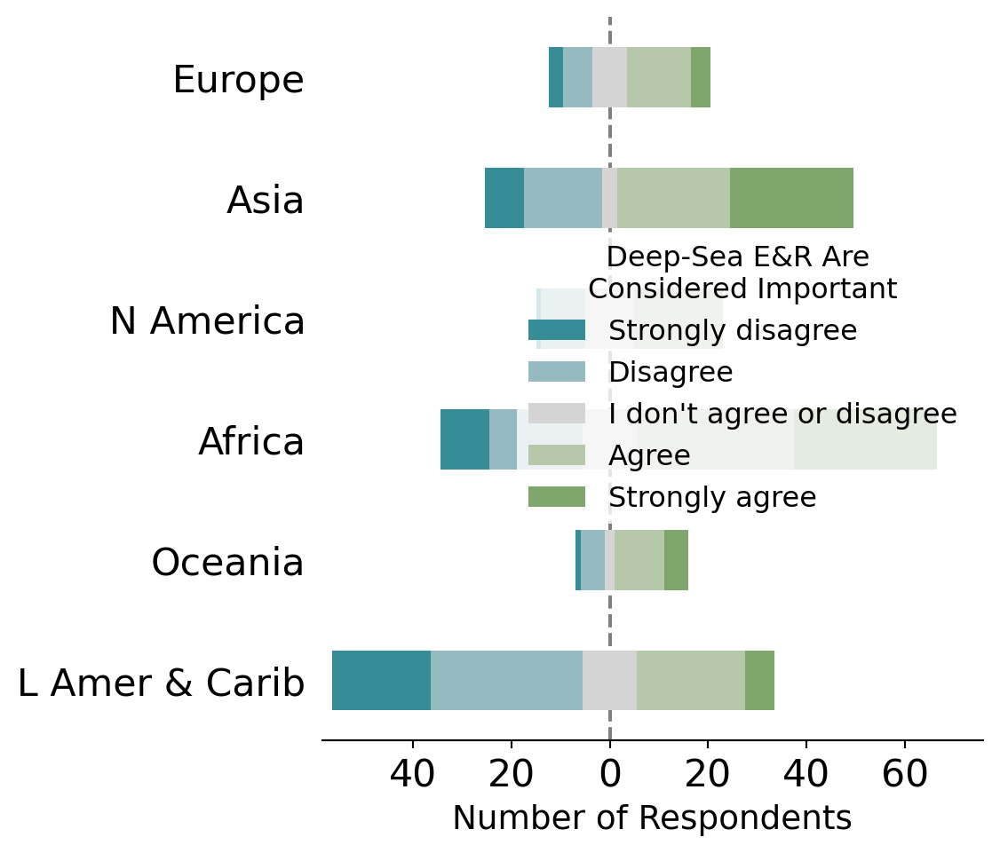

In [41]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Asia': 'lower left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='  Deep-Sea E&R Are\nConsidered Important',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G1')

### Q4: Tools

In [42]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

tools = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    tools[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_in-country_tools', 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = tools[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region])

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
respondent_id,,,,,,
12393972654,NaN,NaN,Strongly agree,NaN,NaN,NaN
12410372842,NaN,NaN,NaN,Agree,NaN,NaN
12413837013,Agree,NaN,NaN,NaN,NaN,NaN
12413981730,NaN,NaN,NaN,NaN,NaN,I don't agree or disagree
12535759742,NaN,NaN,Agree,NaN,NaN,NaN
...,...,...,...,...,...,...
13238295139,NaN,NaN,NaN,NaN,NaN,Strongly disagree
13238317961,NaN,NaN,NaN,NaN,NaN,Strongly disagree
13238625495,NaN,NaN,NaN,NaN,NaN,I don't agree or disagree


In [43]:
## Calculate statistics

for region in region_list:
    percent_data = (tools[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = tools[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                     Africa  Asia Europe   
selection                                           
1 - Strongly disagree           31.0   8.0    4.0   
2 - Disagree                    35.0  18.0    6.0   
3 - I don't agree or disagree   24.0  13.0    4.0   
4 - Agree                       11.0  23.0    9.0   
5 - Strongly agree               NaN  13.0   10.0   
Total                          101.0  75.0   33.0   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                    39.0   
2 - Disagree                                             24.0   
3 - I don't agree or disagree                            13.0   
4 - Agree                                                 8.0   
5 - Strongly agree                                        6.0   
Total                                                    90.0   

                                                       percent                 \
subregion                     Northern America Oceania  Africa    Asia Europe   
selection                                                                       
1 - Strongly disagree                      1.0    12.0   30.69   10.67  12.12   
2 - Disagree                               NaN     5.0   34.65   24.00  18.18   
3 - I don't agree or disagree              3.0     1.0   23.76   17.33  12.12   
4 - Agree                                 10.0     3.0   10.89   30.67  27.27   
5 - Strongly agree                        24.0     2.0     NaN   17.33  30.30   
Total                                     38.0    23.0   99.99  100.00  99.99   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                   43.33   
2 - Disagree                                            26.67   
3 - I don't agree or disagree                           14.44   
4 - Agree                                                8.89   
5 - Strongly agree                                       6.67   
Total                                                  100.00   

                                                        count percent  
subregion                     Northern America Oceania  Total   Total  
selection                                                              
1 - Strongly disagree                     2.63   52.17   95.0   26.39  
2 - Disagree                               NaN   21.74   88.0   24.44  
3 - I don't agree or disagree             7.89    4.35   58.0   16.11  
4 - Agree                                26.32   13.04   64.0   17.78  
5 - Strongly agree                       63.16    8.70   55.0   15.28  
Total                                   100.00  100.00  360.0  100.00

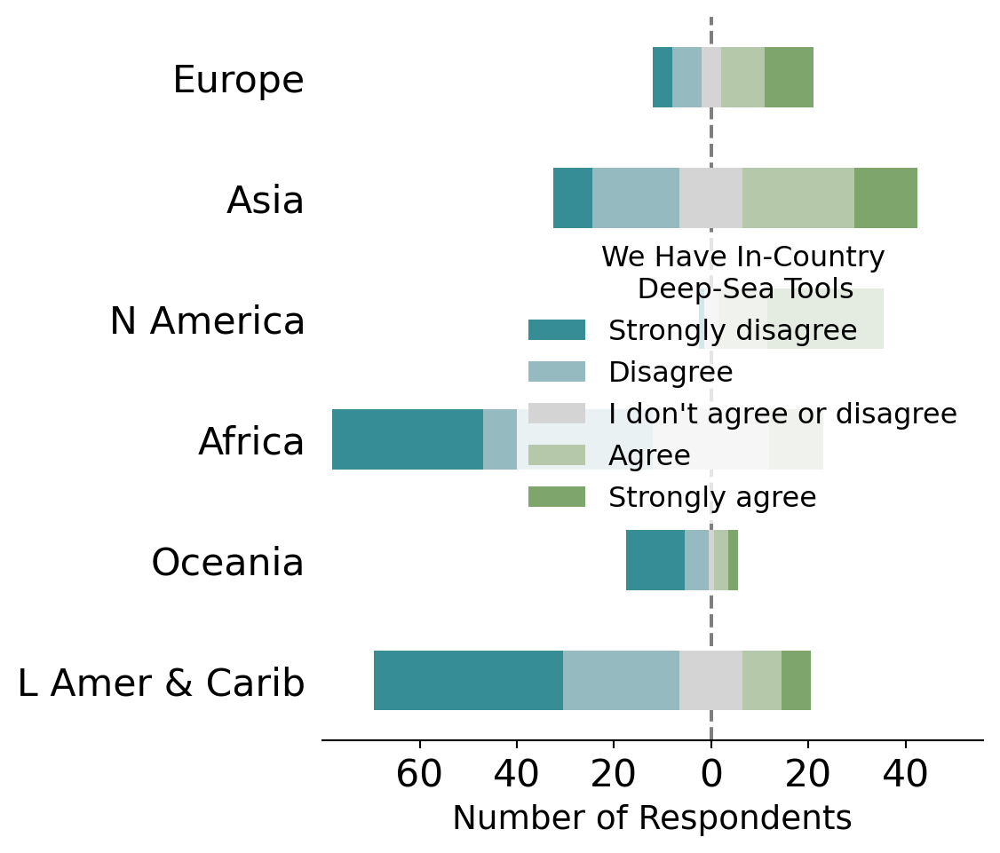

In [44]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='We Have In-Country\n    Deep-Sea Tools',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G3')

### Q4: ExpertiseA

In [45]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

expertise = {}
fig_data = {}

for region in region_list:
    # Select relevant survey data
    expertise[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_in-country_expertise', 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = expertise[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region])

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
respondent_id,,,,,,
12393972654,NaN,NaN,Strongly agree,NaN,NaN,NaN
12410372842,NaN,NaN,NaN,Agree,NaN,NaN
12413837013,Strongly agree,NaN,NaN,NaN,NaN,NaN
12413981730,NaN,NaN,NaN,NaN,NaN,Agree
12535759742,NaN,NaN,Strongly agree,NaN,NaN,NaN
...,...,...,...,...,...,...
13238295139,NaN,NaN,NaN,NaN,NaN,Strongly disagree
13238317961,NaN,NaN,NaN,NaN,NaN,Disagree
13238625495,NaN,NaN,NaN,NaN,NaN,Agree


In [46]:
## Calculate statistics

for region in region_list:
    percent_data = (expertise[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = expertise[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                     Africa  Asia Europe   
selection                                           
1 - Strongly disagree           18.0   6.0    NaN   
2 - Disagree                    21.0  11.0    5.0   
3 - I don't agree or disagree   21.0  18.0    3.0   
4 - Agree                       37.0  25.0   10.0   
5 - Strongly agree               4.0  15.0   15.0   
Total                          101.0  75.0   33.0   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                    21.0   
2 - Disagree                                             18.0   
3 - I don't agree or disagree                            14.0   
4 - Agree                                                27.0   
5 - Strongly agree                                       10.0   
Total                                                    90.0   

                                                       percent                 \
subregion                     Northern America Oceania  Africa    Asia Europe   
selection                                                                       
1 - Strongly disagree                      1.0     6.0   17.82    8.00    NaN   
2 - Disagree                               NaN     8.0   20.79   14.67  15.15   
3 - I don't agree or disagree              2.0     1.0   20.79   24.00   9.09   
4 - Agree                                  7.0     5.0   36.63   33.33  30.30   
5 - Strongly agree                        28.0     3.0    3.96   20.00  45.45   
Total                                     38.0    23.0   99.99  100.00  99.99   

                                                               \
subregion                     Latin America and the Caribbean   
selection                                                       
1 - Strongly disagree                                   23.33   
2 - Disagree                                            20.00   
3 - I don't agree or disagree                           15.56   
4 - Agree                                               30.00   
5 - Strongly agree                                      11.11   
Total                                                  100.00   

                                                        count percent  
subregion                     Northern America Oceania  Total   Total  
selection                                                              
1 - Strongly disagree                     2.63   26.09   52.0   14.44  
2 - Disagree                               NaN   34.78   63.0   17.50  
3 - I don't agree or disagree             5.26    4.35   59.0   16.39  
4 - Agree                                18.42   21.74  111.0   30.83  
5 - Strongly agree                       73.68   13.04   75.0   20.83  
Total                                    99.99  100.00  360.0  100.00

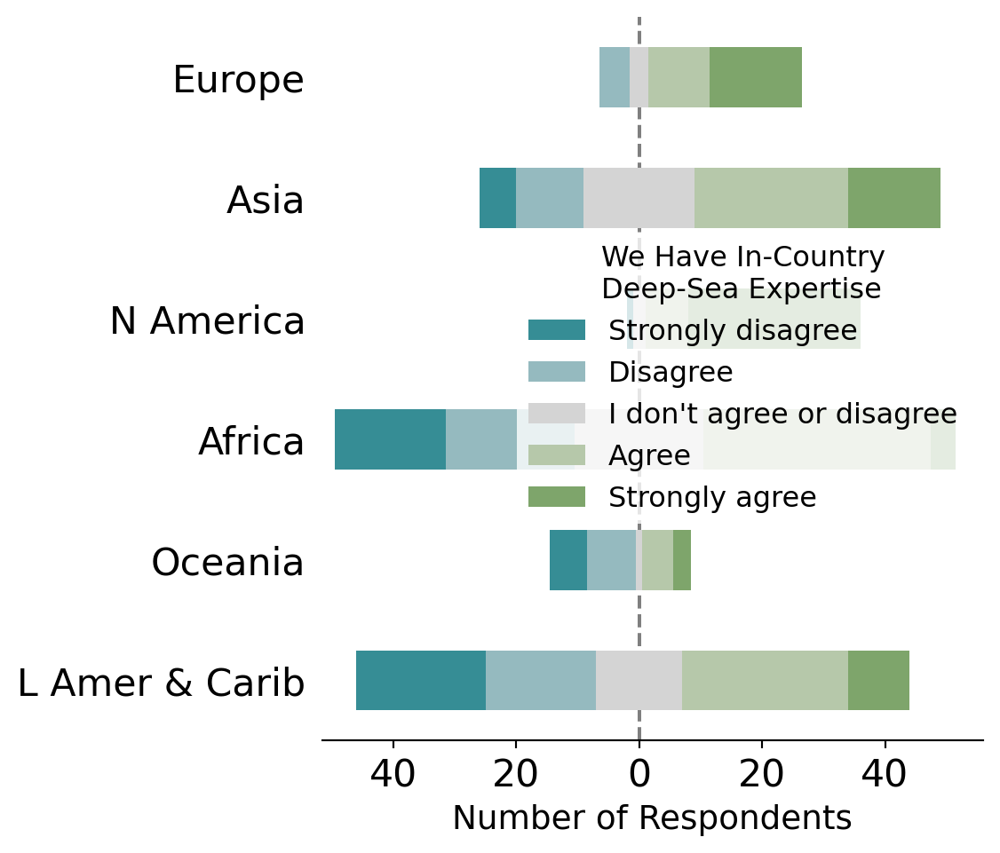

In [47]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Economies': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='We Have In-Country\nDeep-Sea Expertise',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G4')

,dscsr-group-tools,dscsr-group-exp,dscsr-group-imp
dscsr-group,,,
A,5.00,5.00,4.67
D,1.50,3.00,4.50
E,1.25,1.75,4.25
F,1.00,1.80,2.60
B,4.50,5.00,2.50
C,2.00,3.40,2.40


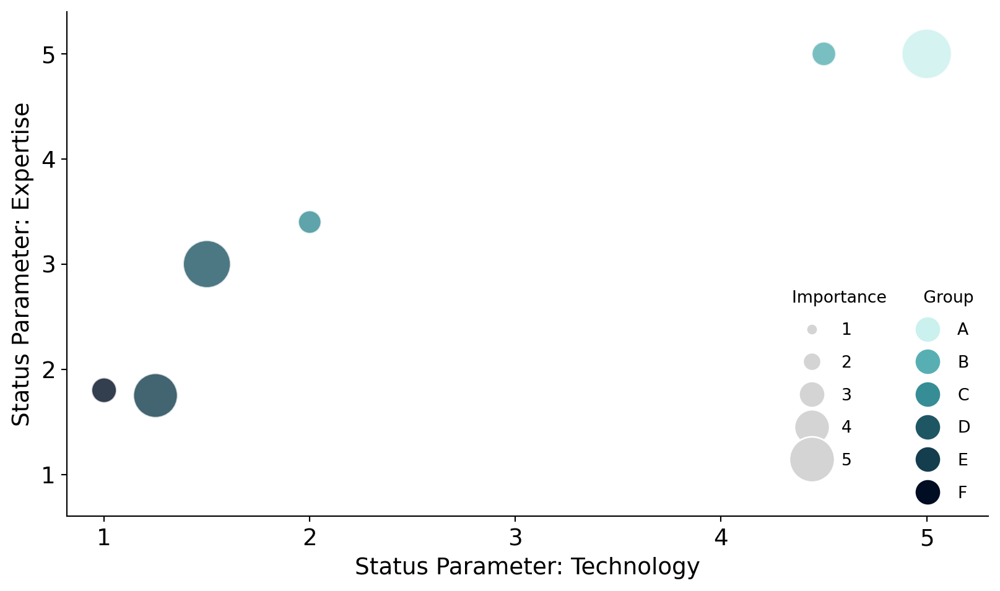

In [48]:
##### Calculate fig data

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['subregion_orig', 'dscsr-group', 'dscsr-group-tools', 'dscsr-group-exp', 'dscsr-group-imp']]
                        .groupby('dscsr-group')
                        .mean())
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dscsr-group-imp', ascending=False)

    display(fig_data[region])

## Plot figure

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dscsr-group-imp'].tolist()]
    groups=['A', 'B', 'C', 'D', 'E', 'F']
    colors = [groups.index(x) for x in fig_data[region].index.tolist()]

    fig_data[region].plot('dscsr-group-tools', 'dscsr-group-exp', kind='scatter', 
                  legend=False,
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors,
                  cmap=matplotlib.colors.ListedColormap(val_06_rev[0:-1]),
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Status Parameter: Technology', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Status Parameter: Expertise', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.3)
    plt.ylim(0.6,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white',
                                               marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
        markers[i].set_zorder(6-i)
    markers.append(matplotlib.lines.Line2D(range(1), range(1), color='none', marker='o', markersize=0, markerfacecolor='none'))
    labels.append('')
    for i in range(0,6):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_06_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    legend = plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Importance       Group',
                             loc='lower right')
    ax.add_artist(legend)

    outputfigs(plt, fig, ax, region, section='5', letter='G5')

In [49]:
##### Calculate fig data

regions_to_skip = ['Global', 'Economies', 'SIDS']

fig_data_global = (country_tableR['Global'][['subregion_orig', 'dscsr-group', 'dscsr-group-tools', 'dscsr-group-exp', 'dscsr-group-imp']]
                    .groupby(['subregion_orig', 'dscsr-group'])
                    .head(1))
fig_data_global = fig_data_global.set_index('subregion_orig')
display(fig_data_global)

colors = {}
fig_data = {}
for region in region_list:
    if region in regions_to_skip:
        print('Skipping region', region);
        continue

    fig_data[region] = fig_data_global.copy()
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dscsr-group-imp', ascending=False)
    
    # move bubbles to be colored to the end so they are plotted last
    # and not obscured by gray bubbles in the same position
    these_subregions = orderR[region]
    color = fig_data[region].query('subregion_orig in @these_subregions')
    grays = fig_data[region].query('subregion_orig not in @these_subregions')
    fig_data[region] = pd.concat([grays, color])
    
    groups=['A', 'B', 'C', 'D', 'E', 'F']
    colors[region] = []
    for index in fig_data[region].index:
        if index in orderR[region]:
            group = fig_data[region].loc[index]['dscsr-group']
            colors[region].append(val_06_rev[groups.index(group)])
        else:
            colors[region].append('#d4d4d4')

## Plot figure

w = 1920
h = 1080

for region in region_list:
    if region in regions_to_skip:
        continue

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dscsr-group-imp'].tolist()]
    fig_data[region].plot('dscsr-group-tools', 'dscsr-group-exp', kind='scatter', 
                  legend=False,
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors[region],
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Status Parameter: Technology', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Status Parameter: Expertise', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.3)
    plt.ylim(0.6,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    markers.append(matplotlib.lines.Line2D(range(1), range(1), color='none', marker='o', markersize=0, markerfacecolor='none'))
    labels.append('')
    for i in range(0,6):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_06_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Importance       Group',
                             loc='lower right'))

    outputfigs(plt, fig, ax, region, section='5', letter='G5b')

,dscsr-group,dscsr-group-tools,dscsr-group-exp,dscsr-group-imp
subregion_orig,,,,
Western Africa,D,1.50,3.00,4.50
Eastern Africa,E,1.25,1.75,4.25
Middle Africa,F,1.00,1.80,2.60
Northern Africa,C,2.00,3.40,2.40
Southern Africa,F,1.00,1.80,2.60
Southeastern Asia,D,1.50,3.00,4.50
Eastern Asia,A,5.00,5.00,4.67
Western Asia,C,2.00,3.40,2.40
Southern Asia,E,1.25,1.75,4.25


Skipping region Global


adding empty row for 1


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,NaN,NaN,NaN,1.0,3.0
3,NaN,1.0,1.0,3.0,1.0,NaN
4,1.0,1.0,NaN,2.0,1.0,NaN
5,1.0,2.0,NaN,NaN,1.0,NaN


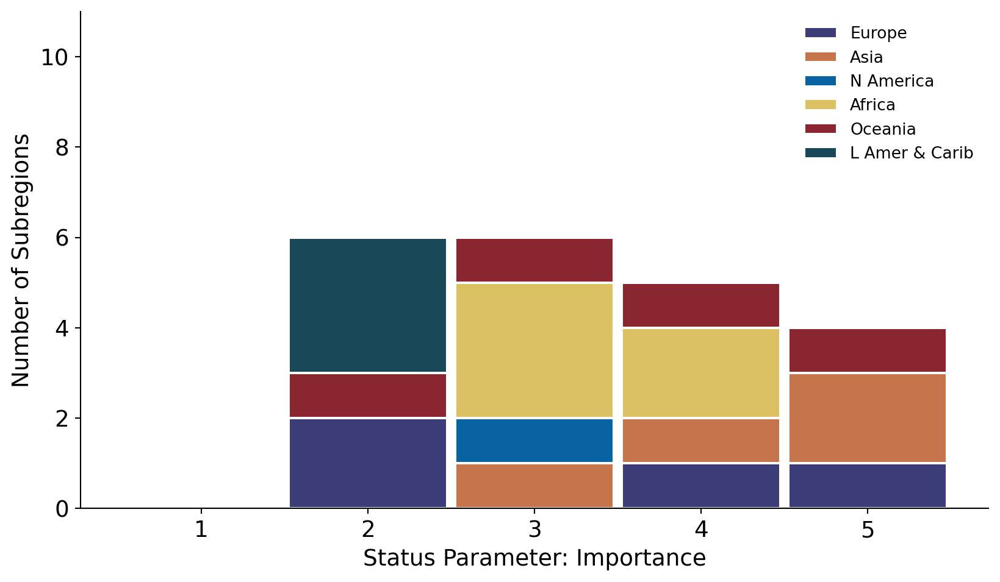

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,1.0,NaN,NaN,4.0,3.0,3.0
2,NaN,2.0,NaN,1.0,NaN,NaN
3,1.0,1.0,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,1.0,NaN
5,2.0,1.0,1.0,NaN,NaN,NaN


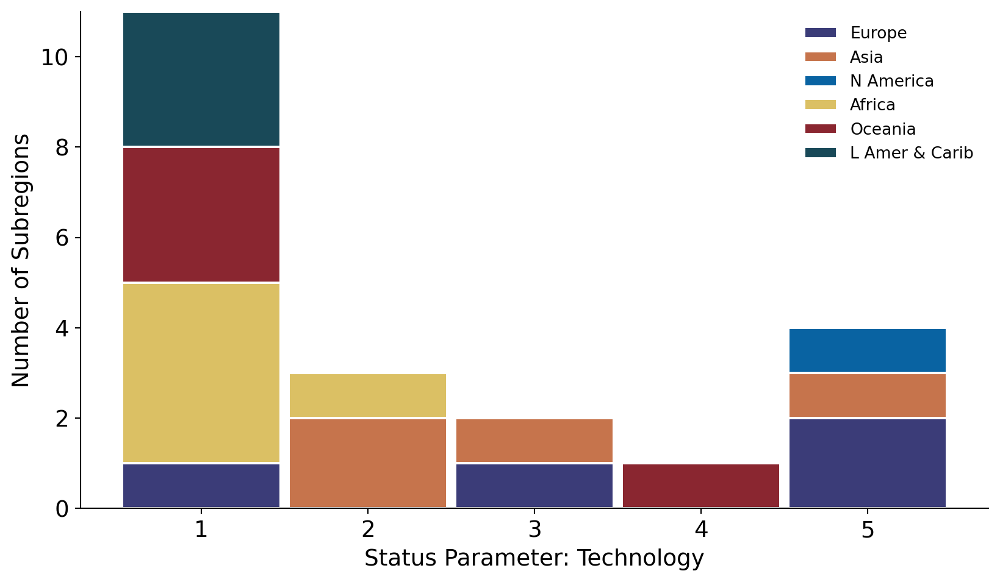

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,NaN,2.0,NaN
2,NaN,1.0,NaN,3.0,1.0,2.0
3,NaN,2.0,NaN,2.0,NaN,1.0
4,2.0,NaN,NaN,NaN,NaN,NaN
5,2.0,1.0,1.0,NaN,1.0,NaN


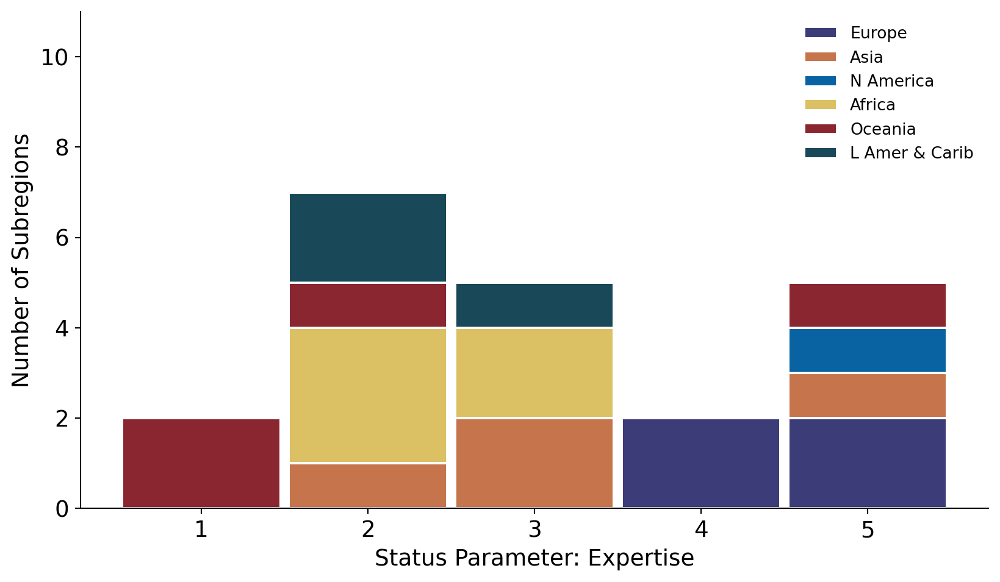

In [50]:
## Calculate fig data

dsc_types = {
    'dscsr-imp':
        { 'x-label': 'Status Parameter: Importance',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G6'
        },
    'dscsr-tools':
        { 'x-label': 'Status Parameter: Technology',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G7'
        },
    'dscsr-exp':
        { 'x-label': 'Status Parameter: Expertise',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G8'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)
        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figure

    w = 1920
    h = 1080
    
    for region in region_list:
        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

        fig_data[region].plot(kind='bar', 
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        plt.ylim(0, 11)

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

In [51]:
## Calculate fig data

dsc_types = {
    'dscsr-imp':
        { 'x-label': 'Status Parameter: Importance',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G6b'
        },
    'dscsr-tools':
        { 'x-label': 'Status Parameter: Technology',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G7b'
        },
    'dscsr-exp':
        { 'x-label': 'Status Parameter: Expertise',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G8b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                        .mean()
                        .rename('mean')
                        .reset_index())
            fig_data[r] = (fig_data[r]
                        .groupby(['mean', 'subregion'])['mean']
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r]['mean'] = fig_data[r]['mean'].astype(int)

            fig_data[r] = fig_data[r].pivot(index='mean', columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        plt.ylim(0, 11)
        
        colors = []
        edgecolors = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Global
Skipping region Global
Skipping region Global


---
# **Section 4**

## Fig H - Q3: Issues

In [52]:
## Calculate values for plot

issues = {}
fig_data = {}
for region in region_list:
    issues[region] = dataR[region].loc[(dataR[region]['question'] == 'Q3') &
                  (dataR[region]['selection_survey_clean'] != ''),
                  ['respondent_id', 'subregion', 'selection_survey_clean']].copy()

    covariate = 'subregion'

    selection_list = issues[region]['selection_survey_clean'].unique().tolist()
    selection_list.sort()

    fig_data[region] = (issues[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    sorted_cols = ['Conservation & protection',
                   'Basic science & exploration',
                   'Fisheries & aquaculture',
                   'Offshore oil & gas',
                   'Climate change',
                   'Seabed mining',
                   'Safety & security',
                   'Maritime archaeology & history',
                   'Renewable energy',
                   'Telecommunications',
                   'Other']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols, createmissingcolumns=True)

    # Change table to print better below
    percent_data = fig_data[region].copy()
    percent_data.rename(columns={'Telecommunications': 'Telecomm.'}, inplace=True)

    display(percent_data)
    percent_data.fillna(0)

selection_survey_clean,Conservation & protection,Basic science & exploration,Fisheries & aquaculture,Offshore oil & gas,Climate change,Seabed mining,Safety & security,Maritime archaeology & history,Renewable energy,Telecomm.,Other
subregion,,,,,,,,,,,
Africa,16.84,14.14,22.90,16.50,12.46,3.70,7.74,2.02,1.01,1.01,1.68
Asia,13.49,19.53,14.88,18.60,10.23,7.91,6.98,3.72,1.86,2.79,NaN
Europe,23.71,18.56,16.49,7.22,13.40,6.19,3.09,4.12,5.15,1.03,1.03
Latin America and the Caribbean,21.01,22.18,19.07,15.18,10.51,2.33,3.50,0.78,1.56,1.56,2.33
Northern America,20.35,21.24,8.85,14.16,17.70,10.62,0.88,0.88,2.65,0.88,1.77
Oceania,23.08,12.31,12.31,7.69,20.00,13.85,3.08,4.62,NaN,1.54,1.54


In [53]:
## Calculate statistics

for region in region_list:
    count_data = (issues[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    pivoted.loc['Total'] = pivoted.sum()

    # Sort subregions as Katy specified
    sorted_cols = ['Conservation & protection',
                   'Basic science & exploration',
                   'Fisheries & aquaculture',
                   'Offshore oil & gas',
                   'Climate change',
                   'Seabed mining',
                   'Safety & security',
                   'Maritime archaeology & history',
                   'Renewable energy',
                   'Telecommunications',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    pivoted.rename(columns={'Telecommunications': 'Telecomm.'}, inplace=True)
    display(pivoted)
    
    # Calculate percentages for the entire region
    display(round((count_data.groupby('selection_survey_clean')['count']
                 .sum()/count_data['count'].sum())*100, 2).rename('percent').reset_index())

selection_survey_clean,Conservation & protection,Basic science & exploration,Fisheries & aquaculture,Offshore oil & gas,Climate change,Seabed mining,Safety & security,Maritime archaeology & history,Renewable energy,Telecomm.,Other,Total
subregion,,,,,,,,,,,,
Africa,50.0,42.0,68.0,49.0,37.0,11.0,23.0,6.0,3.0,3.0,5.0,297.0
Asia,29.0,42.0,32.0,40.0,22.0,17.0,15.0,8.0,4.0,6.0,NaN,215.0
Europe,23.0,18.0,16.0,7.0,13.0,6.0,3.0,4.0,5.0,1.0,1.0,97.0
Latin America and the Caribbean,54.0,57.0,49.0,39.0,27.0,6.0,9.0,2.0,4.0,4.0,6.0,257.0
Northern America,23.0,24.0,10.0,16.0,20.0,12.0,1.0,1.0,3.0,1.0,2.0,113.0
Oceania,15.0,8.0,8.0,5.0,13.0,9.0,2.0,3.0,NaN,1.0,1.0,65.0
Total,194.0,191.0,183.0,156.0,132.0,61.0,53.0,24.0,19.0,16.0,15.0,1044.0


,selection_survey_clean,percent
0,Basic science & exploration,18.30
1,Climate change,12.64
2,Conservation & protection,18.58
3,Fisheries & aquaculture,17.53
4,Maritime archaeology & history,2.30
5,Offshore oil & gas,14.94
6,Other,1.44
7,Renewable energy,1.82
8,Safety & security,5.08
9,Seabed mining,5.84


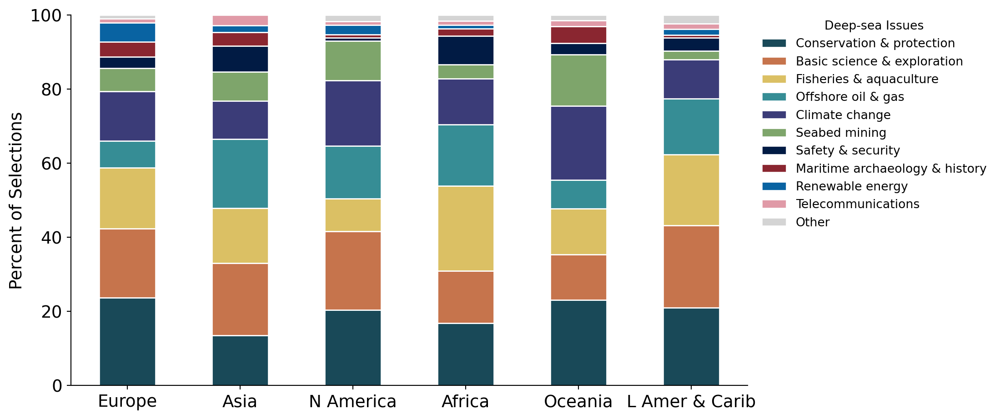

In [54]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_10,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Deep-sea Issues', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='H')

## Fig I - Q33: Challenges

In [55]:
## Calculate values for plot

challenges = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    challenges[region] = dataR[region].loc[(dataR[region]['question'] == 'Q33') &
                      (dataR[region]['selection_survey_clean'] != ''),
                        ['respondent_id', 'subregion', 'selection_survey_clean']].copy()

    display(challenges[region])
    covariate = 'subregion'
    fig_data[region] = (challenges[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    # Sort subregions as Katy specified
    sorted_cols = ['Funding',
                   'Human capacity/knowledge to do deep sea research',
                   'Access to vessels',
                   'Access to deep submergence vehicles',
                   'Access to deep sea sensors',
                   'Scalability of technologies',
                   'Lack of connections with other deep sea researchers',
                   'Access to data tools',
                   'Other']
    display(fig_data[region])
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)
    display(fig_data[region])

,respondent_id,subregion,selection_survey_clean
39960,12673531336,Oceania,Lack of connections with other deep sea resear...
39961,12674177252,Latin America and the Caribbean,Lack of connections with other deep sea resear...
39962,12751483616,Asia,Lack of connections with other deep sea resear...
39963,12881514349,Latin America and the Caribbean,Lack of connections with other deep sea resear...
39964,12897429486,Africa,Lack of connections with other deep sea resear...
...,...,...,...
43011,12979297027,Europe,Access to vessels
43012,13165714192,Northern America,Access to vessels
43013,12961204767,Africa,Access to vessels
43014,12718597061,Northern America,Access to vessels


selection_survey_clean,Access to data tools,Access to deep sea sensors,Access to deep submergence vehicles,Access to vessels,Funding,Human capacity/knowledge to do deep sea research,Lack of connections with other deep sea researchers,Other,Scalability of technologies
subregion,,,,,,,,,
Europe,3.19,9.57,15.96,21.28,31.91,10.64,1.06,1.06,5.32
Asia,2.31,4.17,12.96,18.52,30.09,18.52,7.41,2.78,3.24
N America,0.88,2.65,19.47,20.35,30.97,5.31,2.65,3.54,14.16
Africa,8.19,7.17,15.36,15.70,22.87,19.45,6.48,0.34,4.44
Oceania,8.57,1.43,14.29,4.29,31.43,25.71,5.71,2.86,5.71
L Amer & Carib,5.28,5.28,15.09,16.60,31.70,16.98,4.15,1.13,3.77


selection_survey_clean,Funding,Human capacity/knowledge to do deep sea research,Access to vessels,Access to deep submergence vehicles,Access to deep sea sensors,Scalability of technologies,Lack of connections with other deep sea researchers,Access to data tools,Other
subregion,,,,,,,,,
Europe,31.91,10.64,21.28,15.96,9.57,5.32,1.06,3.19,1.06
Asia,30.09,18.52,18.52,12.96,4.17,3.24,7.41,2.31,2.78
N America,30.97,5.31,20.35,19.47,2.65,14.16,2.65,0.88,3.54
Africa,22.87,19.45,15.70,15.36,7.17,4.44,6.48,8.19,0.34
Oceania,31.43,25.71,4.29,14.29,1.43,5.71,5.71,8.57,2.86
L Amer & Carib,31.70,16.98,16.60,15.09,5.28,3.77,4.15,5.28,1.13


In [56]:
## Calculate statistics

for region in region_list:
    count_data = (challenges[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')
    pivoted = prep_fig_data_for_plotting(pivoted, region)
    pivoted.loc['Total'] = pivoted.sum()

    # Sort subregions as Katy specified
    sorted_cols = ['Funding',
                   'Human capacity/knowledge to do deep sea research',
                   'Access to vessels',
                   'Access to deep submergence vehicles',
                   'Access to deep sea sensors',
                   'Scalability of technologies',
                   'Lack of connections with other deep sea researchers',
                   'Access to data tools',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    display(pivoted)

selection_survey_clean,Funding,Human capacity/knowledge to do deep sea research,Access to vessels,Access to deep submergence vehicles,Access to deep sea sensors,Scalability of technologies,Lack of connections with other deep sea researchers,Access to data tools,Other,Total
subregion,,,,,,,,,,
Europe,30,10,20,15,9,5,1,3,1,94
Asia,65,40,40,28,9,7,16,5,6,216
N America,35,6,23,22,3,16,3,1,4,113
Africa,67,57,46,45,21,13,19,24,1,293
Oceania,22,18,3,10,1,4,4,6,2,70
L Amer & Carib,84,45,44,40,14,10,11,14,3,265
Total,303,176,176,160,57,55,54,53,17,1051


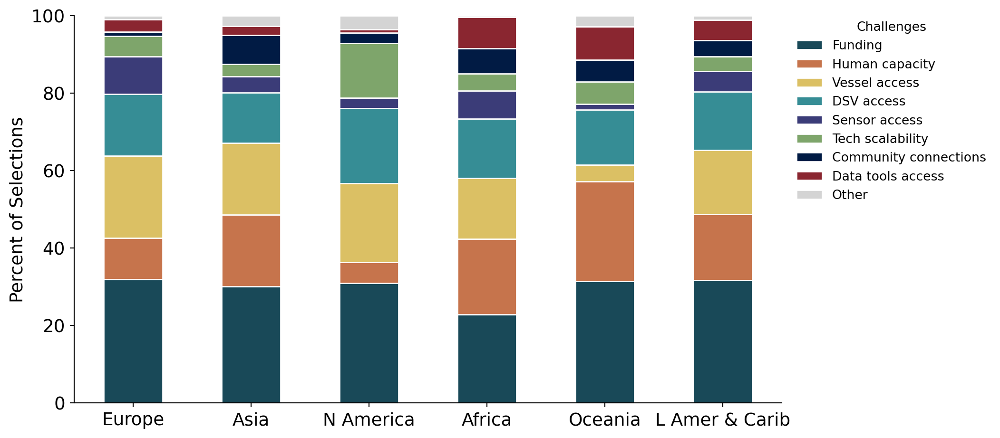

In [57]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_08,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              labels=['Funding',
                      'Human capacity',
                      'Vessel access',
                      'DSV access',
                      'Sensor access',
                      'Tech scalability',
                      'Community connections',
                      'Data tools access',
                      'Other'],
              title='Challenges', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='I')

## Fig J - Q34: Opportunities

In [58]:
## Calculate values for plot

opportunities = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    opportunities[region] = dataR[region].loc[(dataR[region]['question'] == 'Q34') &
                  (dataR[region]['selection_survey_clean'] != ''),
                         ['respondent_id', 'subregion', 'selection_survey_clean']].copy()  
    
    covariate = 'subregion'

    fig_data[region] = (opportunities[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)
    # Sort subregions as Katy specified
    sorted_cols = ['Training opportunities',
                   'Less expensive data collection technologies',
                   'Better data access and analysis tools',
                   'Networking/connecting with others',
                   'Better/more precise data collection technologies',
                   'Technology that can go deeper',
                   'Scalable platforms & sensors',
                   'Other']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols, createmissingcolumns=True)

In [59]:
## Calculate statistics

for region in region_list:
    count_data = (opportunities[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')
    pivoted.loc['Total'] = pivoted.sum()

    pivoted = prep_fig_data_for_plotting(pivoted, region)
    # Sort subregions as Katy specified
    sorted_cols = ['Training opportunities',
                   'Less expensive data collection technologies',
                   'Better data access and analysis tools',
                   'Networking/connecting with others',
                   'Better/more precise data collection technologies',
                   'Technology that can go deeper',
                   'Scalable platforms & sensors',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    display(pivoted)

selection_survey_clean,Training opportunities,Less expensive data collection technologies,Better data access and analysis tools,Networking/connecting with others,Better/more precise data collection technologies,Technology that can go deeper,Scalable platforms & sensors,Other,Total
subregion,,,,,,,,,
Europe,15,17,10,11,14,12,12,2,93
Asia,42,45,31,41,34,35,29,3,260
N America,11,29,16,13,15,17,18,1,120
Africa,90,55,60,59,62,60,43,4,433
Oceania,14,12,13,9,15,11,8,3,85
L Amer & Carib,68,54,47,42,34,32,28,10,315


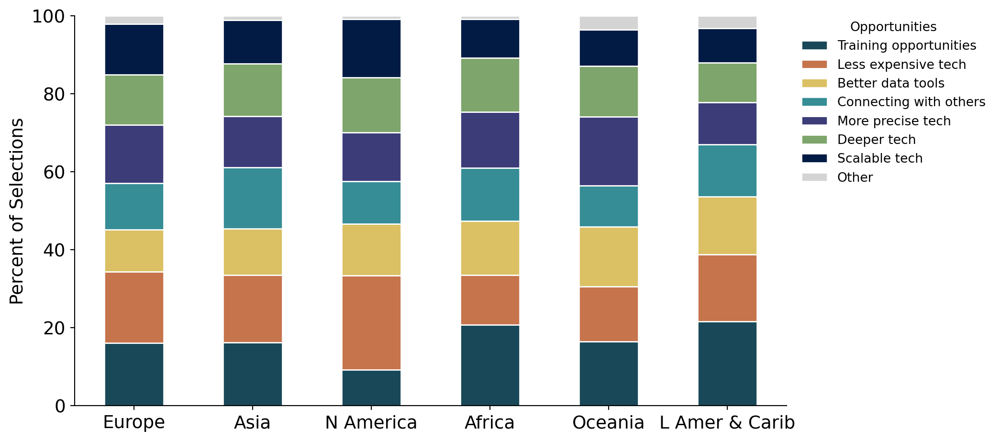

In [60]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_07,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              labels=['Training opportunities',
                      'Less expensive tech',
                      'Better data tools',
                      'Connecting with others',
                      'More precise tech',
                      'Deeper tech',
                      'Scalable tech',
                      'Other'],
              title='Opportunities', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='J')

---
# **Section 5**

## Fig AA - Marine industries (research)

In [61]:
## Calculate values for plot
industries = {}
num_areas_per_subregion = {}
label_order = {}
fig_data = {}
for region in region_list:
    industries[region] = researchR[region].loc[(researchR[region]['question'] == 'Q10') &
                          (researchR[region]['col_name'] != 'Q10_comments'), ['subregion', 
                                                                     'geoarea',
                                                                     'col_name', 
                                                                     'research_tech_clean']]
    industries[region]['selection_binary'] = industries[region]['research_tech_clean']
    
    # Aggregate selections
    industries[region].loc[industries[region]['col_name'] == 'Q10_aquaculture',   'col_name'] = 'Q10_fisheries'
    industries[region].loc[industries[region]['col_name'] == 'Q10_biotechnology', 'col_name'] = 'Q10_research'
    industries[region].loc[industries[region]['col_name'] == 'Q10_shipping',      'col_name'] = 'Q10_transport'
    
    # Drop duplicates to accomodate "OR" logic
    industries[region].drop_duplicates(inplace=True)
    display(industries[region])
    
    fig_data[region] = (industries[region].groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion[region] = industries[region].groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion[region].index, num_areas_per_subregion[region].values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q10_fisheries':        'Fisheries & Aquaculture',
        'Q10_transport':        'Marine Transportation',
        'Q10_tourism':          'Tourism',
        'Q10_conservation':     'Conservation & Protection',
        'Q10_offshore_oil':     'Offshore Oil & Gas',
        'Q10_safety':           'Safety & Surveillance',
        'Q10_construction':     'Marine Construction',
        'Q10_research':         'Marine R&D',
        'Q10_renewable_energy': 'Ocean Renewable Energy',
        'Q10_mining':           'Deep-sea Mining',
    }
    fig_data[region]['col_name'].replace(renames, inplace=True)
    hue_order = renames.values()

    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'conservation'):('count', 'transport')].sum()
    pivoted.loc['Total', ('percent', 'conservation'):('percent', 'transport')] = \
        ((pivoted.loc['Total', ('count', 'conservation'):('count', 'transport')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

,subregion,geoarea,col_name,research_tech_clean,selection_binary
2,Europe,Albania,Q10_mining,0,0
3,Europe,Albania,Q10_renewable_energy,0,0
4,Europe,Albania,Q10_research,0,0
34,Africa,Algeria,Q10_mining,0,0
62,Oceania,American Samoa,Q10_research,0,0
...,...,...,...,...,...
8427,Asia,Yemen,Q10_fisheries,1,1
8428,Asia,Yemen,Q10_conservation,1,1
8430,Asia,Yemen,Q10_offshore_oil,1,1
8431,Asia,Yemen,Q10_safety,1,1


count                  \
col_name       Conservation & Protection Deep-sea Mining   
subregion                                                  
Africa                              42.0             0.0   
Asia                                28.0             2.0   
Europe                              22.0             5.0   
L Amer & Carib                      44.0             0.0   
N America                            5.0             1.0   
Oceania                             22.0             0.0   
Total                              163.0             8.0   

                                                                       \
col_name       Fisheries & Aquaculture Marine Construction Marine R&D   
subregion                                                               
Africa                            43.0                36.0       38.0   
Asia                              30.0                26.0       22.0   
Europe                            22.0                23.0       19.0   
L Amer & Carib                    49.0                38.0       30.0   
N America                          5.0                 4.0        4.0   
Oceania                           27.0                10.0       18.0   
Total                            176.0               137.0      131.0   

                                                             \
col_name       Marine Transportation Ocean Renewable Energy   
subregion                                                     
Africa                          44.0                   25.0   
Asia                            30.0                   11.0   
Europe                          23.0                   12.0   
L Amer & Carib                  49.0                   14.0   
N America                        5.0                    4.0   
Oceania                         27.0                    9.0   
Total                          178.0                   75.0   

                                                                 \
col_name       Offshore Oil & Gas Safety & Surveillance Tourism   
subregion                                                         
Africa                       32.0                  40.0    40.0   
Asia                         21.0                  22.0    25.0   
Europe                       11.0                  23.0    23.0   
L Amer & Carib               13.0                  32.0    48.0   
N America                     2.0                   5.0     5.0   
Oceania                       7.0                  20.0    24.0   
Total                        86.0                 142.0   165.0   

                                 percent                  \
col_name       Conservation & Protection Deep-sea Mining   
subregion                                                  
Africa                             95.45            0.00   
Asia                               93.33            6.67   
Europe                             95.65           21.74   
L Amer & Carib                     88.00            0.00   
N America                         100.00           20.00   
Oceania                            78.57            0.00   
Total                             551.00           48.41   

                                                                       \
col_name       Fisheries & Aquaculture Marine Construction Marine R&D   
subregion                                                               
Africa                           97.73               81.82      86.36   
Asia                            100.00               86.67      73.33   
Europe                           95.65              100.00      82.61   
L Amer & Carib                   98.00               76.00      60.00   
N America                       100.00               80.00      80.00   
Oceania                          96.43               35.71      64.29   
Total                           587.81              460.20     446.59   

                                                             \
col_na

In [62]:
## Percent of areas in subregion that have all industry types

for region in region_list:
    num_types = (industries[region].groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    num_types['has_all'] = 0
    num_types.loc[num_types['num_types'] == 10, 'has_all'] = 1

    all_types = num_types.groupby('subregion')['has_all'].sum().reset_index()
    all_types['total'] = num_areas_per_subregion[region].values
    all_types['percent'] = round((all_types['has_all']/all_types['total'])*100, 2)

    display(all_types)

    ## Percent of areas in subregion that have < 3 industry types
    num_types['less_than_3'] = 0
    num_types.loc[num_types['num_types'] < 3, 'less_than_3'] = 1

    few_types = num_types.groupby('subregion')['less_than_3'].sum().reset_index()
    few_types['total'] = num_areas_per_subregion[region].values
    few_types['percent'] = round((few_types['less_than_3']/few_types['total'])*100, 2)

    display(few_types)

,subregion,has_all,total,percent
0,Africa,0,44,0.00
1,Asia,0,30,0.00
2,Europe,3,23,13.04
3,Latin America and the Caribbean,0,50,0.00
4,Northern America,1,5,20.00
5,Oceania,0,28,0.00


,subregion,less_than_3,total,percent
0,Africa,0,44,0.00
1,Asia,1,30,3.33
2,Europe,0,23,0.00
3,Latin America and the Caribbean,0,50,0.00
4,Northern America,0,5,0.00
5,Oceania,1,28,3.57


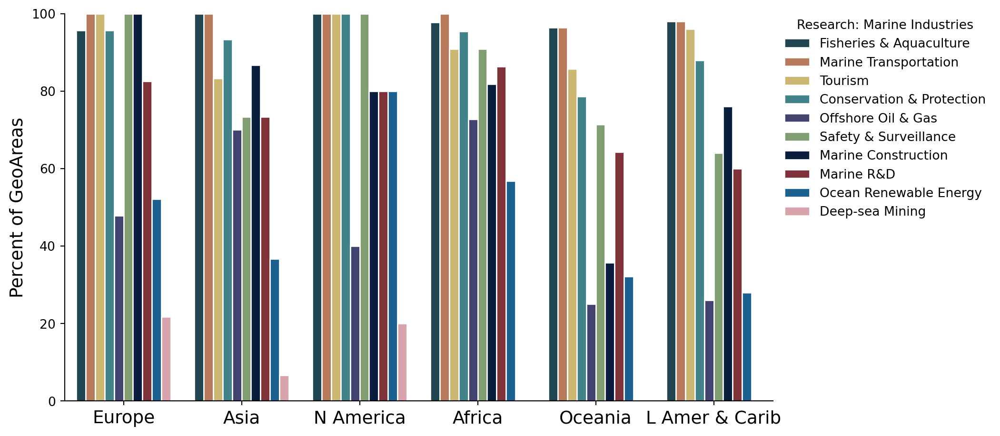

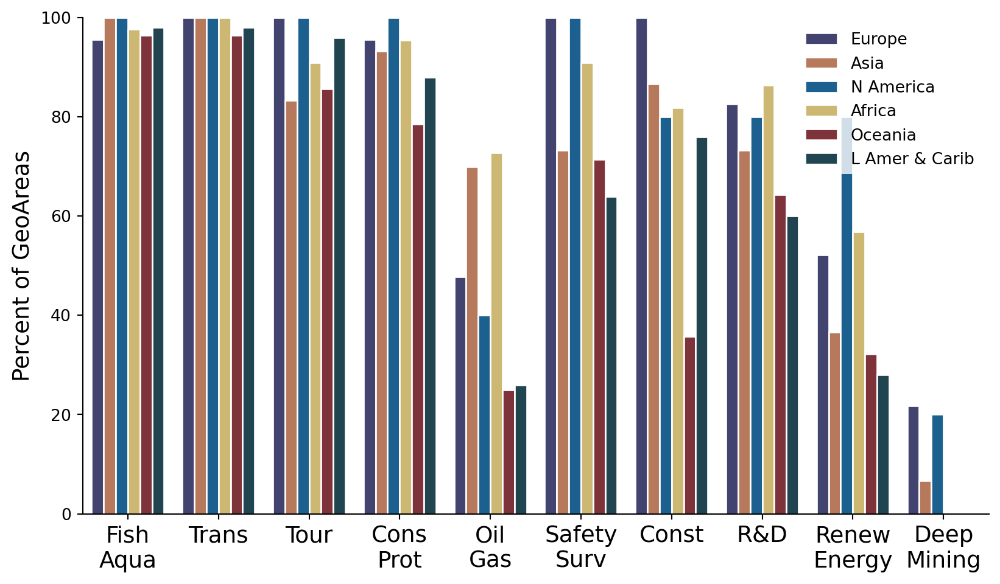

In [63]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_10,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Marine Industries',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA1')

    ### AA1b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(["Fish\nAqua", "Trans", "Tour", "Cons\nProt", "Oil\nGas", "Safety\nSurv", "Const", "R&D", "Renew\nEnergy", "Deep\nMining"], rotation=0, fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)

    xaxis_key = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining'
    ]

    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)
                  
    outputfigs(plt, fig, ax, region, section='5', letter='AA1b')

Marine industries (survey)

In [64]:
### Calculate values for plot
industries = {}
label_order = {}
fig_data = {}
num_areas_per_subregion = {}
for region in region_list:
    industries[region] = dataR[region].loc[(dataR[region]['question'] == 'Q10'), ['subregion', 
                                                  'geoarea',
                                                  'selection_survey_clean']]

    industries[region] = industries[region][industries[region]['selection_survey_clean'] != '']

    fig_data[region] = (industries[region].groupby(['subregion', 'selection_survey_clean'])['geoarea']
                .count()
                .rename('count')
                .reset_index())
    
    hue_order = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining',
        'Other'
    ]

    country_num_survey = country_tableR[region].groupby(['subregion'])[['subregion', 'num_survey']].sum()
    display(country_num_survey)

    num_survey_dict = dict(zip(country_num_survey.index, country_num_survey.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_survey_dict, inplace=True)
    display(fig_data[region])

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)
    display(fig_data[region])


    if industries[region].shape[0] == 0:
        print('zero results for region', region, 'skipping it', file=sys.stderr)
        continue
    pivoted = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_in_region = pivoted.loc['Total', ('count', 'Deep sea mining'):('count', 'Tourism')].sum()
    pivoted.loc['Total', ('percent', 'Deep sea mining'):('percent', 'Tourism')] = \
        ((pivoted.loc['Total', ('count', 'Deep sea mining'):('count', 'Tourism')]/total_in_region).values)*100

    out = round(pivoted['count'], 2)
    display(Markdown('**'+region+'**'), out)

,num_survey
subregion,
Africa,101
Asia,75
Europe,33
Latin America and the Caribbean,90
Northern America,38
Oceania,23


,subregion,selection_survey_clean,count,total
0,Africa,Conservation & Protection,61,101
1,Africa,Deep-sea Mining,17,101
2,Africa,Fisheries & Aquaculture,94,101
3,Africa,Marine Construction,29,101
4,Africa,Marine R&D,28,101
...,...,...,...,...
63,Oceania,Ocean Renewable Energy,7,23
64,Oceania,Offshore Oil & Gas,7,23
65,Oceania,Other,5,23
66,Oceania,Safety & Surveillance,14,23


,subregion,selection_survey_clean,count,total,percent
0,Africa,Conservation & Protection,61,101,60.40
1,Africa,Deep-sea Mining,17,101,16.83
2,Africa,Fisheries & Aquaculture,94,101,93.07
3,Africa,Marine Construction,29,101,28.71
4,Africa,Marine R&D,28,101,27.72
...,...,...,...,...,...
63,Oceania,Ocean Renewable Energy,7,23,30.43
64,Oceania,Offshore Oil & Gas,7,23,30.43
65,Oceania,Other,5,23,21.74
66,Oceania,Safety & Surveillance,14,23,60.87


**Global**

selection_survey_clean,Conservation & Protection,Deep-sea Mining,Fisheries & Aquaculture,Marine Construction,Marine R&D,Marine Transportation,None of the above,Ocean Renewable Energy,Offshore Oil & Gas,Other,Safety & Surveillance,Tourism
subregion,,,,,,,,,,,,
Africa,61.0,17.0,94.0,29.0,28.0,84.0,3.0,11.0,50.0,2.0,43.0,57.0
Asia,42.0,15.0,72.0,43.0,45.0,69.0,1.0,21.0,52.0,4.0,37.0,52.0
Europe,21.0,10.0,32.0,23.0,25.0,29.0,NaN,24.0,19.0,NaN,18.0,28.0
L Amer & Carib,53.0,3.0,84.0,31.0,26.0,76.0,1.0,6.0,52.0,1.0,26.0,68.0
N America,34.0,19.0,37.0,36.0,36.0,36.0,NaN,35.0,37.0,3.0,36.0,33.0
Oceania,23.0,5.0,23.0,7.0,10.0,22.0,NaN,7.0,7.0,5.0,14.0,20.0
Total,234.0,69.0,342.0,169.0,170.0,316.0,5.0,104.0,217.0,15.0,174.0,258.0


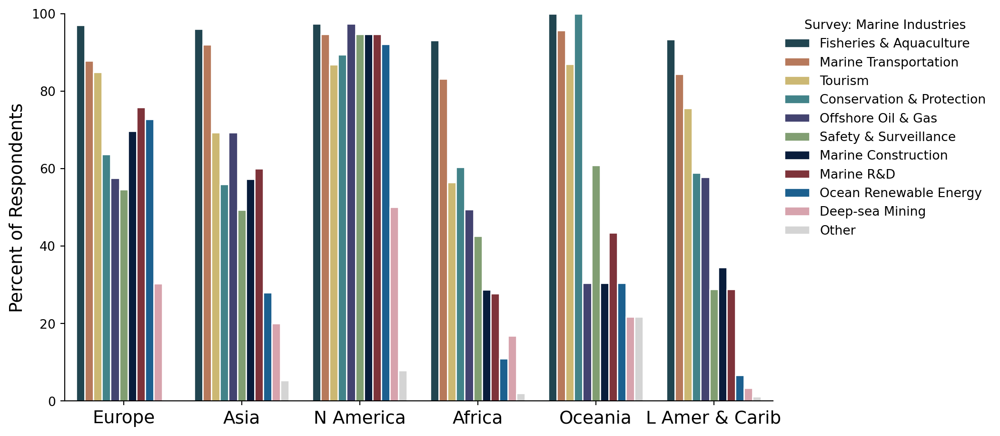

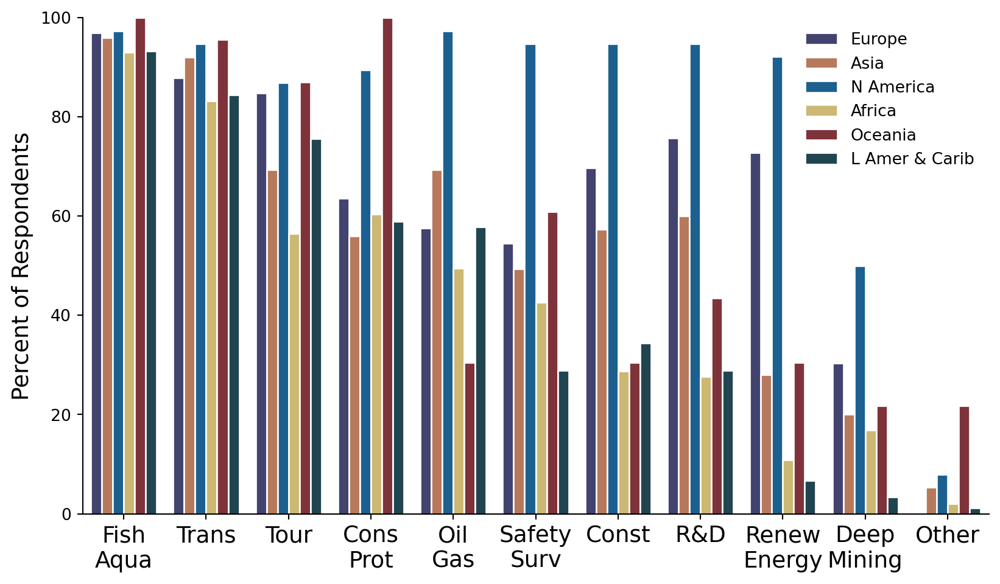

In [65]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                 y='percent',
                 hue='selection_survey_clean',
                 order=label_order[region],
                 hue_order=hue_order,
                 palette=cat_10,
                 edgecolor='white',
                 ci=None,
                 data=fig_data[region][fig_data[region]['selection_survey_clean'] != 'None of the above'])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),
          labels=hue_order,
          title='Survey: Marine Industries',
          fontsize=10,
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA2')

    ### AA2b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                 y='percent',
                 hue='subregion',
                 order=hue_order,
                 hue_order=label_order[region],
                 palette=cat_d23e123_by_region[region],
                 edgecolor='white',
                 ci=None,
                 data=fig_data[region][fig_data[region]['selection_survey_clean'] != 'None of the above'])            

    ax.set_xticklabels(["Fish\nAqua",
                        "Trans",
                        "Tour",
                        "Cons\nProt",
                        "Oil\nGas",
                        "Safety\nSurv",
                        "Const",
                        "R&D",
                        "Renew\nEnergy",
                        "Deep\nMining",
                        "Other"],
                       rotation=0,
                       fontsize=14)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),
          labels=['Fisheries & Aquaculture',
                  'Marine Transportation',
                  'Tourism',
                  'Conservation & Protection',
                  'Offshore Oil & Gas',
                  'Safety & Surveillance',
                  'Marine Construction',
                  'Marine R&D',
                  'Ocean Renewable Energy',
                  'Deep-sea Mining',
                  'Other'],
          title='Survey: Marine Industries',
          fontsize=10,
          title_fontsize=10)

    xaxis_key = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining'
    ]

    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA2b')

In [66]:
# Select relevant data for bar plot
research_q7q8q9 = {}
orgtype_count = {}
for region in region_list:
    research_q7q8q9[region] = researchR[region].loc[researchR[region]['question'].isin(['Q7', 'Q8', 'Q9'])]
    print(research_q7q8q9[region].shape)

    orgtype_count[region] = (
        research_q7q8q9[region].loc[research_q7q8q9[region]['research_org_clean'] != 'FALSE', 
                        ['geoarea', 'subregion', 'research_org_clean']]
                                .copy()
                                #.drop_duplicates() # no!
                                .groupby(['subregion', 'research_org_clean'])['geoarea']
                                #.nunique() # nope!
                                .count()
                                .rename('count')
                                .reset_index())

    display(orgtype_count[region])

(2136, 33)


,subregion,research_org_clean,count
0,Africa,gov,230
1,Africa,lab,177
2,Africa,org,175
3,Asia,gov,130
4,Asia,lab,145
5,Asia,org,57
6,Europe,gov,120
7,Europe,lab,136
8,Europe,org,66
9,Latin America and the Caribbean,gov,182


In [67]:
fig_data = {}
for region in region_list:
    fig_data[region] = pd.pivot_table(data=orgtype_count[region], index=['subregion'], columns=['research_org_clean'], values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    display(fig_data[region])

research_org_clean,gov,lab,org
subregion,,,
Europe,120,136,66
Asia,130,145,57
N America,31,50,32
Africa,230,177,175
Oceania,58,46,34
L Amer & Carib,182,152,106


In [68]:
# Select relevant data for line plot

fig_data_2 = {}
for region in region_list:
    country_survey_and_research_geo = country_tableR[region][['subregion','num_survey','num_research_geo']]
    country_survey_and_research_geo.set_index('subregion')

    fig_data_2[region] = country_survey_and_research_geo[['subregion','num_survey','num_research_geo']].groupby('subregion').sum()

    surveys_plus_research = fig_data_2[region][['num_survey','num_research_geo']].sum(axis=1)
    fig_data_2[region]['total'] = surveys_plus_research

    fig_data_2[region] = prep_fig_data_for_plotting(fig_data_2[region], region)
    display(fig_data_2[region])


,num_survey,num_research_geo,total
subregion,,,
Europe,33,23,56
Asia,75,30,105
N America,38,5,43
Africa,101,44,145
Oceania,23,28,51
L Amer & Carib,90,50,140


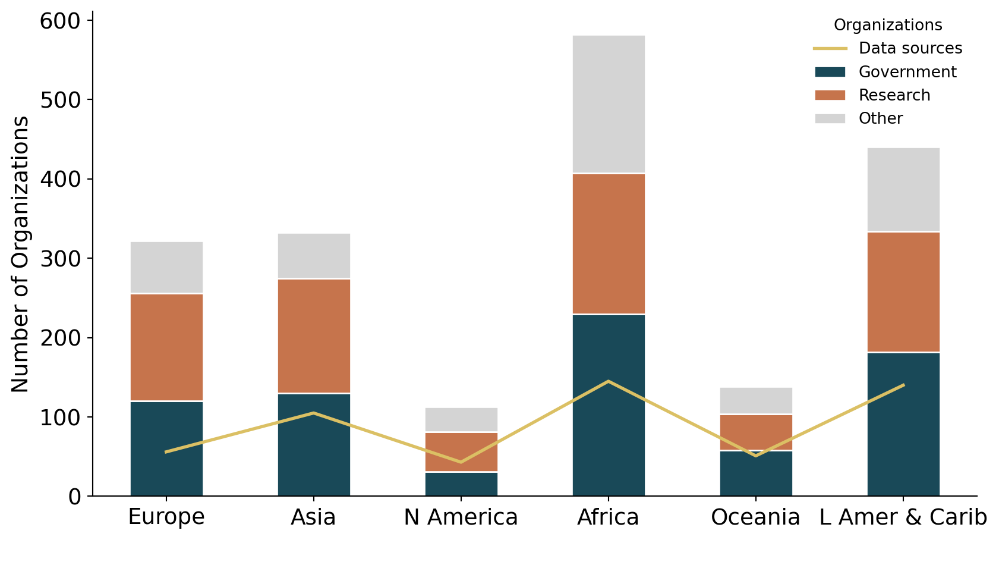

In [69]:
### Create plots

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    
    fig_data[region].plot(kind='bar', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_02,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          labels=['Sovereign Country', 
                  'Dependent Territory'], title='GeoArea Status', fontsize=10, title_fontsize=10)


    sns.lineplot(x='subregion',
                  y='total',
                  color='#DBC064',
                  linewidth=2,
                  ci=None,
                  data=fig_data_2[region])

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_xlabel(' ', fontsize=14)
    ax.set_ylabel('Number of Organizations', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),          
          labels=['Data sources',
                  'Government', 'Research', 'Other'],
          title='Organizations',
          fontsize=10,
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA3')

## Fig AB1 - DSC Access / Presence / Satisfaction

[1080, 625, 625, 625, 625, 320, 320, 320, 320, 320, 320, 135, 135, 135, 135, 135, 135, 135, 135, 40, 40]


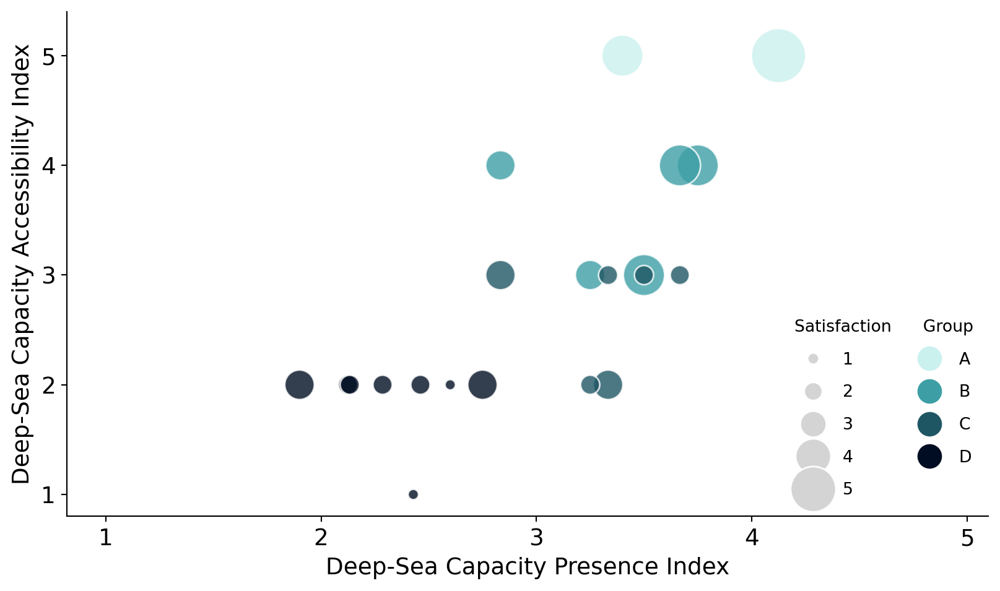

In [70]:
## Calculate fig data

fig_data = {}
for region in region_list:
    dsc_pi_means = (country_tableR[region]
                .groupby('subregion_orig')['dsc-pi-all']
                .mean()
                .rename('dsc-pi-mean'))
    dsc_ai = (country_tableR[region]
                .groupby('subregion_orig')['dsc-ai-all']
                .mean()
                .rename('dsc-ai-mean'))
    dsc_si = (country_tableR[region]
                .groupby('subregion_orig')['dsc-si-all']
                .mean()
                .fillna(0)
                .astype(int)
                .rename('dsc-si-mean'))
    dsc_group = (country_tableR[region].loc[country_tableR[region]['dsc-index-group'].notna()]
                .groupby('subregion_orig')[['subregion_orig', 'dsc-index-group']]
                .head(1))
    dsc_group = dsc_group.set_index('subregion_orig')
        
    fig_data[region] = pd.concat([dsc_pi_means, dsc_ai, dsc_si, dsc_group], axis=1)
    drops = []
    for key in ignoreR:
        drops += ignoreR[key]
    fig_data[region] = fig_data[region].drop(drops, errors='ignore')
    
    nancount = fig_data[region].isnull().sum().sum()
    if nancount > 0:
        print('warning: found {} NaNs in the data for region {}, dropping rows with NaN'.format(nancount, region), file=sys.stderr)
        rows_before = fig_data[region].shape[0]
        fig_data[region] = fig_data[region].dropna()
        rows_after = fig_data[region].shape[0]
        print('warning: dropped {} rows with NaN for region {}'.format(rows_before - rows_after, region), file=sys.stderr)
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dsc-si-mean', ascending=False)


## Plot figure

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dsc-si-mean'].tolist()]
    print(sizes)
    groups=['A', 'B', 'C', 'D']
    colors = [groups.index(x) for x in fig_data[region]['dsc-index-group'].tolist()]

    fig_data[region].plot('dsc-pi-mean', 'dsc-ai-mean', kind='scatter', 
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors,
                  cmap=matplotlib.colors.ListedColormap(val_04_rev),
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)

    ax.set_xlabel('Deep-Sea Capacity Presence Index', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Deep-Sea Capacity Accessibility Index', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.1)
    plt.ylim(0.8,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    for i in range(0,4):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_04_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Satisfaction      Group',
                             bbox_to_anchor=(1, 0.42),
                             loc='upper right'))

    outputfigs(plt, fig, ax, region, section='5', letter='AB1')

## Fig AB1b

In [71]:
## Calculate fig data

regions_to_skip = ['Global', 'Economies', 'SIDS']

dsc_pi_means = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-pi-all']
            .mean()
            .rename('dsc-pi-mean'))
dsc_ai = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-ai-all']
            .mean()
            .rename('dsc-ai-mean'))
dsc_si = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-si-all']
            .mean()
            .fillna(0)
            .astype(int)
            .rename('dsc-si-mean'))
dsc_group = (country_tableR['Global'].loc[country_tableR['Global']['dsc-index-group'].notna()]
            .groupby('subregion_orig')[['subregion_orig', 'dsc-index-group']]
            .head(1))
dsc_group = dsc_group.set_index('subregion_orig')

fig_data_global = pd.concat([dsc_pi_means, dsc_ai, dsc_si, dsc_group], axis=1)
drops = []
for key in ignoreR:
    drops += ignoreR[key]
fig_data_global = fig_data_global.drop(drops, errors='ignore')

colors = {}
fig_data = {}
for region in region_list:
    if region in regions_to_skip:
        print('Skipping region', region);
        continue

    fig_data[region] = fig_data_global.copy()
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dsc-si-mean', ascending=False)

    groups=['A', 'B', 'C', 'D']
    colors[region] = []
    for index in fig_data[region].index:
        if index in orderR[region]:
            group = fig_data[region].loc[index]['dsc-index-group']
            colors[region].append(val_04_rev[groups.index(group)])
        else:
            colors[region].append('#d4d4d4')


## Plot figure

w = 1920
h = 1080

for region in region_list:
    if region in regions_to_skip:
        continue

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dsc-si-mean'].tolist()]

    fig_data[region].plot('dsc-pi-mean', 'dsc-ai-mean', kind='scatter', 
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors[region],
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Deep-Sea Capacity Presence Index', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Deep-Sea Capacity Accessibility Index', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.1)
    plt.ylim(0.8,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    for i in range(0,4):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_04_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Satisfaction      Group',
                             bbox_to_anchor=(1, 0.42),
                             loc='upper right'))

    outputfigs(plt, fig, ax, region, section='5', letter='AB1b')

Skipping region Global


## Fig AC - Distribution of DSC-PI-vessel presence (country)

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-all,,,,,,
1,1.0,3.0,NaN,5.0,5.0,7.0
2,1.0,5.0,2.0,20.0,11.0,22.0
3,6.0,5.0,1.0,10.0,10.0,11.0
4,9.0,16.0,NaN,9.0,1.0,9.0
5,6.0,1.0,2.0,NaN,1.0,1.0


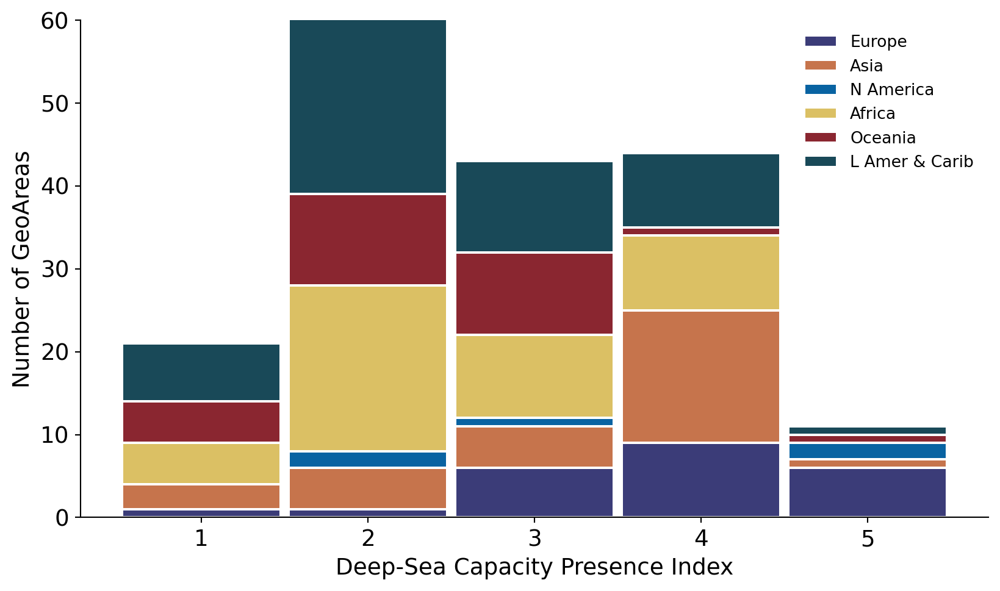

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-vessel,,,,,,
1,NaN,1.0,NaN,NaN,NaN,4.0
2,NaN,2.0,NaN,1.0,8.0,10.0
3,1.0,2.0,1.0,2.0,5.0,13.0
4,6.0,6.0,1.0,10.0,3.0,7.0
5,16.0,19.0,3.0,31.0,12.0,16.0


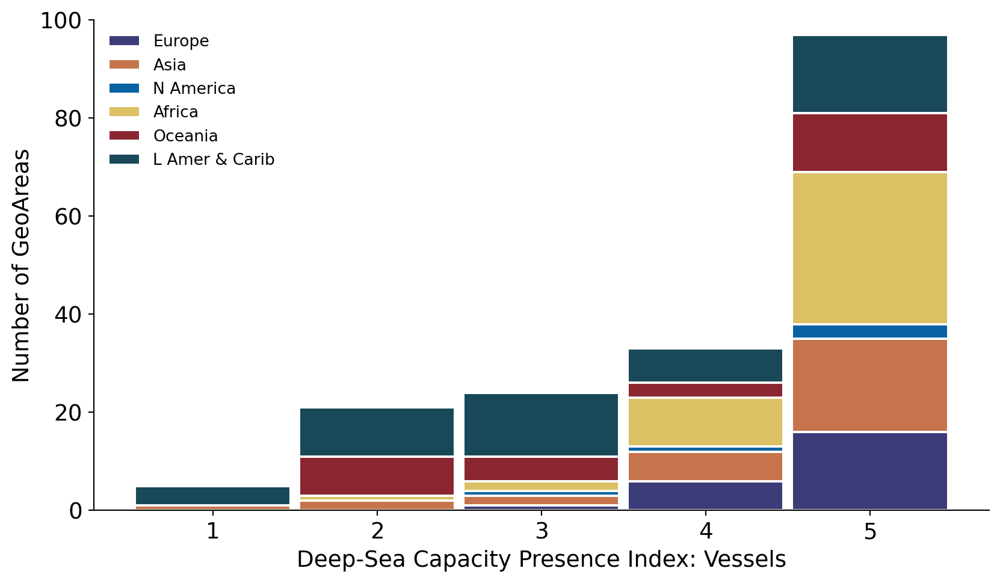

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-dsv,,,,,,
1,5.0,10.0,2.0,34.0,15.0,35.0
2,6.0,2.0,NaN,5.0,6.0,8.0
3,1.0,8.0,1.0,4.0,5.0,3.0
4,4.0,6.0,NaN,NaN,1.0,4.0
5,7.0,4.0,2.0,1.0,1.0,NaN


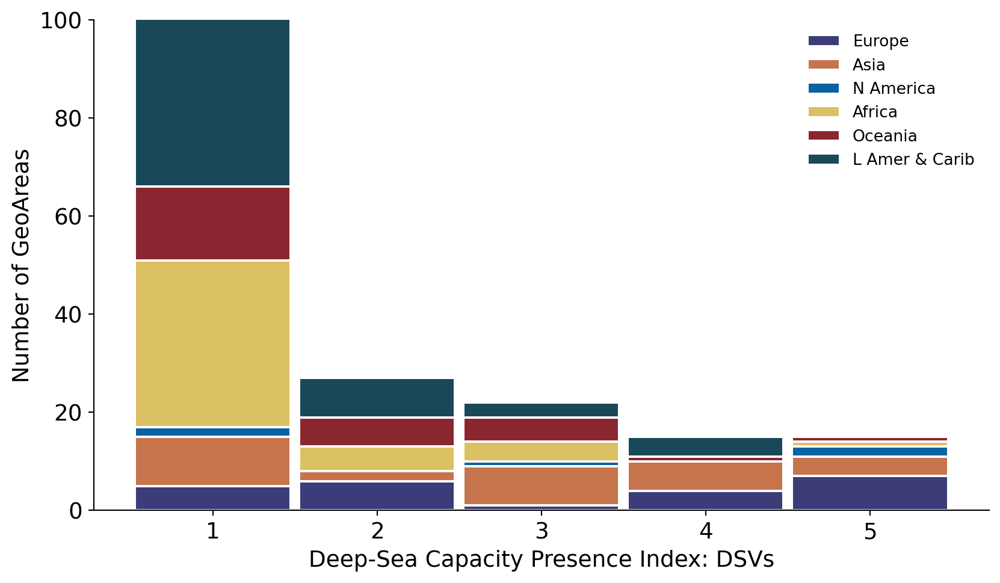

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-sensor,,,,,,
1,2.0,5.0,1.0,23.0,9.0,15.0
2,2.0,2.0,NaN,5.0,1.0,7.0
3,3.0,5.0,1.0,9.0,7.0,13.0
4,NaN,9.0,NaN,1.0,5.0,5.0
5,16.0,9.0,3.0,6.0,6.0,10.0


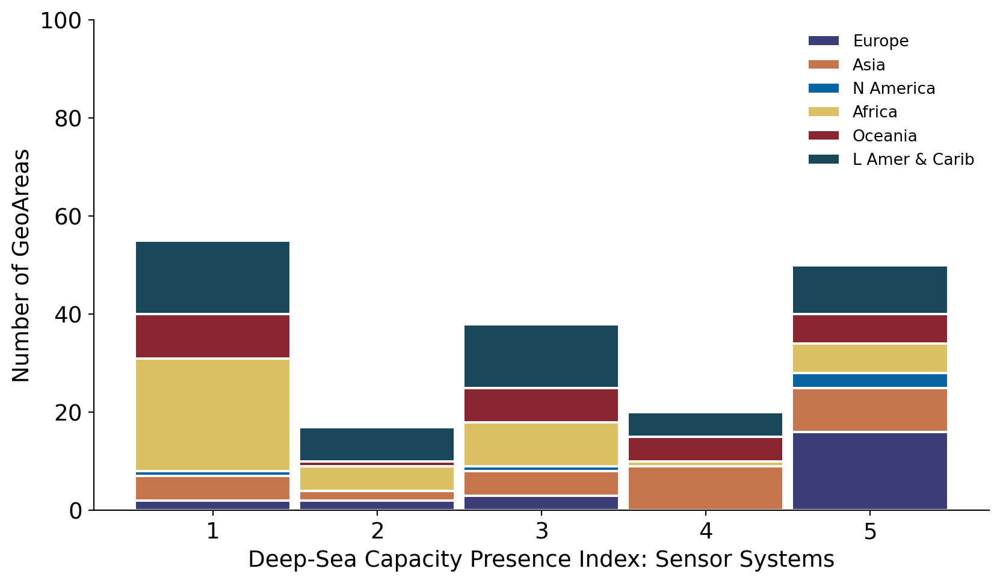

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-data,,,,,,
1,NaN,NaN,1.0,1.0,4.0,6.0
2,NaN,1.0,NaN,6.0,4.0,11.0
3,3.0,5.0,1.0,8.0,9.0,16.0
4,2.0,3.0,NaN,8.0,6.0,5.0
5,18.0,21.0,3.0,21.0,5.0,12.0


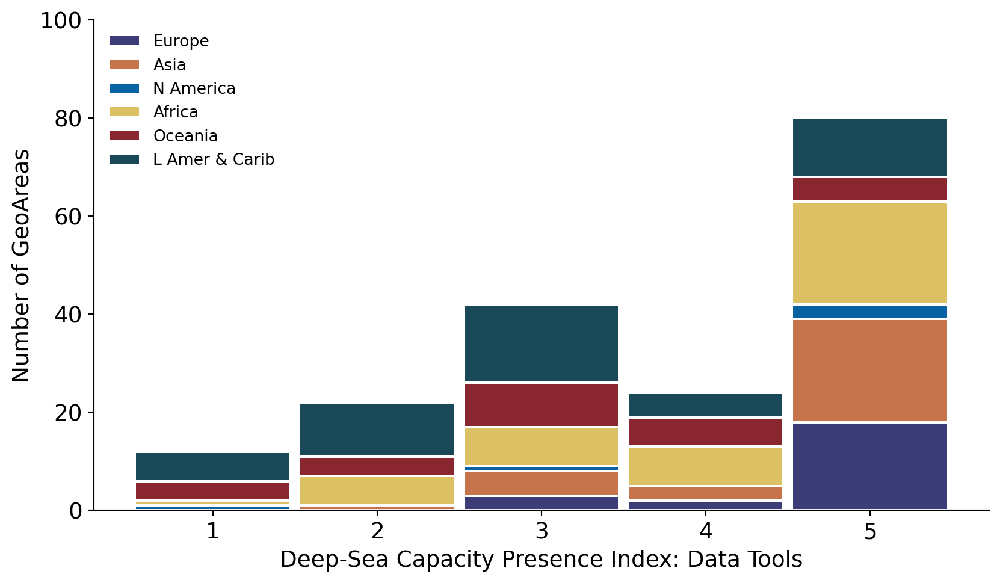

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-org,,,,,,
1,NaN,9.0,NaN,2.0,14.0,14.0
2,2.0,5.0,3.0,3.0,10.0,15.0
3,10.0,6.0,NaN,5.0,3.0,10.0
4,5.0,8.0,NaN,17.0,NaN,6.0
5,6.0,2.0,2.0,17.0,1.0,5.0


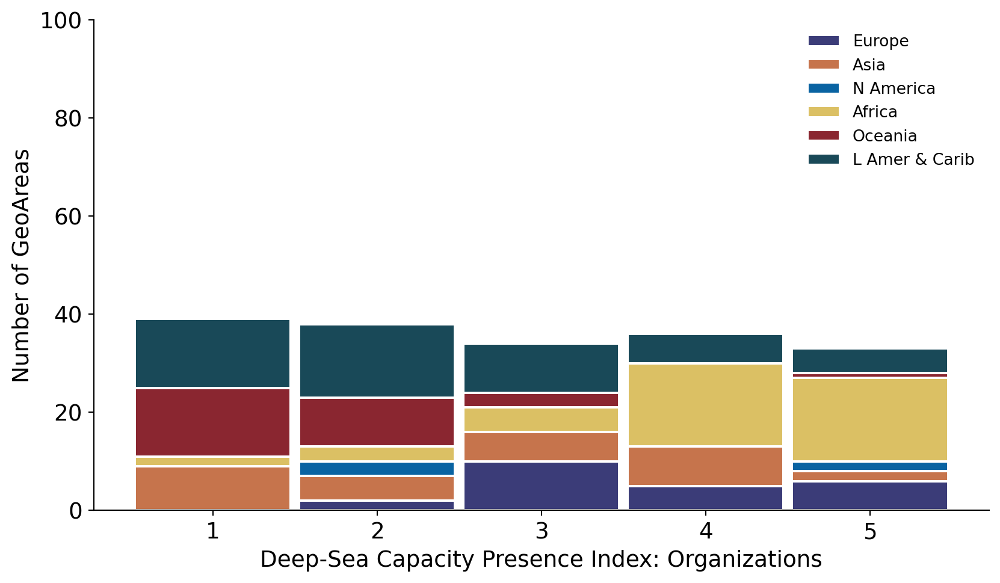

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
dsc-pi-ind,,,,,,
1,NaN,1.0,NaN,NaN,1.0,NaN
2,NaN,3.0,NaN,NaN,4.0,6.0
3,3.0,4.0,NaN,8.0,11.0,20.0
4,11.0,13.0,3.0,21.0,11.0,21.0
5,9.0,9.0,2.0,15.0,1.0,3.0


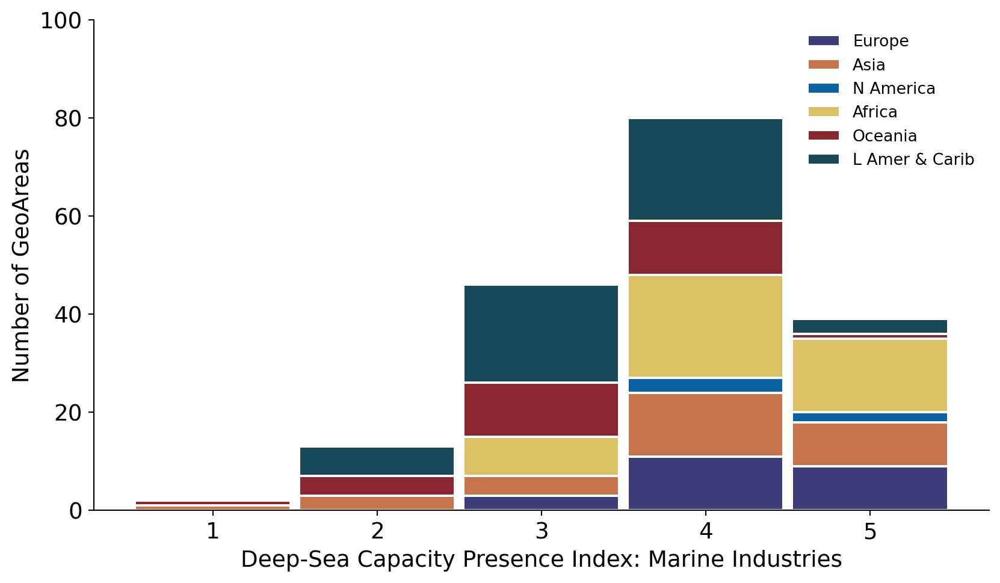

In [72]:
## Calculate fig data

dsc_types = {
    'dsc-pi-all':
        { 'x-label': 'Deep-Sea Capacity Presence Index',
          'y-label': 'Number of GeoAreas',
          'y-limit-override': 60,
          'fig-letter': 'AC1',
        },
    'dsc-pi-vessel':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Vessels',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC2'
        },
    'dsc-pi-dsv':
        { 'x-label': 'Deep-Sea Capacity Presence Index: DSVs',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC3'
        },
    'dsc-pi-sensor':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Sensor Systems',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC4'
        },
    'dsc-pi-data':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Data Tools',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC5'
        },
    'dsc-pi-org':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Organizations',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC6'
        },
    'dsc-pi-ind':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Marine Industries',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC7'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion'])[dsc_type]
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region][dsc_type] = fig_data[region][dsc_type].astype(int)
        fig_data[region] = fig_data[region].pivot(index=dsc_type, columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figure

    w = 1920
    h = 1080
    
    for region in region_list:
        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

        fig_data[region].plot(kind='bar', 
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 100
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

## Fig ACb

In [73]:
## Calculate fig data

dsc_types = {
    'dsc-pi-all':
        { 'x-label': 'Deep-Sea Capacity Presence Index',
          'y-label': 'Number of GeoAreas',
          'y-limit-override': 60,
          'fig-letter': 'AC1b'
        },
    'dsc-pi-vessel':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Vessels',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC2b'
        },
    'dsc-pi-dsv':
        { 'x-label': 'Deep-Sea Capacity Presence Index: DSVs',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC3b'
        },
    'dsc-pi-sensor':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Sensor Systems',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC4b'
        },
    'dsc-pi-data':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Data Tools',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC5b'
        },
    'dsc-pi-org':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Organizations',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC6b'
        },
    'dsc-pi-ind':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Marine Industries',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC7b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion'])[dsc_type]
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r][dsc_type] = fig_data[r][dsc_type].astype(int)
            fig_data[r] = fig_data[r].pivot(index=dsc_type, columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        display(fig_data[region])

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 100
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        colors = []
        edgecolors = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global


## Fig AD & AE - DSC Accessibility/Satisfaction Indexes

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,NaN,1.0,NaN
2,NaN,NaN,NaN,4.0,2.0,3.0
3,2.0,3.0,NaN,1.0,NaN,NaN
4,1.0,1.0,NaN,NaN,1.0,NaN
5,1.0,NaN,1.0,NaN,NaN,NaN


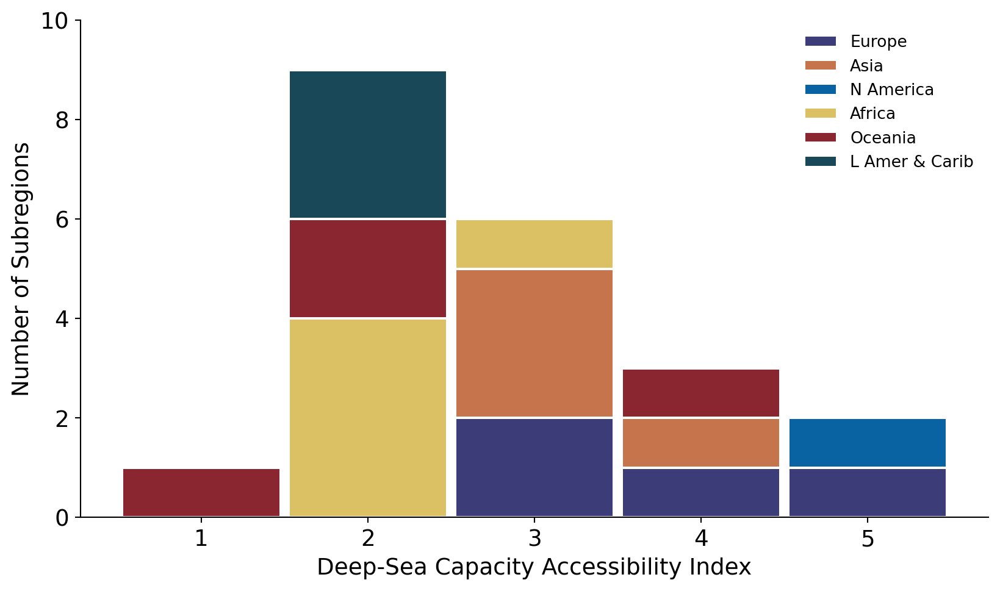

adding empty row for 5


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,1.0,NaN,NaN,NaN,NaN,1.0
2,1.0,4.0,1.0,5.0,3.0,2.0
3,2.0,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,1.0,NaN
5,0.0,0.0,0.0,0.0,0.0,0.0


adding empty row for 5


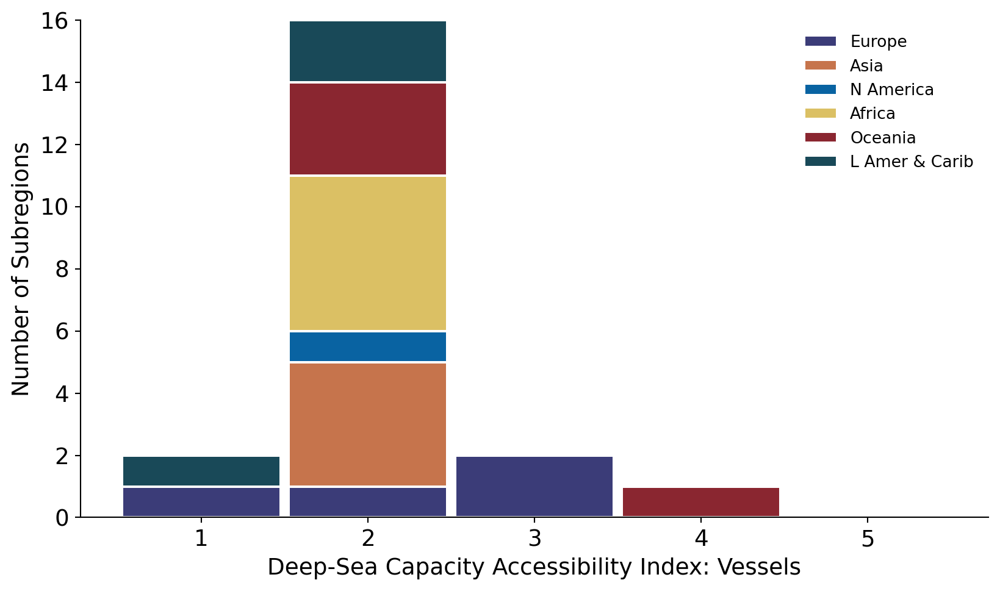

adding empty row for 5


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,1.0,2.0,NaN,4.0,2.0,3.0
2,1.0,2.0,NaN,1.0,NaN,NaN
3,NaN,NaN,NaN,NaN,1.0,NaN
4,2.0,NaN,1.0,NaN,NaN,NaN
5,0.0,0.0,0.0,0.0,0.0,0.0


adding empty row for 5


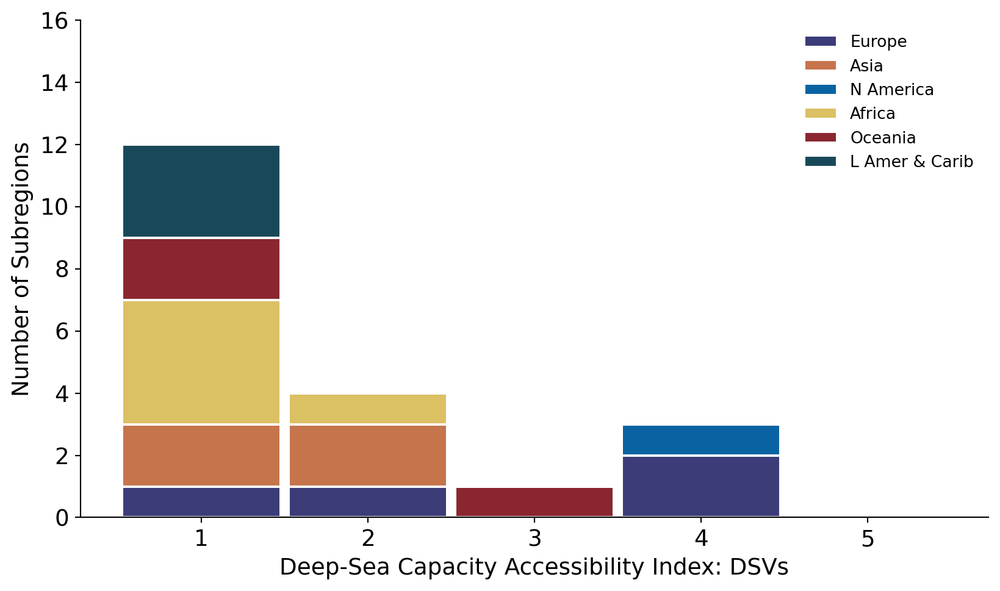

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,NaN,1.0,NaN
2,NaN,NaN,NaN,3.0,1.0,3.0
3,NaN,2.0,NaN,2.0,NaN,NaN
4,3.0,2.0,NaN,NaN,1.0,NaN
5,1.0,NaN,1.0,NaN,NaN,NaN


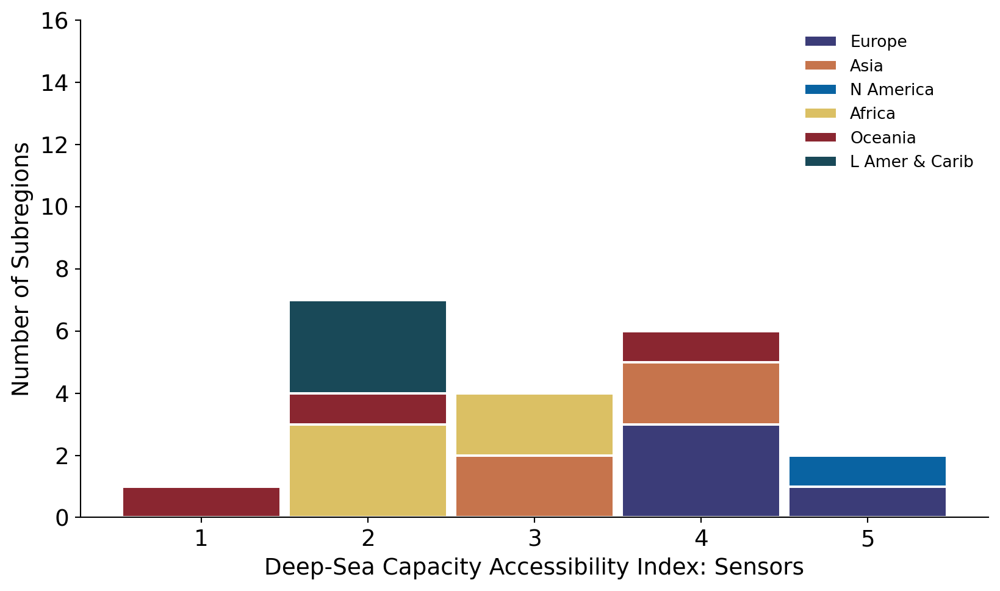

adding empty row for 1


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,NaN,NaN,2.0,1.0,NaN
3,1.0,2.0,NaN,3.0,1.0,3.0
4,NaN,2.0,NaN,NaN,NaN,NaN
5,2.0,NaN,1.0,NaN,1.0,NaN


adding empty row for 1


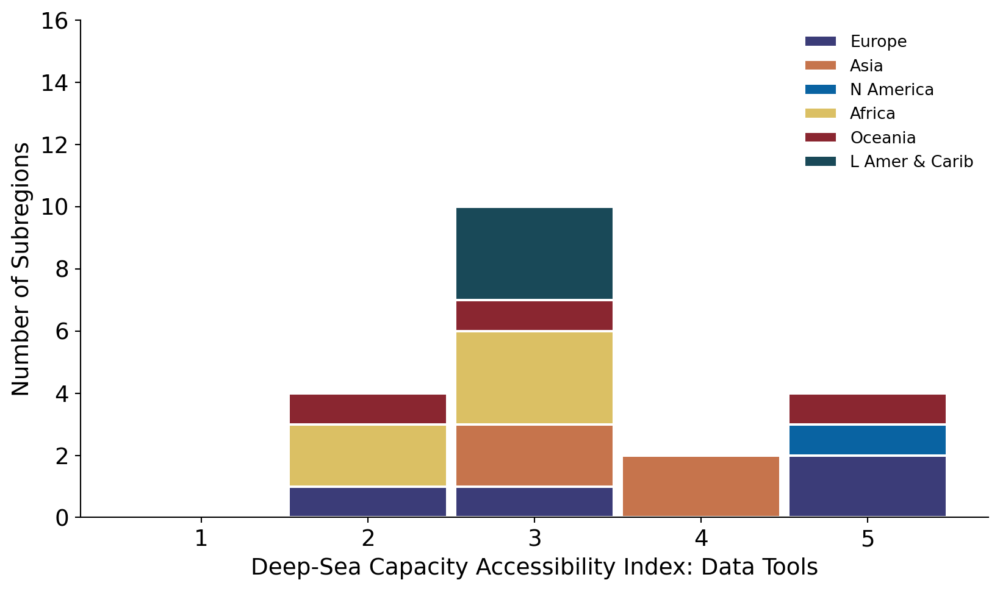

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,NaN,2.0,NaN
2,1.0,1.0,NaN,4.0,NaN,2.0
3,NaN,2.0,NaN,1.0,2.0,1.0
4,2.0,1.0,1.0,NaN,NaN,NaN
5,1.0,NaN,NaN,NaN,NaN,NaN


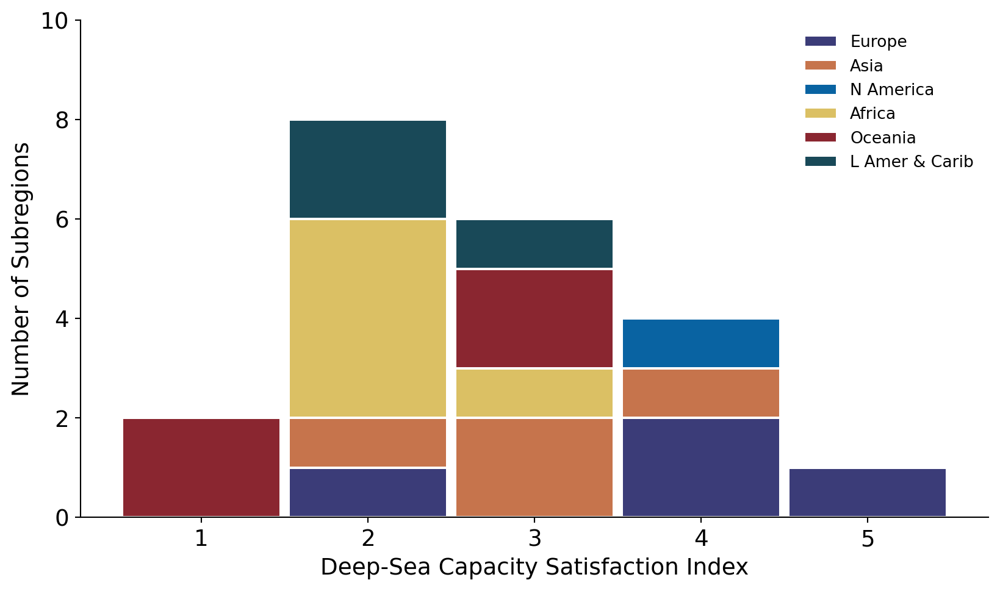

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,1.0,1.0,NaN,3.0,1.0,1.0
2,1.0,1.0,NaN,1.0,2.0,2.0
3,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,NaN,1.0,NaN,NaN,NaN
5,2.0,1.0,NaN,NaN,NaN,NaN


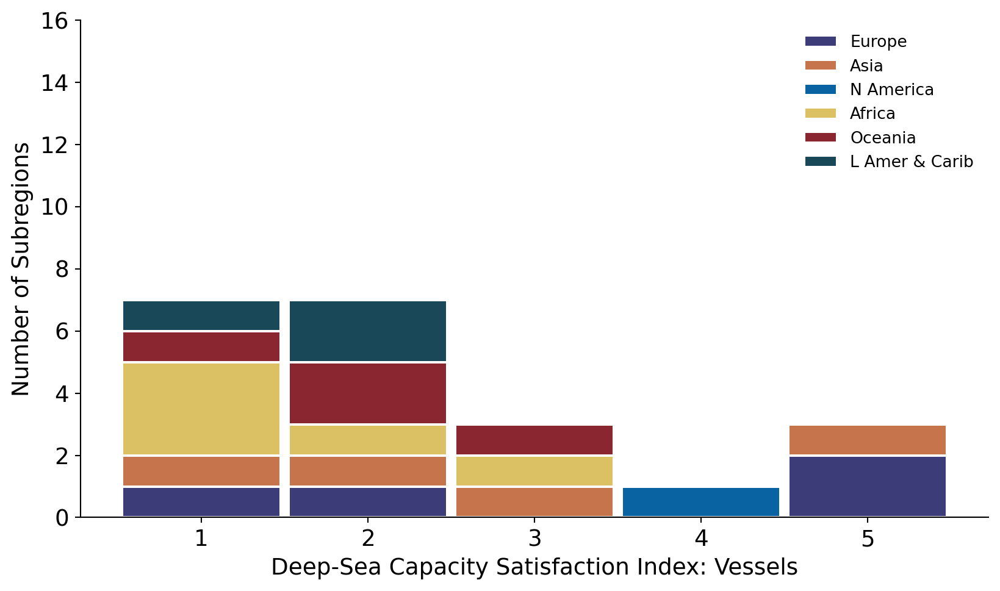

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,1.0,1.0,1.0
2,NaN,4.0,NaN,3.0,NaN,2.0
3,NaN,NaN,NaN,1.0,2.0,NaN
4,2.0,NaN,1.0,NaN,NaN,NaN
5,1.0,NaN,NaN,NaN,NaN,NaN


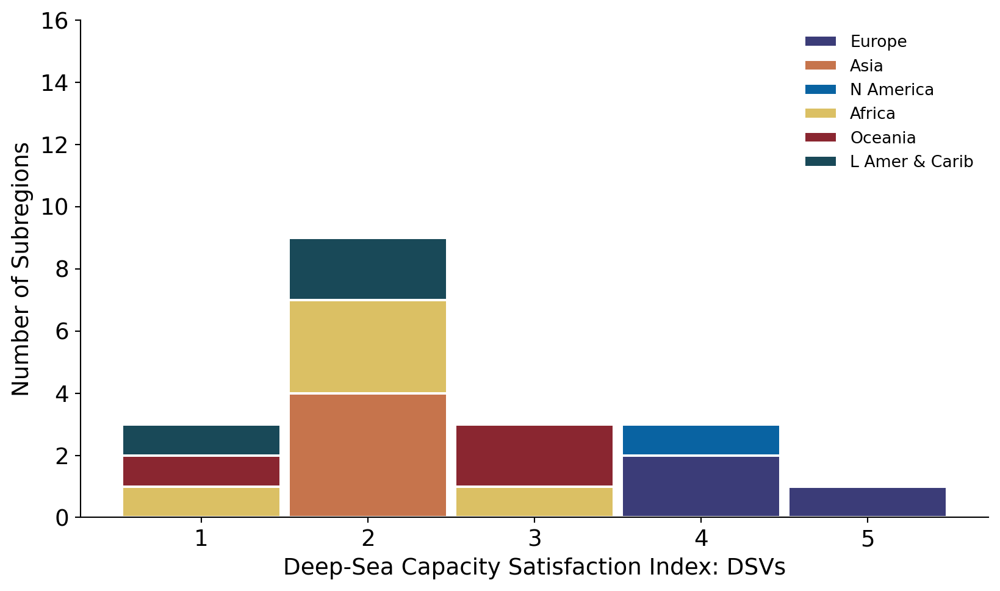

subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,NaN,NaN,1.0
2,NaN,1.0,NaN,4.0,1.0,1.0
3,NaN,1.0,NaN,1.0,1.0,1.0
4,2.0,1.0,1.0,NaN,1.0,NaN
5,2.0,1.0,NaN,NaN,NaN,NaN


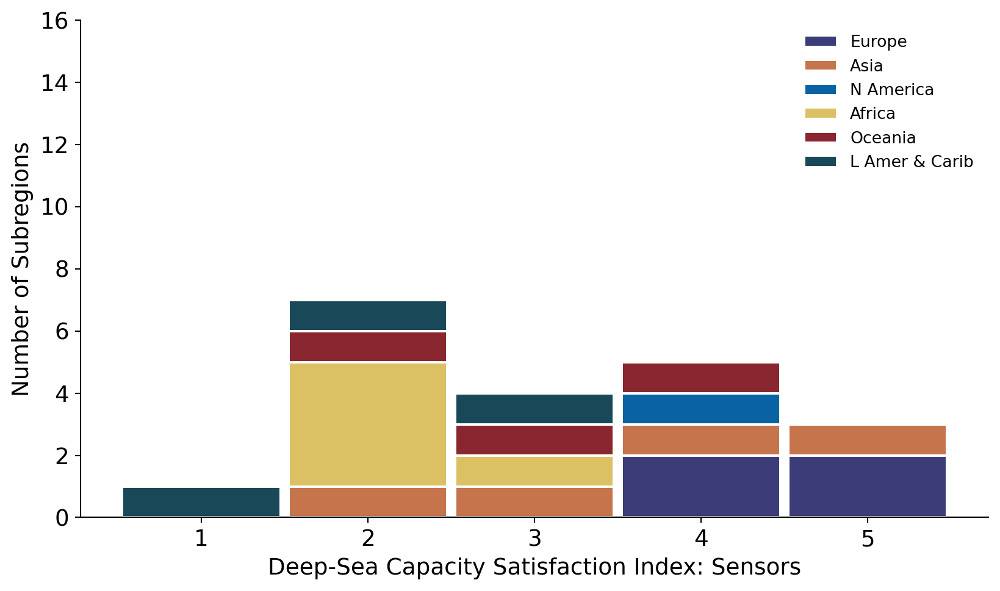

adding empty row for 4


subregion,Europe,Asia,N America,Africa,Oceania,L Amer & Carib
mean,,,,,,
1,NaN,NaN,NaN,3.0,1.0,2.0
2,1.0,2.0,NaN,2.0,NaN,1.0
3,1.0,2.0,1.0,NaN,2.0,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0
5,2.0,NaN,NaN,NaN,NaN,NaN


adding empty row for 4


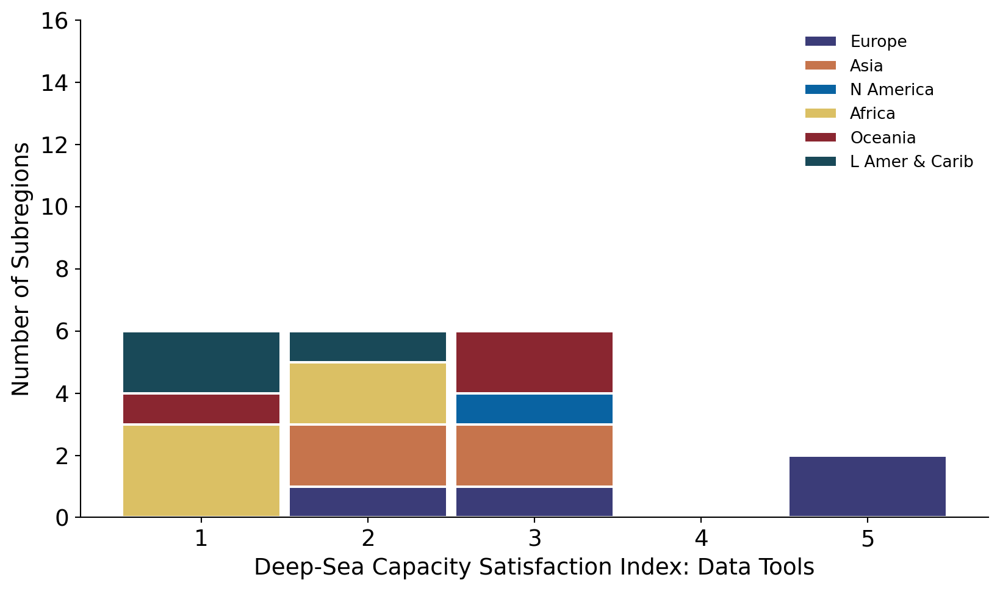

In [74]:
## Calculate fig data

dsc_types = {
    'dsc-ai-all':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AD1'
        },
    'dsc-ai-vessel':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD2'
        },
    'dsc-ai-dsv':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD3'
        },
    'dsc-ai-sensor':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD4'
        },
    'dsc-ai-data':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD5'
        },
    'dsc-si-all':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AE1'
        },
    'dsc-si-vessel':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE2'
        },
    'dsc-si-dsv':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE3'
        },
    'dsc-si-sensor':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE4'
        },
    'dsc-si-data':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE5'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)
        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        r = region
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)

        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], r, axis=1)

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 16
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

## Fig ADb & AEb

In [75]:
## Calculate fig data

dsc_types = {
    'dsc-ai-all':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AD1b'
        },
    'dsc-ai-vessel':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD2b'
        },
    'dsc-ai-dsv':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD3b'
        },
    'dsc-ai-sensor':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD4b'
        },
    'dsc-ai-data':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD5b'
        },
    'dsc-si-all':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AE1b'
        },
    'dsc-si-vessel':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE2b'
        },
    'dsc-si-dsv':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE3b'
        },
    'dsc-si-sensor':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE4b'
        },
    'dsc-si-data':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE5b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                        .mean()
                        .rename('mean')
                        .reset_index())
            fig_data[r] = (fig_data[r]
                        .groupby(['mean', 'subregion'])['mean']
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r]['mean'] = fig_data[r]['mean'].astype(int)

            fig_data[r] = fig_data[r].pivot(index='mean', columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])


    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 16
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])
        
        colors = []
        edgecolors = []
        linewidths = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                    linewidths.append(1)
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
                    linewidths.append(1)
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)
        for p,linewidth in zip(ax.patches,linewidths):
            p.set_linewidth(linewidth)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global
Skipping region Global


---
# **Section 6**

## Fig K - Research: Vessel presence

In [76]:
## Calculate values for plot

vessel_presence = {}
label_order = {}
fig_data = {}
for region in region_list:
    vessel_presence[region] = researchR[region].loc[(researchR[region]['question'] == 'Q13')
                                   & (researchR[region]['col_name'] != 'Q13_comments')
                                   & (researchR[region]['col_name'] != 'Q13_other'),
                                                                             ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    vessel_presence[region]['selection_binary'] = vessel_presence[region]['research_tech_clean']
    fig_data[region] = (vessel_presence[region].groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = vessel_presence[region].groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q13_research':     'Research',
        'Q13_fishing':      'Fishing',
        'Q13_recreational': 'Recreational',
        'Q13_traditional':  'Traditional',
        'Q13_cruise':       'Cruise',
        'Q13_navy':         'Navy',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'cruise'):('count', 'traditional')].sum()
    pivoted.loc['Total', ('percent', 'cruise'):('percent', 'traditional')] = \
        ((pivoted.loc['Total', ('count', 'cruise'):('count', 'traditional')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

count                                                   \
col_name       Cruise Fishing   Navy Recreational Research Traditional   
subregion                                                                
Africa           36.0    43.0   39.0         39.0     19.0        41.0   
Asia             19.0    28.0   28.0         29.0     21.0        14.0   
Europe           10.0    23.0   21.0         23.0     20.0        19.0   
L Amer & Carib   20.0    46.0   29.0         38.0     25.0        17.0   
N America         4.0     5.0    3.0          5.0      3.0         4.0   
Oceania          15.0    20.0   13.0         25.0     17.0        16.0   
Total           104.0   165.0  133.0        159.0    105.0       111.0   

               percent                                                    
col_name        Cruise Fishing    Navy Recreational Research Traditional  
subregion                                                                 
Africa           81.82   97.73   88.64        88.64    43.18       93.18  
Asia             63.33   93.33   93.33        96.67    70.00       46.67  
Europe           43.48  100.00   91.30       100.00    86.96       82.61  
L Amer & Carib   40.00   92.00   58.00        76.00    50.00       34.00  
N America        80.00  100.00   60.00       100.00    60.00       80.00  
Oceania          53.57   71.43   46.43        89.29    60.71       57.14  
Total           362.20  554.49  437.70       550.60   370.85      393.60

In [77]:
## Names of GeoAreas with all types present

for region in region_list:
    num_types = (vessel_presence[region][vessel_presence[region]['col_name'] != 'Q13_other']
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    num_types[num_types['num_types'] == num_types['num_types'].max()]
    
    ## Names of GeoAreas with fewest types present
    num_types[num_types['num_types'] == num_types['num_types'].min()]
    
    ## % of areas in region that have all types -- OTHER EXCLUDED
    num_types = (vessel_presence[region][vessel_presence[region]['col_name'] != 'Q13_other']
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    round((num_types[num_types['num_types'] == 6].shape[0]/num_types.shape[0])*100, 2)
    
    ## % of areas in region with < 3 types -- OTHER INCLUDED
    num_types = (vessel_presence[region]
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2)

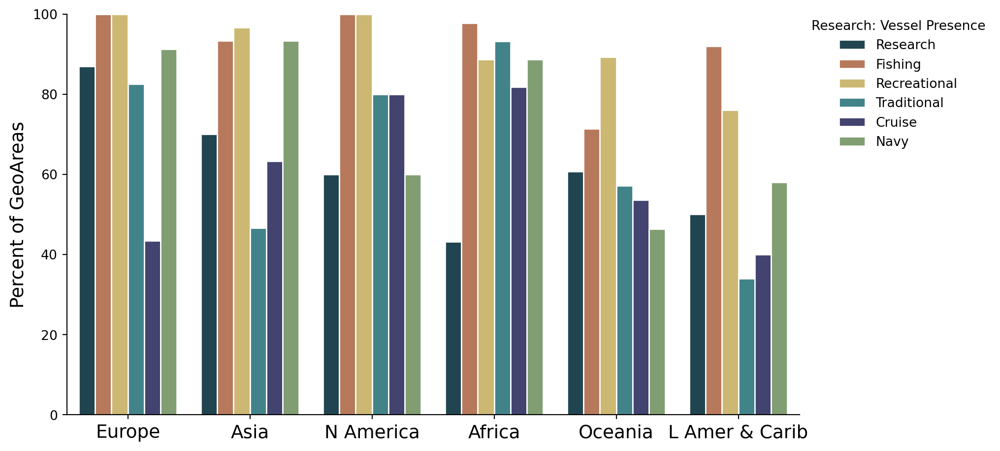

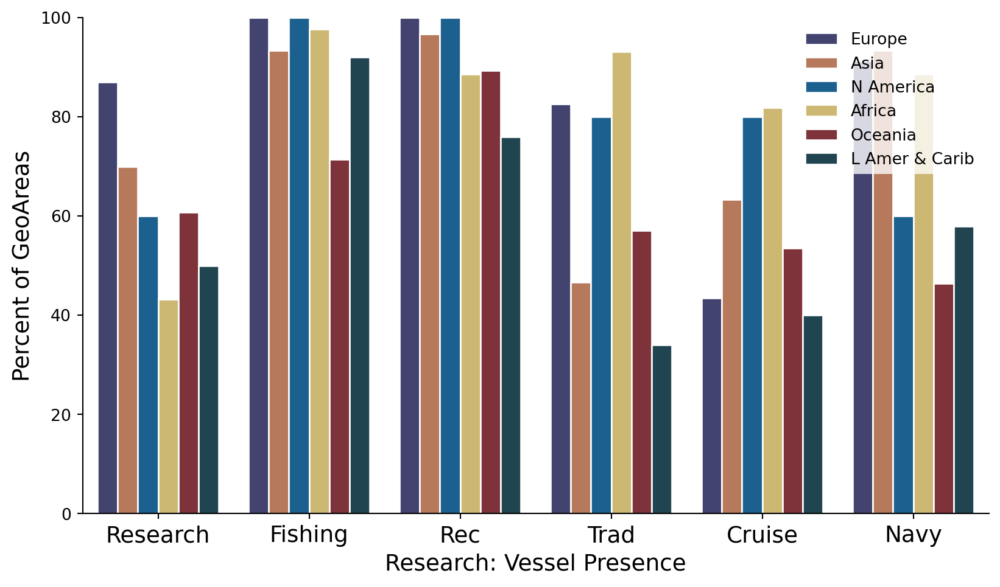

In [78]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Vessel Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='K1')

    ## K2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['Research', 'Fishing', 'Rec', 'Trad', 'Cruise', 'Navy'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Vessel Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='K2')

## Fig L - Q12/13: Vessel presence

In [79]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q13', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'Research vessels':               'Research',
        'Fishing vessels':                'Fishing',
        'Recreational vessels':           'Recreational',
        'Traditional vessels':            'Traditional',
        'Cruise ships':                   'Cruise',
        'Other':                          'Other',
        "I don't have access to vessels": 'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    num_respondents_per_subregion['subregion'].replace(label_adjustments, inplace=True)

    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/101)*num_respondents, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                                \
subregion              Africa  Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                        
Cruise                    4.0   9.0    2.0            3.0       3.0     2.0   
Fishing                  45.0  23.0   16.0           30.0      10.0    11.0   
None of the above        37.0  15.0    3.0           29.0       2.0     9.0   
Other                    12.0  13.0    2.0           18.0       2.0     8.0   
Recreational              7.0  10.0    7.0           19.0       8.0     7.0   
Research                 39.0  47.0   26.0           31.0      34.0     7.0   
Traditional              22.0   8.0    5.0           10.0       4.0     9.0   
Total                   101.0  75.0   33.0           88.0      38.0    23.0   

                       percent                                           \
subregion               Africa    Asia  Europe L Amer & Carib N America   
selection_survey_clean                                                    
Cruise                    3.96   12.00    6.06           3.41      7.89   
Fishing                  44.55   30.67   48.48          34.09     26.32   
None of the above        36.63   20.00    9.09          32.95      5.26   
Other                    11.88   17.33    6.06          20.45      5.26   
Recreational              6.93   13.33   21.21          21.59     21.05   
Research                 38.61   62.67   78.79          35.23     89.47   
Traditional              21.78   10.67   15.15          11.36     10.53   
Total                   358.00  265.84  116.97         311.92    134.69   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
Cruise                    8.70   23.0    6.42  
Fishing                  47.83  135.0   37.71  
None of the above        39.13   95.0   26.54  
Other                    34.78   55.0   15.36  
Recreational             30.43   58.0   16.20  
Research                 30.43  184.0   51.40  
Traditional              39.13   58.0   16.20  
Total                    81.52  358.0  100.00

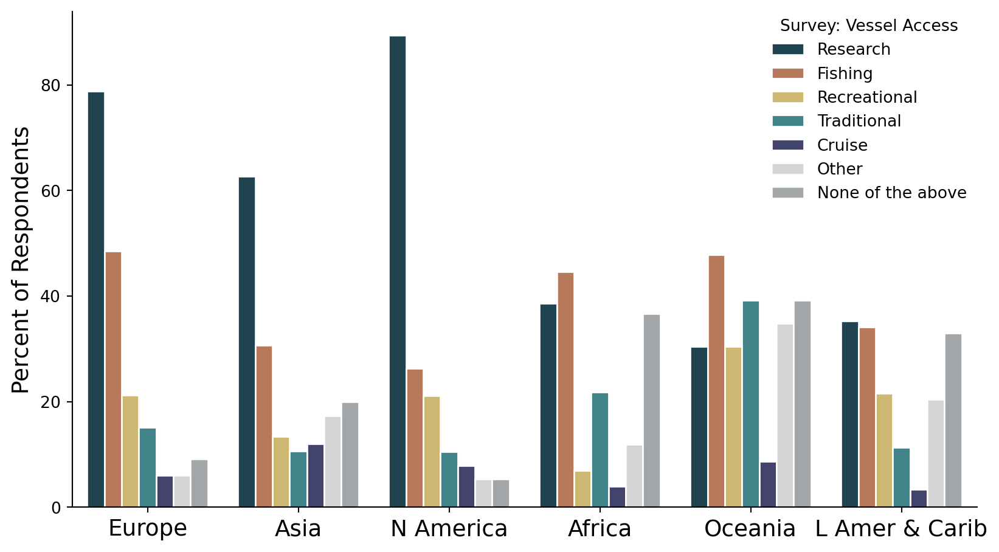

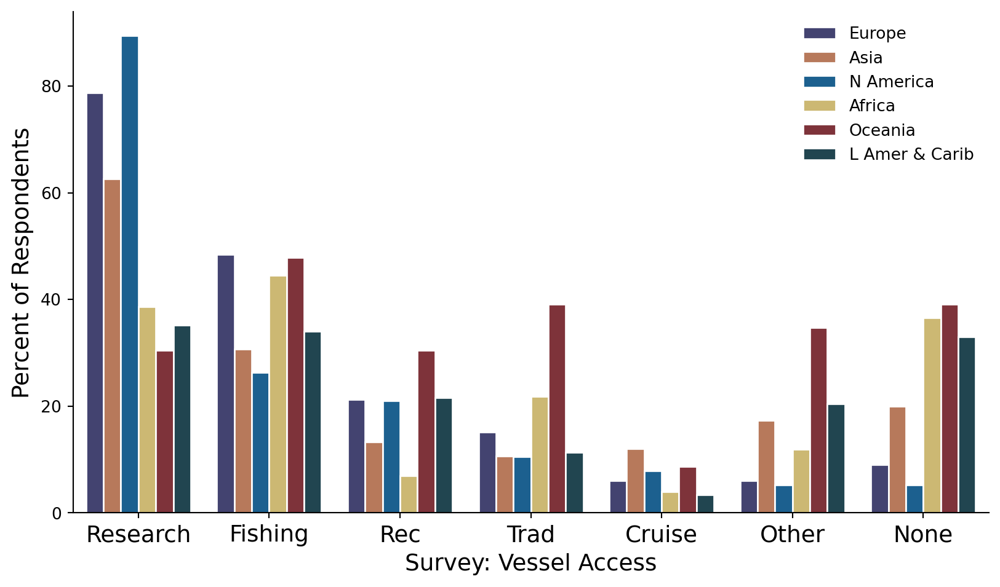

In [80]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_05 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    # ax.set_yticks([0, 5, 10, 15, 20])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Survey: Vessel Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='L1')
    
    ## L2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['Research', 'Fishing', 'Rec', 'Trad', 'Cruise', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Vessel Access', fontsize=14)
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='L2')

## Fig M - Q14: Vessel satisfaction

In [81]:
## Select data

satisfaction = {}
missing_responses = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q14', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q14_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]
    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])
    display(satisfaction[region].head())

,col_name,subregion,geoarea,respondent_id,selection,selection_other,row_num
9720,Q14_availability,Europe,Portugal,12803251122,1 - Very dissatisfied,1 - Very dissatisfied,0
9721,Q14_availability,Oceania,Fiji,12707579765,1 - Very dissatisfied,1 - Very dissatisfied,1
9722,Q14_availability,Latin America and the Caribbean,Venezuela,12906593096,1 - Very dissatisfied,1 - Very dissatisfied,2
9723,Q14_availability,Oceania,Cook Islands,12671701920,1 - Very dissatisfied,1 - Very dissatisfied,3
9724,Q14_availability,Africa,Madagascar,12897429486,1 - Very dissatisfied,1 - Very dissatisfied,4


In [82]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [83]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                \
subregion                              Africa   Asia Europe   
selection                                                     
1 - Very dissatisfied                    94.0   24.0   10.0   
2 - Dissatisfied                        116.0   89.0   32.0   
3 - Neither satisfied nor dissatisfied   92.0   65.0   29.0   
4 - Satisfied                            96.0  119.0   62.0   
5 - Very satisfied                       21.0   30.0   17.0   
Total                                   419.0  327.0  150.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             86.0   
2 - Dissatisfied                                                 100.0   
3 - Neither satisfied nor dissatisfied                            80.0   
4 - Satisfied                                                     86.0   
5 - Very satisfied                                                12.0   
Total                                                            364.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               6.0    23.0   22.43   
2 - Dissatisfied                                   30.0    29.0   27.68   
3 - Neither satisfied nor dissatisfied             39.0    21.0   21.96   
4 - Satisfied                                      62.0    32.0   22.91   
5 - Very satisfied                                 45.0     4.0    5.01   
Total                                             182.0   109.0   99.99   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     7.34   6.67   
2 - Dissatisfied                         27.22  21.33   
3 - Neither satisfied nor dissatisfied   19.88  19.33   
4 - Satisfied                            36.39  41.33   
5 - Very satisfied                        9.17  11.33   
Total                                   100.00  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            23.63   
2 - Dissatisfied                                                 27.47   
3 - Neither satisfied nor dissatisfied                           21.98   
4 - Satisfied                                                    23.63   
5 - Very satisfied                                                3.30   
Total                                                           100.01   

                                                                  count  \
subregion                              Northern America Oceania   Total   
selection                                                                 
1 - Very dissatisfied                              3.30   21.10   243.0   
2 - Dissatisfied                                  16.48   26.61   396.0   
3 - Neither satisfied nor dissatisfied            21.43   19.27   326.0   
4 - Satisfied                                     34.07   29.36   457.0   
5 - Very satisfied                                24.73    3.67   129.0   
Total                                            100.01  100.01  1551.0   

                                       percent  
subregion                                Total  
selection                                       
1 - Very dissatisfied                    15.67  
2 - Dissatisfied                         25.53  
3 - Neither satisfied nor d

In [84]:
## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
## NA for more than one question

for region in region_list:
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

subregion,Africa,Asia,Europe,Latin America and the Caribbean,Northern America,Oceania,Total
col_name,,,,,,,
Q14_availability,15,9,3,16,2,1,46
Q14_capabilities,17,10,2,16,2,1,48
Q14_cost,19,8,4,18,1,2,52
Q14_duration,20,10,3,19,2,1,55
Q14_other,101,75,33,90,38,23,360
Q14_size,15,11,3,17,1,1,48


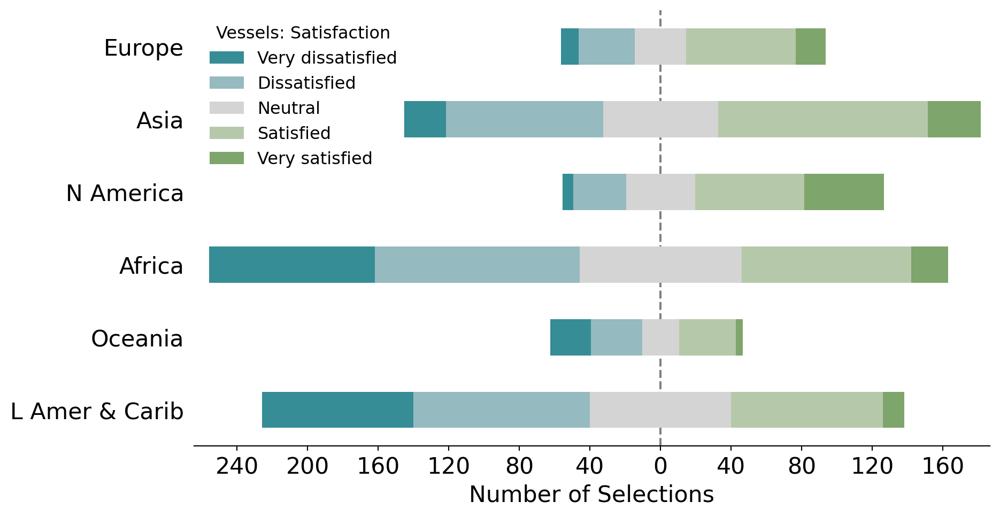

In [85]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M1')

### Vessel satisfaction plot #2.

In [86]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Capabilities', 'Cost', 'Duration', 'Size']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Size', 'Duration']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)



In [87]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q14_availability Q14_capabilities   
selection                                                                  
1 - Very dissatisfied                              61.0             51.0   
2 - Dissatisfied                                   88.0             96.0   
3 - Neither satisfied nor dissatisfied             65.0             57.0   
4 - Satisfied                                      90.0             79.0   
5 - Very satisfied                                 10.0             29.0   
Total                                             314.0            312.0   

                                                                       \
col_name                               Q14_cost Q14_duration Q14_size   
selection                                                               
1 - Very dissatisfied                      52.0         39.0     40.0   
2 - Dissatisfied                           71.0         76.0     65.0   
3 - Neither satisfied nor dissatisfied     75.0         66.0     63.0   
4 - Satisfied                              91.0         96.0    101.0   
5 - Very satisfied                         19.0         28.0     43.0   
Total                                     308.0        305.0    312.0   

                                                percent                   \
col_name                               Q14_availability Q14_capabilities   
selection                                                                  
1 - Very dissatisfied                             19.43            16.35   
2 - Dissatisfied                                  28.03            30.77   
3 - Neither satisfied nor dissatisfied            20.70            18.27   
4 - Satisfied                                     28.66            25.32   
5 - Very satisfied                                 3.18             9.29   
Total                                            100.00           100.00   

                                                                        count  \
col_name                               Q14_cost Q14_duration Q14_size   Total   
selection                                                                       
1 - Very dissatisfied                     16.88        12.79    12.82   243.0   
2 - Dissatisfied                          23.05        24.92    20.83   396.0   
3 - Neither satisfied nor dissatisfied    24.35        21.64    20.19   326.0   
4 - Satisfied                             29.55        31.48    32.37   457.0   
5 - Very satisfied                         6.17         9.18    13.78   129.0   
Total                                    100.00       100.01    99.99  1551.0   

                                       percent  
col_name                                 Total  
selection                                       
1 - Very dissatisfied                    15.67  
2 - Dissatisfied                         25.53  
3 - Neither satisfied nor dissatisfied   21.02  
4 - Satisfied                            29.46  
5 - Very satisfied                        8.32  
Total                                   100.00

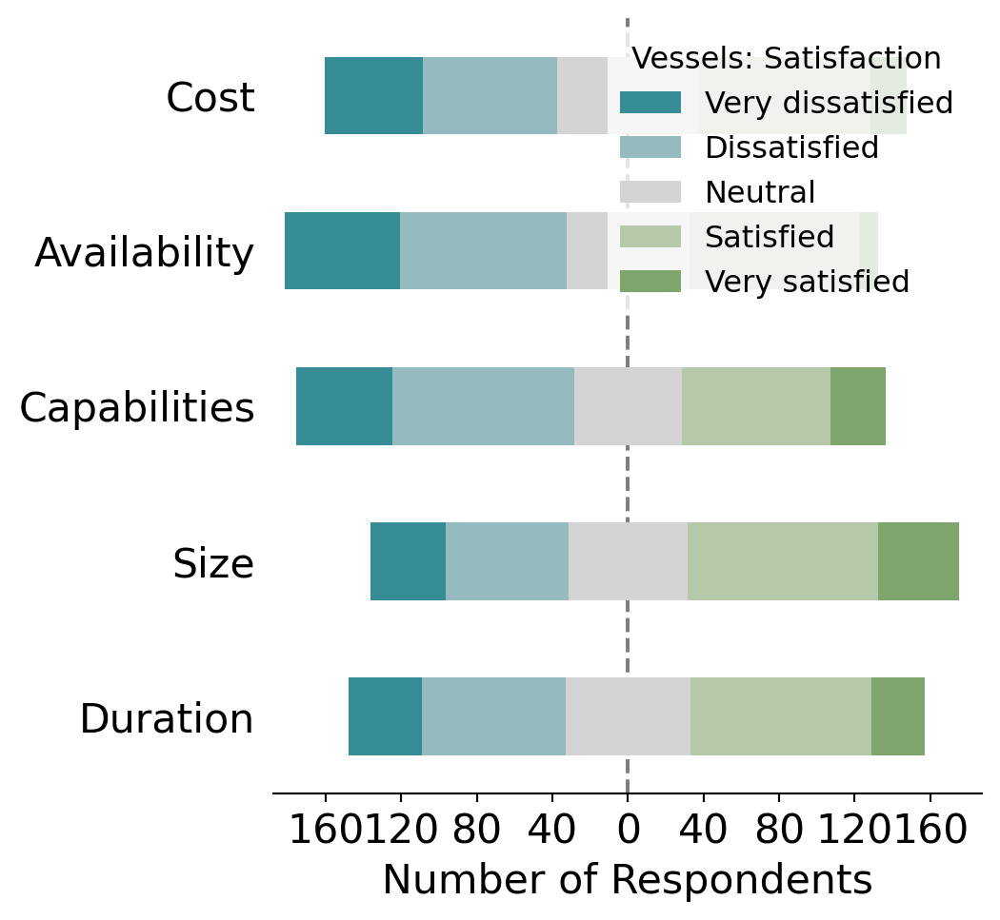

In [88]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M2')

#### Q14a: Vessel cost

In [89]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_cost') &
                (dataR[region]['selection'] != ''), 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]
    
    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [90]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    19.0   7.0    2.0   
2 - Dissatisfied                         15.0  19.0    8.0   
3 - Neither satisfied nor dissatisfied   22.0  14.0    7.0   
4 - Satisfied                            21.0  23.0   11.0   
5 - Very satisfied                        5.0   4.0    1.0   
Total                                    82.0  67.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             19.0   
2 - Dissatisfied                                                  15.0   
3 - Neither satisfied nor dissatisfied                            15.0   
4 - Satisfied                                                     19.0   
5 - Very satisfied                                                 4.0   
Total                                                             72.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     4.0   23.17   
2 - Dissatisfied                                    8.0     6.0   18.29   
3 - Neither satisfied nor dissatisfied             13.0     4.0   26.83   
4 - Satisfied                                      10.0     7.0   25.61   
5 - Very satisfied                                  5.0     NaN    6.10   
Total                                              37.0    21.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                    10.45    6.90   
2 - Dissatisfied                         28.36   27.59   
3 - Neither satisfied nor dissatisfied   20.90   24.14   
4 - Satisfied                            34.33   37.93   
5 - Very satisfied                        5.97    3.45   
Total                                   100.01  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            26.39   
2 - Dissatisfied                                                 20.83   
3 - Neither satisfied nor dissatisfied                           20.83   
4 - Satisfied                                                    26.39   
5 - Very satisfied                                                5.56   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.70   19.05   52.0   16.88  
2 - Dissatisfied                                  21.62   28.57   71.0   23.05  
3 - Neither satisfied nor dissatisfied            35.14   19.05   75.0   24.35  
4 - Satisfied                                     27.03   33.33   91.0   29.55  
5 - Very satisfied                                13.51     NaN   19.0    6.17  
Total                                            100.00  100.00  308.0  100.00

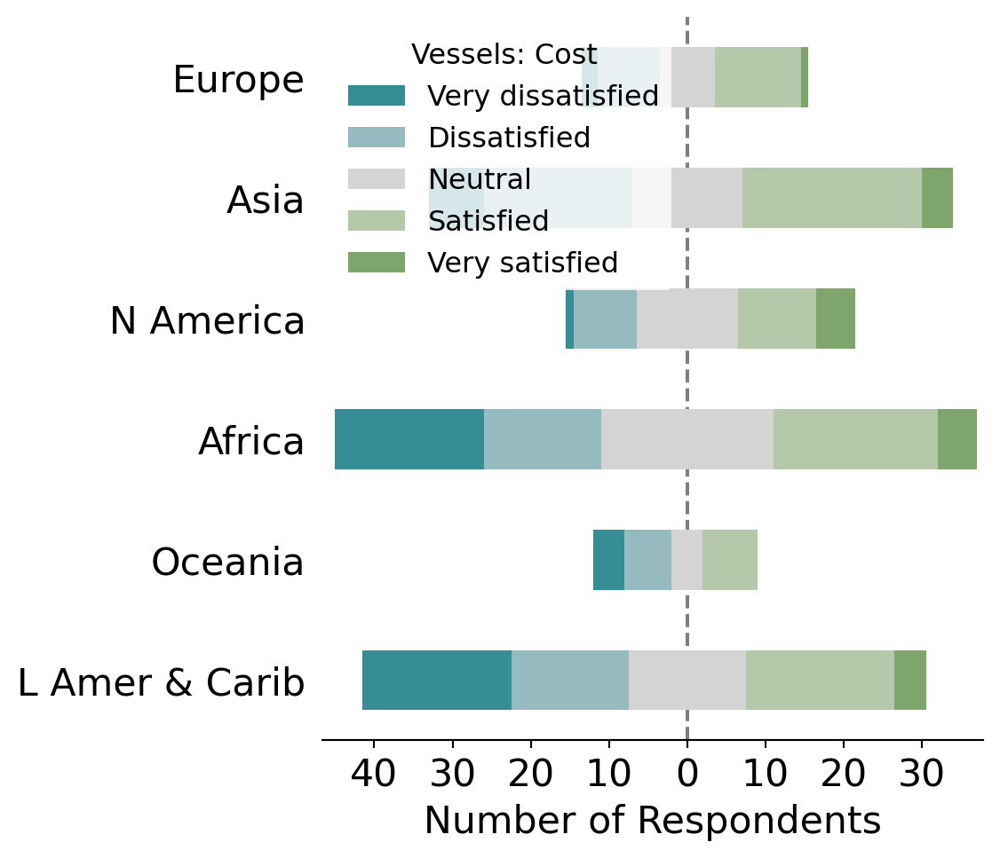

In [91]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M3')

### Q14b: vessel availability

In [92]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]
    
    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [93]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    21.0   7.0    4.0   
2 - Dissatisfied                         26.0  15.0    9.0   
3 - Neither satisfied nor dissatisfied   15.0  17.0    5.0   
4 - Satisfied                            22.0  24.0   11.0   
5 - Very satisfied                        2.0   3.0    1.0   
Total                                    86.0  66.0   30.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             23.0   
2 - Dissatisfied                                                  22.0   
3 - Neither satisfied nor dissatisfied                            11.0   
4 - Satisfied                                                     17.0   
5 - Very satisfied                                                 1.0   
Total                                                             74.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               2.0     4.0   24.42   
2 - Dissatisfied                                    9.0     7.0   30.23   
3 - Neither satisfied nor dissatisfied             14.0     3.0   17.44   
4 - Satisfied                                       8.0     8.0   25.58   
5 - Very satisfied                                  3.0     NaN    2.33   
Total                                              36.0    22.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                    10.61   13.33   
2 - Dissatisfied                         22.73   30.00   
3 - Neither satisfied nor dissatisfied   25.76   16.67   
4 - Satisfied                            36.36   36.67   
5 - Very satisfied                        4.55    3.33   
Total                                   100.01  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            31.08   
2 - Dissatisfied                                                 29.73   
3 - Neither satisfied nor dissatisfied                           14.86   
4 - Satisfied                                                    22.97   
5 - Very satisfied                                                1.35   
Total                                                            99.99   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              5.56   18.18   61.0   19.43  
2 - Dissatisfied                                  25.00   31.82   88.0   28.03  
3 - Neither satisfied nor dissatisfied            38.89   13.64   65.0   20.70  
4 - Satisfied                                     22.22   36.36   90.0   28.66  
5 - Very satisfied                                 8.33     NaN   10.0    3.18  
Total                                            100.00  100.00  314.0  100.00

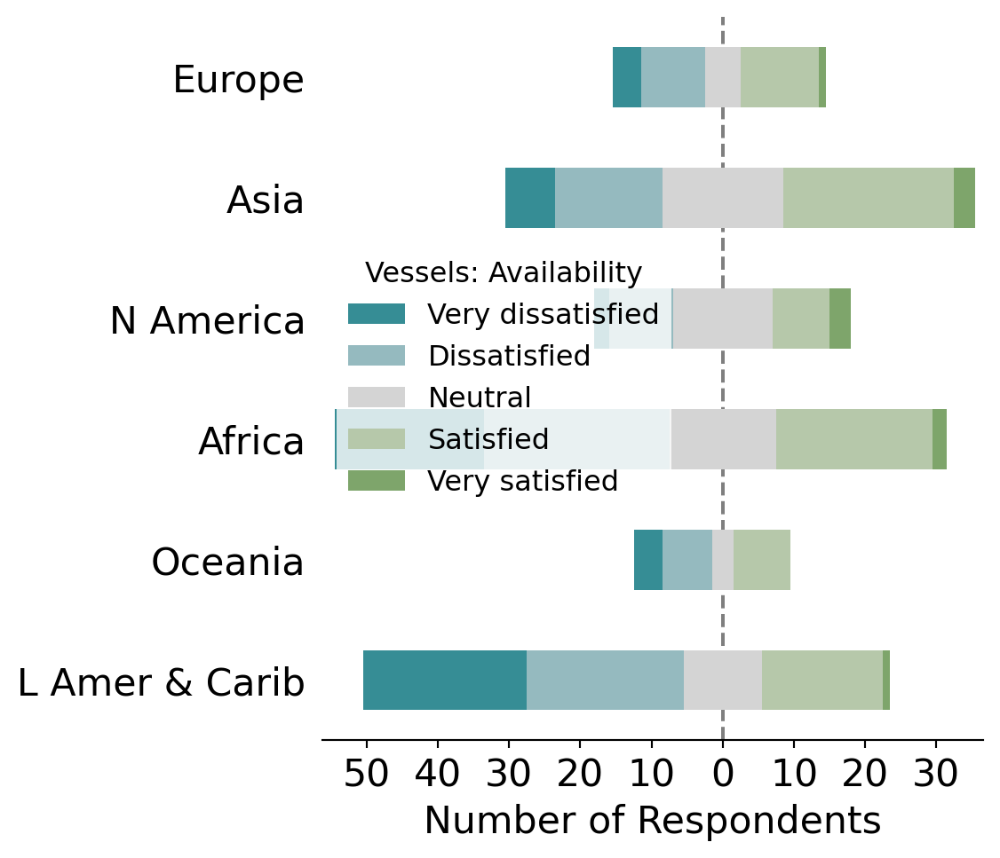

In [94]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M4')

### Q14c: Vessel capabilities

In [95]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [96]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    21.0   5.0    2.0   
2 - Dissatisfied                         26.0  19.0    7.0   
3 - Neither satisfied nor dissatisfied   18.0  12.0    6.0   
4 - Satisfied                            16.0  21.0   11.0   
5 - Very satisfied                        3.0   8.0    5.0   
Total                                    84.0  65.0   31.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             17.0   
2 - Dissatisfied                                                  33.0   
3 - Neither satisfied nor dissatisfied                            13.0   
4 - Satisfied                                                     11.0   
5 - Very satisfied                                                 NaN   
Total                                                             74.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     5.0   25.00   
2 - Dissatisfied                                    6.0     5.0   30.95   
3 - Neither satisfied nor dissatisfied              3.0     5.0   21.43   
4 - Satisfied                                      13.0     7.0   19.05   
5 - Very satisfied                                 13.0     NaN    3.57   
Total                                              36.0    22.0  100.00   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     7.69   6.45   
2 - Dissatisfied                         29.23  22.58   
3 - Neither satisfied nor dissatisfied   18.46  19.35   
4 - Satisfied                            32.31  35.48   
5 - Very satisfied                       12.31  16.13   
Total                                   100.00  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            22.97   
2 - Dissatisfied                                                 44.59   
3 - Neither satisfied nor dissatisfied                           17.57   
4 - Satisfied                                                    14.86   
5 - Very satisfied                                                 NaN   
Total                                                            99.99   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.78   22.73   51.0   16.35  
2 - Dissatisfied                                  16.67   22.73   96.0   30.77  
3 - Neither satisfied nor dissatisfied             8.33   22.73   57.0   18.27  
4 - Satisfied                                     36.11   31.82   79.0   25.32  
5 - Very satisfied                                36.11     NaN   29.0    9.29  
Total                                            100.00  100.01  312.0  100.00

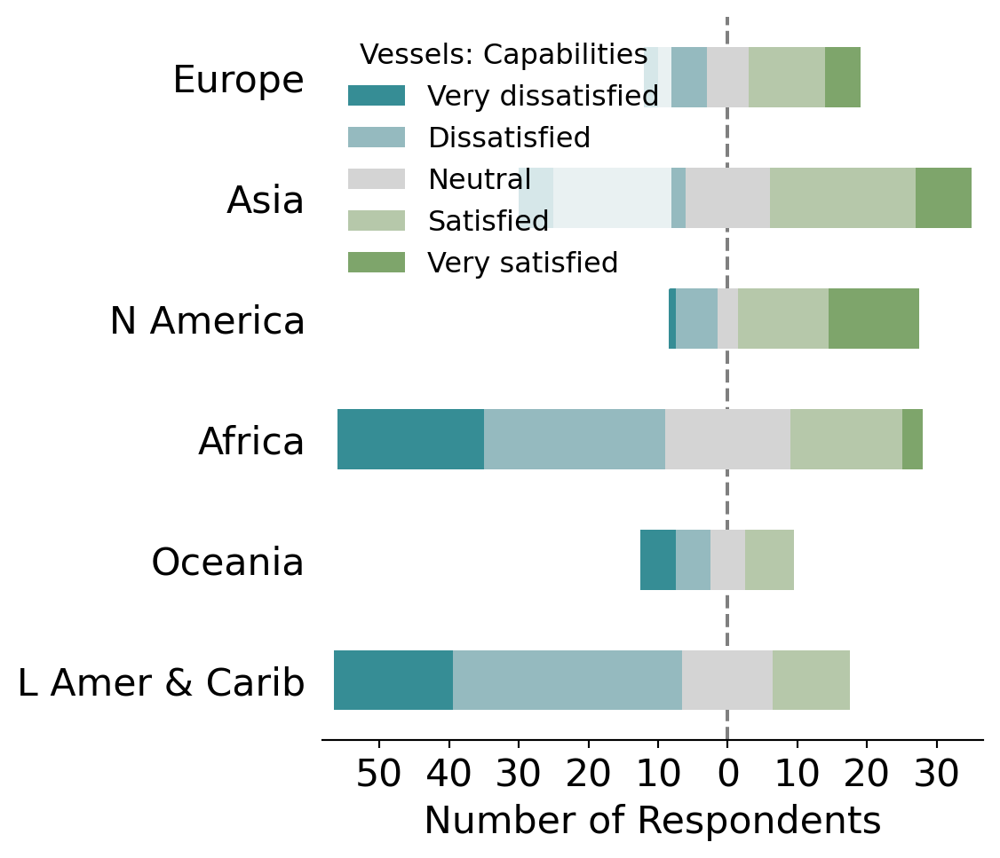

In [97]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left', 'Oceania': 'upper right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M5')

### Q14d: Vessel size

In [98]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

size = {}
fig_data = {}
for region in region_list:
    size[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_size') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = size[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [99]:
## Calculate statistics

for region in region_list:
    percent_data = (size[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = size[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    18.0   3.0    NaN   
2 - Dissatisfied                         23.0  15.0    4.0   
3 - Neither satisfied nor dissatisfied   19.0   9.0    4.0   
4 - Satisfied                            19.0  29.0   15.0   
5 - Very satisfied                        7.0   8.0    7.0   
Total                                    86.0  64.0   30.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             14.0   
2 - Dissatisfied                                                  16.0   
3 - Neither satisfied nor dissatisfied                            19.0   
4 - Satisfied                                                     18.0   
5 - Very satisfied                                                 6.0   
Total                                                             73.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     4.0   20.93   
2 - Dissatisfied                                    2.0     5.0   26.74   
3 - Neither satisfied nor dissatisfied              6.0     6.0   22.09   
4 - Satisfied                                      15.0     5.0   22.09   
5 - Very satisfied                                 13.0     2.0    8.14   
Total                                              37.0    22.0   99.99   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     4.69    NaN   
2 - Dissatisfied                         23.44  13.33   
3 - Neither satisfied nor dissatisfied   14.06  13.33   
4 - Satisfied                            45.31  50.00   
5 - Very satisfied                       12.50  23.33   
Total                                   100.00  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            19.18   
2 - Dissatisfied                                                 21.92   
3 - Neither satisfied nor dissatisfied                           26.03   
4 - Satisfied                                                    24.66   
5 - Very satisfied                                                8.22   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.70   18.18   40.0   12.82  
2 - Dissatisfied                                   5.41   22.73   65.0   20.83  
3 - Neither satisfied nor dissatisfied            16.22   27.27   63.0   20.19  
4 - Satisfied                                     40.54   22.73  101.0   32.37  
5 - Very satisfied                                35.14    9.09   43.0   13.78  
Total                                            100.01  100.00  312.0  100.00

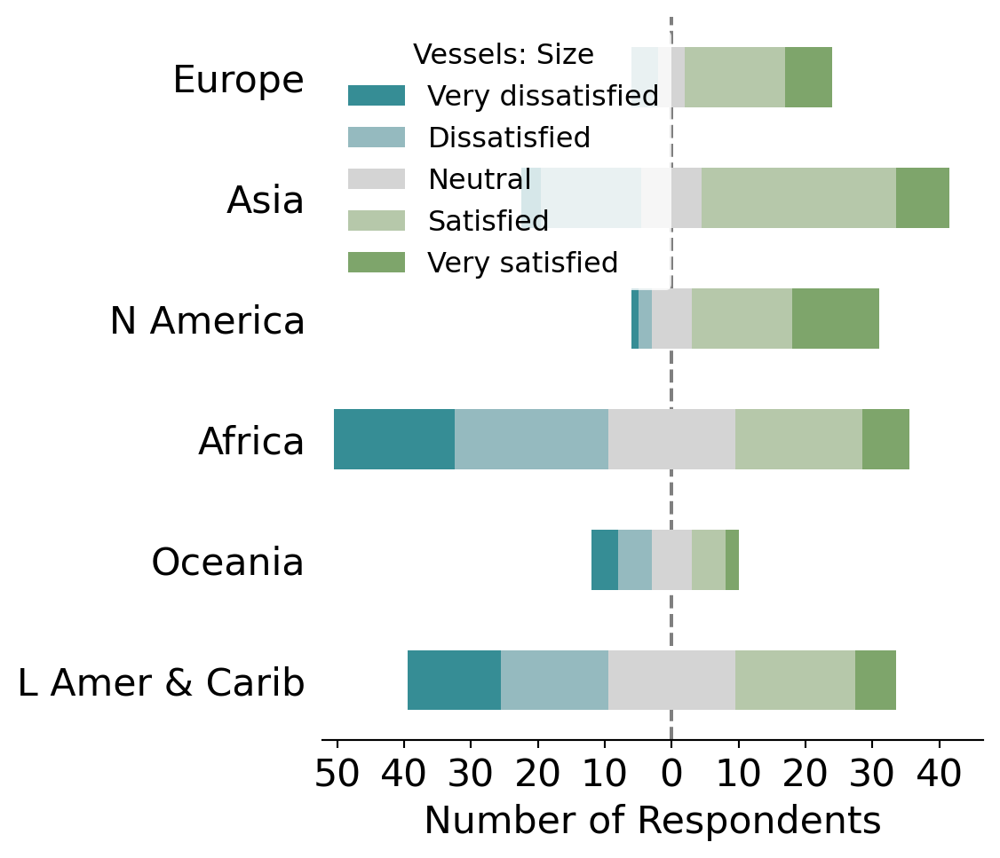

In [100]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Americas': 'lower right', 'Asia': 'lower left', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left', 'Oceania': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Size',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M6')

### Q14e: Vessel duration

In [101]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

duration = {}
fig_data = {}
for region in region_list:
    duration[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_duration') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = duration[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [102]:
## Calculate statistics

for region in region_list:
    percent_data = (duration[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = duration[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    15.0   2.0    2.0   
2 - Dissatisfied                         26.0  21.0    4.0   
3 - Neither satisfied nor dissatisfied   18.0  13.0    7.0   
4 - Satisfied                            18.0  22.0   14.0   
5 - Very satisfied                        4.0   7.0    3.0   
Total                                    81.0  65.0   30.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             13.0   
2 - Dissatisfied                                                  14.0   
3 - Neither satisfied nor dissatisfied                            22.0   
4 - Satisfied                                                     21.0   
5 - Very satisfied                                                 1.0   
Total                                                             71.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     6.0   18.52   
2 - Dissatisfied                                    5.0     6.0   32.10   
3 - Neither satisfied nor dissatisfied              3.0     3.0   22.22   
4 - Satisfied                                      16.0     5.0   22.22   
5 - Very satisfied                                 11.0     2.0    4.94   
Total                                              36.0    22.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     3.08    6.67   
2 - Dissatisfied                         32.31   13.33   
3 - Neither satisfied nor dissatisfied   20.00   23.33   
4 - Satisfied                            33.85   46.67   
5 - Very satisfied                       10.77   10.00   
Total                                   100.01  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            18.31   
2 - Dissatisfied                                                 19.72   
3 - Neither satisfied nor dissatisfied                           30.99   
4 - Satisfied                                                    29.58   
5 - Very satisfied                                                1.41   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.78   27.27   39.0   12.79  
2 - Dissatisfied                                  13.89   27.27   76.0   24.92  
3 - Neither satisfied nor dissatisfied             8.33   13.64   66.0   21.64  
4 - Satisfied                                     44.44   22.73   96.0   31.48  
5 - Very satisfied                                30.56    9.09   28.0    9.18  
Total                                            100.00  100.00  305.0  100.00

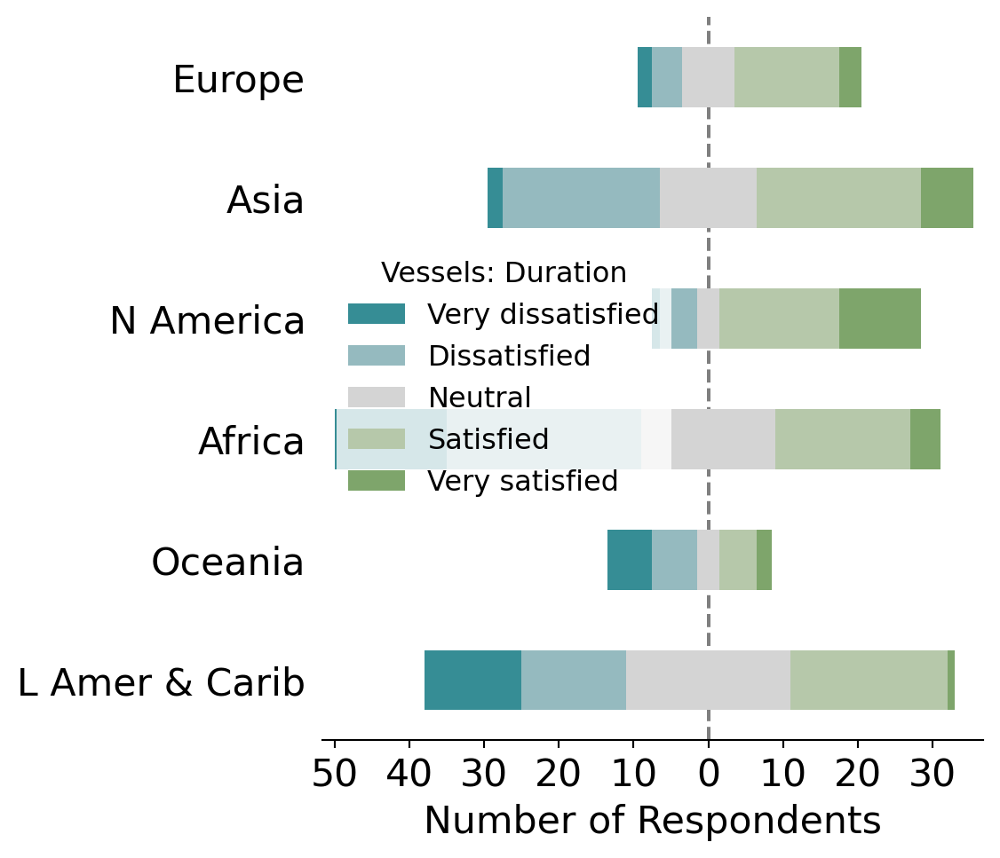

In [103]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left', 'Oceania': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Duration',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M7')

## Fig N - Q11: Vessel importance

In [104]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q11'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [105]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection                                                                    
1 - Not important         4.0   5.0    1.0                            10.0   
2 - A little important    2.0   NaN    NaN                             2.0   
3 - Somewhat important   13.0  10.0    2.0                            13.0   
4 - Important            11.0  12.0    4.0                            12.0   
5 - Very important       71.0  48.0   26.0                            53.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                  \
subregion              Northern America Oceania  Africa    Asia  Europe   
selection                                                                 
1 - Not important                   1.0     1.0    3.96    6.67    3.03   
2 - A little important              2.0     1.0    1.98     NaN     NaN   
3 - Somewhat important              5.0     3.0   12.87   13.33    6.06   
4 - Important                       1.0     3.0   10.89   16.00   12.12   
5 - Very important                 29.0    15.0   70.30   64.00   78.79   
Total                              38.0    23.0  100.00  100.00  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection                                                                 
1 - Not important                                11.11             2.63   
2 - A little important                            2.22             5.26   
3 - Somewhat important                           14.44            13.16   
4 - Important                                    13.33             2.63   
5 - Very important                               58.89            76.32   
Total                                            99.99           100.00   

                                count percent  
subregion              Oceania  Total   Total  
selection                                      
1 - Not important         4.35   22.0    6.11  
2 - A little important    4.35    7.0    1.94  
3 - Somewhat important   13.04   46.0   12.78  
4 - Important            13.04   43.0   11.94  
5 - Very important       65.22  242.0   67.22  
Total                   100.00  360.0  100.00

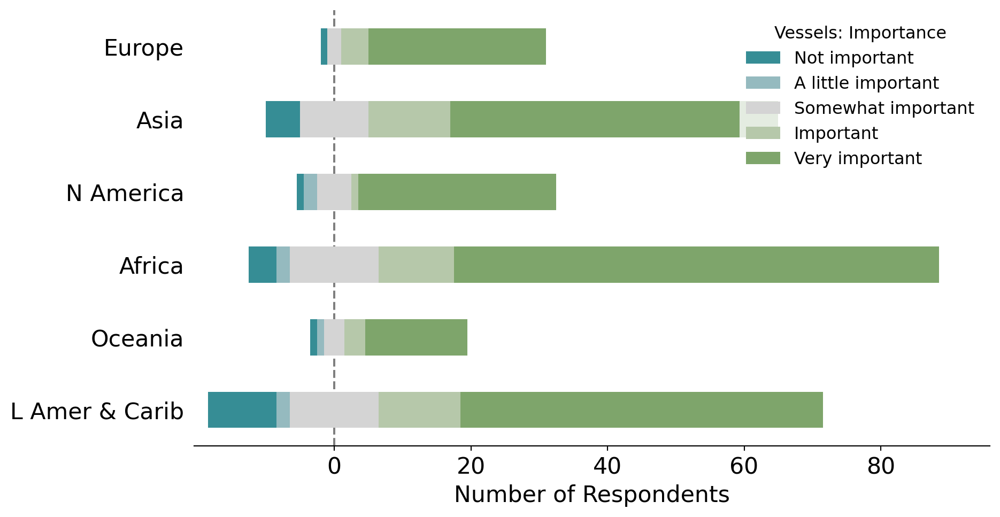

In [106]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper right', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='N1')

### Q15: Vessel potential

In [107]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q15'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    # Change scale values
    fig_data[region].replace({'1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [108]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion           Africa  Asia Europe Latin America and the Caribbean   
selection                                                                 
1 - No impact          8.0   7.0    NaN                             6.0   
2 - Little impact      2.0   5.0    2.0                             3.0   
3 - Moderate impact   29.0  15.0    9.0                            18.0   
4 - High impact       13.0  18.0   10.0                            15.0   
5 - Transformative    49.0  30.0   12.0                            48.0   
Total                101.0  75.0   33.0                            90.0   

                                             percent                 \
subregion           Northern America Oceania  Africa    Asia Europe   
selection                                                             
1 - No impact                    1.0     NaN    7.92    9.33    NaN   
2 - Little impact                3.0     3.0    1.98    6.67   6.06   
3 - Moderate impact              7.0     5.0   28.71   20.00  27.27   
4 - High impact                 10.0     4.0   12.87   24.00  30.30   
5 - Transformative              17.0    11.0   48.51   40.00  36.36   
Total                           38.0    23.0   99.99  100.00  99.99   

                                                                              \
subregion           Latin America and the Caribbean Northern America Oceania   
selection                                                                      
1 - No impact                                  6.67             2.63     NaN   
2 - Little impact                              3.33             7.89   13.04   
3 - Moderate impact                           20.00            18.42   21.74   
4 - High impact                               16.67            26.32   17.39   
5 - Transformative                            53.33            44.74   47.83   
Total                                        100.00           100.00  100.00   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         22.0    6.11  
2 - Little impact     18.0    5.00  
3 - Moderate impact   83.0   23.06  
4 - High impact       70.0   19.44  
5 - Transformative   167.0   46.39  
Total                360.0  100.00

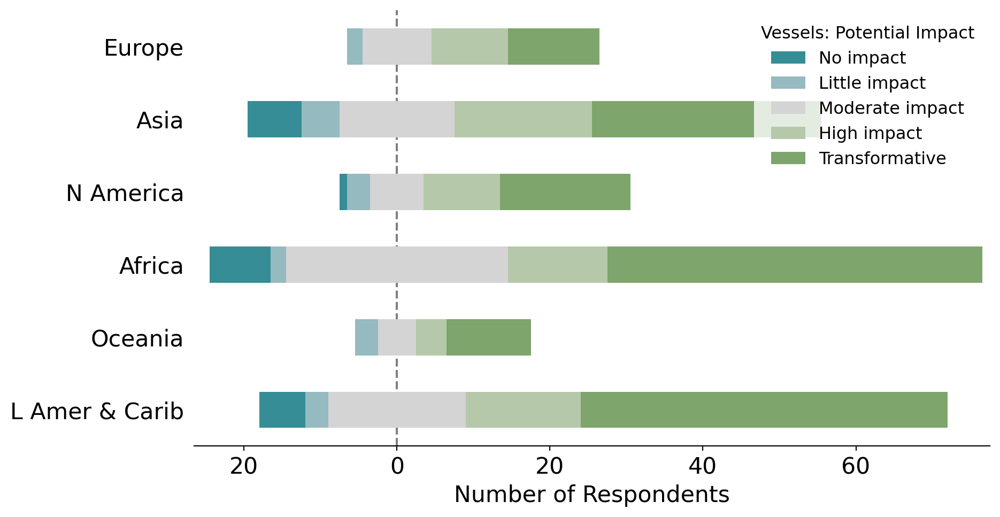

In [109]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='N2')

---
# **Section 7**

## Fig O - DSV presence

In [110]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    dsv_presence = researchR[region].loc[(researchR[region]['question'] == 'Q18') &
                               (researchR[region]['col_name'] != 'Q18_comments'), ['geoarea',
                                                                          'col_name',
                                                                          'subregion',                    
                                                                          'research_tech_clean']]
    dsv_presence['selection_binary'] = dsv_presence['research_tech_clean']

    fig_data[region] = (dsv_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = dsv_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q18_rov':       'ROVs',
        'Q18_auv':       'AUVs',
        'Q18_bruv':      'Landers',
        'Q18_drifters':  'Drifters',
        'Q18_tow_sleds': 'Towsleds',
        'Q18_hov':       'HOVs',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'auv'):('count', 'tow')].sum()
    pivoted.loc['Total', ('percent', 'auv'):('percent', 'tow')] = \
        ((pivoted.loc['Total', ('count', 'auv'):('count', 'tow')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))
    
    ## Names of GeoAreas with all types present
    num_types = (dsv_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])
    
    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])
    
    ## % of areas in region that have all types
    num_types = (dsv_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(round((num_types[num_types['num_types'] == 6].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                                       percent           \
col_name        AUVs Drifters  HOVs Landers  ROVs Towsleds    AUVs Drifters   
subregion                                                                     
Africa           6.0      5.0   1.0     7.0  19.0      2.0   13.64    11.36   
Asia            16.0     11.0  16.0    12.0  21.0      4.0   53.33    36.67   
Europe          14.0     12.0   8.0     9.0  18.0     10.0   60.87    52.17   
L Amer & Carib   8.0      7.0  12.0    13.0  19.0      3.0   16.00    14.00   
N America        3.0      3.0   3.0     2.0   3.0      2.0   60.00    60.00   
Oceania          7.0      4.0   4.0     9.0  12.0      7.0   25.00    14.29   
Total           54.0     42.0  44.0    52.0  92.0     28.0  228.84   188.49   

                                                 
col_name          HOVs Landers    ROVs Towsleds  
subregion                                        
Africa            2.27   15.91   43.18     4.55  
Asia             53.33   40.00   70.00    13.33  
Europe           34.78   39.13   78.26    43.48  
L Amer & Carib   24.00   26.00   38.00     6.00  
N America        60.00   40.00   60.00    40.00  
Oceania          14.29   32.14   42.86    25.00  
Total           188.67  193.18  332.30   132.36

,subregion,geoarea,num_types
46,Asia,China,6
54,Asia,Japan,6
80,Europe,Greece,6
89,Europe,Portugal,6
148,Northern America,Canada,6
151,Northern America,United States of America,6
153,Oceania,Australia,6


,subregion,geoarea,num_types
1,Africa,Angola,0
4,Africa,Cabo Verde,0
5,Africa,Cameroon,0
6,Africa,Chagos Archipelago,0
7,Africa,Comoros,0
8,Africa,Congo,0
14,Africa,Eritrea,0
16,Africa,Gambia,0
17,Africa,Ghana,0
19,Africa,Guinea-Bissau,0


3.89

71.11

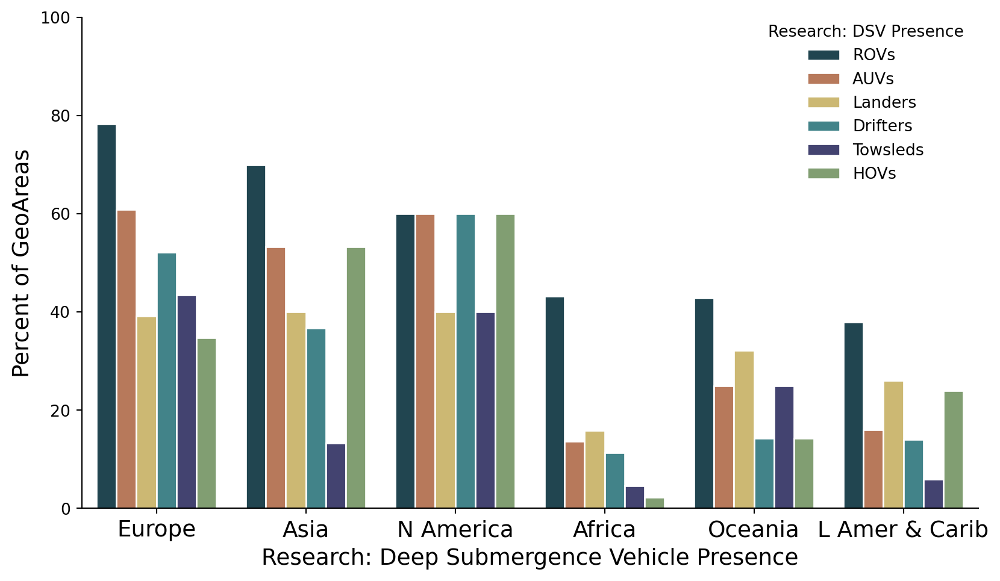

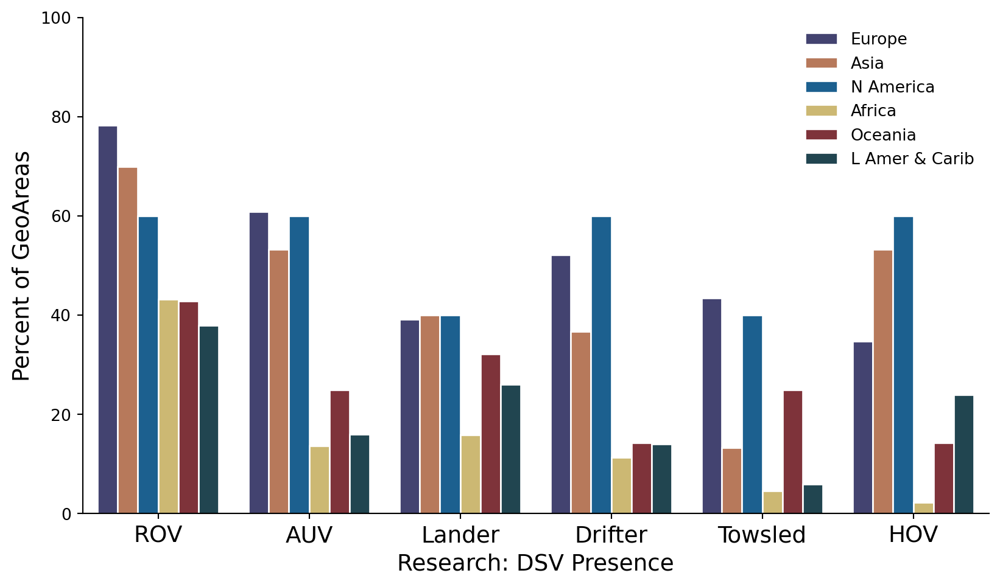

In [111]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set_xlabel('Research: Deep Submergence Vehicle Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc=loc_tweaker(region, loc_tweaks),
              title='Research: DSV Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='O1')

    ## O2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['ROV', 'AUV', 'Lander', 'Drifter', 'Towsled', 'HOV'], rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_xlabel('Research: DSV Presence', fontsize=14)
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='O2')

## Fig P - Q18: DSV Access

In [112]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
percent_dataR = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q18', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]

    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'Remotely Operated Vehicles (ROVs)':               'ROVs',
        'Autonomous Underwater Vehicles (AUVs)':           'AUVs',
        'Landers/Benthic Remote Underwater Video (BRUVs)': 'Landers',
        'Drifters':                                        'Drifters',
        'Tow sleds':                                       'Towsleds',
        'Submersibles/Human Occupied Vehicles (HOVs)':     'HOVs',
        'Other':                                           'Other',
        'None of the above':                               'None of the above',
    }
    hue_order = renames.values()
    fig_data['selection_survey_clean'].replace(renames, inplace=True)
    fig_data['subregion'].replace(label_adjustments, inplace=True)
    vessels['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data = fig_data.copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data['total'] = percent_data['subregion']
    percent_data['total'].replace(respondent_sub_dict, inplace=True)
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)
    
    percent_dataR[region] = percent_data

count                                                \
subregion              Africa  Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                        
AUVs                      6.0  21.0   19.0            7.0      29.0     4.0   
Drifters                  5.0  13.0    9.0            3.0      23.0     1.0   
HOVs                      4.0   3.0    6.0            7.0      22.0     NaN   
Landers                  11.0  10.0   11.0           15.0      22.0     5.0   
None of the above        60.0  29.0    3.0           48.0       4.0    15.0   
Other                     4.0   7.0    4.0            8.0       2.0     1.0   
ROVs                     26.0  37.0   27.0           22.0      30.0     4.0   
Towsleds                  4.0  10.0    5.0            5.0      18.0     2.0   
Total                    98.0  74.0   33.0           86.0      37.0    23.0   

                       percent                                                 \
subregion               Africa   Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                          
AUVs                      6.12  28.38  57.58           8.14     78.38   17.39   
Drifters                  5.10  17.57  27.27           3.49     62.16    4.35   
HOVs                      4.08   4.05  18.18           8.14     59.46     NaN   
Landers                  11.22  13.51  33.33          17.44     59.46   21.74   
None of the above        61.22  39.19   9.09          55.81     10.81   65.22   
Other                     4.08   9.46  12.12           9.30      5.41    4.35   
ROVs                     26.53  50.00  81.82          25.58     81.08   17.39   
Towsleds                  4.08  13.51  15.15           5.81     48.65    8.70   
Total                    27.92  21.08   9.40          24.50     10.54    6.55   

                        count percent  
subregion               Total   Total  
selection_survey_clean                 
AUVs                     86.0   24.50  
Drifters                 54.0   15.38  
HOVs                     42.0   11.97  
Landers                  74.0   21.08  
None of the above       159.0   45.30  
Other                    26.0    7.41  
ROVs                    146.0   41.60  
Towsleds                 44.0   12.54  
Total                   351.0  100.00

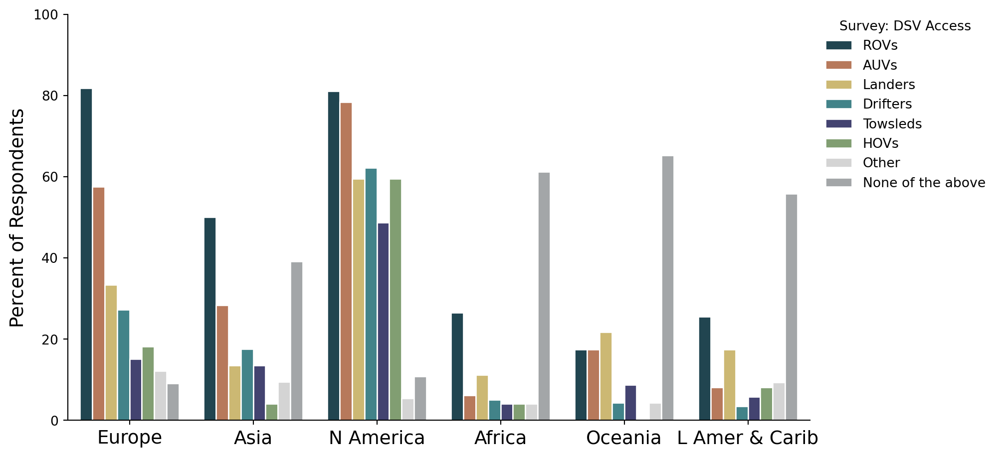

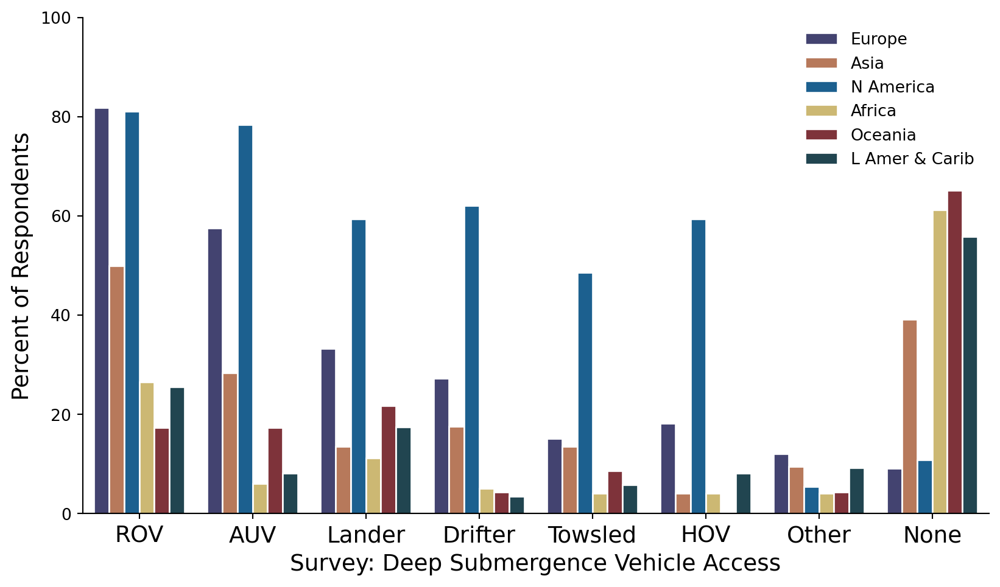

In [113]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_dataR[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc='upper left',
              title='Survey: DSV Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P1')
    
    ## P1b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_dataR[region])            

    ax.set_xticklabels(['ROV', 'AUV', 'Lander', 'Drifter', 'Towsled', 'HOV', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Deep Submergence Vehicle Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P1b')

### Q19: DSV depth (ROVs)

In [114]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea',
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']

    ## Select rovs
    rov_tow = depth.loc[depth['col_name'].isin(['Q19_rov'])].copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                24.0  20.0    5.0                            13.0   
1000 - 2000 m             5.0   9.0    5.0                             2.0   
200 - 1000 m             11.0   6.0    2.0                             5.0   
2000 - 4000 m             2.0   5.0   11.0                             1.0   
4000+ m                   1.0   NaN    3.0                             NaN   
NR                       58.0  35.0    7.0                            69.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                 \
subregion              Northern America Oceania  Africa    Asia Europe   
selection_survey_clean                                                   
0 - 200 m                           NaN     2.0   23.76   26.67  15.15   
1000 - 2000 m                       2.0     1.0    4.95   12.00  15.15   
200 - 1000 m                        1.0     1.0   10.89    8.00   6.06   
2000 - 4000 m                      12.0     NaN    1.98    6.67  33.33   
4000+ m                            18.0     1.0    0.99     NaN   9.09   
NR                                  5.0    18.0   57.43   46.67  21.21   
Total                              38.0    23.0  100.00  100.01  99.99   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                        14.44              NaN   
1000 - 2000 m                                     2.22             5.26   
200 - 1000 m                                      5.56             2.63   
2000 - 4000 m                                     1.11            31.58   
4000+ m                                            NaN            47.37   
NR                                               76.67            13.16   
Total                                           100.00           100.00   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                 8.70   64.0   17.78  
1000 - 2000 m             4.35   24.0    6.67  
200 - 1000 m              4.35   26.0    7.22  
2000 - 4000 m              NaN   31.0    8.61  
4000+ m                   4.35   23.0    6.39  
NR                       78.26  192.0   53.33  
Total                   100.01  360.0  100.00

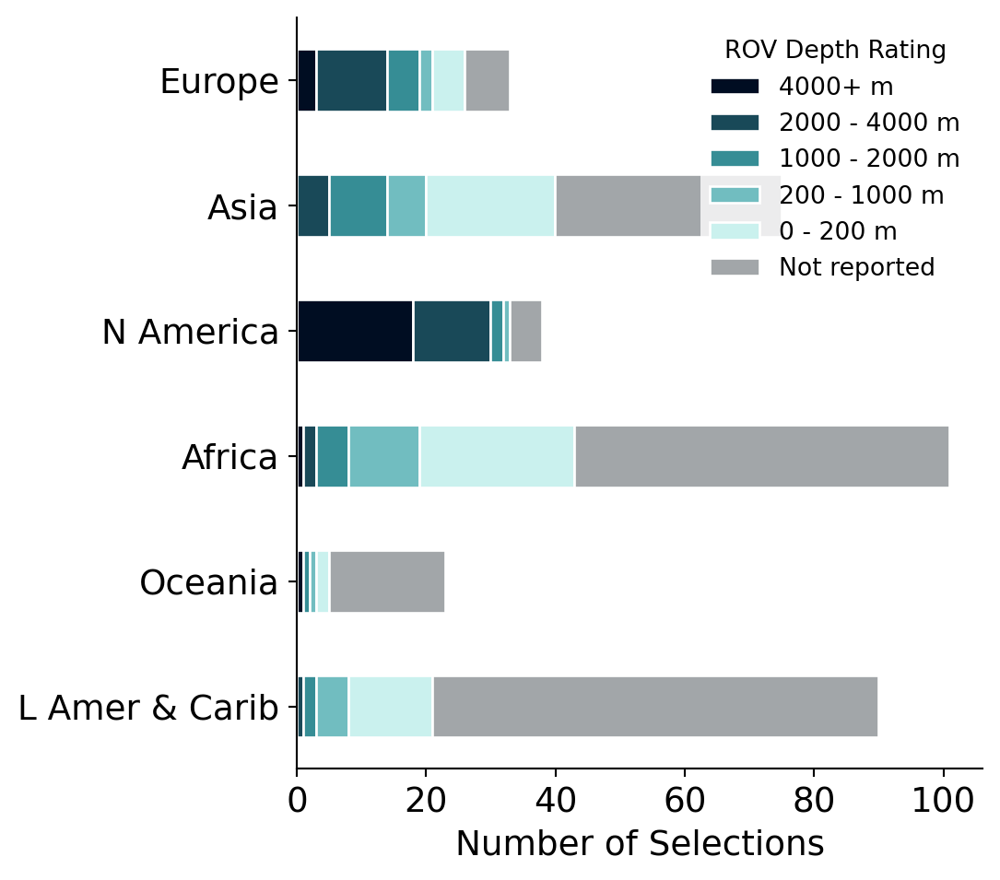

In [115]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'center right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='ROV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P2')

### Q19: DSV depth (Towsleds)

In [116]:
## Get data for figure

depth = {}  # also used in next figure
fig_data = {}
for region in region_list:
    depth[region] = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    depth[region].loc[(depth[region]['col_name'] == 'Q19_other') & (depth[region]['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth[region].loc[(depth[region]['col_name'] != 'Q19_other') & (depth[region]['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth[region] = depth[region][depth[region]['selection_survey_clean'] != '']

    ## Select towsleds
    rov_tow = depth[region].loc[depth[region]['col_name'].isin(['Q19_tow_sleds'])].copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                10.0   7.0    NaN                             3.0   
1000 - 2000 m             2.0   NaN    NaN                             4.0   
200 - 1000 m              3.0   1.0    2.0                             NaN   
2000 - 4000 m             2.0   2.0    2.0                             NaN   
4000+ m                   1.0   1.0    NaN                             NaN   
NR                       83.0  64.0   29.0                            83.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                 \
subregion              Northern America Oceania  Africa   Asia  Europe   
selection_survey_clean                                                   
0 - 200 m                           1.0     3.0    9.90   9.33     NaN   
1000 - 2000 m                       4.0     2.0    1.98    NaN     NaN   
200 - 1000 m                        3.0     1.0    2.97   1.33    6.06   
2000 - 4000 m                       8.0     NaN    1.98   2.67    6.06   
4000+ m                             4.0     NaN    0.99   1.33     NaN   
NR                                 18.0    17.0   82.18  85.33   87.88   
Total                              38.0    23.0  100.00  99.99  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         3.33             2.63   
1000 - 2000 m                                     4.44            10.53   
200 - 1000 m                                       NaN             7.89   
2000 - 4000 m                                      NaN            21.05   
4000+ m                                            NaN            10.53   
NR                                               92.22            47.37   
Total                                            99.99           100.00   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                13.04   24.0    6.67  
1000 - 2000 m             8.70   12.0    3.33  
200 - 1000 m              4.35   10.0    2.78  
2000 - 4000 m              NaN   14.0    3.89  
4000+ m                    NaN    6.0    1.67  
NR                       73.91  294.0   81.67  
Total                   100.00  360.0  100.00

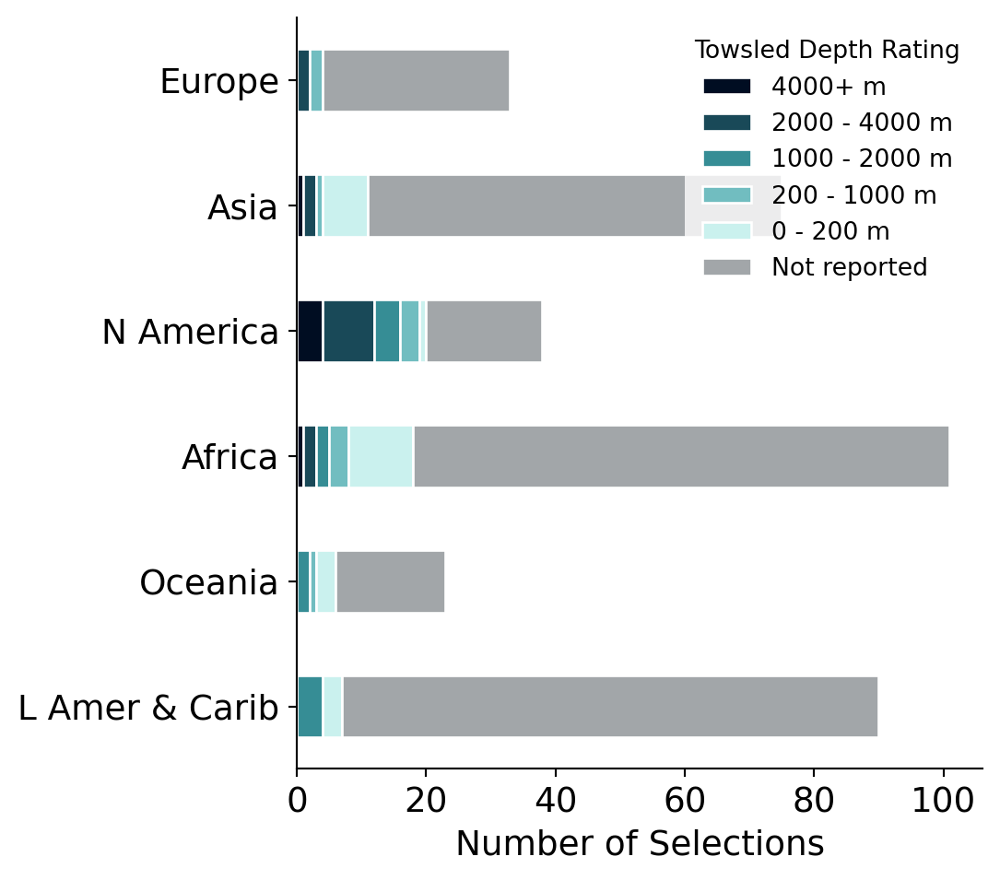

In [117]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Towsled Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P3')

### Q19: DSV depth (AUVs)

In [118]:
## Get data for figure

fig_data = {}
for region in region_list:
    # NOTE: reusing 'depth' from previous fig!
    auv = depth[region][depth[region]['col_name'].isin(['Q19_auv'])].copy()
    
    fig_data[region] = (auv.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                11.0   9.0    3.0                             2.0   
1000 - 2000 m             1.0   5.0    3.0                             3.0   
200 - 1000 m              3.0   9.0    6.0                             3.0   
2000 - 4000 m             2.0   1.0    7.0                             1.0   
4000+ m                   2.0   NaN    NaN                             NaN   
NR                       82.0  51.0   14.0                            81.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                 \
subregion              Northern America Oceania  Africa    Asia Europe   
selection_survey_clean                                                   
0 - 200 m                           NaN     1.0   10.89   12.00   9.09   
1000 - 2000 m                       6.0     2.0    0.99    6.67   9.09   
200 - 1000 m                        4.0     1.0    2.97   12.00  18.18   
2000 - 4000 m                      11.0     1.0    1.98    1.33  21.21   
4000+ m                            12.0     NaN    1.98     NaN    NaN   
NR                                  5.0    18.0   81.19   68.00  42.42   
Total                              38.0    23.0  100.00  100.00  99.99   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         2.22              NaN   
1000 - 2000 m                                     3.33            15.79   
200 - 1000 m                                      3.33            10.53   
2000 - 4000 m                                     1.11            28.95   
4000+ m                                            NaN            31.58   
NR                                               90.00            13.16   
Total                                            99.99           100.01   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                 4.35   26.0    7.22  
1000 - 2000 m             8.70   20.0    5.56  
200 - 1000 m              4.35   26.0    7.22  
2000 - 4000 m             4.35   23.0    6.39  
4000+ m                    NaN   14.0    3.89  
NR                       78.26  251.0   69.72  
Total                   100.01  360.0  100.00

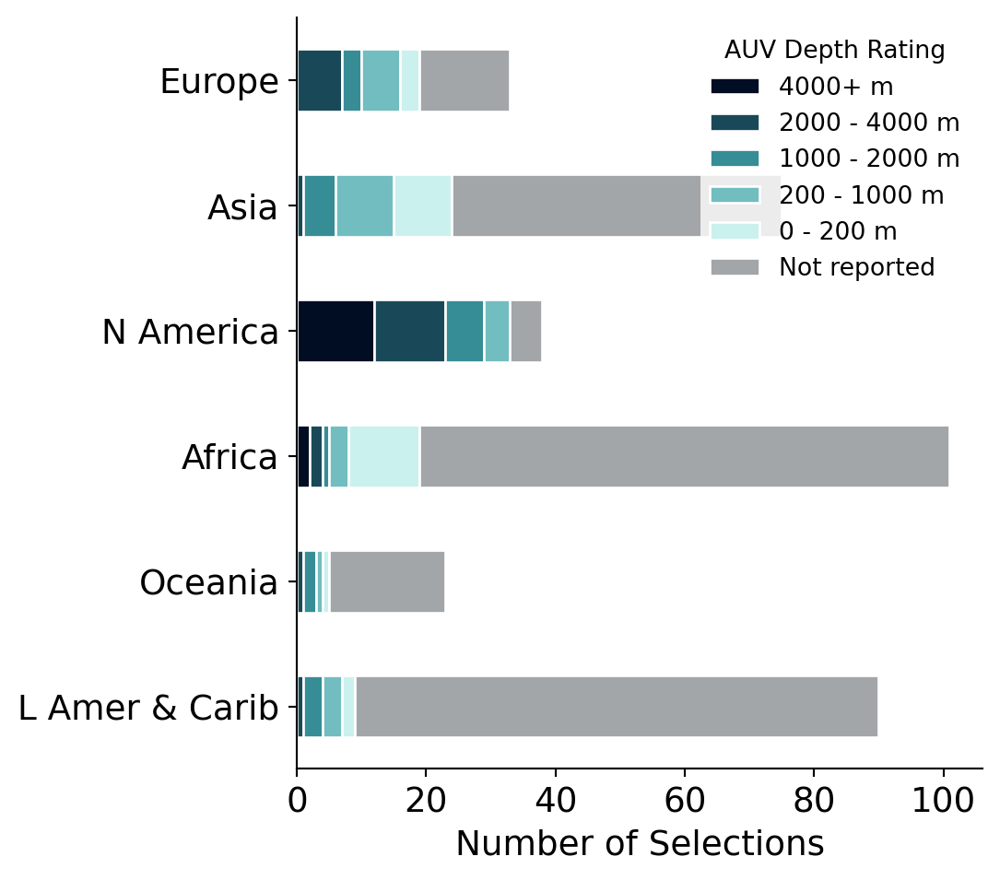

In [119]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='AUV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P4')

### Q19: DSV depth (HOVs)

In [120]:
## Get data for figure

for region in region_list:
    ## Select hovs
    # NOTE: reusing 'depth' from previous fig!
    hov = depth[region][depth[region]['col_name'].isin(['Q19_hov'])].copy()

    fig_data[region] = (hov.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['0-3,000 m'] = 0
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                 7.0   5.0    1.0                             5.0   
1000 - 2000 m             NaN   NaN    NaN                             1.0   
200 - 1000 m              5.0   2.0    2.0                             5.0   
2000 - 4000 m             1.0   NaN    2.0                             NaN   
4000+ m                   2.0   NaN    NaN                             NaN   
NR                       86.0  68.0   28.0                            79.0   
0-3,000 m                 0.0   0.0    0.0                             0.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                  \
subregion              Northern America Oceania  Africa    Asia  Europe   
selection_survey_clean                                                    
0 - 200 m                           NaN     2.0    6.93    6.67    3.03   
1000 - 2000 m                       2.0     NaN     NaN     NaN     NaN   
200 - 1000 m                        1.0     NaN    4.95    2.67    6.06   
2000 - 4000 m                      11.0     NaN    0.99     NaN    6.06   
4000+ m                            14.0     NaN    1.98     NaN     NaN   
NR                                 10.0    21.0   85.15   90.67   84.85   
0-3,000 m                           0.0     0.0    0.00    0.00    0.00   
Total                              38.0    23.0  100.00  100.01  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         5.56              NaN   
1000 - 2000 m                                     1.11             5.26   
200 - 1000 m                                      5.56             2.63   
2000 - 4000 m                                      NaN            28.95   
4000+ m                                            NaN            36.84   
NR                                               87.78            26.32   
0-3,000 m                                         0.00             0.00   
Total                                           100.01           100.00   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                  8.7   20.0    5.56  
1000 - 2000 m              NaN    3.0    0.83  
200 - 1000 m               NaN   15.0    4.17  
2000 - 4000 m              NaN   14.0    3.89  
4000+ m                    NaN   16.0    4.44  
NR                        91.3  292.0   81.11  
0-3,000 m                  0.0    0.0    0.00  
Total                    100.0  360.0  100.00

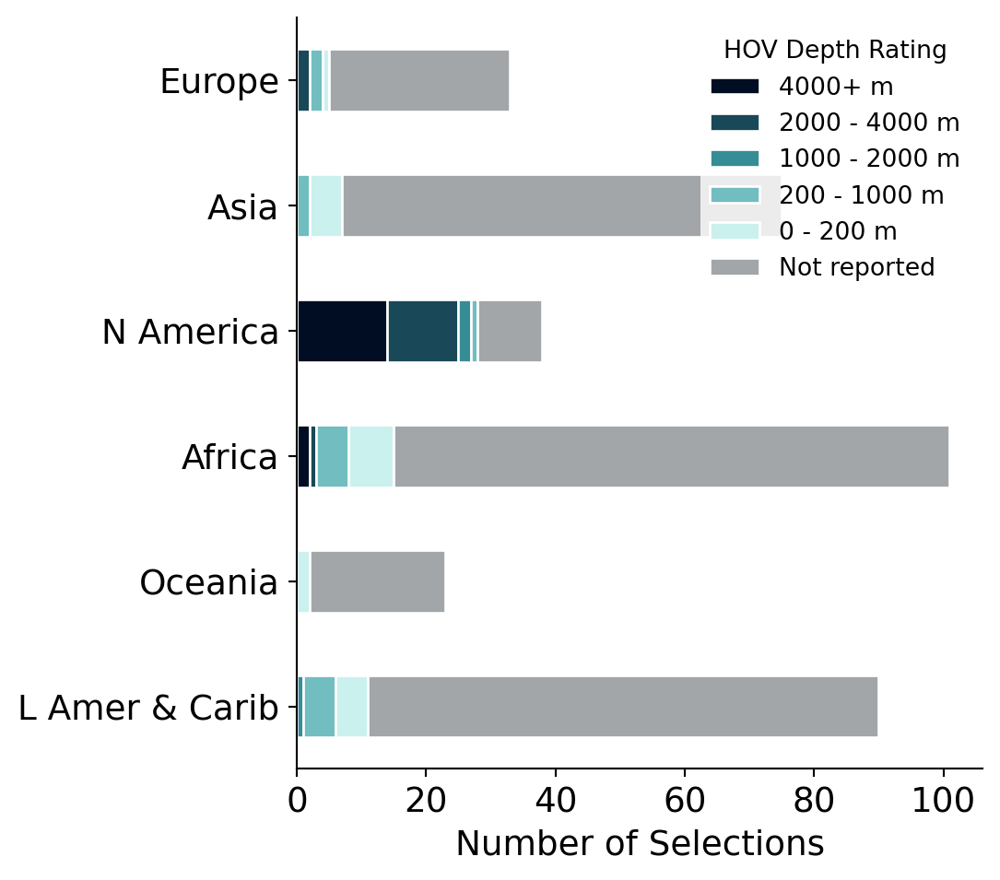

In [121]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='HOV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P5')

### Q19: Landers

In [122]:
## Get data for figure

fig_data = {}
for region in region_list:
    ## Select landers/drifters
    # NOTE: reusing 'depth' from previous fig!
    land_drift = depth[region][depth[region]['col_name'].isin(['Q19_bruv'])].copy()

    fig_data[region] = (land_drift.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                16.0   5.0    2.0                             7.0   
1000 - 2000 m             3.0   1.0    NaN                             3.0   
200 - 1000 m              6.0   3.0    2.0                             1.0   
2000 - 4000 m             3.0   1.0    3.0                             1.0   
4000+ m                   1.0   NaN    1.0                             2.0   
NR                       72.0  65.0   25.0                            76.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                  \
subregion              Northern America Oceania  Africa    Asia  Europe   
selection_survey_clean                                                    
0 - 200 m                           2.0     4.0   15.84    6.67    6.06   
1000 - 2000 m                       NaN     NaN    2.97    1.33     NaN   
200 - 1000 m                        NaN     NaN    5.94    4.00    6.06   
2000 - 4000 m                       5.0     2.0    2.97    1.33    9.09   
4000+ m                            19.0     1.0    0.99     NaN    3.03   
NR                                 12.0    16.0   71.29   86.67   75.76   
Total                              38.0    23.0  100.00  100.00  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         7.78             5.26   
1000 - 2000 m                                     3.33              NaN   
200 - 1000 m                                      1.11              NaN   
2000 - 4000 m                                     1.11            13.16   
4000+ m                                           2.22            50.00   
NR                                               84.44            31.58   
Total                                            99.99           100.00   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                17.39   36.0   10.00  
1000 - 2000 m              NaN    7.0    1.94  
200 - 1000 m               NaN   12.0    3.33  
2000 - 4000 m             8.70   15.0    4.17  
4000+ m                   4.35   24.0    6.67  
NR                       69.57  266.0   73.89  
Total                   100.01  360.0  100.00

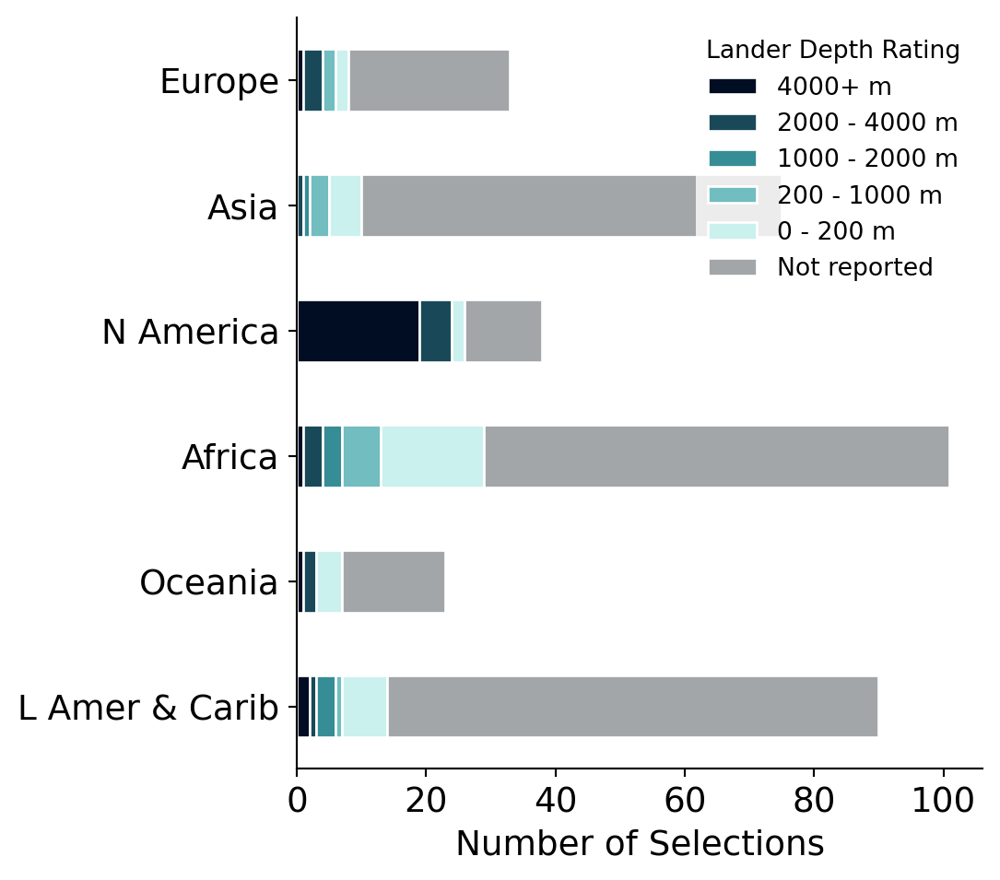

In [123]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Lander Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P6')

### Q19: Drifters

In [124]:
## Get data for figure

fig_data = {}
for region in region_list:
    ## Select landers/drifters
    land_drift = depth[region][depth[region]['col_name'].isin(['Q19_drifters'])].copy()

    fig_data[region] = (land_drift.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                       
0 - 200 m                11.0  10.0    2.0                             2.0   
1000 - 2000 m             2.0   NaN    NaN                             1.0   
200 - 1000 m              2.0   5.0    2.0                             NaN   
2000 - 4000 m             1.0   1.0    NaN                             NaN   
4000+ m                   2.0   NaN    NaN                             NaN   
NR                       83.0  59.0   29.0                            87.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                  \
subregion              Northern America Oceania  Africa    Asia  Europe   
selection_survey_clean                                                    
0 - 200 m                           4.0     1.0   10.89   13.33    6.06   
1000 - 2000 m                       4.0     NaN    1.98     NaN     NaN   
200 - 1000 m                        1.0     NaN    1.98    6.67    6.06   
2000 - 4000 m                       7.0     NaN    0.99    1.33     NaN   
4000+ m                             4.0     1.0    1.98     NaN     NaN   
NR                                 18.0    21.0   82.18   78.67   87.88   
Total                              38.0    23.0  100.00  100.00  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         2.22            10.53   
1000 - 2000 m                                     1.11            10.53   
200 - 1000 m                                       NaN             2.63   
2000 - 4000 m                                      NaN            18.42   
4000+ m                                            NaN            10.53   
NR                                               96.67            47.37   
Total                                           100.00           100.01   

                                count percent  
subregion              Oceania  Total   Total  
selection_survey_clean                         
0 - 200 m                 4.35   30.0    8.33  
1000 - 2000 m              NaN    7.0    1.94  
200 - 1000 m               NaN   10.0    2.78  
2000 - 4000 m              NaN    9.0    2.50  
4000+ m                   4.35    7.0    1.94  
NR                       91.30  297.0   82.50  
Total                   100.00  360.0  100.00

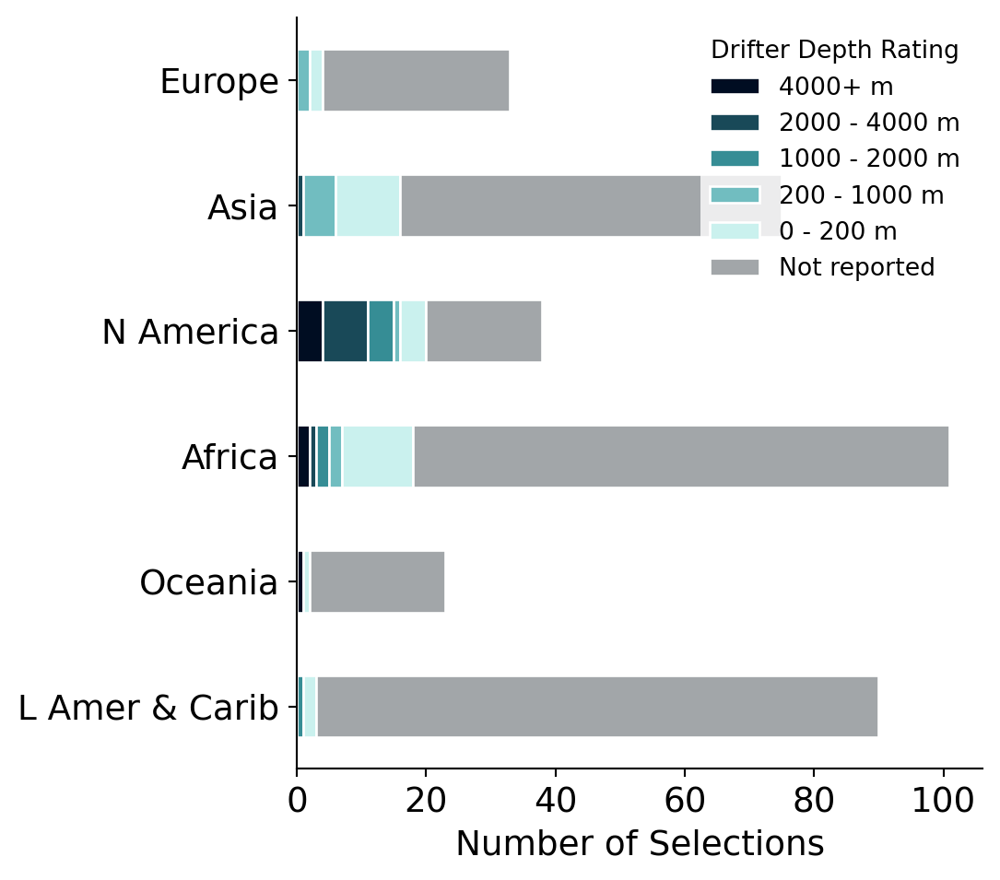

In [125]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Drifter Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P7')

### DSV Depth Rating

In [126]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']
    depth = depth[depth['selection_survey_clean'] != 'Other']

    rov_tow = depth.copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                                \
subregion              Africa   Asia Europe Latin America and the Caribbean   
selection_survey_clean                                                        
0 - 200 m                79.0   56.0   13.0                            32.0   
1000 - 2000 m            13.0   15.0    8.0                            14.0   
200 - 1000 m             30.0   26.0   16.0                            14.0   
2000 - 4000 m            11.0   10.0   25.0                             3.0   
4000+ m                   9.0    1.0    4.0                             2.0   
NR                      464.0  342.0  132.0                           475.0   
Total                   606.0  450.0  198.0                           540.0   

                                                percent                 \
subregion              Northern America Oceania  Africa   Asia  Europe   
selection_survey_clean                                                   
0 - 200 m                           7.0    13.0   13.04  12.44    6.57   
1000 - 2000 m                      18.0     5.0    2.15   3.33    4.04   
200 - 1000 m                       10.0     3.0    4.95   5.78    8.08   
2000 - 4000 m                      54.0     3.0    1.82   2.22   12.63   
4000+ m                            71.0     3.0    1.49   0.22    2.02   
NR                                 68.0   111.0   76.57  76.00   66.67   
Total                             228.0   138.0  100.02  99.99  100.01   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection_survey_clean                                                    
0 - 200 m                                         5.93             3.07   
1000 - 2000 m                                     2.59             7.89   
200 - 1000 m                                      2.59             4.39   
2000 - 4000 m                                     0.56            23.68   
4000+ m                                           0.37            31.14   
NR                                               87.96            29.82   
Total                                           100.00            99.99   

                                 count percent  
subregion              Oceania   Total   Total  
selection_survey_clean                          
0 - 200 m                 9.42   200.0    9.26  
1000 - 2000 m             3.62    73.0    3.38  
200 - 1000 m              2.17    99.0    4.58  
2000 - 4000 m             2.17   106.0    4.91  
4000+ m                   2.17    90.0    4.17  
NR                       80.43  1592.0   73.70  
Total                    99.98  2160.0  100.00

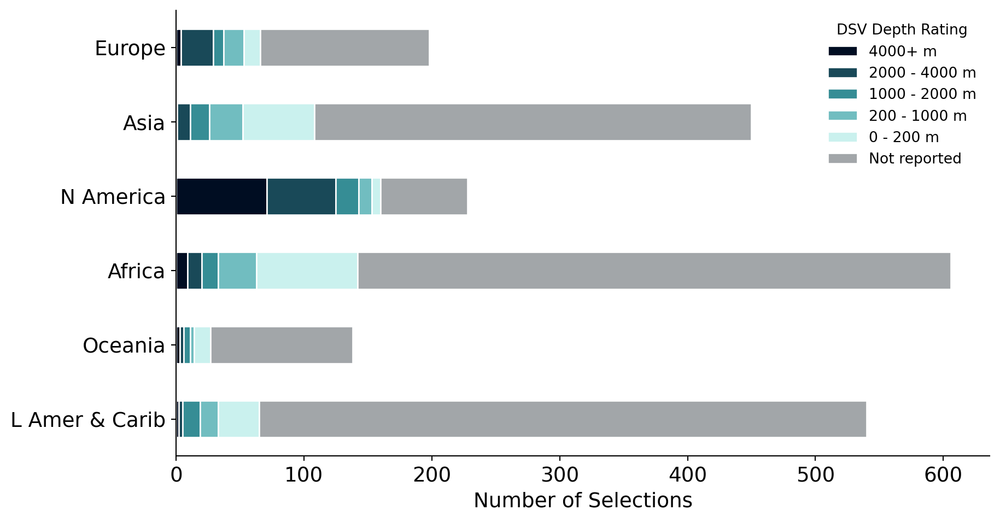

In [127]:
## Create horizontal bar plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'center right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='DSV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P8')

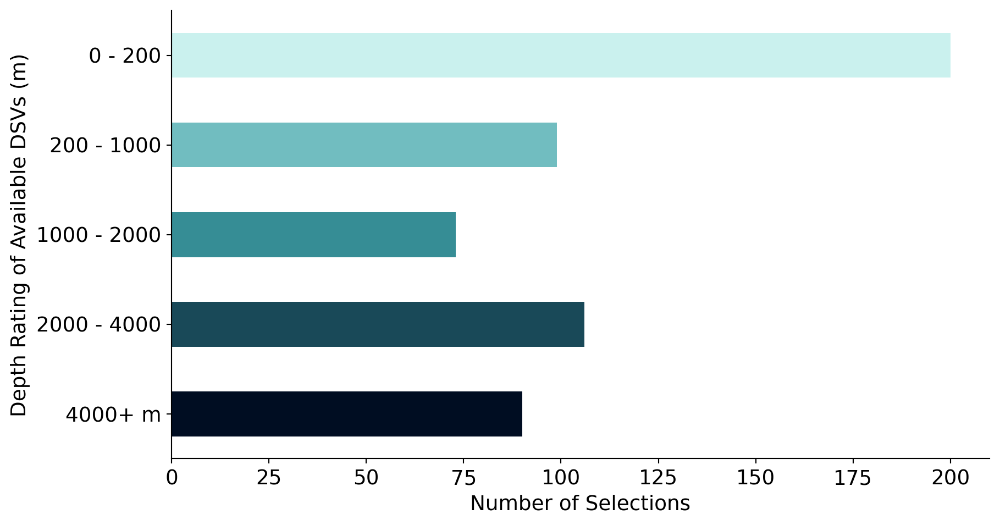

In [128]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']
    depth = depth[depth['selection_survey_clean'] != 'Other']

    fig_data[region] = (depth.groupby(['selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count'))
    fig_data[region] = fig_data[region].drop(['NR'])
    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['0 - 200 m',     '0 - 200'],
            ['200 - 1000 m',  '200 - 1000'],
            ['1000 - 2000 m', '1000 - 2000'],
            ['2000 - 4000 m', '2000 - 4000'],
            ['4000+ m',       '4000+ m']
        ],
        createmissingrows=True
    )
    

## Create horizontal bar plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    fig_data[region].iloc[::-1].plot(kind='barh', 
                  fontsize=14,
                  color=val_05,
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    ax.set_ylabel('Depth Rating of Available DSVs (m)', fontsize=14)

    outputfigs(plt, fig, ax, region, section='7', letter='P9')

## Fig Q - Q20: DSV satisfaction

In [129]:
## Select data

satisfaction = {}
missing_responses = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q20', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q20_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]
    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

In [130]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [131]:
for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)
    
    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q20_other', 'respondent_id'].nunique())

    ## Calculate statistics
    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,Africa,Asia,Europe,Latin America and the Caribbean,Northern America,Oceania,Total
col_name,,,,,,,
Q20_availability,45,31,10,57,3,13,159
Q20_capabilities,47,31,9,60,3,13,163
Q20_cost,46,30,11,60,3,13,163
Q20_depth,48,32,10,60,5,13,168
Q20_duration,48,30,9,58,3,13,161
Q20_other,101,75,33,90,38,23,360


178

count                \
subregion                              Africa   Asia Europe   
selection                                                     
1 - Very dissatisfied                    80.0   35.0    7.0   
2 - Dissatisfied                         51.0   57.0   18.0   
3 - Neither satisfied nor dissatisfied   75.0   73.0   17.0   
4 - Satisfied                            46.0   46.0   70.0   
5 - Very satisfied                       19.0   10.0    4.0   
Total                                   271.0  221.0  116.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             78.0   
2 - Dissatisfied                                                  35.0   
3 - Neither satisfied nor dissatisfied                            13.0   
4 - Satisfied                                                     21.0   
5 - Very satisfied                                                 8.0   
Total                                                            155.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                              12.0    22.0   29.52   
2 - Dissatisfied                                   31.0    10.0   18.82   
3 - Neither satisfied nor dissatisfied             33.0     7.0   27.68   
4 - Satisfied                                      52.0     9.0   16.97   
5 - Very satisfied                                 45.0     2.0    7.01   
Total                                             173.0    50.0  100.00   

                                                       \
subregion                                Asia  Europe   
selection                                               
1 - Very dissatisfied                   15.84    6.03   
2 - Dissatisfied                        25.79   15.52   
3 - Neither satisfied nor dissatisfied  33.03   14.66   
4 - Satisfied                           20.81   60.34   
5 - Very satisfied                       4.52    3.45   
Total                                   99.99  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            50.32   
2 - Dissatisfied                                                 22.58   
3 - Neither satisfied nor dissatisfied                            8.39   
4 - Satisfied                                                    13.55   
5 - Very satisfied                                                5.16   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              6.94    44.0  234.0   23.73  
2 - Dissatisfied                                  17.92    20.0  202.0   20.49  
3 - Neither satisfied nor dissatisfied            19.08    14.0  218.0   22.11  
4 - Satisfied                                     30.06    18.0  244.0   24.75  
5 - Very satisfied                                26.01     4.0   88.0    8.92  
Total                                            100.01   100.0  986.0  100.00

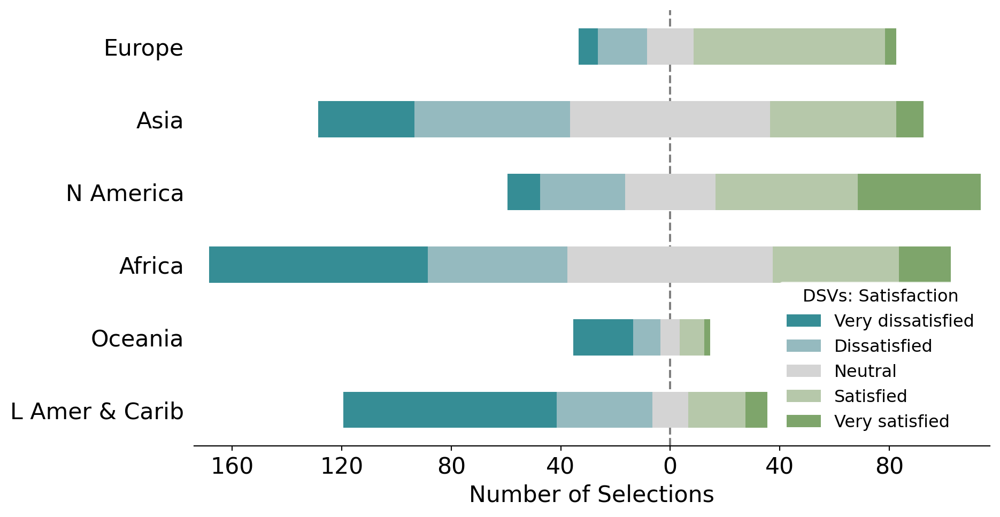

In [132]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q1')

### DSV satisfaction plot #2.

In [133]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Capabilities', 'Cost', 'Duration', 'Depth']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Depth', 'Duration']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [134]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q20_availability Q20_capabilities   
selection                                                                  
1 - Very dissatisfied                              54.0             44.0   
2 - Dissatisfied                                   51.0             37.0   
3 - Neither satisfied nor dissatisfied             49.0             37.0   
4 - Satisfied                                      39.0             53.0   
5 - Very satisfied                                  8.0             26.0   
Total                                             201.0            197.0   

                                                                        \
col_name                               Q20_cost Q20_depth Q20_duration   
selection                                                                
1 - Very dissatisfied                      49.0      44.0         43.0   
2 - Dissatisfied                           45.0      30.0         39.0   
3 - Neither satisfied nor dissatisfied     48.0      49.0         35.0   
4 - Satisfied                              43.0      50.0         59.0   
5 - Very satisfied                         12.0      19.0         23.0   
Total                                     197.0     192.0        199.0   

                                                percent                   \
col_name                               Q20_availability Q20_capabilities   
selection                                                                  
1 - Very dissatisfied                             26.87            22.34   
2 - Dissatisfied                                  25.37            18.78   
3 - Neither satisfied nor dissatisfied            24.38            18.78   
4 - Satisfied                                     19.40            26.90   
5 - Very satisfied                                 3.98            13.20   
Total                                            100.00           100.00   

                                                                        count  \
col_name                               Q20_cost Q20_depth Q20_duration  Total   
selection                                                                       
1 - Very dissatisfied                     24.87     22.92        21.61  234.0   
2 - Dissatisfied                          22.84     15.62        19.60  202.0   
3 - Neither satisfied nor dissatisfied    24.37     25.52        17.59  218.0   
4 - Satisfied                             21.83     26.04        29.65  244.0   
5 - Very satisfied                         6.09      9.90        11.56   88.0   
Total                                    100.00    100.00       100.01  986.0   

                                       percent  
col_name                                 Total  
selection                                       
1 - Very dissatisfied                    23.73  
2 - Dissatisfied                         20.49  
3 - Neither satisfied nor dissatisfied   22.11  
4 - Satisfied                            24.75  
5 - Very satisfied                        8.92  
Total                                   100.00

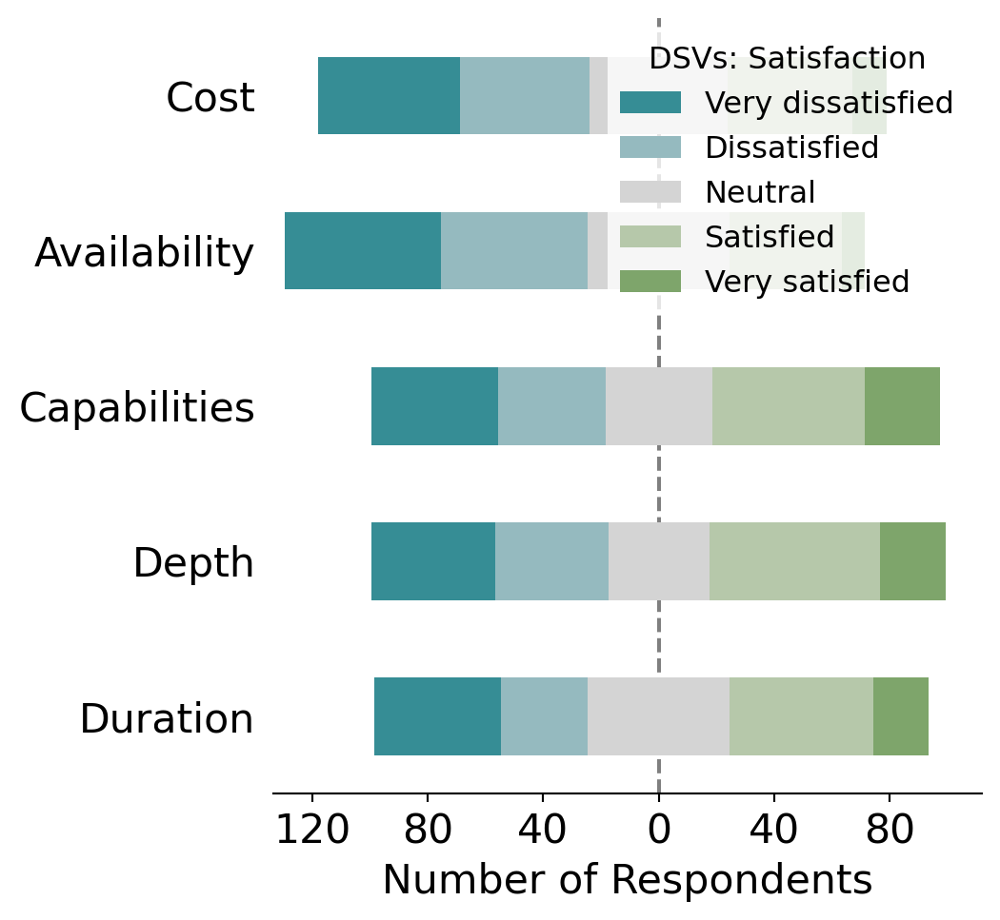

In [135]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q2')

### Q20a: DSV cost

In [136]:
## Select relevant survey data

cost = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_cost') &
                (dataR[region]['selection'] != ''), 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

In [137]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [138]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    16.0  11.0    1.0   
2 - Dissatisfied                         12.0   9.0    3.0   
3 - Neither satisfied nor dissatisfied   15.0  18.0    4.0   
4 - Satisfied                            10.0   6.0   13.0   
5 - Very satisfied                        2.0   1.0    1.0   
Total                                    55.0  45.0   22.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             14.0   
2 - Dissatisfied                                                   8.0   
3 - Neither satisfied nor dissatisfied                             1.0   
4 - Satisfied                                                      4.0   
5 - Very satisfied                                                 3.0   
Total                                                             30.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               3.0     4.0   29.09   
2 - Dissatisfied                                   11.0     2.0   21.82   
3 - Neither satisfied nor dissatisfied              8.0     2.0   27.27   
4 - Satisfied                                       9.0     1.0   18.18   
5 - Very satisfied                                  4.0     1.0    3.64   
Total                                              35.0    10.0  100.00   

                                                       \
subregion                                Asia  Europe   
selection                                               
1 - Very dissatisfied                   24.44    4.55   
2 - Dissatisfied                        20.00   13.64   
3 - Neither satisfied nor dissatisfied  40.00   18.18   
4 - Satisfied                           13.33   59.09   
5 - Very satisfied                       2.22    4.55   
Total                                   99.99  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            46.67   
2 - Dissatisfied                                                 26.67   
3 - Neither satisfied nor dissatisfied                            3.33   
4 - Satisfied                                                    13.33   
5 - Very satisfied                                               10.00   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              8.57    40.0   49.0   24.87  
2 - Dissatisfied                                  31.43    20.0   45.0   22.84  
3 - Neither satisfied nor dissatisfied            22.86    20.0   48.0   24.37  
4 - Satisfied                                     25.71    10.0   43.0   21.83  
5 - Very satisfied                                11.43    10.0   12.0    6.09  
Total                                            100.00   100.0  197.0  100.00

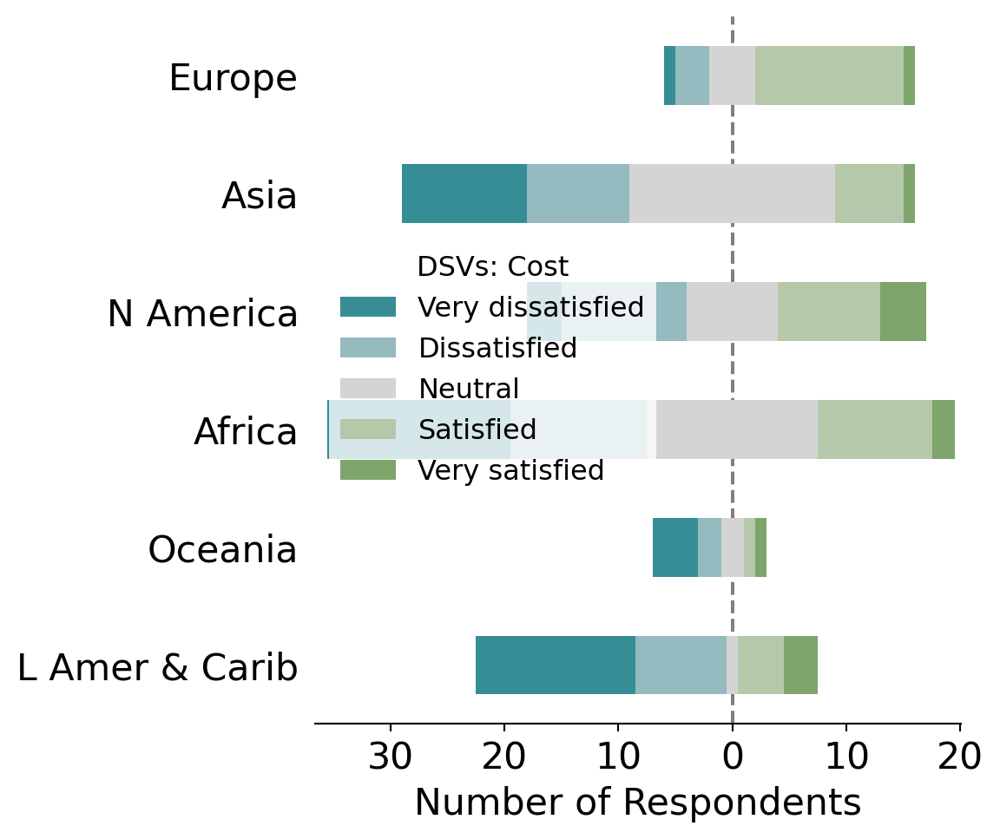

In [139]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Europe': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q3')

### Q20b: DSV availability

In [140]:
## Select relevant survey data

availability = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [141]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

for region in region_list:
    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [142]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    18.0   7.0    2.0   
2 - Dissatisfied                         13.0  12.0    6.0   
3 - Neither satisfied nor dissatisfied   15.0  14.0    4.0   
4 - Satisfied                             8.0  10.0   11.0   
5 - Very satisfied                        2.0   1.0    NaN   
Total                                    56.0  44.0   23.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             18.0   
2 - Dissatisfied                                                   9.0   
3 - Neither satisfied nor dissatisfied                             2.0   
4 - Satisfied                                                      3.0   
5 - Very satisfied                                                 1.0   
Total                                                             33.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               4.0     5.0   32.14   
2 - Dissatisfied                                    9.0     2.0   23.21   
3 - Neither satisfied nor dissatisfied             12.0     2.0   26.79   
4 - Satisfied                                       7.0     NaN   14.29   
5 - Very satisfied                                  3.0     1.0    3.57   
Total                                              35.0    10.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                    15.91    8.70   
2 - Dissatisfied                         27.27   26.09   
3 - Neither satisfied nor dissatisfied   31.82   17.39   
4 - Satisfied                            22.73   47.83   
5 - Very satisfied                        2.27     NaN   
Total                                   100.00  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            54.55   
2 - Dissatisfied                                                 27.27   
3 - Neither satisfied nor dissatisfied                            6.06   
4 - Satisfied                                                     9.09   
5 - Very satisfied                                                3.03   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                             11.43    50.0   54.0   26.87  
2 - Dissatisfied                                  25.71    20.0   51.0   25.37  
3 - Neither satisfied nor dissatisfied            34.29    20.0   49.0   24.38  
4 - Satisfied                                     20.00     NaN   39.0   19.40  
5 - Very satisfied                                 8.57    10.0    8.0    3.98  
Total                                            100.00   100.0  201.0  100.00

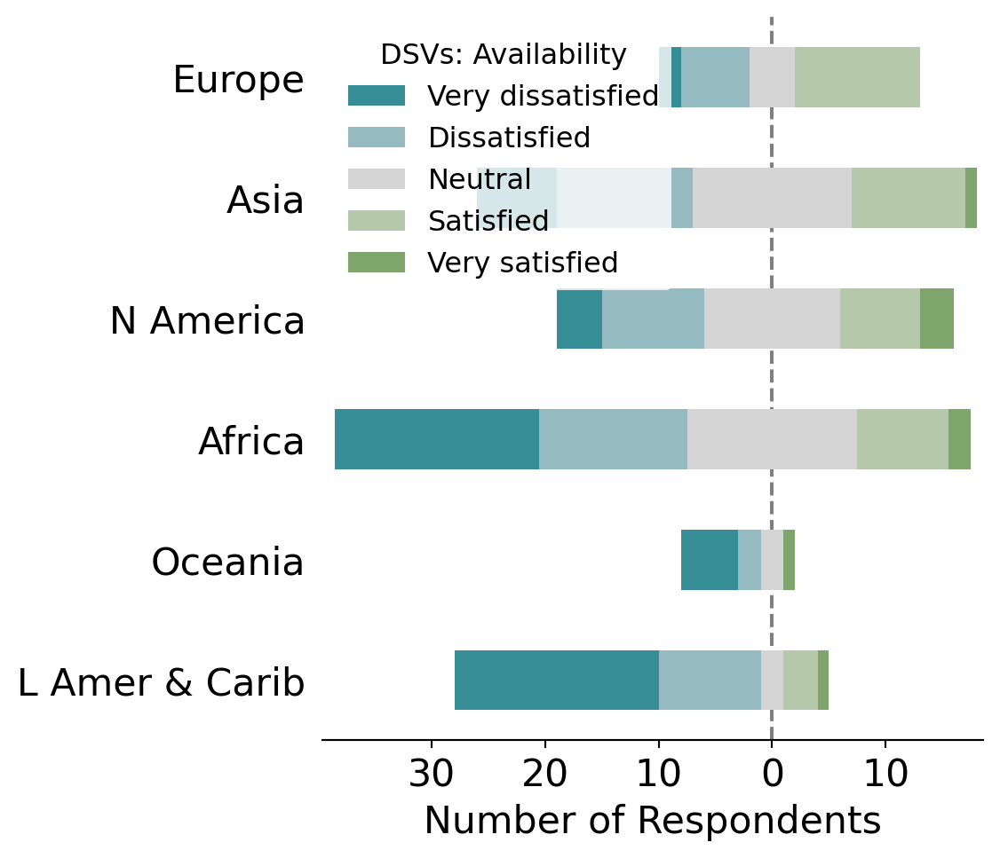

In [143]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q4')

### Q20c: DSV capabilities

In [144]:
## Select relevant survey data

capabilities = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [145]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [146]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    16.0   6.0    1.0   
2 - Dissatisfied                          7.0  11.0    4.0   
3 - Neither satisfied nor dissatisfied   15.0  13.0    3.0   
4 - Satisfied                            10.0  10.0   16.0   
5 - Very satisfied                        6.0   4.0    NaN   
Total                                    54.0  44.0   24.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             16.0   
2 - Dissatisfied                                                   8.0   
3 - Neither satisfied nor dissatisfied                             2.0   
4 - Satisfied                                                      3.0   
5 - Very satisfied                                                 1.0   
Total                                                             30.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     4.0   29.63   
2 - Dissatisfied                                    5.0     2.0   12.96   
3 - Neither satisfied nor dissatisfied              4.0     NaN   27.78   
4 - Satisfied                                      10.0     4.0   18.52   
5 - Very satisfied                                 15.0     NaN   11.11   
Total                                              35.0    10.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                    13.64    4.17   
2 - Dissatisfied                         25.00   16.67   
3 - Neither satisfied nor dissatisfied   29.55   12.50   
4 - Satisfied                            22.73   66.67   
5 - Very satisfied                        9.09     NaN   
Total                                   100.01  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            53.33   
2 - Dissatisfied                                                 26.67   
3 - Neither satisfied nor dissatisfied                            6.67   
4 - Satisfied                                                    10.00   
5 - Very satisfied                                                3.33   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.86    40.0   44.0   22.34  
2 - Dissatisfied                                  14.29    20.0   37.0   18.78  
3 - Neither satisfied nor dissatisfied            11.43     NaN   37.0   18.78  
4 - Satisfied                                     28.57    40.0   53.0   26.90  
5 - Very satisfied                                42.86     NaN   26.0   13.20  
Total                                            100.01   100.0  197.0  100.00

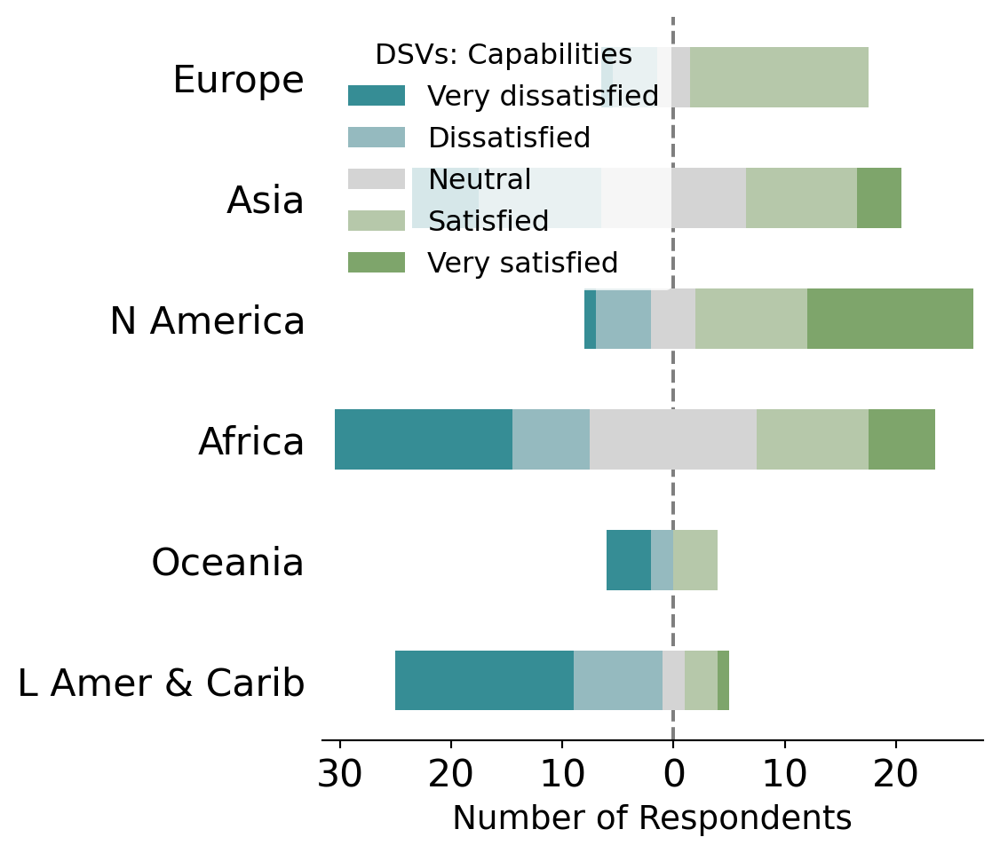

In [147]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Europe': 'upper left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q5')

### Q20d: DSV depth

In [148]:
## Select relevant survey data

depth = {}
for region in region_list:
    depth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_depth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [149]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = depth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [150]:
## Calculate statistics

for region in region_list:
    percent_data = (depth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = depth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    16.0   5.0    1.0   
2 - Dissatisfied                          6.0  14.0    1.0   
3 - Neither satisfied nor dissatisfied   16.0  16.0    5.0   
4 - Satisfied                            10.0   6.0   16.0   
5 - Very satisfied                        5.0   2.0    NaN   
Total                                    53.0  43.0   23.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             15.0   
2 - Dissatisfied                                                   5.0   
3 - Neither satisfied nor dissatisfied                             5.0   
4 - Satisfied                                                      4.0   
5 - Very satisfied                                                 1.0   
Total                                                             30.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               3.0     4.0   30.19   
2 - Dissatisfied                                    2.0     2.0   11.32   
3 - Neither satisfied nor dissatisfied              5.0     2.0   30.19   
4 - Satisfied                                      12.0     2.0   18.87   
5 - Very satisfied                                 11.0     NaN    9.43   
Total                                              33.0    10.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                    11.63    4.35   
2 - Dissatisfied                         32.56    4.35   
3 - Neither satisfied nor dissatisfied   37.21   21.74   
4 - Satisfied                            13.95   69.57   
5 - Very satisfied                        4.65     NaN   
Total                                   100.00  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            50.00   
2 - Dissatisfied                                                 16.67   
3 - Neither satisfied nor dissatisfied                           16.67   
4 - Satisfied                                                    13.33   
5 - Very satisfied                                                3.33   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              9.09    40.0   44.0   22.92  
2 - Dissatisfied                                   6.06    20.0   30.0   15.62  
3 - Neither satisfied nor dissatisfied            15.15    20.0   49.0   25.52  
4 - Satisfied                                     36.36    20.0   50.0   26.04  
5 - Very satisfied                                33.33     NaN   19.0    9.90  
Total                                             99.99   100.0  192.0  100.00

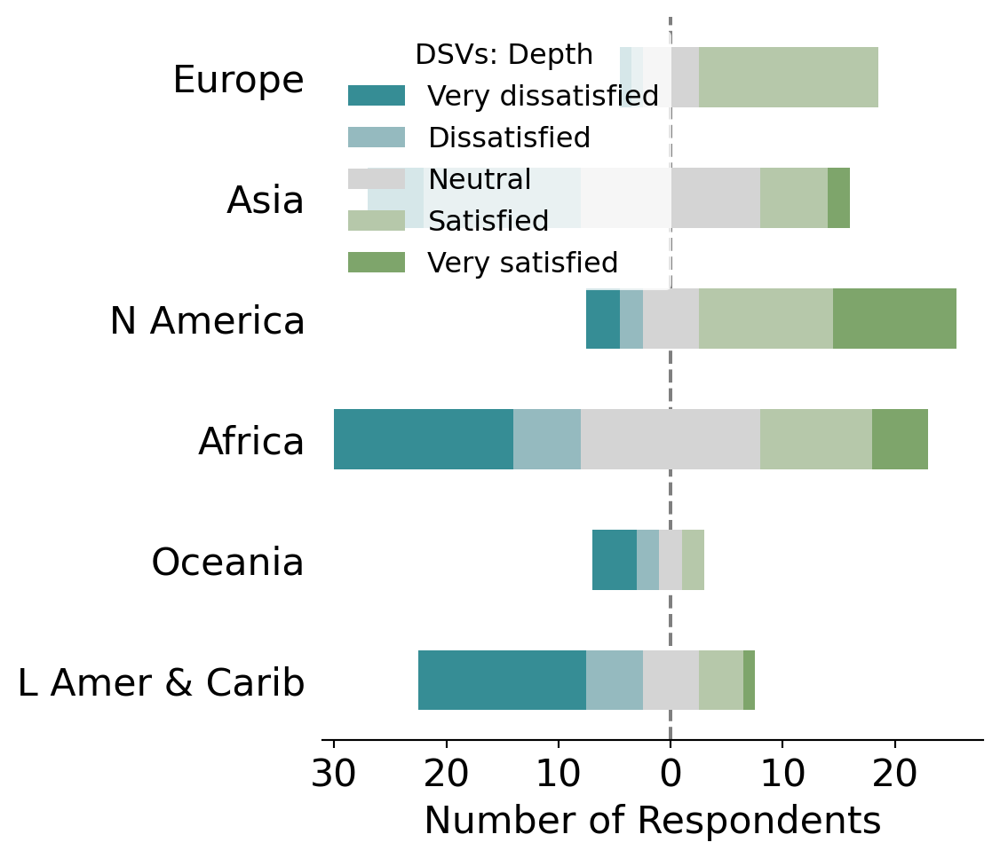

In [151]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Global': 'upper left', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Depth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q6')

### Q20e: DSV duration

In [152]:
## Select relevant survey data

duration = {}
for region in region_list:
    duration[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_duration') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [153]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = duration[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [154]:
## Calculate statistics

for region in region_list:
    percent_data = (duration[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = duration[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    14.0   6.0    2.0   
2 - Dissatisfied                         13.0  11.0    4.0   
3 - Neither satisfied nor dissatisfied   14.0  12.0    1.0   
4 - Satisfied                             8.0  14.0   14.0   
5 - Very satisfied                        4.0   2.0    3.0   
Total                                    53.0  45.0   24.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             15.0   
2 - Dissatisfied                                                   5.0   
3 - Neither satisfied nor dissatisfied                             3.0   
4 - Satisfied                                                      7.0   
5 - Very satisfied                                                 2.0   
Total                                                             32.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     5.0   26.42   
2 - Dissatisfied                                    4.0     2.0   24.53   
3 - Neither satisfied nor dissatisfied              4.0     1.0   26.42   
4 - Satisfied                                      14.0     2.0   15.09   
5 - Very satisfied                                 12.0     NaN    7.55   
Total                                              35.0    10.0  100.01   

                                                       \
subregion                                Asia  Europe   
selection                                               
1 - Very dissatisfied                   13.33    8.33   
2 - Dissatisfied                        24.44   16.67   
3 - Neither satisfied nor dissatisfied  26.67    4.17   
4 - Satisfied                           31.11   58.33   
5 - Very satisfied                       4.44   12.50   
Total                                   99.99  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            46.88   
2 - Dissatisfied                                                 15.62   
3 - Neither satisfied nor dissatisfied                            9.38   
4 - Satisfied                                                    21.88   
5 - Very satisfied                                                6.25   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.86    50.0   43.0   21.61  
2 - Dissatisfied                                  11.43    20.0   39.0   19.60  
3 - Neither satisfied nor dissatisfied            11.43    10.0   35.0   17.59  
4 - Satisfied                                     40.00    20.0   59.0   29.65  
5 - Very satisfied                                34.29     NaN   23.0   11.56  
Total                                            100.01   100.0  199.0  100.00

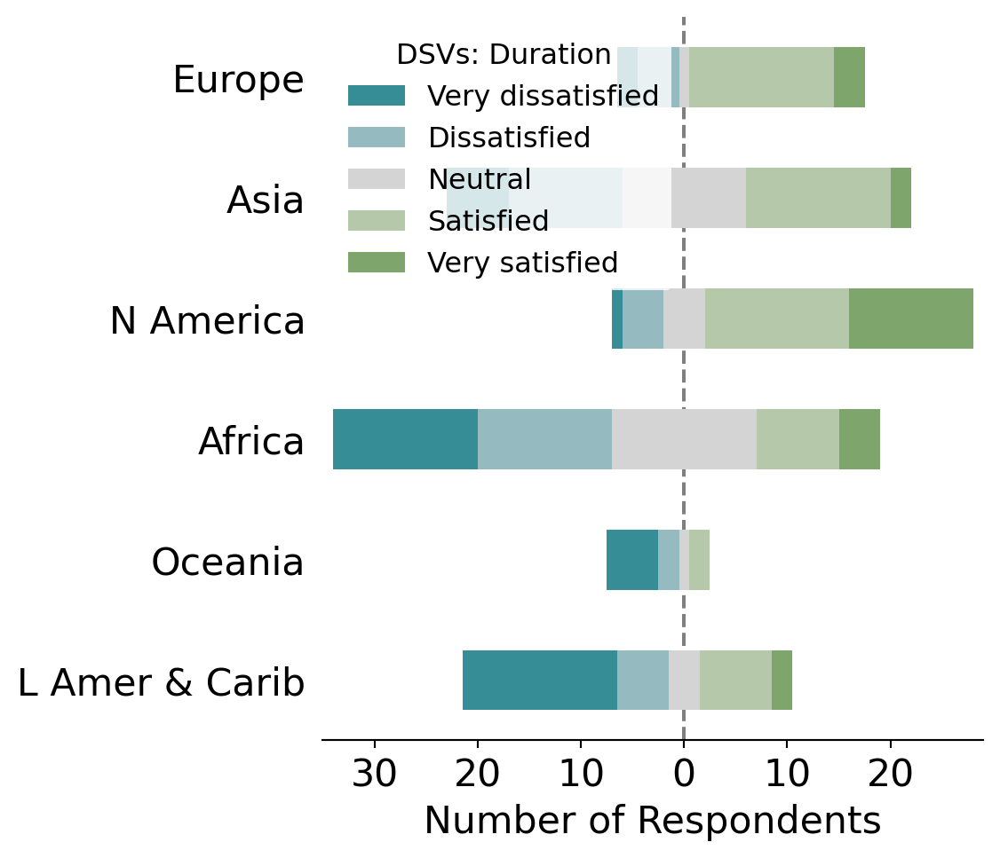

In [155]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Duration',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q7')

## Fig R - Q17: DSV importance

In [156]:
## Select relevant survey data

importance = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q17'), ['respondent_id', 'subregion', 'col_name', 'selection']] 

In [157]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

fig_data = {}
for region in region_list:
    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [158]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection                                                                    
1 - Not important        12.0   7.0    2.0                            19.0   
2 - A little important    4.0   4.0    1.0                             6.0   
3 - Somewhat important   16.0  12.0    6.0                            17.0   
4 - Important             8.0  13.0    4.0                             5.0   
5 - Very important       61.0  39.0   20.0                            43.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                 \
subregion              Northern America Oceania  Africa   Asia  Europe   
selection                                                                
1 - Not important                   2.0     4.0   11.88   9.33    6.06   
2 - A little important              2.0     4.0    3.96   5.33    3.03   
3 - Somewhat important              3.0     5.0   15.84  16.00   18.18   
4 - Important                       5.0     3.0    7.92  17.33   12.12   
5 - Very important                 26.0     7.0   60.40  52.00   60.61   
Total                              38.0    23.0  100.00  99.99  100.00   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection                                                                 
1 - Not important                                21.11             5.26   
2 - A little important                            6.67             5.26   
3 - Somewhat important                           18.89             7.89   
4 - Important                                     5.56            13.16   
5 - Very important                               47.78            68.42   
Total                                           100.01            99.99   

                                count percent  
subregion              Oceania  Total   Total  
selection                                      
1 - Not important        17.39   46.0   12.78  
2 - A little important   17.39   21.0    5.83  
3 - Somewhat important   21.74   59.0   16.39  
4 - Important            13.04   38.0   10.56  
5 - Very important       30.43  196.0   54.44  
Total                    99.99  360.0  100.00

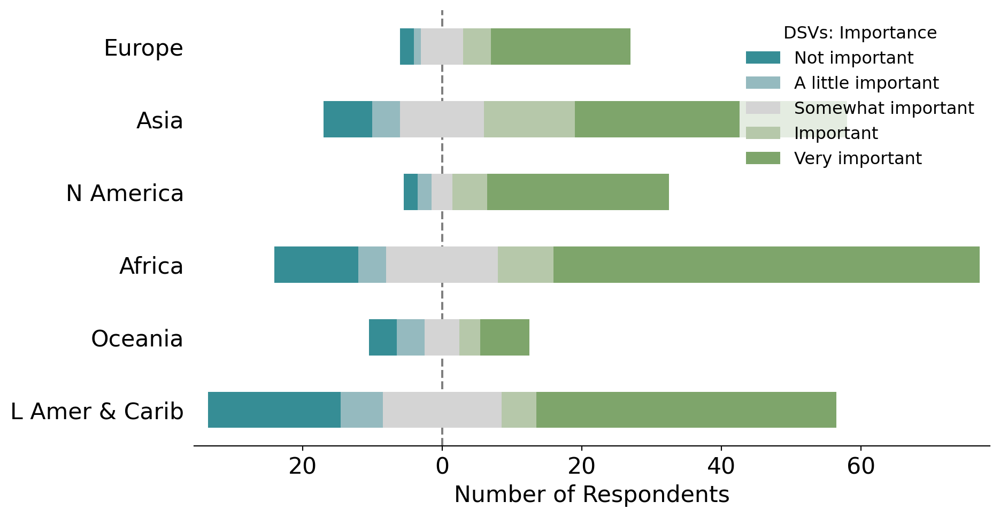

In [159]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='R1')

### Q21: DSV potential

In [160]:
## Select relevant survey data
potential = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q21'), ['respondent_id', 'subregion', 'col_name', 'selection']]

In [161]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

fig_data = {}
for region in region_list:
    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'},
                      inplace=True)

In [162]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion           Africa  Asia Europe Latin America and the Caribbean   
selection                                                                 
1 - No impact         12.0   6.0    1.0                             8.0   
2 - Little impact      2.0   6.0    NaN                             5.0   
3 - Moderate impact   16.0   9.0    9.0                            18.0   
4 - High impact       11.0  14.0   11.0                             6.0   
5 - Transformative    60.0  40.0   12.0                            53.0   
Total                101.0  75.0   33.0                            90.0   

                                             percent                 \
subregion           Northern America Oceania  Africa    Asia Europe   
selection                                                             
1 - No impact                    NaN     3.0   11.88    8.00   3.03   
2 - Little impact                2.0     1.0    1.98    8.00    NaN   
3 - Moderate impact              2.0     3.0   15.84   12.00  27.27   
4 - High impact                 12.0     6.0   10.89   18.67  33.33   
5 - Transformative              22.0    10.0   59.41   53.33  36.36   
Total                           38.0    23.0  100.00  100.00  99.99   

                                                                              \
subregion           Latin America and the Caribbean Northern America Oceania   
selection                                                                      
1 - No impact                                  8.89              NaN   13.04   
2 - Little impact                              5.56             5.26    4.35   
3 - Moderate impact                           20.00             5.26   13.04   
4 - High impact                                6.67            31.58   26.09   
5 - Transformative                            58.89            57.89   43.48   
Total                                        100.01            99.99  100.00   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         30.0    8.33  
2 - Little impact     16.0    4.44  
3 - Moderate impact   57.0   15.83  
4 - High impact       60.0   16.67  
5 - Transformative   197.0   54.72  
Total                360.0  100.00

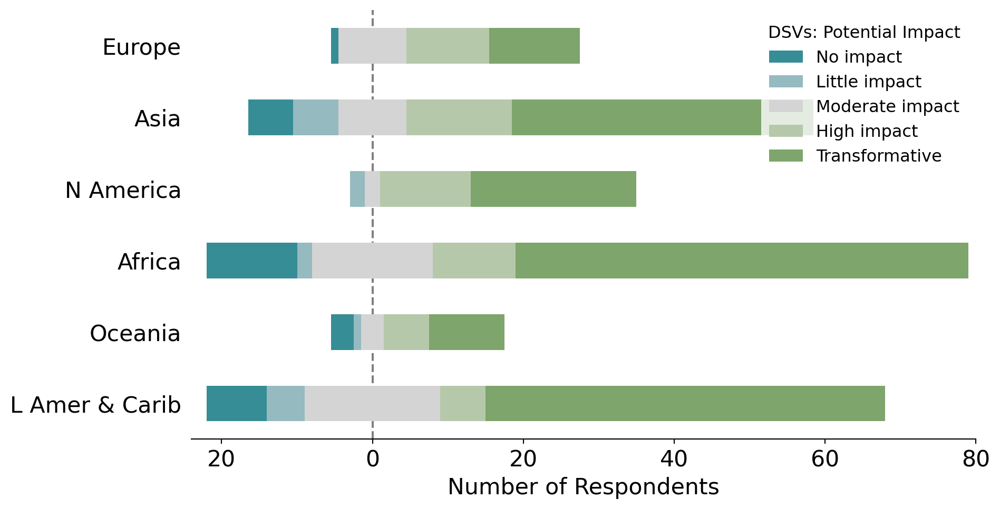

In [163]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='R2')

---
# **Section 8**

## Fig S - Sensor presence

In [164]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    sensor_presence = researchR[region].loc[(researchR[region]['question'] == 'Q24') &
                                   (researchR[region]['col_name'] != 'Q24_comments'), ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    sensor_presence['selection_binary'] = sensor_presence['research_tech_clean']

    fig_data[region] = (sensor_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = sensor_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q24_ctd':            'CTD',
        'Q24_water_sampling': 'Water sampling',
        'Q24_o2':             'Oxygen, pH, eH',
        'Q24_mapping':        'Seafloor mapping',
        'Q24_imaging':        'Imaging',
        'Q24_navigation':     'Navigation',
        'Q24_eDNA':           'eDNA sampling',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'ctd'):('count', 'water')].sum()
    pivoted.loc['Total', ('percent', 'ctd'):('percent', 'water')] = \
        ((pivoted.loc['Total', ('count', 'ctd'):('count', 'water')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

    ## Names of GeoAreas with all types present
    num_types = (sensor_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])

    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])

    ## % of areas in region that have all types
    num_types = (sensor_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    display(round((num_types[num_types['num_types'] == 7].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                                                     \
col_name         CTD Imaging Navigation Oxygen, pH, eH Seafloor mapping   
subregion                                                                 
Africa          10.0    18.0       21.0            8.0             14.0   
Asia            23.0    16.0       17.0           18.0             19.0   
Europe          20.0    18.0       16.0           17.0             19.0   
L Amer & Carib  23.0    16.0       28.0           24.0             24.0   
N America        4.0     4.0        4.0            4.0              3.0   
Oceania         12.0    14.0       19.0           14.0             15.0   
Total           92.0    86.0      105.0           85.0             94.0   

                                            percent                     \
col_name       Water sampling eDNA sampling     CTD Imaging Navigation   
subregion                                                                
Africa                   16.0           3.0   22.73   40.91      47.73   
Asia                     22.0          14.0   76.67   53.33      56.67   
Europe                   18.0          18.0   86.96   78.26      69.57   
L Amer & Carib           31.0          14.0   46.00   32.00      56.00   
N America                 3.0           3.0   80.00   80.00      80.00   
Oceania                  17.0           8.0   42.86   50.00      67.86   
Total                   107.0          60.0  355.22  334.50     377.83   

                                                                             
col_name       Oxygen, pH, eH Seafloor mapping Water sampling eDNA sampling  
subregion                                                                    
Africa                  18.18            31.82          36.36          6.82  
Asia                    60.00            63.33          73.33         46.67  
Europe                  73.91            82.61          78.26         78.26  
L Amer & Carib          48.00            48.00          62.00         28.00  
N America               80.00            60.00          60.00         60.00  
Oceania                 50.00            53.57          60.71         28.57  
Total                  330.09           339.33         370.66        100.00

,subregion,geoarea,num_types
0,Africa,Algeria,7
12,Africa,Egypt,7
26,Africa,Mayotte,7
46,Asia,China,7
47,Asia,Cyprus,7
50,Asia,India,7
54,Asia,Japan,7
57,Asia,Malaysia,7
75,Europe,Bulgaria,7
78,Europe,France,7


,subregion,geoarea,num_types
1,Africa,Angola,0
4,Africa,Cabo Verde,0
5,Africa,Cameroon,0
6,Africa,Chagos Archipelago,0
11,Africa,Djibouti,0
14,Africa,Eritrea,0
16,Africa,Gambia,0
17,Africa,Ghana,0
19,Africa,Guinea-Bissau,0
21,Africa,Liberia,0


18.33

40.0

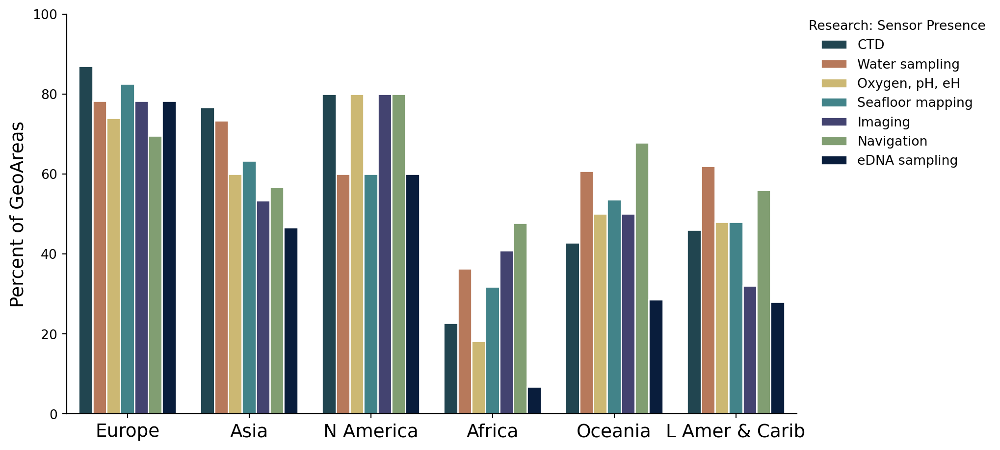

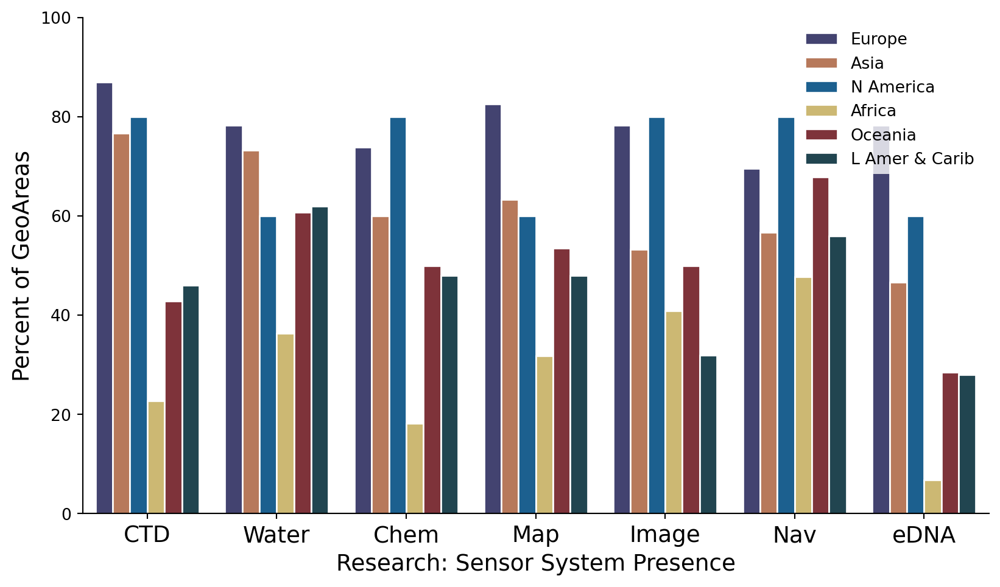

In [165]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07,
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Sensor Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='S1')

    ## S2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(['CTD', 'Water', 'Chem', 'Map', 'Image', 'Nav', 'eDNA'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Sensor System Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='S2')

## Fig T - Q24: Sensor Access

In [166]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q24', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'CTD':            'CTD',
        'Water sampling':                               'Water sampling',
        'Oxygen, pH, and/or eH':                        'Oxygen, pH, eH',
        'Seafloor mapping (sidescan and/or multibeam)': 'Seafloor mapping',
        'Imaging (still and/or video)':                 'Imaging',
        'Navigation/tracking (USBL, LBL, etc.)':        'Navigation',
        'eDNA sampling':                                'eDNA sampling',
        'Other':                                        'Other',
        'None of the above':                            'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    vessels['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                                \
subregion              Africa  Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                        
CTD                      49.0  53.0   29.0           33.0      34.0     7.0   
Imaging                  21.0  36.0   23.0           17.0      30.0     6.0   
Navigation               11.0  30.0   17.0            9.0      31.0     6.0   
None of the above        29.0   8.0    2.0           42.0       3.0     7.0   
Other                     7.0   5.0    3.0            3.0       5.0     3.0   
Oxygen, pH, eH           48.0  48.0   25.0           33.0      31.0     8.0   
Seafloor mapping         26.0  41.0   25.0           30.0      32.0     6.0   
Water sampling           54.0  48.0   25.0           38.0      29.0    10.0   
eDNA sampling             7.0  10.0   12.0            6.0      22.0     3.0   
Total                    98.0  74.0   33.0           90.0      38.0    22.0   

                       percent                                                 \
subregion               Africa   Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                          
CTD                      50.00  71.62  87.88          36.67     89.47   31.82   
Imaging                  21.43  48.65  69.70          18.89     78.95   27.27   
Navigation               11.22  40.54  51.52          10.00     81.58   27.27   
None of the above        29.59  10.81   6.06          46.67      7.89   31.82   
Other                     7.14   6.76   9.09           3.33     13.16   13.64   
Oxygen, pH, eH           48.98  64.86  75.76          36.67     81.58   36.36   
Seafloor mapping         26.53  55.41  75.76          33.33     84.21   27.27   
Water sampling           55.10  64.86  75.76          42.22     76.32   45.45   
eDNA sampling             7.14  13.51  36.36           6.67     57.89   13.64   
Total                    27.61  20.85   9.30          25.35     10.70    6.20   

                        count percent  
subregion               Total   Total  
selection_survey_clean                 
CTD                     205.0   57.75  
Imaging                 133.0   37.46  
Navigation              104.0   29.30  
None of the above        91.0   25.63  
Other                    26.0    7.32  
Oxygen, pH, eH          193.0   54.37  
Seafloor mapping        160.0   45.07  
Water sampling          204.0   57.46  
eDNA sampling            60.0   16.90  
Total                   355.0  100.00

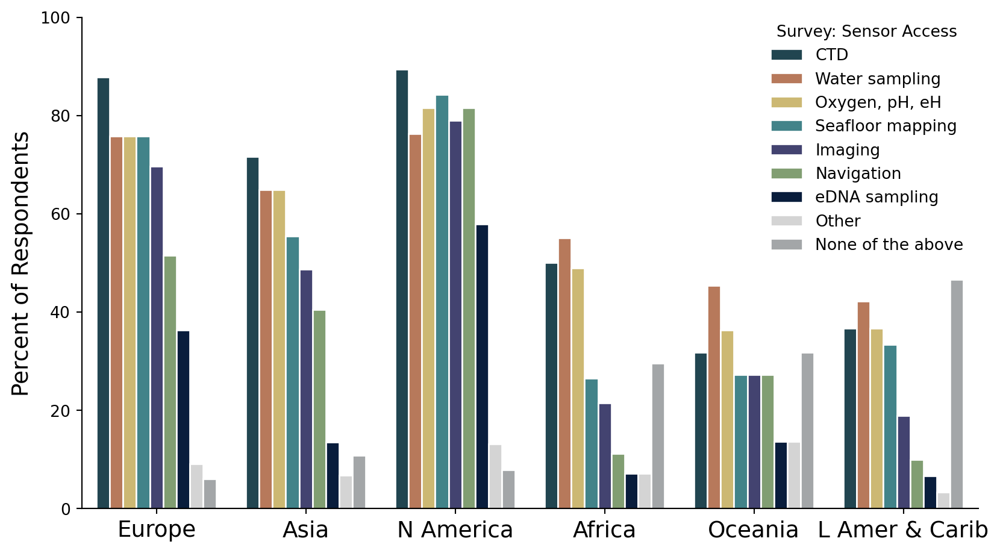

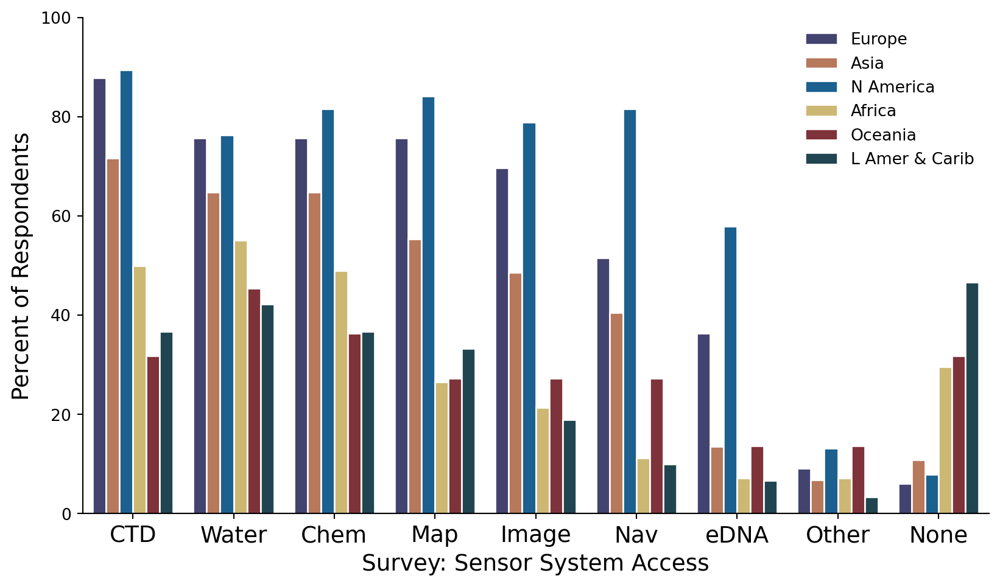

In [167]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(bbox_to_anchor=(1, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Survey: Sensor Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='T1')

    ## T2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['CTD', 'Water', 'Chem', 'Map', 'Image', 'Nav', 'eDNA', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Sensor System Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='T2')

## Fig U - Q25: Sensor satisfaction

In [168]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

satisfaction = {}
missing_responses = {}
fig_data = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q25', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q25_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]

    # There's a note in the spreadsheet to exclude duration here
    satisfaction[region] = satisfaction[region][satisfaction[region]['col_name'] != 'Q25_duration']

    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [169]:
## Calculate statistics

for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q25_other', 'respondent_id'].nunique())

    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,Africa,Asia,Europe,Latin America and the Caribbean,Northern America,Oceania,Total
col_name,,,,,,,
Q25_accuracy,31,19,4,46,4,11,115
Q25_availability,28,13,4,48,3,11,107
Q25_capabilities,34,15,6,48,4,11,118
Q25_cost,30,15,4,47,3,10,109
Q25_depth,29,15,3,47,3,11,108
Q25_duration,30,20,6,47,4,11,118
Q25_ease,31,15,3,46,3,11,109
Q25_other,101,75,33,90,38,23,360


138

count                \
subregion                              Africa   Asia Europe   
selection                                                     
1 - Very dissatisfied                    75.0   20.0    3.0   
2 - Dissatisfied                         81.0   82.0   26.0   
3 - Neither satisfied nor dissatisfied  116.0   76.0   30.0   
4 - Satisfied                           120.0  140.0  101.0   
5 - Very satisfied                       31.0   40.0   14.0   
Total                                   423.0  358.0  174.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             58.0   
2 - Dissatisfied                                                  63.0   
3 - Neither satisfied nor dissatisfied                            59.0   
4 - Satisfied                                                     65.0   
5 - Very satisfied                                                13.0   
Total                                                            258.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               6.0     6.0   17.73   
2 - Dissatisfied                                   23.0    13.0   19.15   
3 - Neither satisfied nor dissatisfied             57.0    24.0   27.42   
4 - Satisfied                                      63.0    28.0   28.37   
5 - Very satisfied                                 59.0     2.0    7.33   
Total                                             208.0    73.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     5.59    1.72   
2 - Dissatisfied                         22.91   14.94   
3 - Neither satisfied nor dissatisfied   21.23   17.24   
4 - Satisfied                            39.11   58.05   
5 - Very satisfied                       11.17    8.05   
Total                                   100.01  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            22.48   
2 - Dissatisfied                                                 24.42   
3 - Neither satisfied nor dissatisfied                           22.87   
4 - Satisfied                                                    25.19   
5 - Very satisfied                                                5.04   
Total                                                           100.00   

                                                                  count  \
subregion                              Northern America Oceania   Total   
selection                                                                 
1 - Very dissatisfied                              2.88    8.22   168.0   
2 - Dissatisfied                                  11.06   17.81   288.0   
3 - Neither satisfied nor dissatisfied            27.40   32.88   362.0   
4 - Satisfied                                     30.29   38.36   517.0   
5 - Very satisfied                                28.37    2.74   159.0   
Total                                            100.00  100.01  1494.0   

                                       percent  
subregion                                Total  
selection                                       
1 - Very dissatisfied                    11.24  
2 - Dissatisfied                         19.28  
3 - Neither satisf

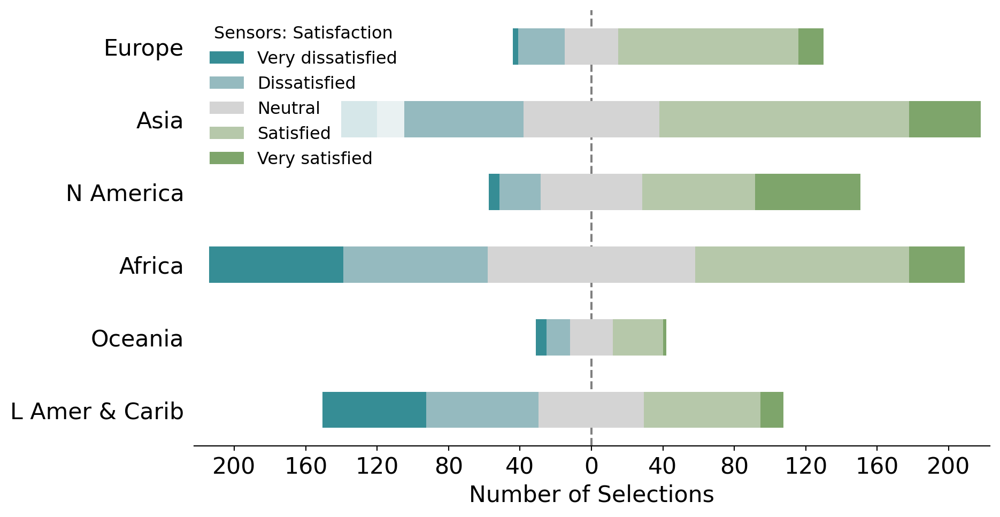

In [170]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U1')

### Sensor satisfaction plot #2.

In [171]:
## Calculate values for plot
#note: reuses satisfaction data from previous figure

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Accuracy', 'Availability', 'Capabilities', 'Cost', 'Depth', 'Ease']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Depth', 'Ease', 'Accuracy']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [172]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q25_accuracy Q25_availability   
selection                                                              
1 - Very dissatisfied                          21.0             35.0   
2 - Dissatisfied                               24.0             60.0   
3 - Neither satisfied nor dissatisfied         69.0             60.0   
4 - Satisfied                                  94.0             83.0   
5 - Very satisfied                             37.0             15.0   
Total                                         245.0            253.0   

                                                                            \
col_name                               Q25_capabilities Q25_cost Q25_depth   
selection                                                                    
1 - Very dissatisfied                              23.0     31.0      32.0   
2 - Dissatisfied                                   50.0     60.0      41.0   
3 - Neither satisfied nor dissatisfied             53.0     62.0      63.0   
4 - Satisfied                                      85.0     80.0      84.0   
5 - Very satisfied                                 31.0     18.0      32.0   
Total                                             242.0    251.0     252.0   

                                                     percent                   \
col_name                               Q25_ease Q25_accuracy Q25_availability   
selection                                                                       
1 - Very dissatisfied                      26.0         8.57            13.83   
2 - Dissatisfied                           53.0         9.80            23.72   
3 - Neither satisfied nor dissatisfied     55.0        28.16            23.72   
4 - Satisfied                              91.0        38.37            32.81   
5 - Very satisfied                         26.0        15.10             5.93   
Total                                     251.0       100.00           100.01   

                                                                            \
col_name                               Q25_capabilities Q25_cost Q25_depth   
selection                                                                    
1 - Very dissatisfied                              9.50    12.35     12.70   
2 - Dissatisfied                                  20.66    23.90     16.27   
3 - Neither satisfied nor dissatisfied            21.90    24.70     25.00   
4 - Satisfied                                     35.12    31.87     33.33   
5 - Very satisfied                                12.81     7.17     12.70   
Total                                             99.99    99.99    100.00   

                                                  count percent  
col_name                               Q25_ease   Total   Total  
selection                                                        
1 - Very dissatisfied                     10.36   168.0   11.24  
2 - Dissatisfied                          21.12   288.0   19.28  
3 - Neither satisfied nor dissatisfied    21.91   362.0   24.23  
4 - Satisfied                             36.25   517.0   34.61  
5 - Very satisfied                        10.36   159.0   10.64  
Total                                    100.00  1494.0  100.00

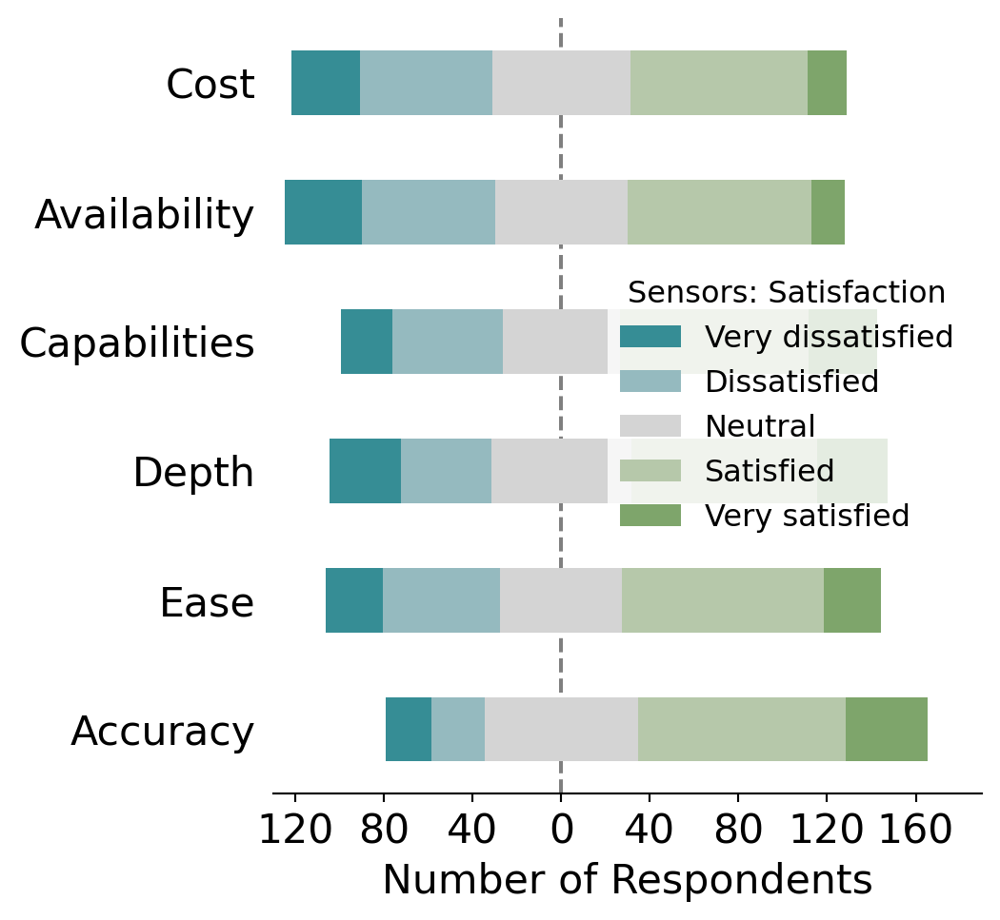

In [173]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U2')

### Q25a: Sensor cost

In [174]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_cost') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [175]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    15.0   5.0    NaN   
2 - Dissatisfied                         16.0  19.0    4.0   
3 - Neither satisfied nor dissatisfied   19.0  12.0    6.0   
4 - Satisfied                            18.0  19.0   18.0   
5 - Very satisfied                        3.0   5.0    1.0   
Total                                    71.0  60.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                              8.0   
2 - Dissatisfied                                                  13.0   
3 - Neither satisfied nor dissatisfied                            11.0   
4 - Satisfied                                                      9.0   
5 - Very satisfied                                                 2.0   
Total                                                             43.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               2.0     1.0   21.13   
2 - Dissatisfied                                    4.0     4.0   22.54   
3 - Neither satisfied nor dissatisfied             10.0     4.0   26.76   
4 - Satisfied                                      12.0     4.0   25.35   
5 - Very satisfied                                  7.0     NaN    4.23   
Total                                              35.0    13.0  100.01   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     8.33     NaN   
2 - Dissatisfied                         31.67   13.79   
3 - Neither satisfied nor dissatisfied   20.00   20.69   
4 - Satisfied                            31.67   62.07   
5 - Very satisfied                        8.33    3.45   
Total                                   100.00  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            18.60   
2 - Dissatisfied                                                 30.23   
3 - Neither satisfied nor dissatisfied                           25.58   
4 - Satisfied                                                    20.93   
5 - Very satisfied                                                4.65   
Total                                                            99.99   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              5.71    7.69   31.0   12.35  
2 - Dissatisfied                                  11.43   30.77   60.0   23.90  
3 - Neither satisfied nor dissatisfied            28.57   30.77   62.0   24.70  
4 - Satisfied                                     34.29   30.77   80.0   31.87  
5 - Very satisfied                                20.00     NaN   18.0    7.17  
Total                                            100.00  100.00  251.0  100.00

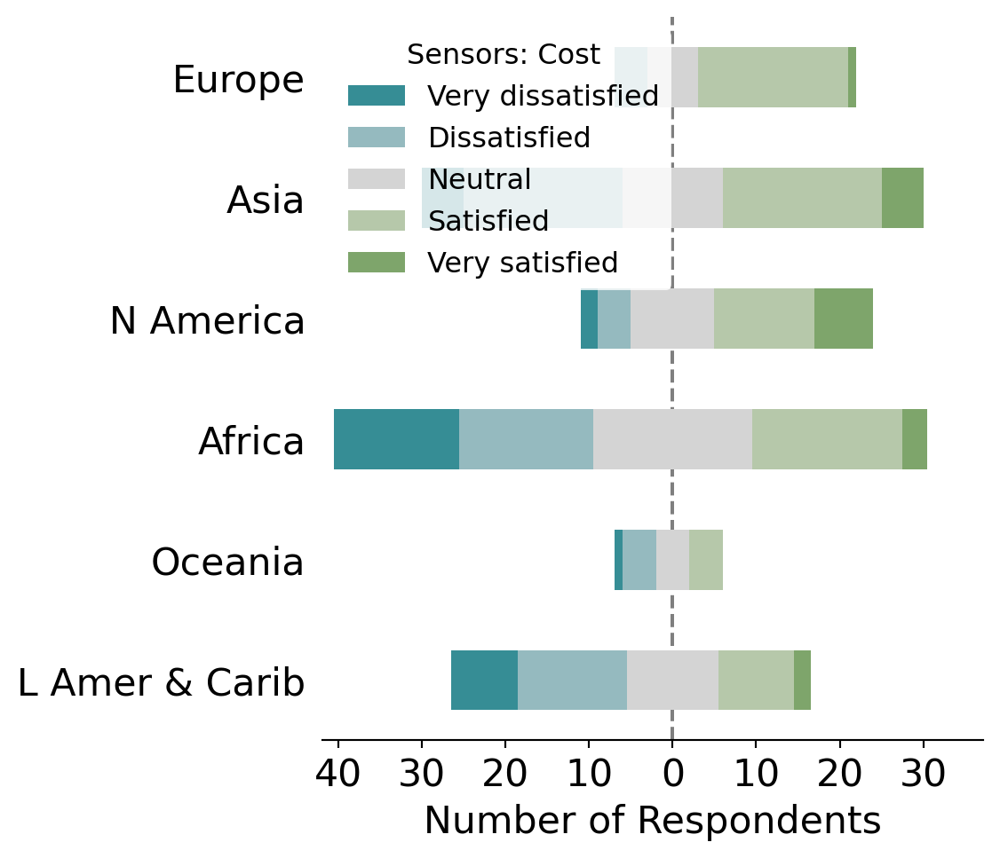

In [176]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U3')

### Q25b: Sensor availability

In [177]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [178]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    15.0   3.0    1.0   
2 - Dissatisfied                         16.0  17.0    5.0   
3 - Neither satisfied nor dissatisfied   21.0  15.0    3.0   
4 - Satisfied                            19.0  22.0   19.0   
5 - Very satisfied                        2.0   5.0    1.0   
Total                                    73.0  62.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             13.0   
2 - Dissatisfied                                                  13.0   
3 - Neither satisfied nor dissatisfied                             6.0   
4 - Satisfied                                                      9.0   
5 - Very satisfied                                                 1.0   
Total                                                             42.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               2.0     1.0   20.55   
2 - Dissatisfied                                    7.0     2.0   21.92   
3 - Neither satisfied nor dissatisfied             10.0     5.0   28.77   
4 - Satisfied                                      10.0     4.0   26.03   
5 - Very satisfied                                  6.0     NaN    2.74   
Total                                              35.0    12.0  100.01   

                                                       \
subregion                                Asia  Europe   
selection                                               
1 - Very dissatisfied                    4.84    3.45   
2 - Dissatisfied                        27.42   17.24   
3 - Neither satisfied nor dissatisfied  24.19   10.34   
4 - Satisfied                           35.48   65.52   
5 - Very satisfied                       8.06    3.45   
Total                                   99.99  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            30.95   
2 - Dissatisfied                                                 30.95   
3 - Neither satisfied nor dissatisfied                           14.29   
4 - Satisfied                                                    21.43   
5 - Very satisfied                                                2.38   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              5.71    8.33   35.0   13.83  
2 - Dissatisfied                                  20.00   16.67   60.0   23.72  
3 - Neither satisfied nor dissatisfied            28.57   41.67   60.0   23.72  
4 - Satisfied                                     28.57   33.33   83.0   32.81  
5 - Very satisfied                                17.14     NaN   15.0    5.93  
Total                                             99.99  100.00  253.0  100.00

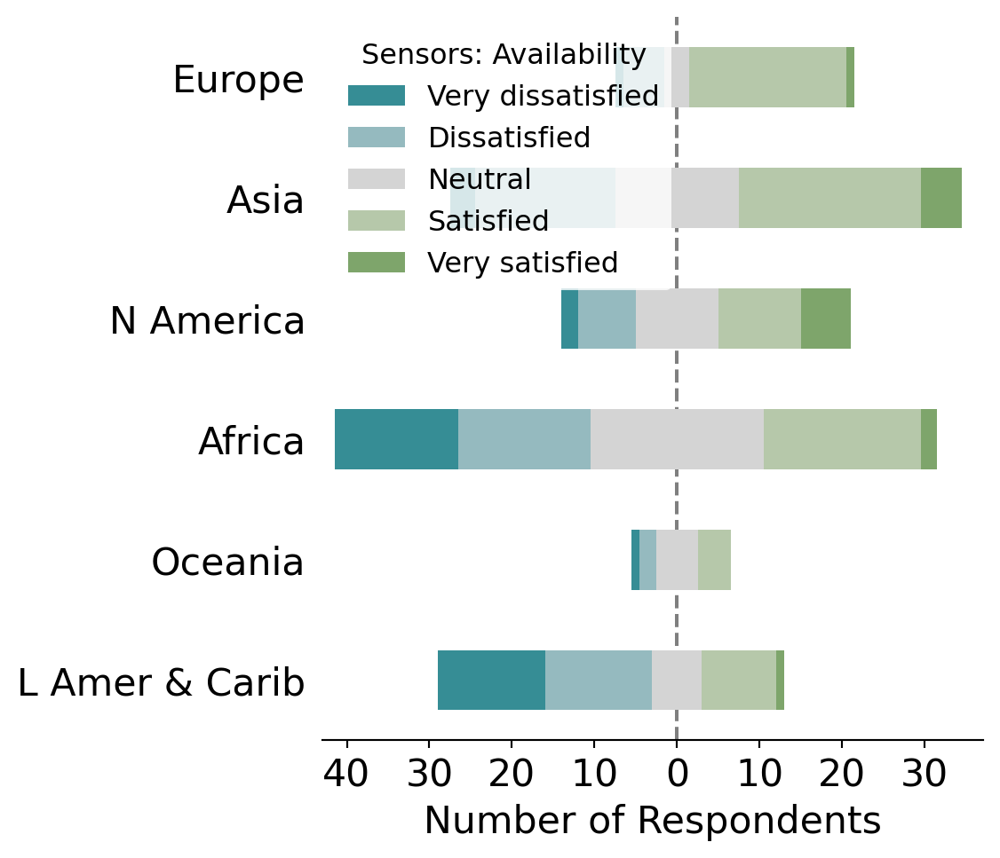

In [179]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Asia': 'lower left', 'Economies': 'lower right', 'Global': 'upper left', 'Oceania': 'upper right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U4')

### Q25c: Sensor capabilities

In [180]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [181]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    12.0   3.0    NaN   
2 - Dissatisfied                         12.0  14.0    4.0   
3 - Neither satisfied nor dissatisfied   17.0  10.0    4.0   
4 - Satisfied                            20.0  25.0   15.0   
5 - Very satisfied                        6.0   8.0    4.0   
Total                                    67.0  60.0   27.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                              7.0   
2 - Dissatisfied                                                  13.0   
3 - Neither satisfied nor dissatisfied                            10.0   
4 - Satisfied                                                     11.0   
5 - Very satisfied                                                 1.0   
Total                                                             42.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               NaN     1.0   17.91   
2 - Dissatisfied                                    5.0     2.0   17.91   
3 - Neither satisfied nor dissatisfied              9.0     3.0   25.37   
4 - Satisfied                                       9.0     5.0   29.85   
5 - Very satisfied                                 11.0     1.0    8.96   
Total                                              34.0    12.0  100.00   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     5.00    NaN   
2 - Dissatisfied                         23.33  14.81   
3 - Neither satisfied nor dissatisfied   16.67  14.81   
4 - Satisfied                            41.67  55.56   
5 - Very satisfied                       13.33  14.81   
Total                                   100.00  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            16.67   
2 - Dissatisfied                                                 30.95   
3 - Neither satisfied nor dissatisfied                           23.81   
4 - Satisfied                                                    26.19   
5 - Very satisfied                                                2.38   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                               NaN    8.33   23.0    9.50  
2 - Dissatisfied                                  14.71   16.67   50.0   20.66  
3 - Neither satisfied nor dissatisfied            26.47   25.00   53.0   21.90  
4 - Satisfied                                     26.47   41.67   85.0   35.12  
5 - Very satisfied                                32.35    8.33   31.0   12.81  
Total                                            100.00  100.00  242.0  100.00

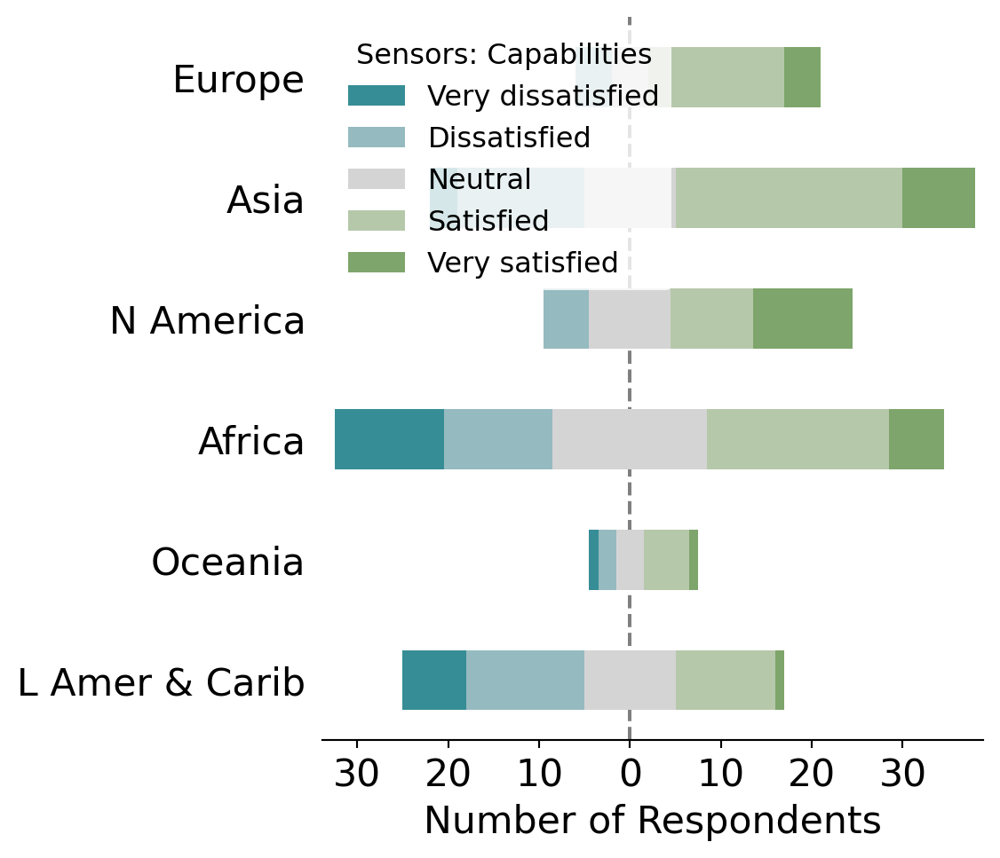

In [182]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U5')

### Q25d: Sensor depth

In [183]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

depth = {}
fig_data = {}
for region in region_list:
    depth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_depth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = depth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [184]:
## Calculate statistics

for region in region_list:
    percent_data = (depth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = depth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    13.0   3.0    1.0   
2 - Dissatisfied                         14.0  14.0    4.0   
3 - Neither satisfied nor dissatisfied   21.0  13.0    5.0   
4 - Satisfied                            18.0  24.0   17.0   
5 - Very satisfied                        6.0   6.0    3.0   
Total                                    72.0  60.0   30.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             13.0   
2 - Dissatisfied                                                   6.0   
3 - Neither satisfied nor dissatisfied                             9.0   
4 - Satisfied                                                     12.0   
5 - Very satisfied                                                 3.0   
Total                                                             43.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     1.0   18.06   
2 - Dissatisfied                                    NaN     3.0   19.44   
3 - Neither satisfied nor dissatisfied             12.0     3.0   29.17   
4 - Satisfied                                       9.0     4.0   25.00   
5 - Very satisfied                                 13.0     1.0    8.33   
Total                                              35.0    12.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     5.00    3.33   
2 - Dissatisfied                         23.33   13.33   
3 - Neither satisfied nor dissatisfied   21.67   16.67   
4 - Satisfied                            40.00   56.67   
5 - Very satisfied                       10.00   10.00   
Total                                   100.00  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            30.23   
2 - Dissatisfied                                                 13.95   
3 - Neither satisfied nor dissatisfied                           20.93   
4 - Satisfied                                                    27.91   
5 - Very satisfied                                                6.98   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.86    8.33   32.0   12.70  
2 - Dissatisfied                                    NaN   25.00   41.0   16.27  
3 - Neither satisfied nor dissatisfied            34.29   25.00   63.0   25.00  
4 - Satisfied                                     25.71   33.33   84.0   33.33  
5 - Very satisfied                                37.14    8.33   32.0   12.70  
Total                                            100.00   99.99  252.0  100.00

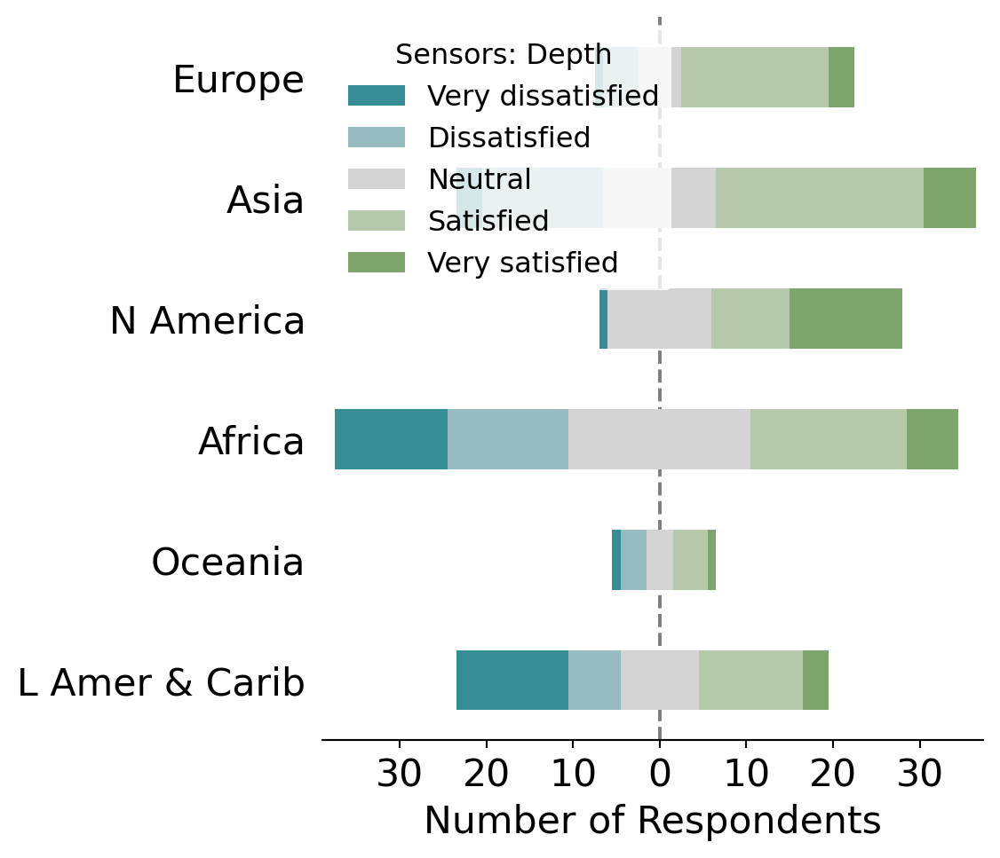

In [185]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Depth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U6')

### Q25e: Sensor ease of use

In [186]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

ease = {}
fig_data = {}
for region in region_list:
    ease[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_ease') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = ease[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [187]:
## Calculate statistics

for region in region_list:
    percent_data = (ease[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = ease[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                     9.0   3.0    1.0   
2 - Dissatisfied                         16.0  12.0    7.0   
3 - Neither satisfied nor dissatisfied   16.0  14.0    6.0   
4 - Satisfied                            23.0  24.0   15.0   
5 - Very satisfied                        6.0   7.0    1.0   
Total                                    70.0  60.0   30.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             11.0   
2 - Dissatisfied                                                  11.0   
3 - Neither satisfied nor dissatisfied                             8.0   
4 - Satisfied                                                     11.0   
5 - Very satisfied                                                 3.0   
Total                                                             44.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     1.0   12.86   
2 - Dissatisfied                                    6.0     1.0   22.86   
3 - Neither satisfied nor dissatisfied              7.0     4.0   22.86   
4 - Satisfied                                      12.0     6.0   32.86   
5 - Very satisfied                                  9.0     NaN    8.57   
Total                                              35.0    12.0  100.01   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     5.00   3.33   
2 - Dissatisfied                         20.00  23.33   
3 - Neither satisfied nor dissatisfied   23.33  20.00   
4 - Satisfied                            40.00  50.00   
5 - Very satisfied                       11.67   3.33   
Total                                   100.00  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            25.00   
2 - Dissatisfied                                                 25.00   
3 - Neither satisfied nor dissatisfied                           18.18   
4 - Satisfied                                                    25.00   
5 - Very satisfied                                                6.82   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.86    8.33   26.0   10.36  
2 - Dissatisfied                                  17.14    8.33   53.0   21.12  
3 - Neither satisfied nor dissatisfied            20.00   33.33   55.0   21.91  
4 - Satisfied                                     34.29   50.00   91.0   36.25  
5 - Very satisfied                                25.71     NaN   26.0   10.36  
Total                                            100.00   99.99  251.0  100.00

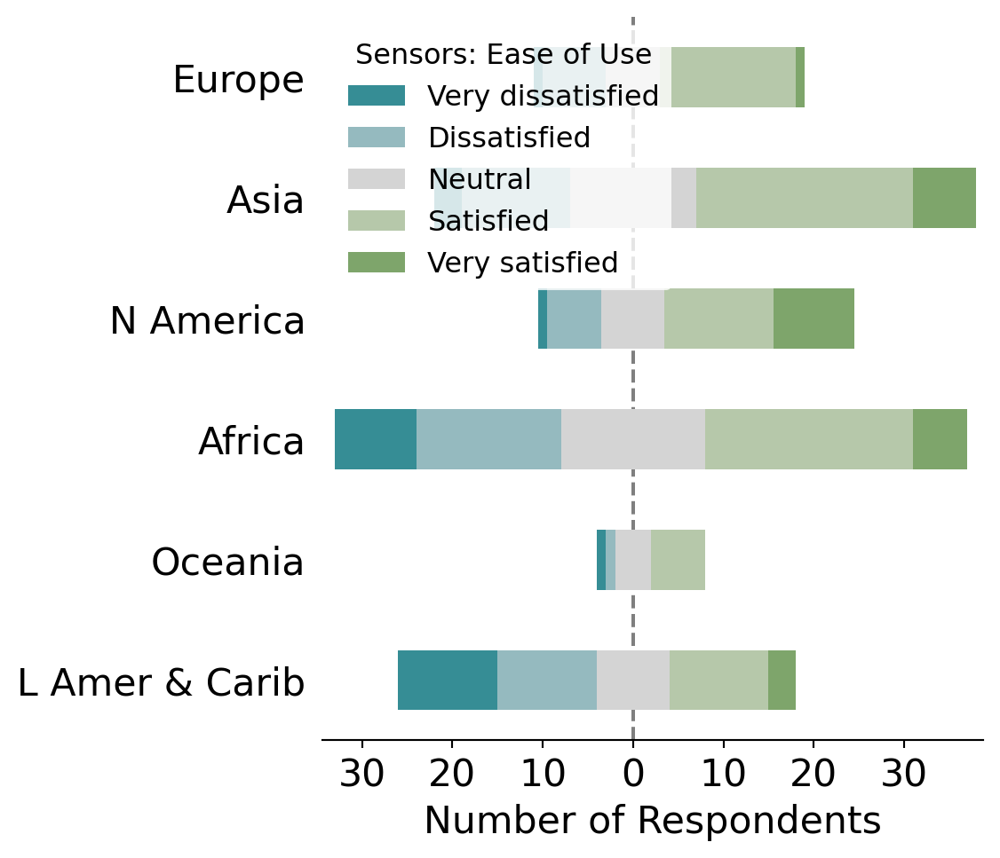

In [188]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Ease of Use',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U7')

### Q25f: Sensor accuracy

In [189]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

accuracy = {}
fig_data = {}
for region in region_list:
    accuracy[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_accuracy') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = accuracy[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [190]:
## Calculate statistics

for region in region_list:
    percent_data = (accuracy[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = accuracy[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    11.0   3.0    NaN   
2 - Dissatisfied                          7.0   6.0    2.0   
3 - Neither satisfied nor dissatisfied   22.0  12.0    6.0   
4 - Satisfied                            22.0  26.0   17.0   
5 - Very satisfied                        8.0   9.0    4.0   
Total                                    70.0  56.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                              6.0   
2 - Dissatisfied                                                   7.0   
3 - Neither satisfied nor dissatisfied                            15.0   
4 - Satisfied                                                     13.0   
5 - Very satisfied                                                 3.0   
Total                                                             44.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               NaN     1.0   15.71   
2 - Dissatisfied                                    1.0     1.0   10.00   
3 - Neither satisfied nor dissatisfied              9.0     5.0   31.43   
4 - Satisfied                                      11.0     5.0   31.43   
5 - Very satisfied                                 13.0     NaN   11.43   
Total                                              34.0    12.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     5.36     NaN   
2 - Dissatisfied                         10.71    6.90   
3 - Neither satisfied nor dissatisfied   21.43   20.69   
4 - Satisfied                            46.43   58.62   
5 - Very satisfied                       16.07   13.79   
Total                                   100.00  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            13.64   
2 - Dissatisfied                                                 15.91   
3 - Neither satisfied nor dissatisfied                           34.09   
4 - Satisfied                                                    29.55   
5 - Very satisfied                                                6.82   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                               NaN    8.33   21.0    8.57  
2 - Dissatisfied                                   2.94    8.33   24.0    9.80  
3 - Neither satisfied nor dissatisfied            26.47   41.67   69.0   28.16  
4 - Satisfied                                     32.35   41.67   94.0   38.37  
5 - Very satisfied                                38.24     NaN   37.0   15.10  
Total                                            100.00  100.00  245.0  100.00

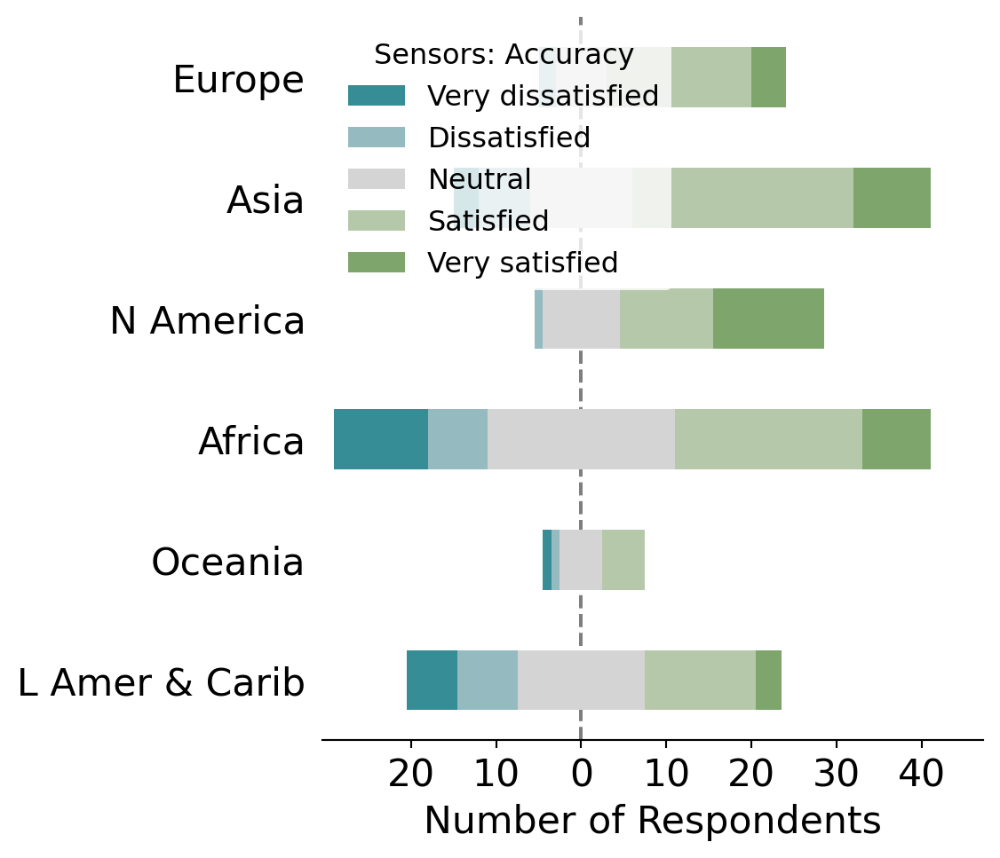

In [191]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Accuracy',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U8')

## Fig V - Q23: Sensor importance

In [192]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q23'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [193]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection                                                                    
1 - Not important         6.0   5.0    2.0                            11.0   
2 - A little important    3.0   2.0    2.0                             6.0   
3 - Somewhat important   14.0   9.0    7.0                            21.0   
4 - Important            13.0  14.0    8.0                            16.0   
5 - Very important       65.0  45.0   14.0                            36.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                 \
subregion              Northern America Oceania  Africa    Asia Europe   
selection                                                                
1 - Not important                   1.0     4.0    5.94    6.67   6.06   
2 - A little important              2.0     2.0    2.97    2.67   6.06   
3 - Somewhat important              3.0     4.0   13.86   12.00  21.21   
4 - Important                       7.0     2.0   12.87   18.67  24.24   
5 - Very important                 25.0    11.0   64.36   60.00  42.42   
Total                              38.0    23.0  100.00  100.01  99.99   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection                                                                 
1 - Not important                                12.22             2.63   
2 - A little important                            6.67             5.26   
3 - Somewhat important                           23.33             7.89   
4 - Important                                    17.78            18.42   
5 - Very important                               40.00            65.79   
Total                                           100.00            99.99   

                                count percent  
subregion              Oceania  Total   Total  
selection                                      
1 - Not important        17.39   29.0    8.06  
2 - A little important    8.70   17.0    4.72  
3 - Somewhat important   17.39   58.0   16.11  
4 - Important             8.70   60.0   16.67  
5 - Very important       47.83  196.0   54.44  
Total                   100.01  360.0  100.00

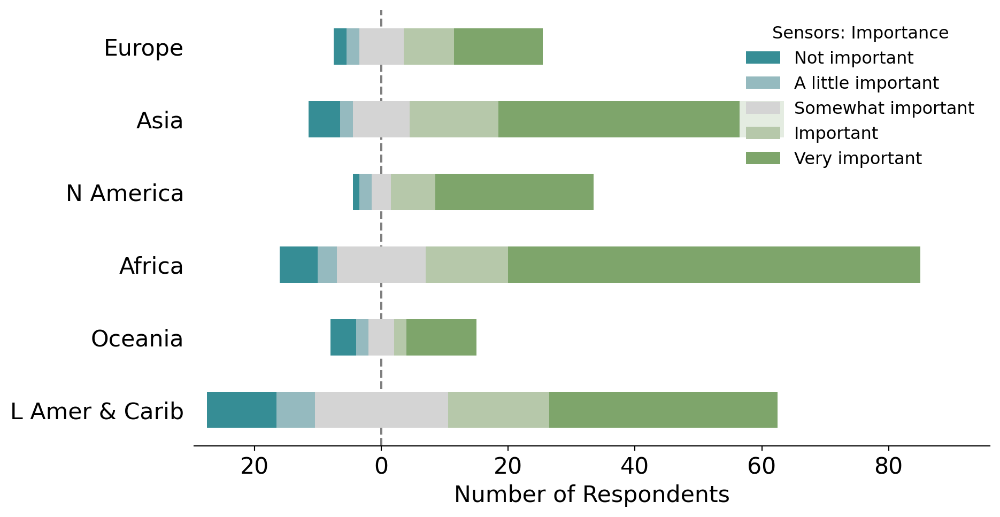

In [194]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='V1')

### Q26: Sensor potential

In [195]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q26'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [196]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion           Africa  Asia Europe Latin America and the Caribbean   
selection                                                                 
1 - No impact          8.0   5.0    NaN                             7.0   
2 - Little impact      2.0   2.0    2.0                             3.0   
3 - Moderate impact   13.0  13.0    8.0                            19.0   
4 - High impact       15.0  16.0   12.0                            13.0   
5 - Transformative    63.0  39.0   11.0                            48.0   
Total                101.0  75.0   33.0                            90.0   

                                             percent                 \
subregion           Northern America Oceania  Africa    Asia Europe   
selection                                                             
1 - No impact                    NaN     2.0    7.92    6.67    NaN   
2 - Little impact                3.0     1.0    1.98    2.67   6.06   
3 - Moderate impact              9.0     3.0   12.87   17.33  24.24   
4 - High impact                  6.0     5.0   14.85   21.33  36.36   
5 - Transformative              20.0    12.0   62.38   52.00  33.33   
Total                           38.0    23.0  100.00  100.00  99.99   

                                                                              \
subregion           Latin America and the Caribbean Northern America Oceania   
selection                                                                      
1 - No impact                                  7.78              NaN    8.70   
2 - Little impact                              3.33             7.89    4.35   
3 - Moderate impact                           21.11            23.68   13.04   
4 - High impact                               14.44            15.79   21.74   
5 - Transformative                            53.33            52.63   52.17   
Total                                         99.99            99.99  100.00   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         22.0    6.11  
2 - Little impact     13.0    3.61  
3 - Moderate impact   65.0   18.06  
4 - High impact       67.0   18.61  
5 - Transformative   193.0   53.61  
Total                360.0  100.00

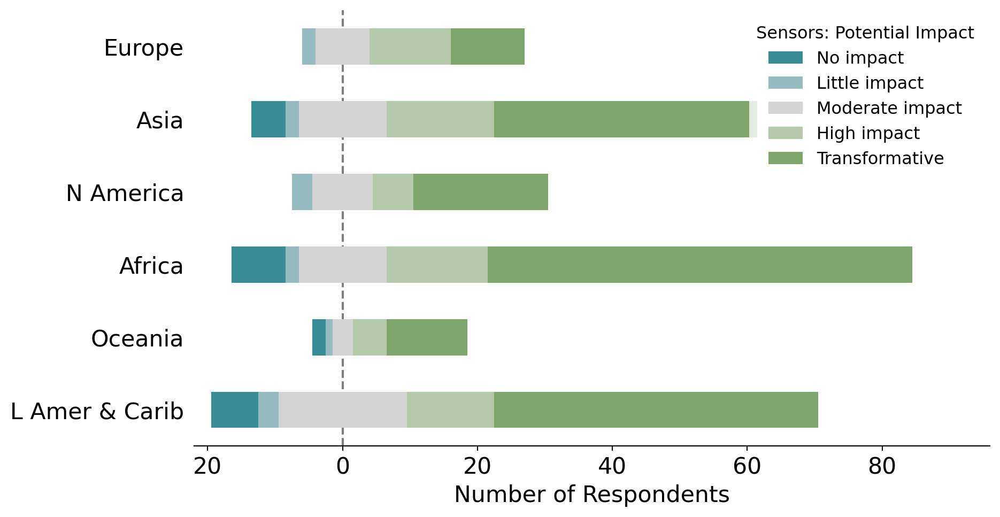

In [197]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='V2')

---
# **Section 9**

## Fig W - Data tools presence

In [198]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    data_presence = researchR[region].loc[(researchR[region]['question'] == 'Q29') &
                                   (researchR[region]['col_name'] != 'Q29_comments'), ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    data_presence['selection_binary'] = data_presence['research_tech_clean']

    fig_data[region] = (data_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = data_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q29_gis':             'GIS',
        'Q29_data_management': 'Data management',
        'Q29_data_storage':    'Data storage',
        'Q29_data_viz':        'Data visualization',
        'Q29_cloud':           'Cloud computing',
        'Q29_sequencing':      'Genomic sequencing',
        'Q29_ml':              'ML/AI',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'cloud'):('count', 'sequencing')].sum()
    pivoted.loc['Total', ('percent', 'cloud'):('percent', 'sequencing')] = \
        ((pivoted.loc['Total', ('count', 'cloud'):('count', 'sequencing')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

    ## Names of GeoAreas with all types present
    num_types = (data_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])

    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])

    ## % of areas in region that have all types
    num_types = (data_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(round((num_types[num_types['num_types'] == 7].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                               \
col_name       Cloud computing Data management Data storage   
subregion                                                     
Africa                    26.0            28.0         27.0   
Asia                      26.0            23.0         22.0   
Europe                    23.0            19.0         21.0   
L Amer & Carib            34.0            38.0         21.0   
N America                  3.0             4.0          4.0   
Oceania                   18.0            18.0         15.0   
Total                    130.0           130.0        110.0   

                                                                    \
col_name       Data visualization    GIS Genomic sequencing  ML/AI   
subregion                                                            
Africa                       30.0   43.0               30.0   31.0   
Asia                         26.0   29.0               21.0   30.0   
Europe                       19.0   20.0               19.0   20.0   
L Amer & Carib               17.0   39.0               17.0   19.0   
N America                     4.0    5.0                3.0    3.0   
Oceania                      14.0   23.0               12.0    6.0   
Total                       110.0  159.0              102.0  109.0   

                       percent                               \
col_name       Cloud computing Data management Data storage   
subregion                                                     
Africa                   59.09           63.64        61.36   
Asia                     86.67           76.67        73.33   
Europe                  100.00           82.61        91.30   
L Amer & Carib           68.00           76.00        42.00   
N America                60.00           80.00        80.00   
Oceania                  64.29           64.29        53.57   
Total                   438.05          443.21       401.56   

                                                                      
col_name       Data visualization     GIS Genomic sequencing   ML/AI  
subregion                                                             
Africa                      68.18   97.73              68.18   70.45  
Asia                        86.67   96.67              70.00  100.00  
Europe                      82.61   86.96              82.61   86.96  
L Amer & Carib              34.00   78.00              34.00   38.00  
N America                   80.00  100.00              60.00   60.00  
Oceania                     50.00   82.14              42.86   21.43  
Total                      401.46  541.50             357.65  376.84

,subregion,geoarea,num_types
0,Africa,Algeria,7
12,Africa,Egypt,7
18,Africa,Guinea,7
22,Africa,Libya,7
27,Africa,Morocco,7
34,Africa,Senegal,7
38,Africa,South Africa,7
40,Africa,Tanzania,7
43,Africa,Tunisia,7
44,Asia,Bangladesh,7


,subregion,geoarea,num_types
118,Latin America and the Caribbean,French Guiana,0
132,Latin America and the Caribbean,Puerto Rico,0
136,Latin America and the Caribbean,Saint Lucia,0
164,Oceania,Nauru,0


28.33

18.89

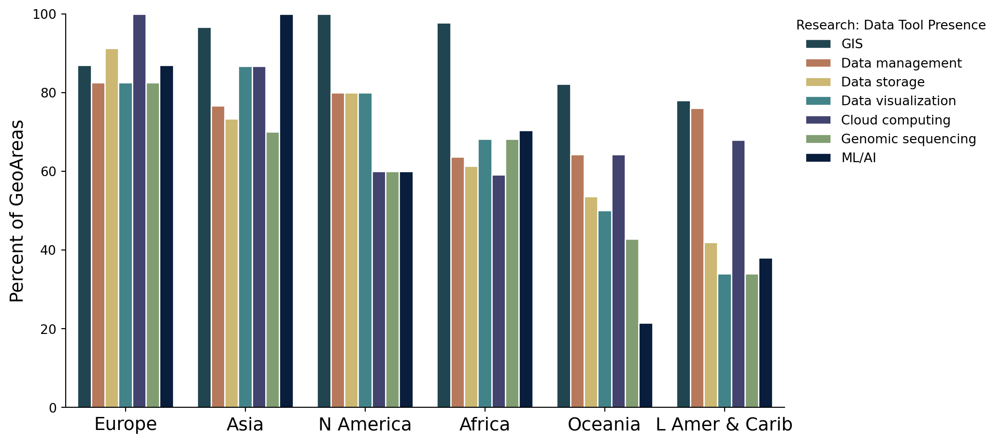

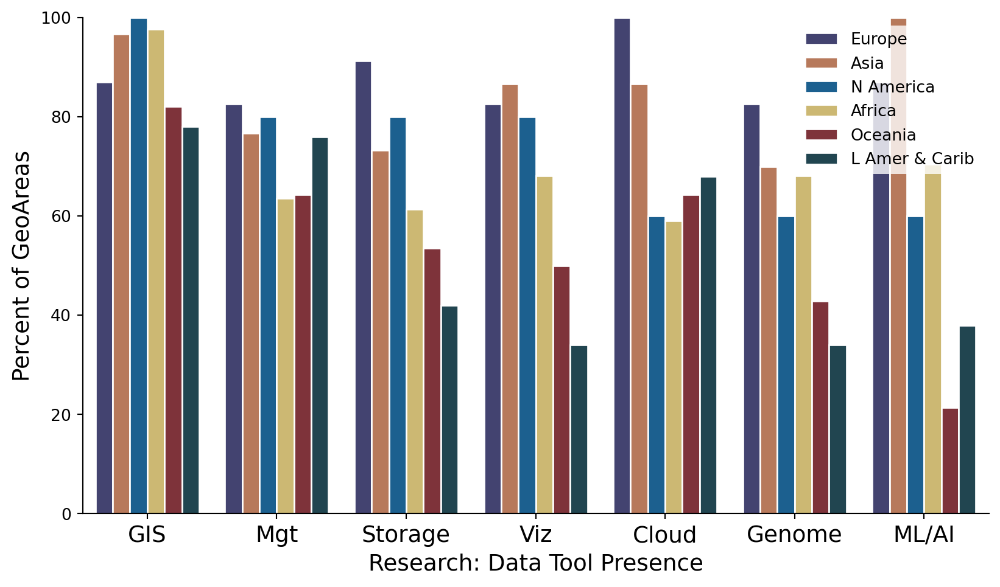

In [199]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07,
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Data Tool Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='W1')

    ## W2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(['GIS', 'Mgt', 'Storage', 'Viz', 'Cloud', 'Genome', 'ML/AI'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Data Tool Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='W2')

## Fig X - Q29: Data Tools Access

In [200]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    data_tools = dataR[region].loc[dataR[region]['question'] == 'Q29', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    data_tools = data_tools[data_tools['selection_survey_clean'] != '']
    ## Group "I don't know" and "None of the above"
    data_tools.loc[data_tools['selection_survey_clean'] == "I don't know what tools are available",
                   'selection_survey_clean'] = 'None of the above'

    vessels = dataR[region].loc[dataR[region]['question'] == 'Q24', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (data_tools.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    renames = {
        'Geographical information systems (GIS)':   'GIS',
        'Data management tools':                    'Data management',
        'Data storage capacity':                    'Data storage',
        'Data visualization tools':                 'Data visualization',
        'Cloud computing':                          'Cloud computing',
        'Genomic sequencing':                       'Genomic sequencing',
        'Machine learning/artificial intelligence': 'ML/AI',
        'Other':                                    'Other',
        'None of the above':                        'None of the above',
    }
    hue_order = renames.values()
    percent_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    percent_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                                \
subregion              Africa  Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                        
Cloud computing          15.0  19.0   18.0           30.0      30.0     4.0   
Data management          44.0  48.0   21.0           42.0      34.0    13.0   
Data storage             37.0  43.0   24.0           47.0      34.0    13.0   
Data visualization       44.0  42.0   20.0           45.0      34.0     9.0   
GIS                      70.0  59.0   27.0           71.0      33.0    17.0   
Genomic sequencing       14.0  17.0    9.0           11.0      29.0     4.0   
ML/AI                     7.0  21.0   12.0            8.0      26.0     5.0   
None of the above        26.0  14.0    5.0           16.0       3.0     5.0   
Other                     4.0   3.0    NaN            5.0       3.0     1.0   
Total                    98.0  74.0   33.0           90.0      38.0    22.0   

                       percent                                                 \
subregion               Africa   Asia Europe L Amer & Carib N America Oceania   
selection_survey_clean                                                          
Cloud computing          15.31  25.68  54.55          33.33     78.95   18.18   
Data management          44.90  64.86  63.64          46.67     89.47   59.09   
Data storage             37.76  58.11  72.73          52.22     89.47   59.09   
Data visualization       44.90  56.76  60.61          50.00     89.47   40.91   
GIS                      71.43  79.73  81.82          78.89     86.84   77.27   
Genomic sequencing       14.29  22.97  27.27          12.22     76.32   18.18   
ML/AI                     7.14  28.38  36.36           8.89     68.42   22.73   
None of the above        26.53  18.92  15.15          17.78      7.89   22.73   
Other                     4.08   4.05    NaN           5.56      7.89    4.55   
Total                    27.61  20.85   9.30          25.35     10.70    6.20   

                        count percent  
subregion               Total   Total  
selection_survey_clean                 
Cloud computing         116.0   32.68  
Data management         202.0   56.90  
Data storage            198.0   55.77  
Data visualization      194.0   54.65  
GIS                     277.0   78.03  
Genomic sequencing       84.0   23.66  
ML/AI                    79.0   22.25  
None of the above        69.0   19.44  
Other                    16.0    4.51  
Total                   355.0  100.00

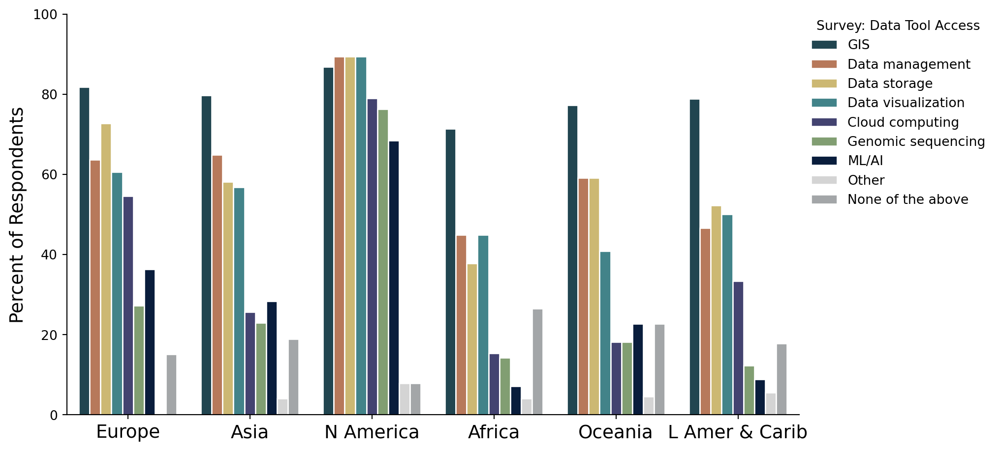

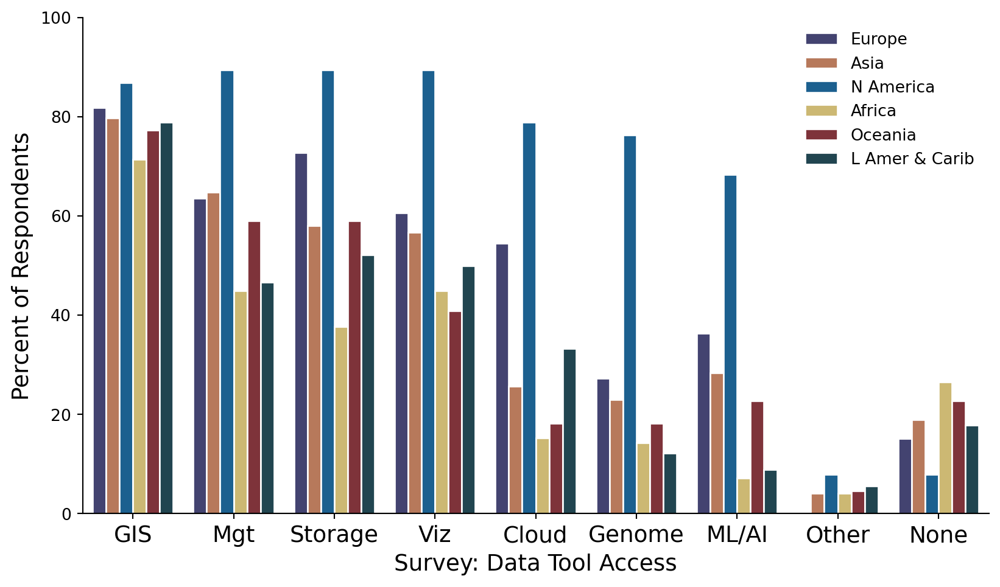

In [201]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015), loc='upper left',
              title='Survey: Data Tool Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='X1')

    ## X2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['GIS', 'Mgt', 'Storage', 'Viz', 'Cloud', 'Genome', 'ML/AI', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Data Tool Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='X2')

## Fig Y - Q30: Data tools satisfaction

In [202]:
## Calculate values for plot


# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

satisfaction = {}
missing_responses = {}
fig_data = {}
for region in region_list:
    ## Select data
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q30', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q30_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]

    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [203]:
## Calculate statistics

for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q30_other', 'respondent_id'].nunique())

    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,Africa,Asia,Europe,Latin America and the Caribbean,Northern America,Oceania,Total
col_name,,,,,,,
Q30_availability,19,10,4,17,1,5,56
Q30_bandwidth,19,11,5,13,2,6,56
Q30_capabilities,20,10,5,15,1,5,56
Q30_cost,23,11,4,16,1,5,60
Q30_ease,19,9,4,14,1,5,52
Q30_other,101,75,33,90,38,23,360


67

count                \
subregion                              Africa   Asia Europe   
selection                                                     
1 - Very dissatisfied                    72.0   18.0    3.0   
2 - Dissatisfied                         84.0   68.0   23.0   
3 - Neither satisfied nor dissatisfied  120.0   74.0   19.0   
4 - Satisfied                           108.0  126.0   76.0   
5 - Very satisfied                       21.0   38.0   22.0   
Total                                   405.0  324.0  143.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             66.0   
2 - Dissatisfied                                                 102.0   
3 - Neither satisfied nor dissatisfied                            98.0   
4 - Satisfied                                                     85.0   
5 - Very satisfied                                                24.0   
Total                                                            375.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               7.0     7.0   17.78   
2 - Dissatisfied                                   35.0    21.0   20.74   
3 - Neither satisfied nor dissatisfied             34.0    17.0   29.63   
4 - Satisfied                                      53.0    37.0   26.67   
5 - Very satisfied                                 55.0     7.0    5.19   
Total                                             184.0    89.0  100.01   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     5.56    2.10   
2 - Dissatisfied                         20.99   16.08   
3 - Neither satisfied nor dissatisfied   22.84   13.29   
4 - Satisfied                            38.89   53.15   
5 - Very satisfied                       11.73   15.38   
Total                                   100.01  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            17.60   
2 - Dissatisfied                                                 27.20   
3 - Neither satisfied nor dissatisfied                           26.13   
4 - Satisfied                                                    22.67   
5 - Very satisfied                                                6.40   
Total                                                           100.00   

                                                                  count  \
subregion                              Northern America Oceania   Total   
selection                                                                 
1 - Very dissatisfied                              3.80    7.87   173.0   
2 - Dissatisfied                                  19.02   23.60   333.0   
3 - Neither satisfied nor dissatisfied            18.48   19.10   362.0   
4 - Satisfied                                     28.80   41.57   485.0   
5 - Very satisfied                                29.89    7.87   167.0   
Total                                             99.99  100.01  1520.0   

                                       percent  
subregion                                Total  
selection                                       
1 - Very dissatisfied                    11.38  
2 - Dissatisfied                         21.91  
3 - Neither satisf

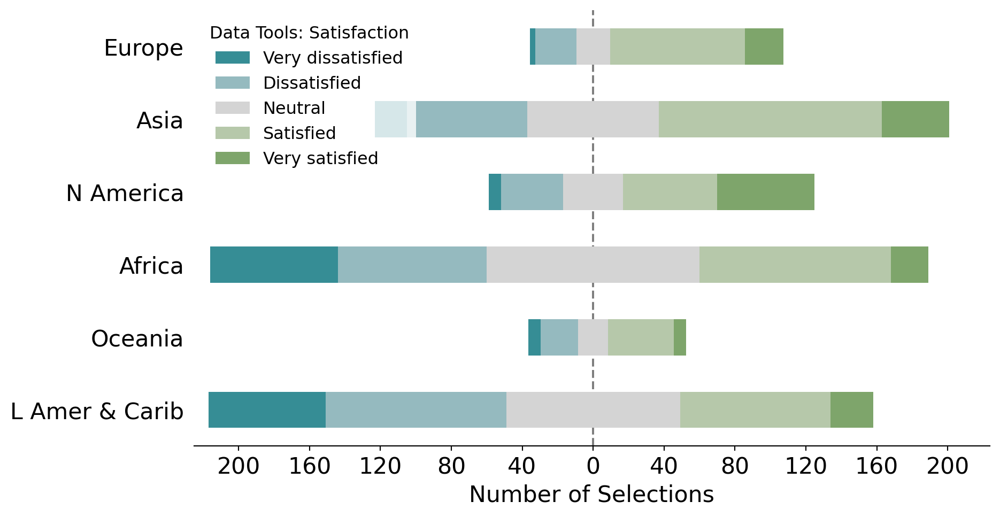

In [204]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region],
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y1')

### Sensor satisfaction plot #2.

In [205]:
## Calculate values for plot
## Note: reuses satisfaction from previous figure

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Bandwidth', 'Capabilities', 'Cost', 'Ease']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Ease', 'Bandwidth']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [206]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                \
col_name                               Q30_availability Q30_bandwidth   
selection                                                               
1 - Very dissatisfied                              36.0          44.0   
2 - Dissatisfied                                   71.0          61.0   
3 - Neither satisfied nor dissatisfied             69.0          67.0   
4 - Satisfied                                      97.0          88.0   
5 - Very satisfied                                 31.0          44.0   
Total                                             304.0         304.0   

                                                                           \
col_name                               Q30_capabilities Q30_cost Q30_ease   
selection                                                                   
1 - Very dissatisfied                              25.0     39.0     29.0   
2 - Dissatisfied                                   60.0     73.0     68.0   
3 - Neither satisfied nor dissatisfied             71.0     78.0     77.0   
4 - Satisfied                                     109.0     82.0    109.0   
5 - Very satisfied                                 39.0     28.0     25.0   
Total                                             304.0    300.0    308.0   

                                                percent                \
col_name                               Q30_availability Q30_bandwidth   
selection                                                               
1 - Very dissatisfied                             11.84         14.47   
2 - Dissatisfied                                  23.36         20.07   
3 - Neither satisfied nor dissatisfied            22.70         22.04   
4 - Satisfied                                     31.91         28.95   
5 - Very satisfied                                10.20         14.47   
Total                                            100.01        100.00   

                                                                           \
col_name                               Q30_capabilities Q30_cost Q30_ease   
selection                                                                   
1 - Very dissatisfied                              8.22    13.00     9.42   
2 - Dissatisfied                                  19.74    24.33    22.08   
3 - Neither satisfied nor dissatisfied            23.36    26.00    25.00   
4 - Satisfied                                     35.86    27.33    35.39   
5 - Very satisfied                                12.83     9.33     8.12   
Total                                            100.01    99.99   100.01   

                                         count percent  
col_name                                 Total   Total  
selection                                               
1 - Very dissatisfied                    173.0   11.38  
2 - Dissatisfied                         333.0   21.91  
3 - Neither satisfied nor dissatisfied   362.0   23.82  
4 - Satisfied                            485.0   31.91  
5 - Very satisfied                       167.0   10.99  
Total                                   1520.0  100.00

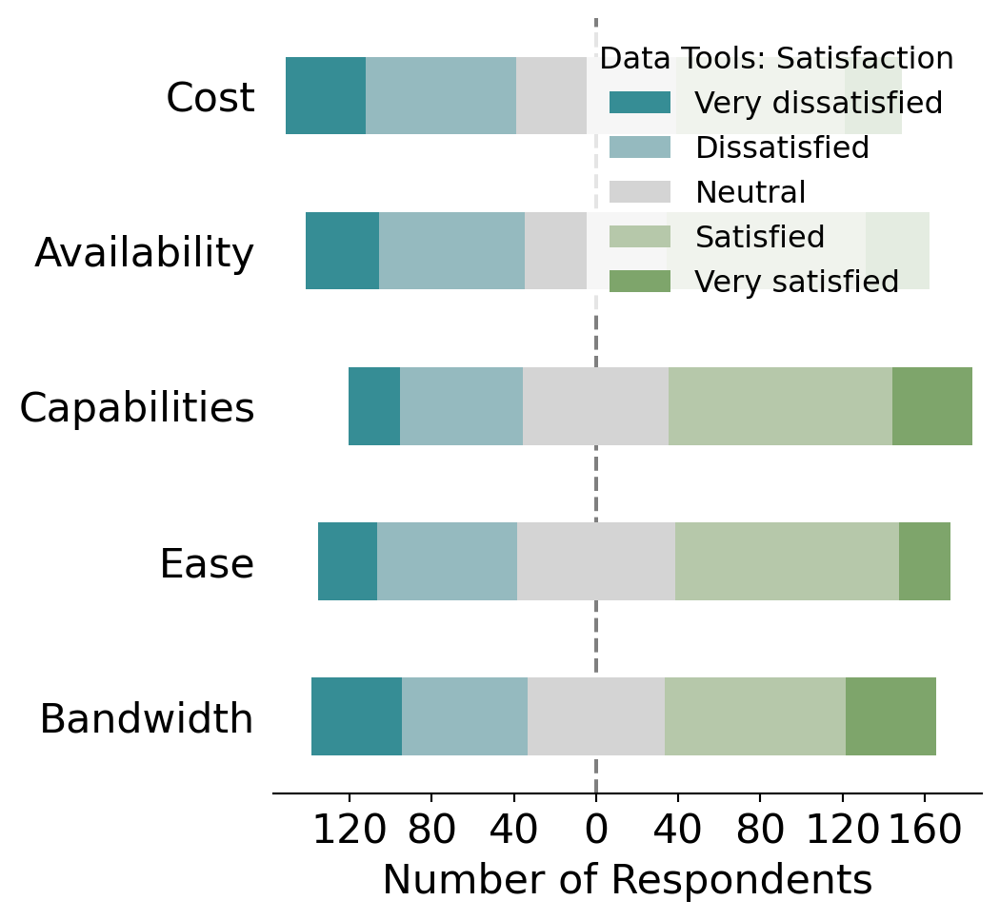

In [207]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y2')

### Q30a: Data tools cost

In [208]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_cost') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [209]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    18.0   4.0    1.0   
2 - Dissatisfied                         18.0  14.0    6.0   
3 - Neither satisfied nor dissatisfied   22.0  18.0    3.0   
4 - Satisfied                            16.0  22.0   13.0   
5 - Very satisfied                        4.0   6.0    6.0   
Total                                    78.0  64.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             14.0   
2 - Dissatisfied                                                  22.0   
3 - Neither satisfied nor dissatisfied                            22.0   
4 - Satisfied                                                     13.0   
5 - Very satisfied                                                 3.0   
Total                                                             74.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     1.0   23.08   
2 - Dissatisfied                                    8.0     5.0   23.08   
3 - Neither satisfied nor dissatisfied              9.0     4.0   28.21   
4 - Satisfied                                      11.0     7.0   20.51   
5 - Very satisfied                                  8.0     1.0    5.13   
Total                                              37.0    18.0  100.01   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     6.25    3.45   
2 - Dissatisfied                         21.88   20.69   
3 - Neither satisfied nor dissatisfied   28.12   10.34   
4 - Satisfied                            34.38   44.83   
5 - Very satisfied                        9.38   20.69   
Total                                   100.01  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            18.92   
2 - Dissatisfied                                                 29.73   
3 - Neither satisfied nor dissatisfied                           29.73   
4 - Satisfied                                                    17.57   
5 - Very satisfied                                                4.05   
Total                                                           100.00   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.70    5.56   39.0   13.00  
2 - Dissatisfied                                  21.62   27.78   73.0   24.33  
3 - Neither satisfied nor dissatisfied            24.32   22.22   78.0   26.00  
4 - Satisfied                                     29.73   38.89   82.0   27.33  
5 - Very satisfied                                21.62    5.56   28.0    9.33  
Total                                             99.99  100.01  300.0  100.00

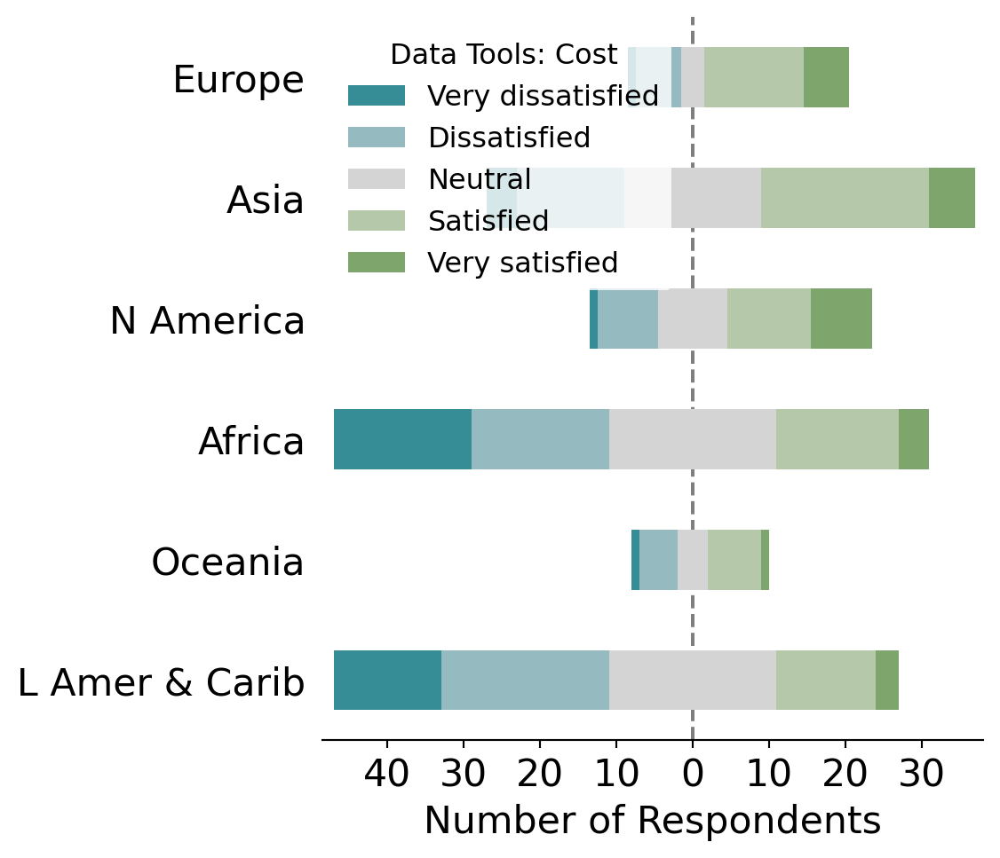

In [210]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y3')

### Q30b: Data tools availability

In [211]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [212]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    16.0   3.0    NaN   
2 - Dissatisfied                         19.0  15.0    5.0   
3 - Neither satisfied nor dissatisfied   25.0  13.0    3.0   
4 - Satisfied                            18.0  28.0   17.0   
5 - Very satisfied                        4.0   6.0    4.0   
Total                                    82.0  65.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             14.0   
2 - Dissatisfied                                                  23.0   
3 - Neither satisfied nor dissatisfied                            17.0   
4 - Satisfied                                                     15.0   
5 - Very satisfied                                                 4.0   
Total                                                             73.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               2.0     1.0   19.51   
2 - Dissatisfied                                    4.0     5.0   23.17   
3 - Neither satisfied nor dissatisfied              8.0     3.0   30.49   
4 - Satisfied                                      12.0     7.0   21.95   
5 - Very satisfied                                 11.0     2.0    4.88   
Total                                              37.0    18.0  100.00   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     4.62    NaN   
2 - Dissatisfied                         23.08  17.24   
3 - Neither satisfied nor dissatisfied   20.00  10.34   
4 - Satisfied                            43.08  58.62   
5 - Very satisfied                        9.23  13.79   
Total                                   100.01  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            19.18   
2 - Dissatisfied                                                 31.51   
3 - Neither satisfied nor dissatisfied                           23.29   
4 - Satisfied                                                    20.55   
5 - Very satisfied                                                5.48   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              5.41    5.56   36.0   11.84  
2 - Dissatisfied                                  10.81   27.78   71.0   23.36  
3 - Neither satisfied nor dissatisfied            21.62   16.67   69.0   22.70  
4 - Satisfied                                     32.43   38.89   97.0   31.91  
5 - Very satisfied                                29.73   11.11   31.0   10.20  
Total                                            100.00  100.01  304.0  100.00

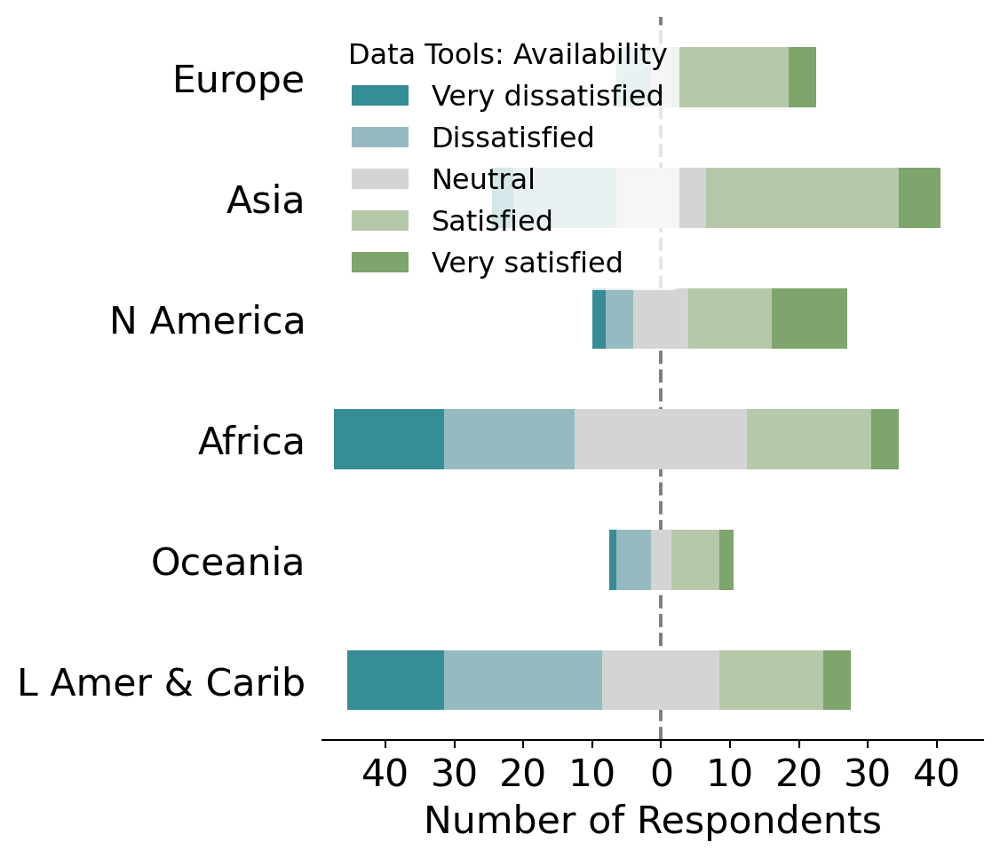

In [213]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y4')

### Q30c: Data tools capabilities

In [214]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
## Select relevant survey data
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [215]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    12.0   3.0    NaN   
2 - Dissatisfied                         15.0  13.0    2.0   
3 - Neither satisfied nor dissatisfied   25.0  15.0    3.0   
4 - Satisfied                            24.0  25.0   20.0   
5 - Very satisfied                        5.0   9.0    3.0   
Total                                    81.0  65.0   28.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                              9.0   
2 - Dissatisfied                                                  22.0   
3 - Neither satisfied nor dissatisfied                            19.0   
4 - Satisfied                                                     19.0   
5 - Very satisfied                                                 6.0   
Total                                                             75.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     NaN   14.81   
2 - Dissatisfied                                    3.0     5.0   18.52   
3 - Neither satisfied nor dissatisfied              6.0     3.0   30.86   
4 - Satisfied                                      13.0     8.0   29.63   
5 - Very satisfied                                 14.0     2.0    6.17   
Total                                              37.0    18.0   99.99   

                                                       \
subregion                                 Asia Europe   
selection                                               
1 - Very dissatisfied                     4.62    NaN   
2 - Dissatisfied                         20.00   7.14   
3 - Neither satisfied nor dissatisfied   23.08  10.71   
4 - Satisfied                            38.46  71.43   
5 - Very satisfied                       13.85  10.71   
Total                                   100.01  99.99   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            12.00   
2 - Dissatisfied                                                 29.33   
3 - Neither satisfied nor dissatisfied                           25.33   
4 - Satisfied                                                    25.33   
5 - Very satisfied                                                8.00   
Total                                                            99.99   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.70     NaN   25.0    8.22  
2 - Dissatisfied                                   8.11   27.78   60.0   19.74  
3 - Neither satisfied nor dissatisfied            16.22   16.67   71.0   23.36  
4 - Satisfied                                     35.14   44.44  109.0   35.86  
5 - Very satisfied                                37.84   11.11   39.0   12.83  
Total                                            100.01  100.00  304.0  100.00

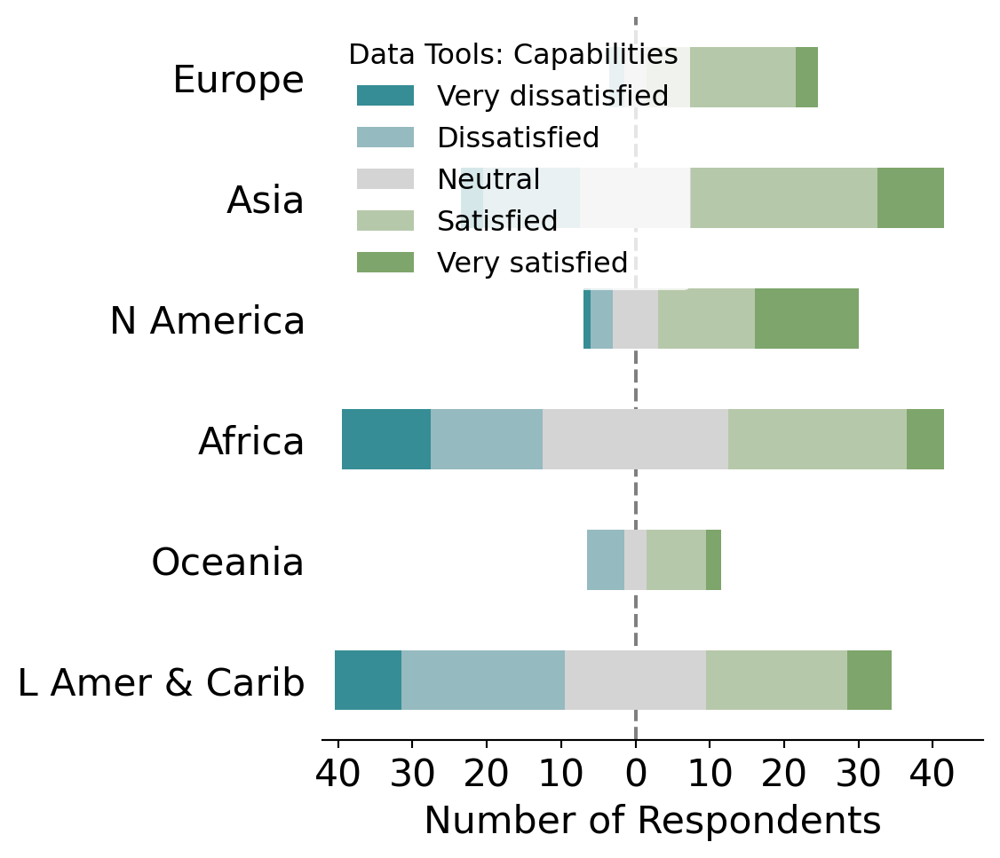

In [216]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y5')

### Q30d: Data tools ease of use

In [217]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

ease = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    ease[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_ease') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = ease[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [218]:
## Calculate statistics

for region in region_list:
    percent_data = (ease[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = ease[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    11.0   4.0    NaN   
2 - Dissatisfied                         17.0  12.0    5.0   
3 - Neither satisfied nor dissatisfied   25.0  15.0    6.0   
4 - Satisfied                            26.0  29.0   14.0   
5 - Very satisfied                        3.0   6.0    4.0   
Total                                    82.0  66.0   29.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             11.0   
2 - Dissatisfied                                                  19.0   
3 - Neither satisfied nor dissatisfied                            21.0   
4 - Satisfied                                                     21.0   
5 - Very satisfied                                                 4.0   
Total                                                             76.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               2.0     1.0   13.41   
2 - Dissatisfied                                   12.0     3.0   20.73   
3 - Neither satisfied nor dissatisfied              5.0     5.0   30.49   
4 - Satisfied                                      11.0     8.0   31.71   
5 - Very satisfied                                  7.0     1.0    3.66   
Total                                              37.0    18.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     6.06     NaN   
2 - Dissatisfied                         18.18   17.24   
3 - Neither satisfied nor dissatisfied   22.73   20.69   
4 - Satisfied                            43.94   48.28   
5 - Very satisfied                        9.09   13.79   
Total                                   100.00  100.00   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            14.47   
2 - Dissatisfied                                                 25.00   
3 - Neither satisfied nor dissatisfied                           27.63   
4 - Satisfied                                                    27.63   
5 - Very satisfied                                                5.26   
Total                                                            99.99   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              5.41    5.56   29.0    9.42  
2 - Dissatisfied                                  32.43   16.67   68.0   22.08  
3 - Neither satisfied nor dissatisfied            13.51   27.78   77.0   25.00  
4 - Satisfied                                     29.73   44.44  109.0   35.39  
5 - Very satisfied                                18.92    5.56   25.0    8.12  
Total                                            100.00  100.01  308.0  100.00

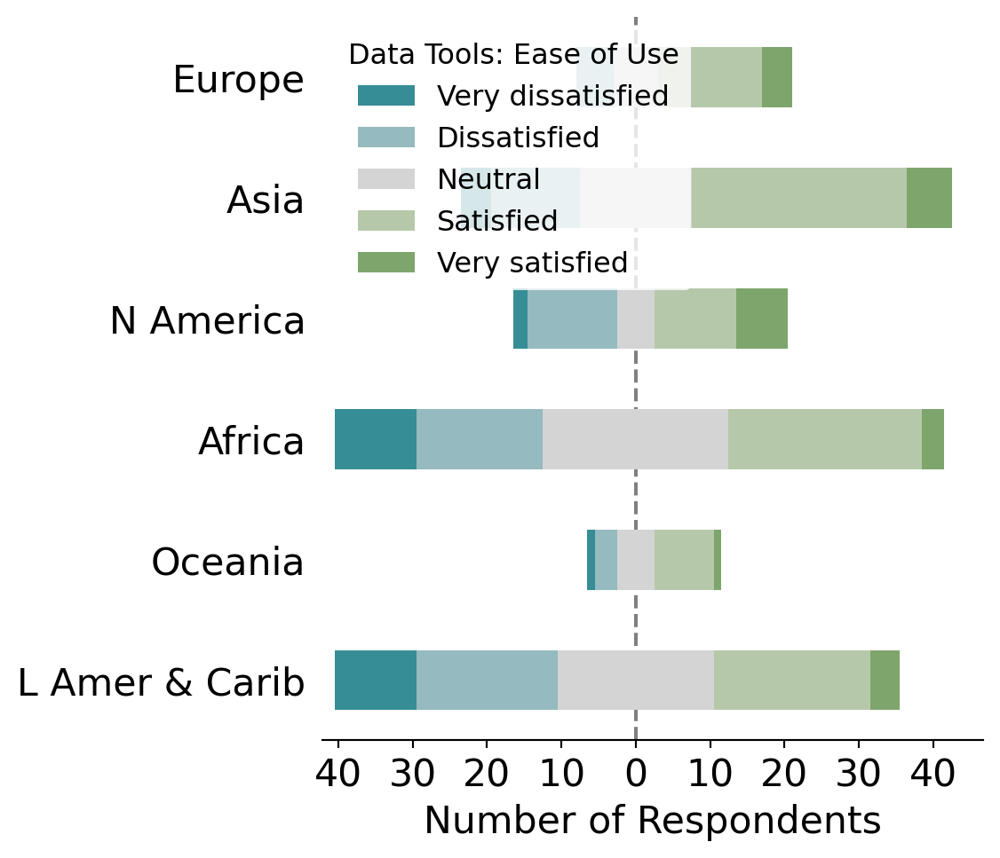

In [219]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Ease of Use',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y6')

### Q30e: Data tools bandwidth

In [220]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

bandwidth = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    bandwidth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_bandwidth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = bandwidth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [221]:
## Calculate statistics

for region in region_list:
    percent_data = (bandwidth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = bandwidth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count               \
subregion                              Africa  Asia Europe   
selection                                                    
1 - Very dissatisfied                    15.0   4.0    2.0   
2 - Dissatisfied                         15.0  14.0    5.0   
3 - Neither satisfied nor dissatisfied   23.0  13.0    4.0   
4 - Satisfied                            24.0  22.0   12.0   
5 - Very satisfied                        5.0  11.0    5.0   
Total                                    82.0  64.0   28.0   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                             18.0   
2 - Dissatisfied                                                  16.0   
3 - Neither satisfied nor dissatisfied                            19.0   
4 - Satisfied                                                     17.0   
5 - Very satisfied                                                 7.0   
Total                                                             77.0   

                                                                percent  \
subregion                              Northern America Oceania  Africa   
selection                                                                 
1 - Very dissatisfied                               1.0     4.0   18.29   
2 - Dissatisfied                                    8.0     3.0   18.29   
3 - Neither satisfied nor dissatisfied              6.0     2.0   28.05   
4 - Satisfied                                       6.0     7.0   29.27   
5 - Very satisfied                                 15.0     1.0    6.10   
Total                                              36.0    17.0  100.00   

                                                        \
subregion                                 Asia  Europe   
selection                                                
1 - Very dissatisfied                     6.25    7.14   
2 - Dissatisfied                         21.88   17.86   
3 - Neither satisfied nor dissatisfied   20.31   14.29   
4 - Satisfied                            34.38   42.86   
5 - Very satisfied                       17.19   17.86   
Total                                   100.01  100.01   

                                                                        \
subregion                              Latin America and the Caribbean   
selection                                                                
1 - Very dissatisfied                                            23.38   
2 - Dissatisfied                                                 20.78   
3 - Neither satisfied nor dissatisfied                           24.68   
4 - Satisfied                                                    22.08   
5 - Very satisfied                                                9.09   
Total                                                           100.01   

                                                                 count percent  
subregion                              Northern America Oceania  Total   Total  
selection                                                                       
1 - Very dissatisfied                              2.78   23.53   44.0   14.47  
2 - Dissatisfied                                  22.22   17.65   61.0   20.07  
3 - Neither satisfied nor dissatisfied            16.67   11.76   67.0   22.04  
4 - Satisfied                                     16.67   41.18   88.0   28.95  
5 - Very satisfied                                41.67    5.88   44.0   14.47  
Total                                            100.01  100.00  304.0  100.00

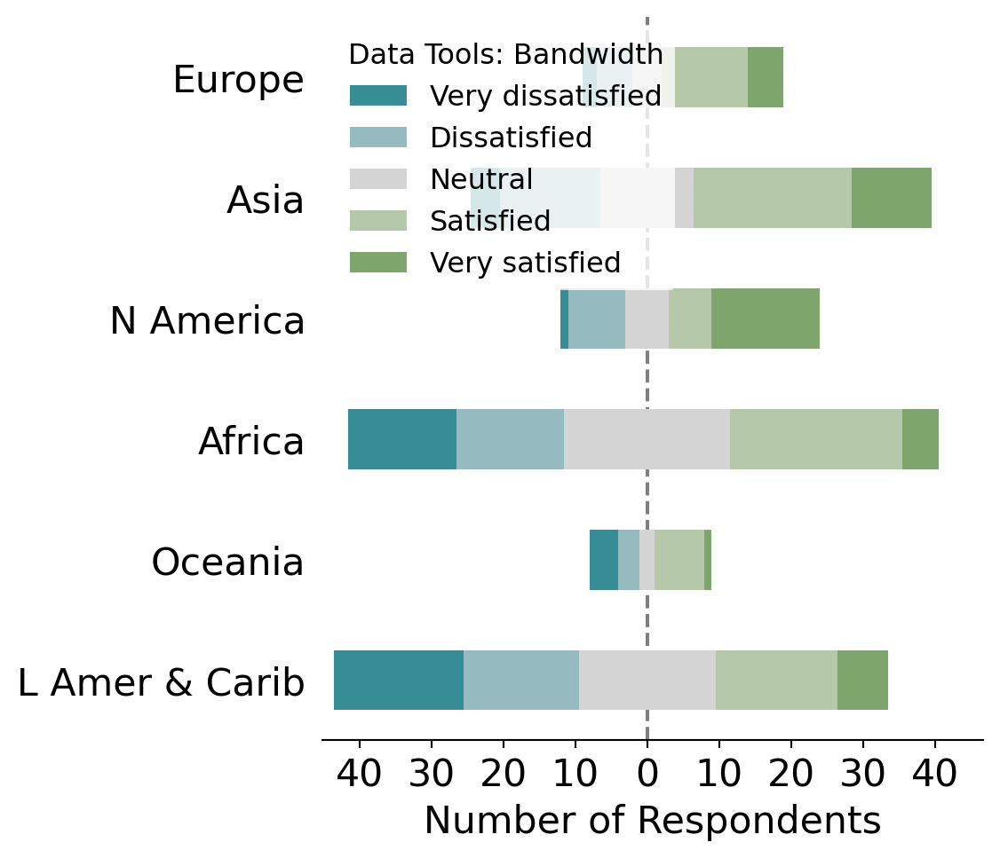

In [222]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Bandwidth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y7')

## Fig Z - Q28: Data tools importance

In [223]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q28'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [224]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion              Africa  Asia Europe Latin America and the Caribbean   
selection                                                                    
1 - Not important         3.0   1.0    1.0                             1.0   
2 - A little important    2.0   1.0    1.0                             2.0   
3 - Somewhat important    9.0   4.0    5.0                             8.0   
4 - Important             6.0  11.0   10.0                            13.0   
5 - Very important       81.0  58.0   16.0                            66.0   
Total                   101.0  75.0   33.0                            90.0   

                                                percent                \
subregion              Northern America Oceania  Africa   Asia Europe   
selection                                                               
1 - Not important                   1.0     NaN    2.97   1.33   3.03   
2 - A little important              NaN     1.0    1.98   1.33   3.03   
3 - Somewhat important              1.0     4.0    8.91   5.33  15.15   
4 - Important                       8.0     2.0    5.94  14.67  30.30   
5 - Very important                 28.0    16.0   80.20  77.33  48.48   
Total                              38.0    23.0  100.00  99.99  99.99   

                                                                         \
subregion              Latin America and the Caribbean Northern America   
selection                                                                 
1 - Not important                                 1.11             2.63   
2 - A little important                            2.22              NaN   
3 - Somewhat important                            8.89             2.63   
4 - Important                                    14.44            21.05   
5 - Very important                               73.33            73.68   
Total                                            99.99            99.99   

                                count percent  
subregion              Oceania  Total   Total  
selection                                      
1 - Not important          NaN    7.0    1.94  
2 - A little important    4.35    7.0    1.94  
3 - Somewhat important   17.39   31.0    8.61  
4 - Important             8.70   50.0   13.89  
5 - Very important       69.57  265.0   73.61  
Total                   100.01  360.0  100.00

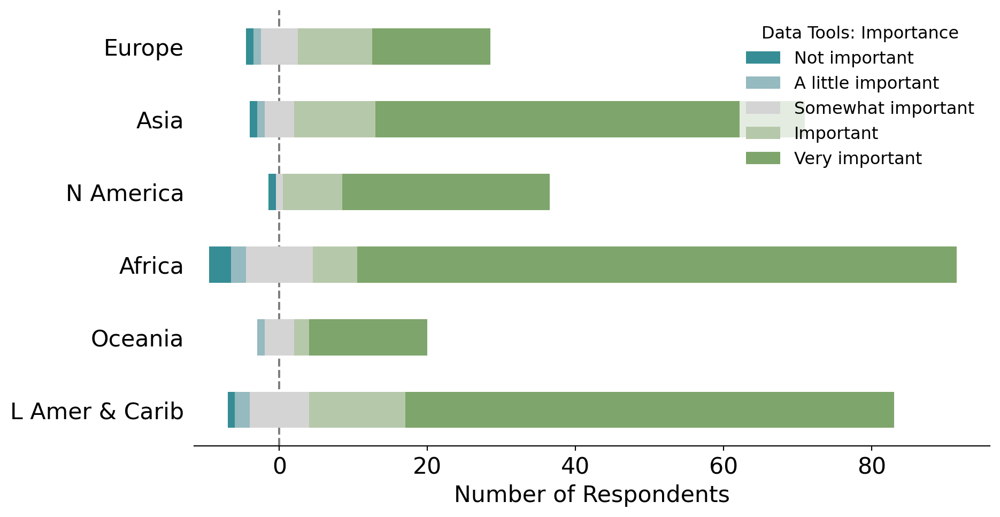

In [225]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Z1')

### Q31: Data tools potential

In [226]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q31'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [227]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                               \
subregion           Africa  Asia Europe Latin America and the Caribbean   
selection                                                                 
1 - No impact          8.0   2.0    NaN                             3.0   
2 - Little impact      NaN   2.0    1.0                             1.0   
3 - Moderate impact   11.0  16.0   16.0                            13.0   
4 - High impact       16.0  22.0    9.0                            18.0   
5 - Transformative    66.0  33.0    7.0                            55.0   
Total                101.0  75.0   33.0                            90.0   

                                             percent                 \
subregion           Northern America Oceania  Africa    Asia Europe   
selection                                                             
1 - No impact                    2.0     2.0    7.92    2.67    NaN   
2 - Little impact                NaN     2.0     NaN    2.67   3.03   
3 - Moderate impact              6.0     3.0   10.89   21.33  48.48   
4 - High impact                 14.0     5.0   15.84   29.33  27.27   
5 - Transformative              16.0    11.0   65.35   44.00  21.21   
Total                           38.0    23.0  100.00  100.00  99.99   

                                                                              \
subregion           Latin America and the Caribbean Northern America Oceania   
selection                                                                      
1 - No impact                                  3.33             5.26    8.70   
2 - Little impact                              1.11              NaN    8.70   
3 - Moderate impact                           14.44            15.79   13.04   
4 - High impact                               20.00            36.84   21.74   
5 - Transformative                            61.11            42.11   47.83   
Total                                         99.99           100.00  100.01   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         17.0    4.72  
2 - Little impact      6.0    1.67  
3 - Moderate impact   65.0   18.06  
4 - High impact       84.0   23.33  
5 - Transformative   188.0   52.22  
Total                360.0  100.00

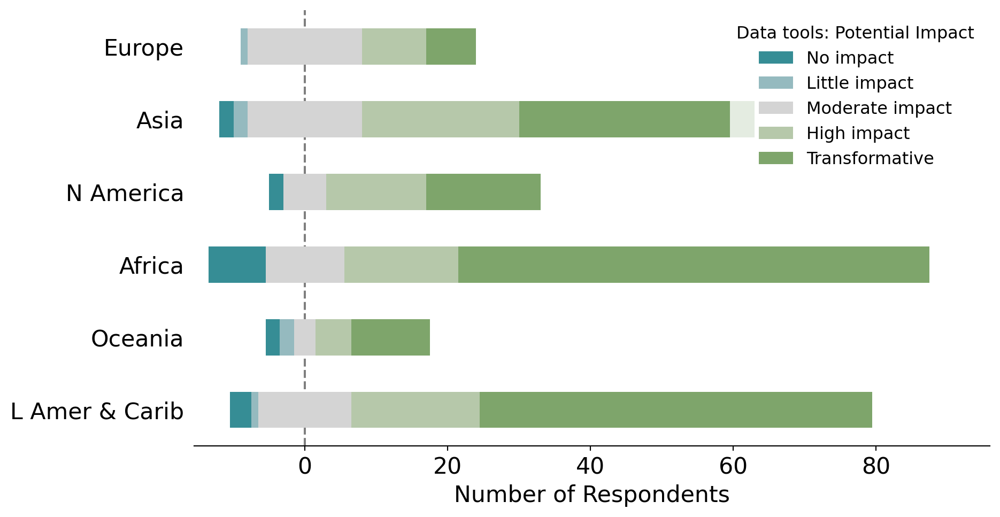

In [228]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data tools: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Z2')